In [1]:
pip install wordcloud

In [2]:
pip install -U gensim

Requirement already up-to-date: gensim in e:\anaconda\lib\site-packages (4.2.0)Note: you may need to restart the kernel to use updated packages.



In [3]:
#Import das Bibliotecas
import warnings
warnings.simplefilter('ignore')
import pandas as pd
import ast
import json
import nltk
import numpy as np
import gensim
import texthero as hero
from pprint import pprint
nltk.download('punkt')
nltk.download('stopwords')
import seaborn as sns
from string import punctuation
from nltk import word_tokenize
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import gensim.corpora as corpora
from nltk.corpus import stopwords
from nltk.probability import FreqDist
from sklearn.decomposition import TruncatedSVD

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Usuario\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Usuario\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### Realização da leitura do dataset atualizado, inspeção inicial

In [4]:
#Leitura do novo Dataset após tratamento inicial
#
url = 'https://raw.githubusercontent.com/leonardoemerson/Fake-Dataset/main/dataset/treated_dataset3.csv'
df = pd.read_csv(url, encoding = 'utf8', delimiter = ';', header = 0)

In [5]:
#Eliminando coluna 'Unnamed: 0'
df = df.drop("Unnamed: 0",axis=1)

In [6]:
df.shape

(5201, 16)

In [7]:
#Visualização inicial do Dataset
df.head()

,title,title_norm,message,message_norm,tokens,features,entities,type,source,url_review,message_norm_treatment,datetime,message_norm_treatment_ssw,message_norm_treatment_ssw2,features2,category
0,"Pastor Sérgio Von Helder, que chutou santa, nã...","pastor sergio von helder, que chutou santa, na...",NaN,NaN,"['pastor', 'sergio', 'von', 'helder', 'que', '...","{'len': 12, 1: {'token': 'pastor', 'lemma': 'p...",[Pastor Sérgio Von Helder],fake,boatos.org,https://www.boatos.org/religiao/pastor-sergio-...,NaN,2013-08-07T19:27:23-03:00,[],[],"{'len': 12, 1: {'token': 'pastor', 'lemma': 'p...",Religião
1,"Lulinha, filho de Lula, comprou avião Gulfstre...","lulinha, filho de lula, comprou aviao gulfstre...",NaN,NaN,"['lulinha', 'filho', 'de', 'lula', 'comprou', ...","{'len': 14, 1: {'token': 'lulinha', 'lemma': '...","[Lula, Gulfstream]",fake,boatos.org,https://www.boatos.org/politica/lulinha-aviao-...,NaN,2013-08-02T19:56:26-03:00,[],[],"{'len': 14, 1: {'token': 'lulinha', 'lemma': '...",Política
2,Lulinha não comprou Fazenda Fortaleza por 47 m...,lulinha nao comprou fazenda fortaleza por 47 m...,O Novo Mega Campeão do Brasil de enriqueciment...,o novo mega campeao do brasil de enriqueciment...,"['lulinha', 'nao', 'comprou', 'fazenda', 'fort...","{'len': 8, 1: {'token': 'lulinha', 'lemma': 'l...","[Lulinha, Fazenda]",fake,boatos.org,https://www.boatos.org/politica/lulinha-fazend...,o novo mega campeao do brasil de enriqueciment...,2013-07-29T14:13:21-03:00,"['novo', 'mega', 'campeao', 'brasil', 'enrique...","['novo', 'mega', 'campeao', 'brasil', 'enrique...","{'len': 8, 1: {'token': 'lulinha', 'lemma': 'l...",Política
3,Fanta Uva causa câncer e problema nos rins,fanta uva causa cancer e problema nos rins,ALERTA GERAL ATENÇÃO” FANTA UVA!!!! A propagan...,alerta geral atencao fanta uva!!!!a propaganda...,"['fanta', 'uva', 'causa', 'cancer', 'e', 'prob...","{'len': 8, 1: {'token': 'fanta', 'lemma': 'fan...",[Fanta Uva],fake,boatos.org,https://www.boatos.org/saude/fanta-uva-da-canc...,alerta geral atencao fanta uva!!!!a propaganda...,2013-07-22T04:44:40-03:00,"['alerta', 'geral', 'atencao', 'fanta', 'uva',...","['alerta', 'geral', 'atencao', 'fanta', 'propa...","{'len': 8, 1: {'token': 'fanta', 'lemma': 'fan...",Saúde
4,Simpsons terá episódio sobre manifestações no ...,simpsons tera episodio sobre manifestacoes no ...,NaN,NaN,"['simpsons', 'tera', 'episodio', 'sobre', 'man...","{'len': 7, 1: {'token': 'simpsons', 'lemma': '...","[Simpsons, Brasil]",fake,boatos.org,https://www.boatos.org/entretenimento/simpsons...,NaN,2013-07-08T17:37:40-03:00,[],[],"{'len': 7, 1: {'token': 'simpsons', 'lemma': '...",Entretenimento


In [8]:
#Ordenando dataset de acordo com a coluna 'datetime'
df = df.sort_values(by='datetime')

### Algoritmo para adição da coluna de categoria no dataset

In [9]:
#Importando biblioteca para fazer requisições 
#import requests

In [10]:
#!pip install bs4

In [11]:
#Importando bs4
#from bs4 import BeautifulSoup

In [12]:
#Criando coluna que vai receber as categorias das notícias
#df['category'] = pd.Series() 

In [13]:
#Resetando os índices do dataset
df = df.reset_index(drop=True)

### Análise de frequência de palavras nas notícias

#### Distribuição de frequência de palavras com o uso da função FreqDist

In [14]:
#Transformando coluna 'message_norm_treatment_ssw' em lista
for i in range(0, len(df['message_norm_treatment_ssw'])-1):
    if type(df['message_norm_treatment_ssw'][i]) != None:
        if len(str(df['message_norm_treatment_ssw'][i])) > 0:
            df['message_norm_treatment_ssw'][i] = ast.literal_eval(str(df['message_norm_treatment_ssw'][i]))
        else:
            continue
    else:
        continue

In [15]:
#Contagem de palavras em cada notícia tokenizada da coluna que tratou stopwords básicas
lista_palavras = []
for row in df['message_norm_treatment_ssw']:
  if row != None:
      for i in row:
        lista_palavras.append(i)
fdist = FreqDist(lista_palavras)
fdist.most_common(30)
fdist_geral_basico = fdist.most_common(15)

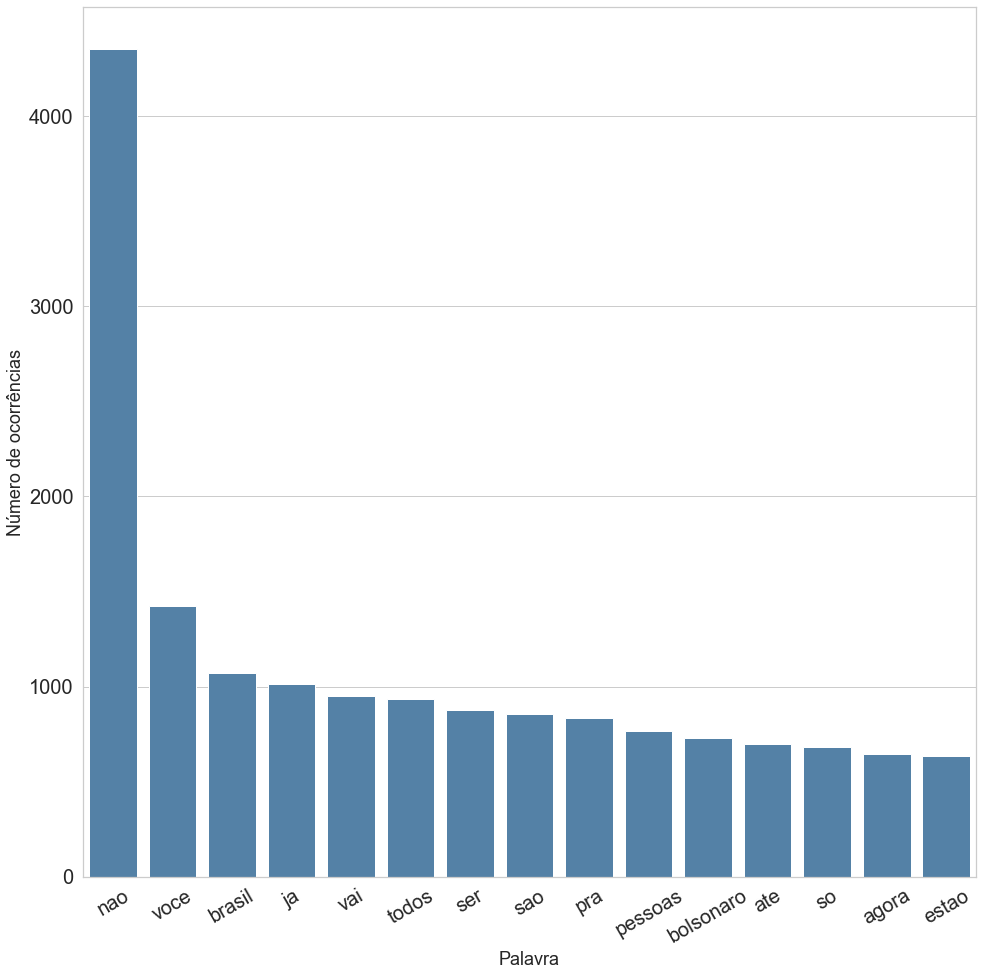

In [16]:
sns.set(style="whitegrid", font_scale=1.5)
## Conversion to Pandas series via Python Dictionary for easier plotting
all_fdist = pd.Series(dict(fdist_geral_basico))
## Setting figure, ax into variables
fig, ax = plt.subplots(figsize=(16,16))
ax.set(xlabel='Palavra', ylabel='Número de ocorrências')
ax.yaxis.set_tick_params(labelsize = 20);
ax.xaxis.set_tick_params(labelsize = 20);
## Seaborn plotting using Pandas attributes + xtick rotation for ease of viewing
all_plot = sns.barplot(x=all_fdist.index, y=all_fdist.values, ax=ax, color="steelblue")
plt.xticks(rotation=30);

# OU

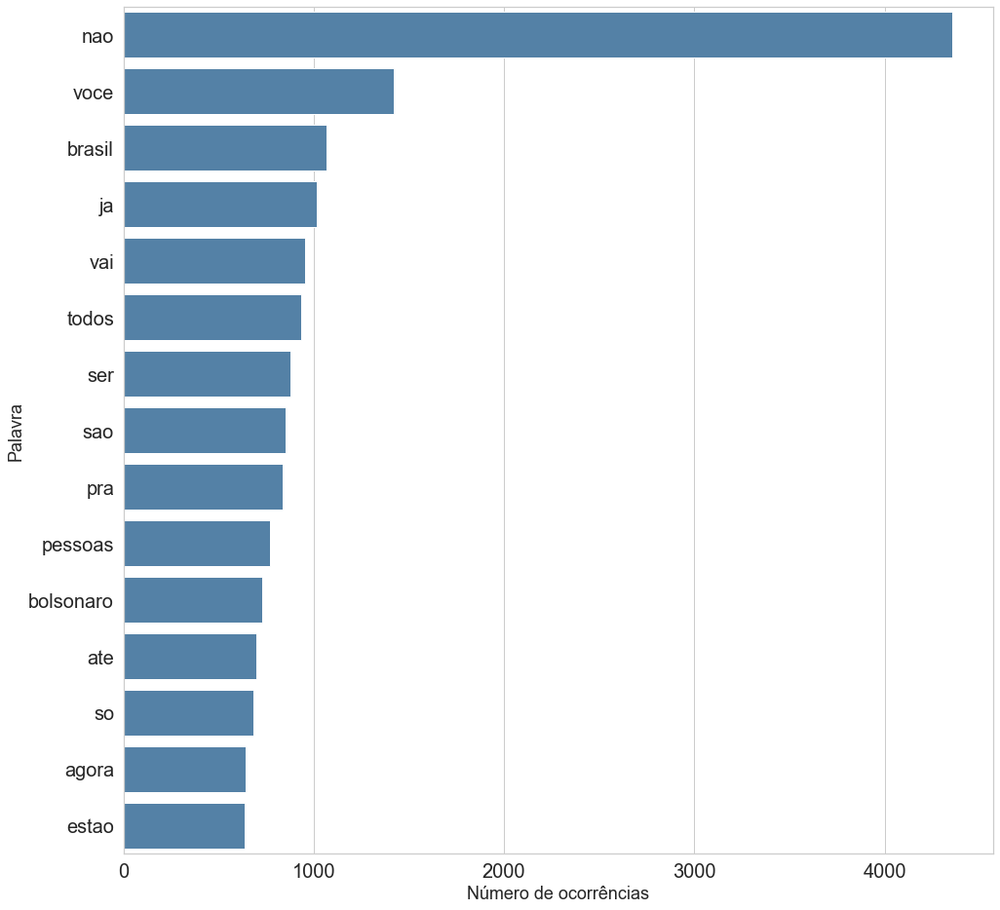

In [17]:
sns.set(style="whitegrid", font_scale=1.5)
## Conversion to Pandas series via Python Dictionary for easier plotting
all_fdist = pd.Series(dict(fdist_geral_basico))
## Setting figure, ax into variables
fig, ax = plt.subplots(figsize=(16,16))
ax.set(xlabel='Número de ocorrências', ylabel='Palavra')
ax.yaxis.set_tick_params(labelsize = 20);
ax.xaxis.set_tick_params(labelsize = 20);
## Seaborn plotting using Pandas attributes + xtick rotation for ease of viewing
all_plot = sns.barplot(x=all_fdist.values, y=all_fdist.index, orient='h', ax=ax, color="steelblue")
plt.show();

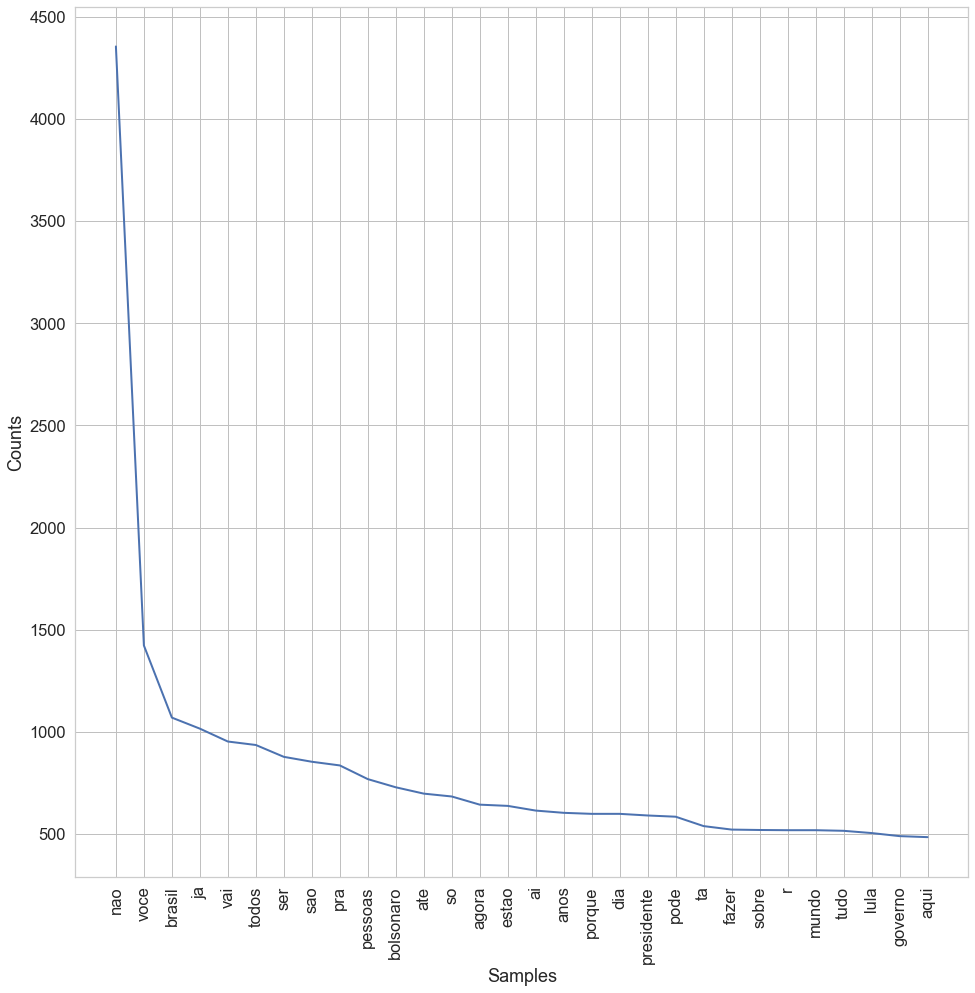

In [18]:
#Grafico de distribuicao das palavras mais frequentes após remoção de stopwords básicas
plt.figure(figsize=(16, 16))
fdist.plot(30,cumulative=False)

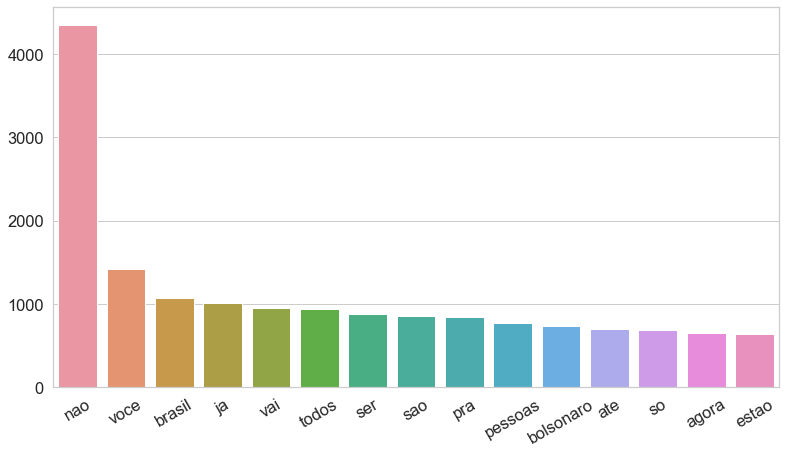

In [19]:
## Convertendo para Pandas series via Dicionário Python para um plot mais fácil
fdist_geral_basico = pd.Series(dict(fdist_geral_basico))

## Setando figura, ax nas variáveis
fig, ax = plt.subplots(figsize=(13,7))

## Plotando com Seaborn usando atributos Pandas + xtick rotation para mais fácil visualização
all_plot = sns.barplot(x=fdist_geral_basico.index, y=fdist_geral_basico.values, ax=ax)
plt.xticks(rotation=30);

In [20]:
#Transformando coluna 'message_norm_treatment_ssw' em lista
for i in range(0, len(df['message_norm_treatment_ssw2'])-1):
    if type(df['message_norm_treatment_ssw2'][i]) != None:
        if len(str(df['message_norm_treatment_ssw2'][i])) > 0:
            df['message_norm_treatment_ssw2'][i] = ast.literal_eval(str(df['message_norm_treatment_ssw2'][i]))
        else:
            continue
    else:
        continue

In [21]:
#Contagem de palavras em cada notícia tokenizada da coluna que tratou stopwords avançadas
lista_palavras = []
for row in df['message_norm_treatment_ssw2']:
  for i in row:
    lista_palavras.append(i)
fdist = FreqDist(lista_palavras)
fdist.most_common(30)
fdist_geral_avancado = fdist.most_common(15)

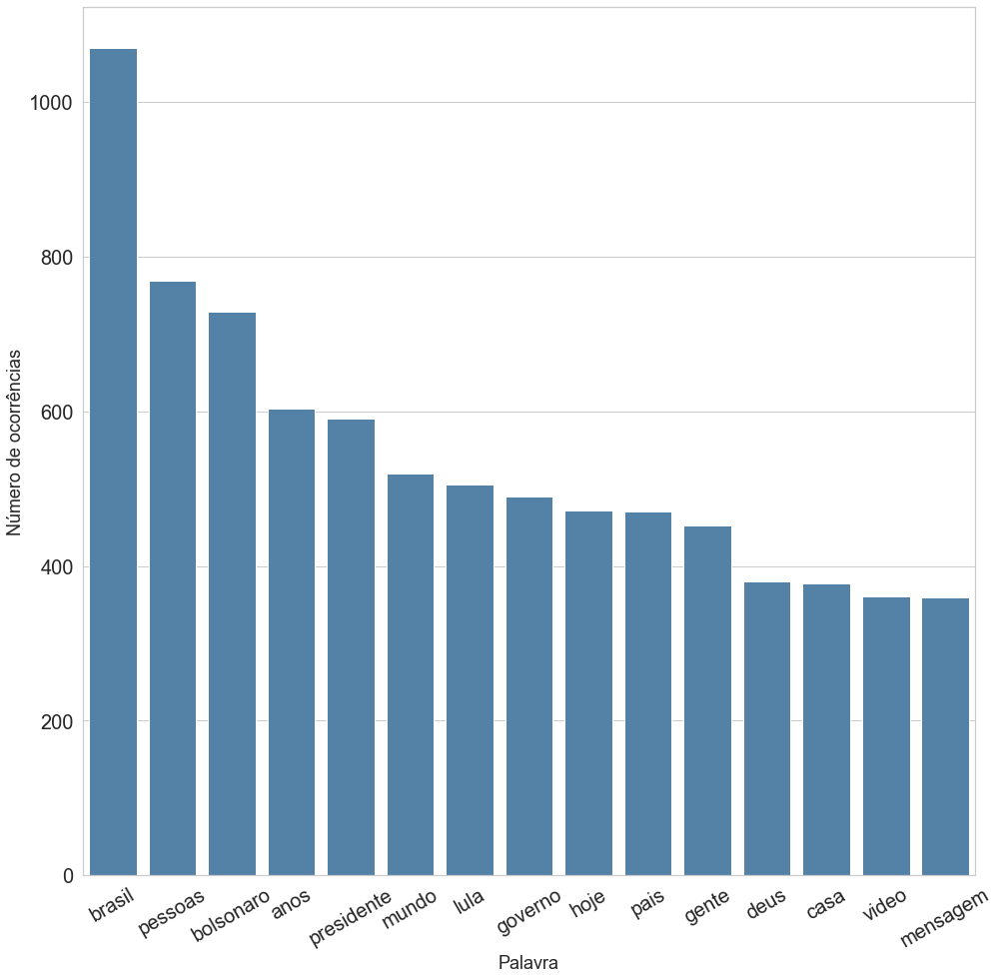

In [22]:
sns.set(style="whitegrid", font_scale=1.5)
## Conversion to Pandas series via Python Dictionary for easier plotting
all_fdist = pd.Series(dict(fdist_geral_avancado))
## Setting figure, ax into variables
fig, ax = plt.subplots(figsize=(16,16))
ax.set(xlabel='Palavra', ylabel='Número de ocorrências')
ax.yaxis.set_tick_params(labelsize = 20);
ax.xaxis.set_tick_params(labelsize = 20);
## Seaborn plotting using Pandas attributes + xtick rotation for ease of viewing
all_plot = sns.barplot(x=all_fdist.index, y=all_fdist.values, ax=ax, color="steelblue")
plt.xticks(rotation=30);

# OU

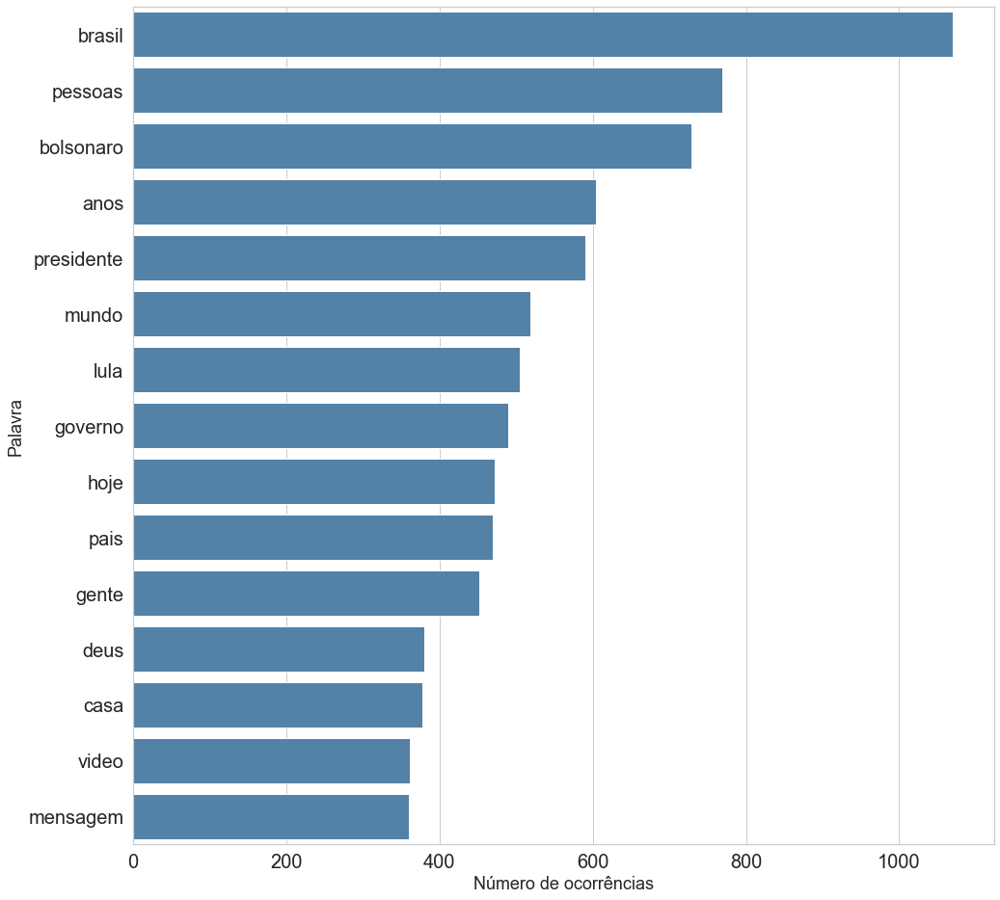

In [23]:
sns.set(style="whitegrid", font_scale=1.5)
## Conversion to Pandas series via Python Dictionary for easier plotting
all_fdist = pd.Series(dict(fdist_geral_avancado))
## Setting figure, ax into variables
fig, ax = plt.subplots(figsize=(16,16))
ax.set(xlabel='Número de ocorrências', ylabel='Palavra')
ax.yaxis.set_tick_params(labelsize = 20);
ax.xaxis.set_tick_params(labelsize = 20);
## Seaborn plotting using Pandas attributes + xtick rotation for ease of viewing
all_plot = sns.barplot(x=all_fdist.values, y=all_fdist.index, orient='h', ax=ax, color="steelblue")
plt.show();

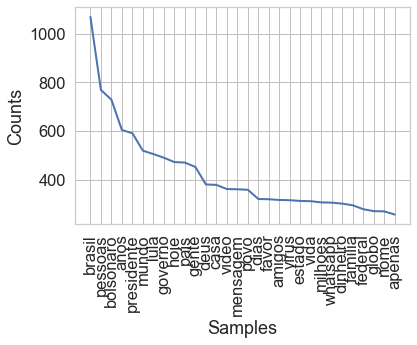

In [24]:
#Grafico de distribuicao das palavras mais frequentes após remoção de stopwords avançadas
plt.figure()
fdist.plot(30,cumulative=False)

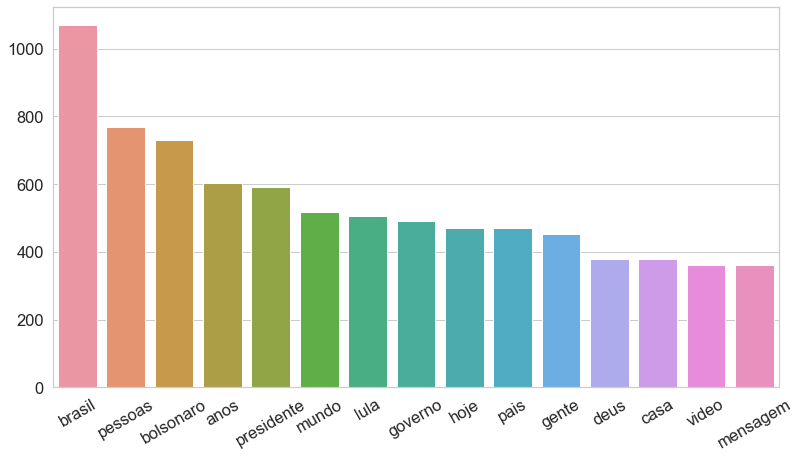

In [25]:
## Convertendo para Pandas series via Dicionário Python para um plot mais fácil
fdist_geral_avancado = pd.Series(dict(fdist_geral_avancado))

## Setando figura, ax nas variáveis
fig, ax = plt.subplots(figsize=(13,7))

## Plotando com Seaborn usando atributos Pandas + xtick rotation para mais fácil visualização
all_plot = sns.barplot(x=fdist_geral_avancado.index, y=fdist_geral_avancado.values, ax=ax)
plt.xticks(rotation=30);

#### Nuvem de palavras com a coluna 'message_norm_treatment_ssw2'

In [26]:
#lista = map(str, df['message_norm_treatment_ssw2'].values)
#lista.get(0)

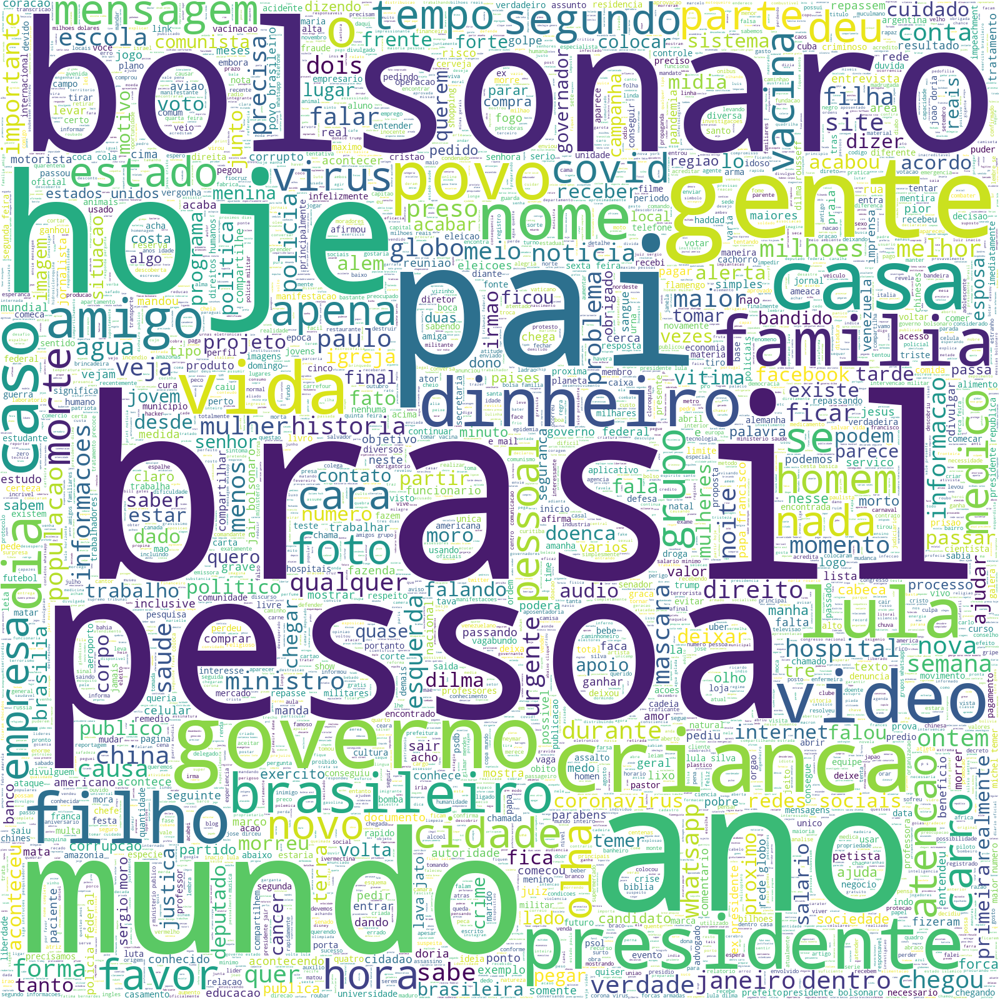

In [27]:
# Juntando as palavras de cada notícia
long_string = ','.join(map(str, df['message_norm_treatment_ssw2'].values))
#Removendo caracteres desnecessários
long_string = long_string.replace("'", '')
long_string = long_string.replace("[", '')
long_string = long_string.replace("]", '')
# Criando o objeto WordCloud
wordcloud = WordCloud(background_color="white", max_words=5000, contour_width=3, contour_color='steelblue', width=1600, height=1600)
# Geração da nuvem de palavras
wordcloud.generate(long_string)
# Visualização da nuvem de palavras
wordcloud.to_image()

# NOVO PLOT MELHORADO RESOLUÇÃO

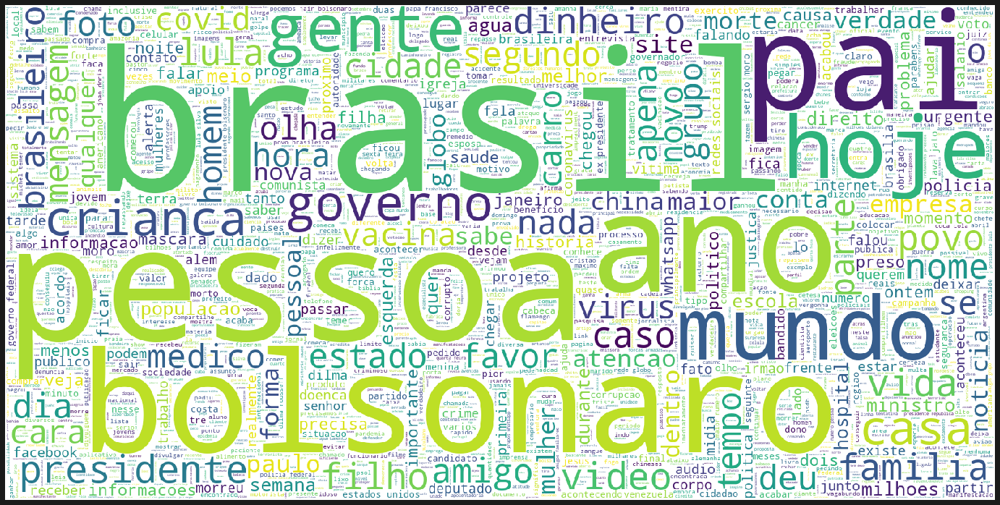

In [28]:
# Juntando as palavras de cada notícia
long_string = ','.join(map(str, df['message_norm_treatment_ssw2'].values))
#Removendo caracteres desnecessários
long_string = long_string.replace("'", '')
long_string = long_string.replace("[", '')
long_string = long_string.replace("]", '')
# Criando o objeto WordCloud e gerando nuvem de palavras
wordcloud = WordCloud(background_color="white", max_words=5000, contour_width=3, contour_color='steelblue', width=1600, height=800).generate(long_string)
# Visualização da nuvem de palavras
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=1)
plt.show()

### Análise de frequência de notícias por períodos de tempo

#### Distribuição de notícias por ano

In [29]:
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')

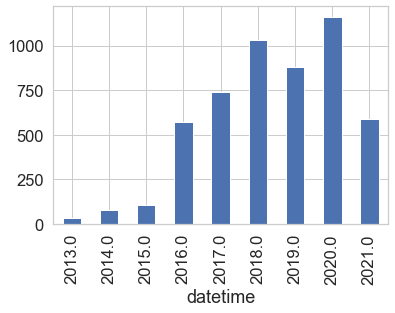

In [30]:
df['datetime'].groupby(df['datetime'].dt.year).count().plot(kind='bar')

# NOVO PLOT - SUBSTITUI O GRÁFICO ACIMA

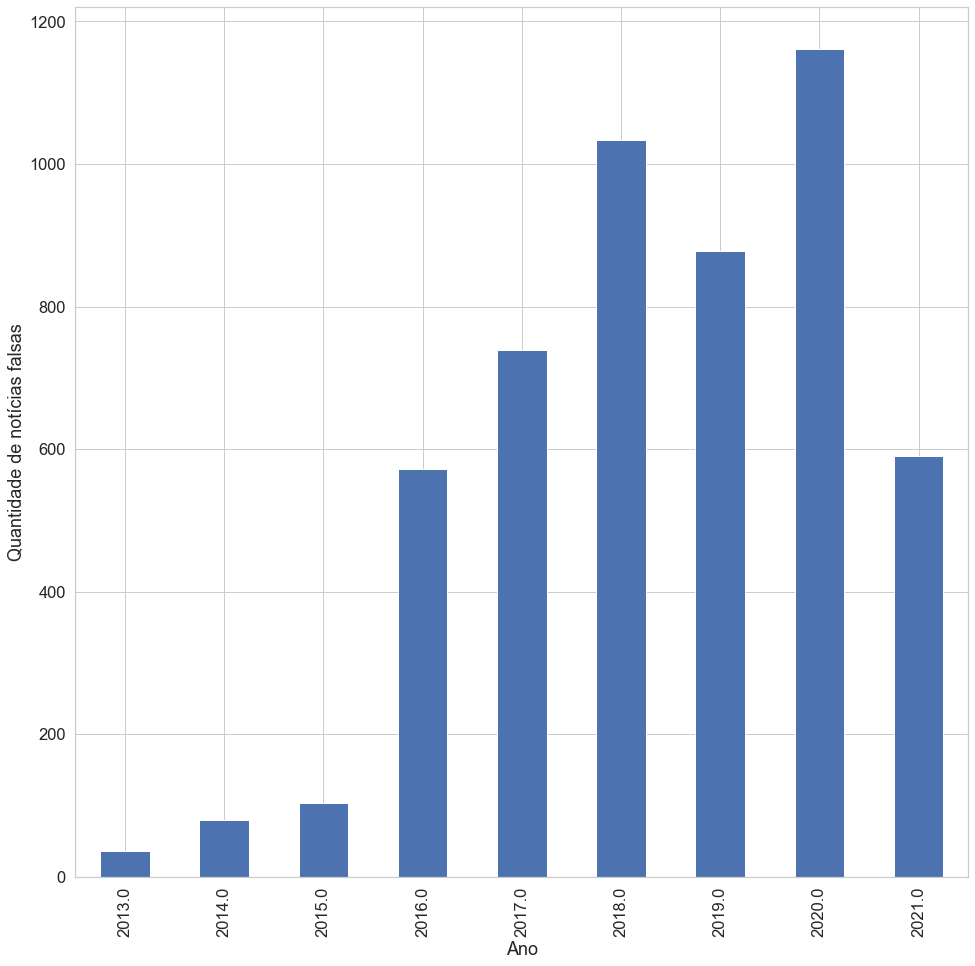

In [31]:
df['datetime'].groupby(df['datetime'].dt.year).count().plot(kind='bar', figsize=(16,16))
plt.xlabel("Ano")
plt.ylabel("Quantidade de notícias falsas");

In [32]:
df['datetime'].groupby(df['datetime'].dt.year).count()

datetime
2013.0      36
2014.0      80
2015.0     104
2016.0     572
2017.0     739
2018.0    1034
2019.0     878
2020.0    1162
2021.0     591
Name: datetime, dtype: int64

#### Distribuição de notícias por mês

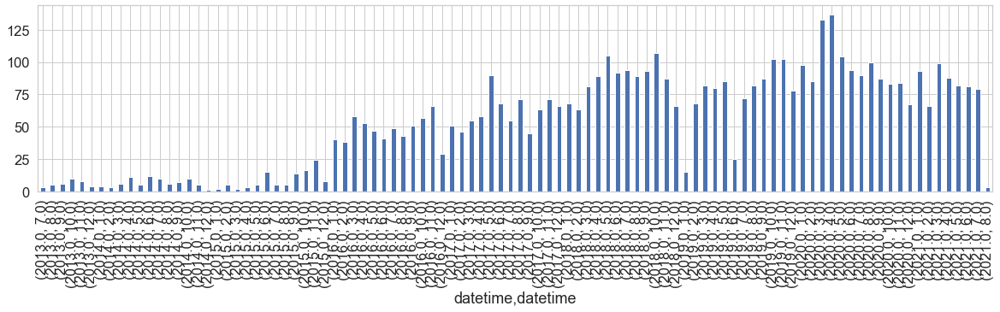

In [33]:
df['datetime'].groupby([df.datetime.dt.year, df.datetime.dt.month]).agg('count').plot(kind="bar", figsize=(20,4))

# SUBSTITUI O GRÁFICO DE CIMA

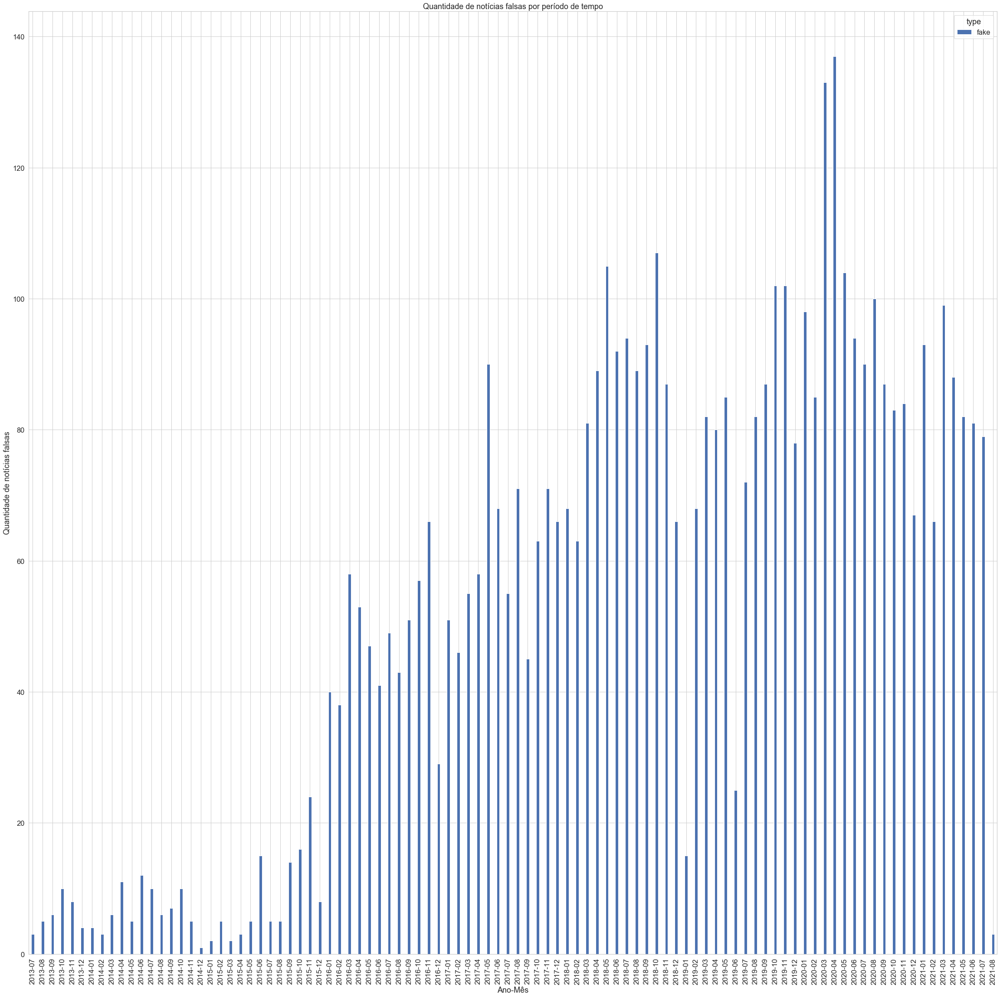

In [34]:
df_quantidade = pd.crosstab(df['datetime'].dt.to_period('m'), df['type'])
df_quantidade.plot.bar(figsize=(40,40), xlabel='Ano-Mês', ylabel='Quantidade de notícias falsas', title='Quantidade de notícias falsas por período de tempo', align='center', width=0.3)

# OU

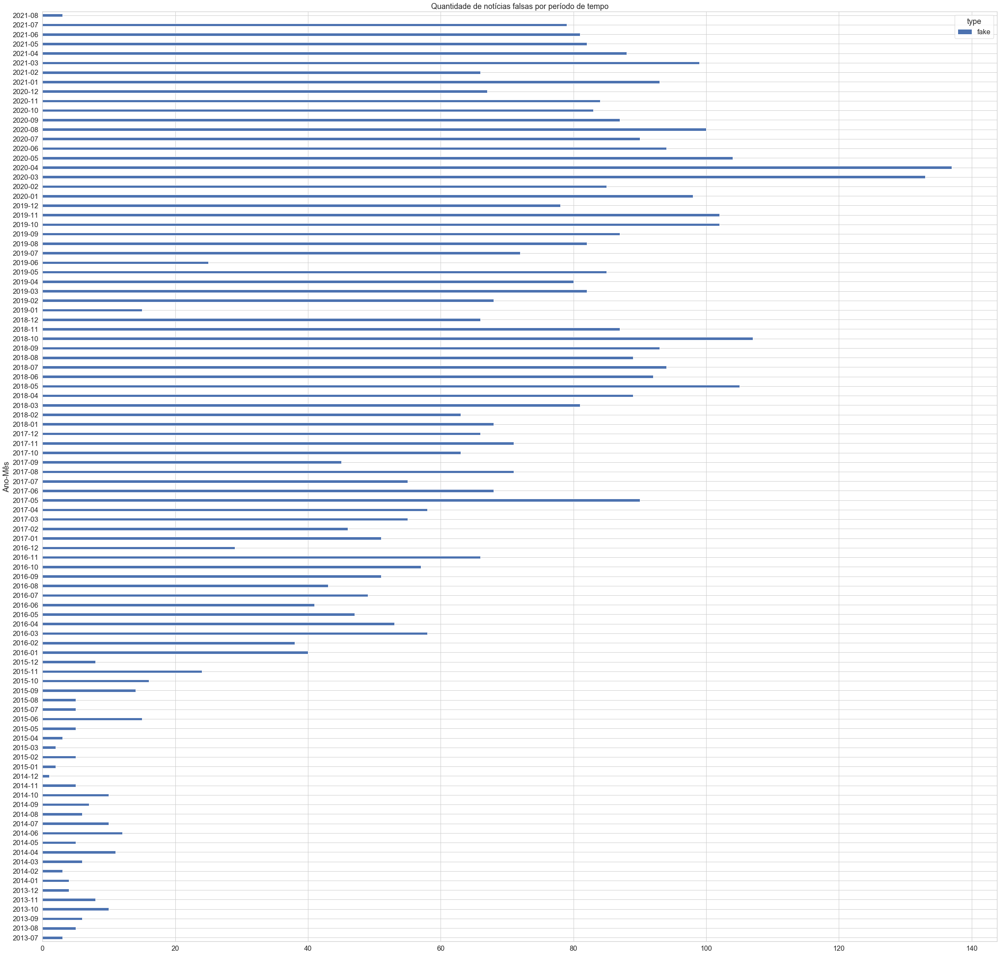

In [35]:
df_quantidade = pd.crosstab(df['datetime'].dt.to_period('m'), df['type'])
df_quantidade.plot.barh(figsize=(40,40), xlabel='Ano-Mês', ylabel='Quantidade de notícias falsas', title='Quantidade de notícias falsas por período de tempo', align='center', width=0.3)

###### É importante verificar que os anos de 2013, 2014, 2015 somados tem menor quantidade de notícias que os anos posteriores. Com isto, se torna necessário realizar a divisão do Corpus em 1 dataframe para os anos de 2013, 2014 e 2015 juntos, e dataframes individuais para os anos de 2016 em diante.

### Criando dataframes de 2013, 2014 e 2015 juntos e de 2016 em diante separados

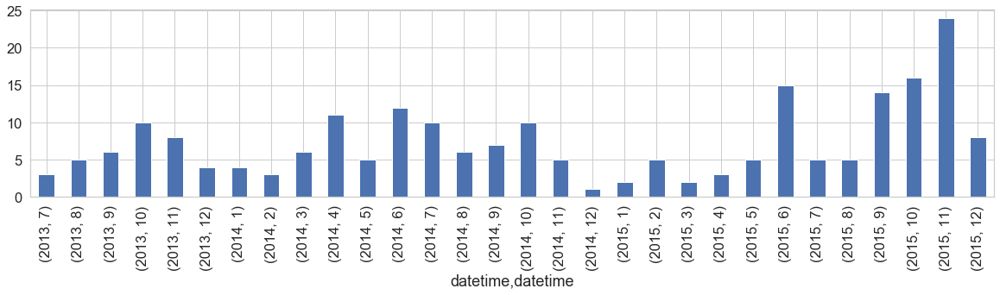

In [36]:
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df_antes_2016 = df[df["datetime"].dt.year < 2016]
df_antes_2016['datetime'].groupby([df_antes_2016.datetime.dt.year, df_antes_2016.datetime.dt.month]).agg('count').plot(kind="bar", figsize=(20,4))

# SUBSTITUI GRÁFICO ACIMA

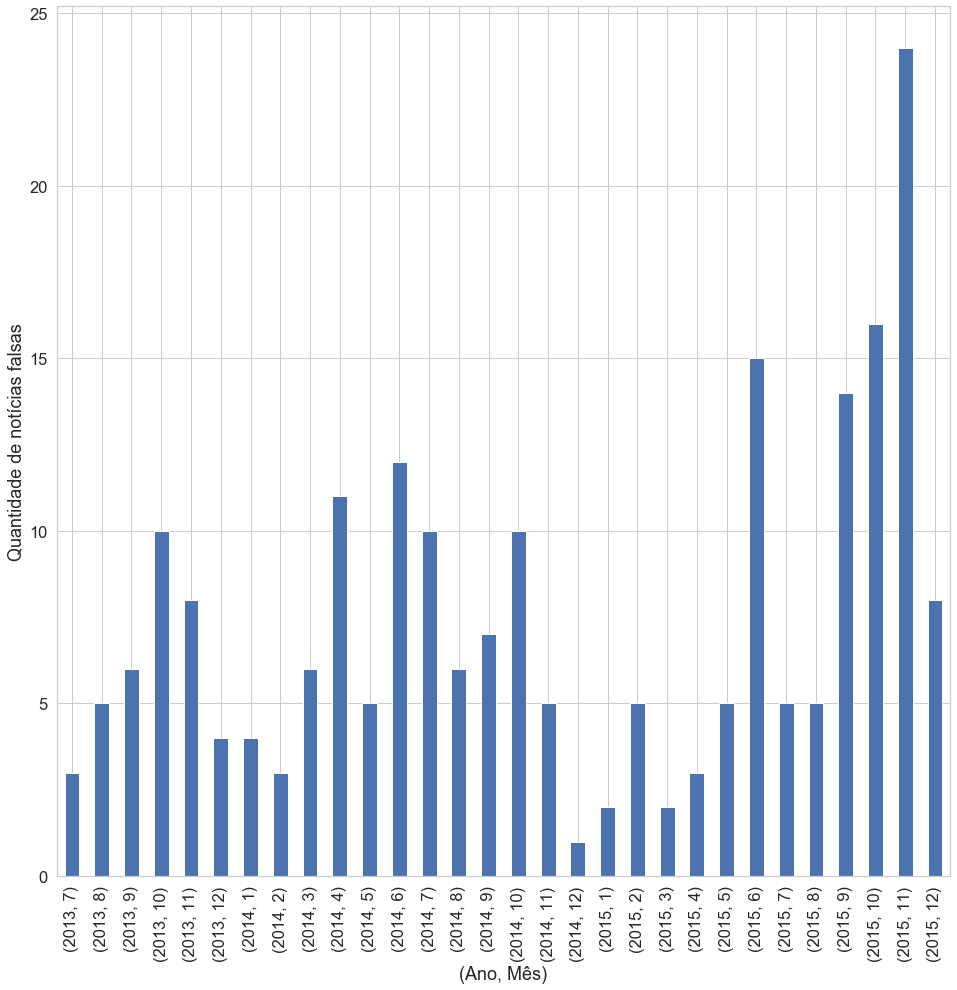

In [37]:
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df_antes_2016 = df[df["datetime"].dt.year < 2016]
df_antes_2016['datetime'].groupby([df_antes_2016.datetime.dt.year, df_antes_2016.datetime.dt.month]).agg('count').plot(kind="bar", figsize=(16,16))
plt.xlabel("(Ano, Mês)")
plt.ylabel("Quantidade de notícias falsas");

In [38]:
df_antes_2016[df_antes_2016['datetime'].dt.year == 2015]

,title,title_norm,message,message_norm,tokens,features,entities,type,source,url_review,message_norm_treatment,datetime,message_norm_treatment_ssw,message_norm_treatment_ssw2,features2,category
116,Jacaré do É o Tchan morre em acidente de carro,jacare do e o tchan morre em acidente de carro,Morre aos 43 anos o ator e dançarino Edson Gom...,morre aos 43 anos o ator e dancarino edson gom...,"['jacare', 'do', 'e', 'o', 'tchan', 'morre', '...","{'len': 10, 1: {'token': 'jacare', 'lemma': 'j...","[Jacaré, Tchan]",fake,boatos.org,https://www.boatos.org/entretenimento/jacare-m...,morre aos 43 anos o ator e dancarino edson gom...,2015-01-16 11:33:08-03:00,"[morre, 43, anos, ator, dancarino, edson, gome...","[morre, anos, ator, dancarino, edson, gomes, c...","{'len': 10, 1: {'token': 'jacare', 'lemma': 'j...",Entretenimento
117,"Novas regras do Detran já estão valendo, diz m...","novas regras do detran ja estao valendo, diz m...",“A carteira só pode ser renovada durante o pra...,a carteira so pode ser renovada durante o praz...,"['novas', 'regras', 'do', 'detran', 'ja', 'est...","{'len': 11, 1: {'token': 'novas', 'lemma': 'no...",[Detran],fake,boatos.org,https://www.boatos.org/brasil/novas-regras-det...,a carteira so pode ser renovada durante o praz...,2015-01-24 15:56:10-03:00,"[carteira, so, pode, ser, renovada, durante, p...","[carteira, renovada, durante, prazo, maximo, d...","{'len': 11, 1: {'token': 'novas', 'lemma': 'no...",Brasil
118,"Espanha privatiza o sol, diz informação errada","espanha privatiza o sol, diz informacao errada",NaN,NaN,"['espanha', 'privatiza', 'o', 'sol', 'diz', 'i...","{'len': 8, 1: {'token': 'espanha', 'lemma': 'e...",[Espanha],fake,boatos.org,https://www.boatos.org/mundo/espanha-privatiza...,NaN,2015-02-04 02:47:00-03:00,[],[],"{'len': 8, 1: {'token': 'espanha', 'lemma': 'e...",Mundo
119,"Inhame cura a dengue, aponta lenda urbana","inhame cura a dengue, aponta lenda urbana",Aedes aegypti . Diante de vários focos de deng...,aedes aegypti . diante de varios focos de deng...,"['inhame', 'cura', 'a', 'dengue', 'aponta', 'l...","{'len': 8, 1: {'token': 'inhame', 'lemma': 'in...",[Inhame],fake,boatos.org,https://www.boatos.org/saude/inhame-cura-dengu...,aedes aegypti . diante de varios focos de deng...,2015-02-09 01:57:59-03:00,"[aedes, aegypti, diante, varios, focos, dengue...","[aedes, aegypti, diante, varios, focos, dengue...","{'len': 8, 1: {'token': 'inhame', 'lemma': 'in...",Saúde
120,"Atlético-MG comprou a Libertadores de 2013, di...","atletico-mg comprou a libertadores de 2013, di...",Somos um movimento formado com o intuito de in...,somos um movimento formado com o intuito de in...,"['atletico', 'mg', 'comprou', 'a', 'libertador...","{'len': 11, 1: {'token': 'atletico-mg', 'lemma...","[Atlético-MG, Libertadores]",fake,boatos.org,https://www.boatos.org/esporte/atletico-mg-com...,somos um movimento formado com o intuito de in...,2015-02-17 23:23:09-03:00,"[movimento, formado, intuito, investigar, acab...","[movimento, formado, intuito, investigar, acab...","{'len': 11, 1: {'token': 'atletico-mg', 'lemma...",Esporte
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215,Estudante presa em protesto é a militante Cami...,estudante presa em protesto e a militante cami...,‘A verdade sobre a “POBRE ESTUDANTE” “PRESA” o...,a verdade sobre a pobre estudante presa ontem....,"['estudante', 'presa', 'em', 'protesto', 'e', ...","{'len': 13, 1: {'token': 'estudante', 'lemma':...",[Camila Lanes],fake,boatos.org,https://www.boatos.org/politica/estudante-pres...,a verdade sobre a pobre estudante presa ontem....,2015-12-05 01:27:50-03:00,"[verdade, sobre, pobre, estudante, presa, onte...","[verdade, pobre, estudante, presa, ontem, estu...","{'len': 13, 1: {'token': 'estudante', 'lemma':...",Política
216,"MST matou vacas prenhas na Fazenda Cedro, em M...","mst matou vacas prenhas na fazenda cedro, em m...",Boa noite pessoal essas fotos foram tiradas na...,boa noite pessoal essas fotos foram tiradas na...,"

#### Total de notícias 2013, 2014, 2015

In [39]:
df_antes_2016['datetime'].agg("count")

220

#### -Média mensal do triênio

In [40]:
df_antes_2016['datetime'].groupby([df_antes_2016.datetime.dt.year, df_antes_2016.datetime.dt.month]).agg('count').agg('mean')

7.333333333333333

#### -Menor número de notícias

In [41]:
df_antes_2016['datetime'].groupby([df_antes_2016.datetime.dt.year, df_antes_2016.datetime.dt.month]).agg('count').agg('min')

1

#### -Maior número de notícias

In [42]:
df_antes_2016['datetime'].groupby([df_antes_2016.datetime.dt.year, df_antes_2016.datetime.dt.month]).agg('count').agg('max')

24

#### -Quantidade para cada mês do triênio

In [43]:
df_antes_2016['datetime'].groupby([df_antes_2016.datetime.dt.year, df_antes_2016.datetime.dt.month]).agg('count')

datetime  datetime
2013      7            3
          8            5
          9            6
          10          10
          11           8
          12           4
2014      1            4
          2            3
          3            6
          4           11
          5            5
          6           12
          7           10
          8            6
          9            7
          10          10
          11           5
          12           1
2015      1            2
          2            5
          3            2
          4            3
          5            5
          6           15
          7            5
          8            5
          9           14
          10          16
          11          24
          12           8
Name: datetime, dtype: int64

In [44]:
picos_2013=df_antes_2016.loc[(df_antes_2016['datetime'].dt.year==2013) & ((df_antes_2016['datetime'].dt.month==10) | (df_antes_2016['datetime'].dt.month==11))]

In [45]:
picos_2013[picos_2013['category']=='Saúde']

,title,title_norm,message,message_norm,tokens,features,entities,type,source,url_review,message_norm_treatment,datetime,message_norm_treatment_ssw,message_norm_treatment_ssw2,features2,category
14,Beber água antes de dormir não previne infarto...,beber agua antes de dormir nao previne infarto...,*Água Antes de Dormir**. Cerca de 90% dos ataq...,*agua antes de dormir**.cerca de 90% dos ataqu...,"['beber', 'agua', 'antes', 'de', 'dormir', 'na...","{'len': 9, 1: {'token': 'beber', 'lemma': 'beb...",[],fake,boatos.org,https://www.boatos.org/saude/beber-agua-dormir...,*agua antes de dormir**.cerca de,2013-10-03 19:42:27-03:00,"[*agua, antes, dormir**.cerca]","[*agua, dormir**.cerca]","{'len': 9, 1: {'token': 'beber', 'lemma': 'beb...",Saúde
16,Inca não precisa de doações de toucas para cri...,inca nao precisa de doacoes de toucas para cri...,NaN,NaN,"['inca', 'nao', 'precisa', 'de', 'doacoes', 'd...","{'len': 11, 1: {'token': 'inca', 'lemma': 'inc...",[Inca],fake,boatos.org,https://www.boatos.org/saude/inca-nao-precisa-...,NaN,2013-10-10 16:44:44-03:00,[],[],"{'len': 11, 1: {'token': 'inca', 'lemma': 'inc...",Saúde
23,Mito: consumir alimentos de microondas faz mal...,mito: consumir alimentos de microondas faz mal...,NaN,NaN,"['mito', 'consumir', 'alimentos', 'de', 'micro...","{'len': 10, 1: {'token': 'mito', 'lemma': 'mit...",[],fake,boatos.org,https://www.boatos.org/saude/mito-consumir-ali...,NaN,2013-10-29 03:11:30-03:00,[],[],"{'len': 10, 1: {'token': 'mito', 'lemma': 'mit...",Saúde
26,Cores dos quadrados em pasta de dente não indi...,cores dos quadrados em pasta de dente nao indi...,NaN,NaN,"['cores', 'dos', 'quadrados', 'em', 'pasta', '...","{'len': 13, 1: {'token': 'cores', 'lemma': 'co...",[],fake,boatos.org,https://www.boatos.org/saude/cores-quadrados-p...,NaN,2013-11-08 03:38:18-03:00,[],[],"{'len': 13, 1: {'token': 'cores', 'lemma': 'co...",Saúde
30,História do rato na Coca Cola é considerada fa...,historia do rato na coca cola e considerada fa...,NaN,NaN,"['historia', 'do', 'rato', 'na', 'coca', 'cola...","{'len': 11, 1: {'token': 'historia', 'lemma': ...","[Coca Cola, Justiça]",fake,boatos.org,https://www.boatos.org/saude/historia-rato-na-...,NaN,2013-11-27 03:51:10-03:00,[],[],"{'len': 11, 1: {'token': 'historia', 'lemma': ...",Saúde


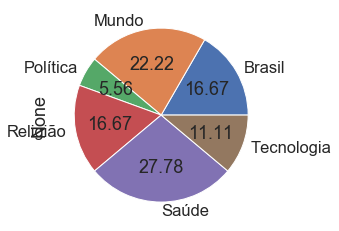

In [46]:
picos_2013.groupby('category').size().plot(kind='pie', autopct='%.2f')

# SUBSTITUI GRÁFICO ACIMA

Text(0, 0.5, '')

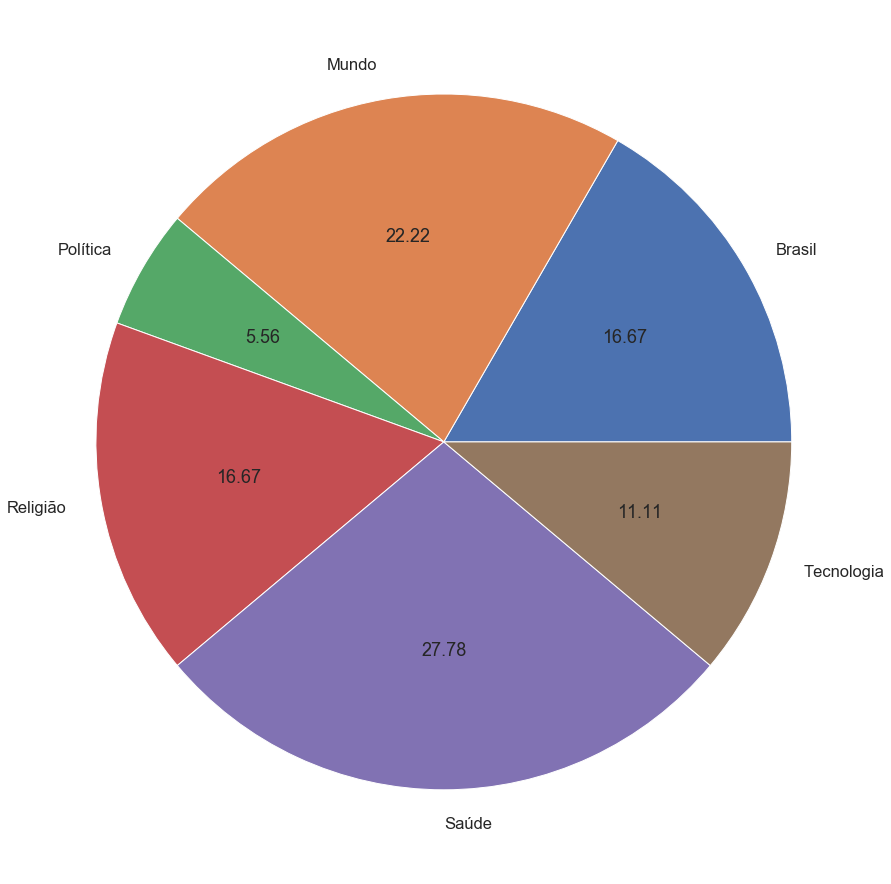

In [47]:
picos_2013.groupby('category').size().plot(kind='pie', autopct='%.2f', figsize=(16,16))
plt.ylabel("")

In [48]:
picos_2014 = df_antes_2016.loc[(df_antes_2016['datetime'].dt.year==2014) & ((df_antes_2016['datetime'].dt.month==4) | (df_antes_2016['datetime'].dt.month==6) | (df_antes_2016['datetime'].dt.month==7) | (df_antes_2016['datetime'].dt.month==10))]

In [49]:
picos_2014[picos_2014['category']=='Política']

,title,title_norm,message,message_norm,tokens,features,entities,type,source,url_review,message_norm_treatment,datetime,message_norm_treatment_ssw,message_norm_treatment_ssw2,features2,category
50,Pesquisa do Ipea traz informação errada sobre ...,pesquisa do ipea traz informacao errada sobre ...,NaN,NaN,"['pesquisa', 'do', 'ipea', 'traz', 'informacao...","{'len': 11, 1: {'token': 'pesquisa', 'lemma': ...",[],fake,boatos.org,https://www.boatos.org/politica/pesquisa-ipea-...,NaN,2014-04-04 19:47:32-03:00,[],[],"{'len': 11, 1: {'token': 'pesquisa', 'lemma': ...",Política
66,Capa da Veja: Joaquim Barbosa pede para popula...,capa da veja: joaquim barbosa pede para popula...,NaN,NaN,"['capa', 'da', 'veja', 'joaquim', 'barbosa', '...","{'len': 13, 1: {'token': 'capa', 'lemma': 'cap...","[Capa da Veja, Joaquim Barbosa, PT]",fake,boatos.org,https://www.boatos.org/politica/capa-falsa-da-...,NaN,2014-06-06 05:45:56-03:00,[],[],"{'len': 13, 1: {'token': 'capa', 'lemma': 'cap...",Política
70,Câmara dos Deputados aprova fim do 13º salário,camara dos deputados aprova fim do 13 salario,Aprovado o fim 13º salário pela Câmara dos Dep...,aprovado o fim 13 salario pela camara dos depu...,"['camara', 'dos', 'deputados', 'aprova', 'fim'...","{'len': 8, 1: {'token': 'camara', 'lemma': 'ca...",[Câmara dos Deputados],fake,boatos.org,https://www.boatos.org/politica/noticia-falsa-...,aprovado o fim 13 salario pela camara dos depu...,2014-06-19 14:39:24-03:00,"[aprovado, fim, 13, salario, camara, deputados...","[aprovado, salario, camara, deputados, faltand...","{'len': 8, 1: {'token': 'camara', 'lemma': 'ca...",Política
71,Ponte Rio-Niterói pode cair por ter rachadura ...,ponte rio-niteroi pode cair por ter rachadura ...,‘Assinante da TV Revolta registra rachadura en...,assinante da tv revolta registra rachadura eno...,"['ponte', 'rio', 'niteroi', 'pode', 'cair', 'p...","{'len': 8, 1: {'token': 'ponte', 'lemma': 'pon...",[Ponte Rio-Niterói],fake,boatos.org,https://www.boatos.org/politica/informacao-fal...,assinante da tv revolta registra rachadura eno...,2014-06-20 05:58:48-03:00,"[assinante, tv, revolta, registra, rachadura, ...","[assinante, revolta, registra, rachadura, enor...","{'len': 8, 1: {'token': 'ponte', 'lemma': 'pon...",Política
100,Calúnia: Jean Wyllys diz que a Bíblia é uma pi...,calunia: jean wyllys diz que a biblia e uma pi...,"A bíblia é uma piada, quem crê nela é palhaço,...","a biblia e uma piada, quem cre nela e palhaco,...","['calunia', 'jean', 'wyllys', 'diz', 'que', 'a...","{'len': 15, 1: {'token': 'calunia', 'lemma': '...","[Calúnia, Jean Wyllys, Bíblia]",fake,boatos.org,https://www.boatos.org/politica/calunia-jean-w...,"a biblia e uma piada, quem cre nela e palhaco,...",2014-10-02 02:22:32-03:00,"[biblia, piada, cre, nela, palhaco, igrejas, s...","[biblia, piada, nela, palhaco, igrejas, circos...","{'len': 15, 1: {'token': 'calunia', 'lemma': '...",Política
102,Verdades e mentiras sobre a fraude nas urnas e...,verdades e mentiras sobre a fraude nas urnas e...,*colaborou Hellen Bizerra,*colaborou hellen bizerra,"['verdades', 'e', 'mentiras', 'sobre', 'a', 'f...","{'len': 9, 1: {'token': 'verdades', 'lemma': '...",[Verdades],fake,boatos.org,https://www.boatos.org/politica/verdades-e-men...,*colaborou hellen bizerra,2014-10-04 23:53:34-03:00,"[*colaborou, hellen, bizerra]","[*colaborou, hellen, bizerra]","{'len': 9, 1: {'token': 'verdades', 'lemma': '...",Política
103,Declaração falsa: Ariano Suassuna diz que PT e...,declaracao falsa: ariano suassuna diz que pt e...,"Votei no Lula e na Dilma … Não votaria mais, t...","votei no lula e na dilma nao votaria mais, ti...","['declaracao', 'falsa', 'ariano', 'suassuna', ...","{'len': 10, 1: {'token': 'declaracao', 'lemma'...","[Ariano Suassuna, PT]",fake,boatos.org,https://www.boatos.org/politica/declaracao-fal...,"votei no lula e na dilma nao votaria mais, ti...",2014-10-10 15:10:57-03:00,"[votei, lula, dilma, nao, votaria, ceder, fato...","[votei, lula, dilma, votaria, ceder, fatos, re.

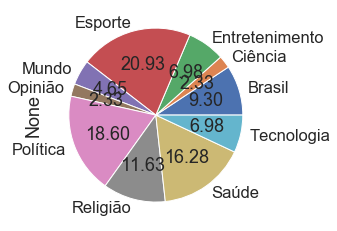

In [50]:
picos_2014.groupby('category').size().plot(kind='pie', autopct='%.2f')

# SUBSTITUI GRÁFICO ACIMA

Text(0, 0.5, '')

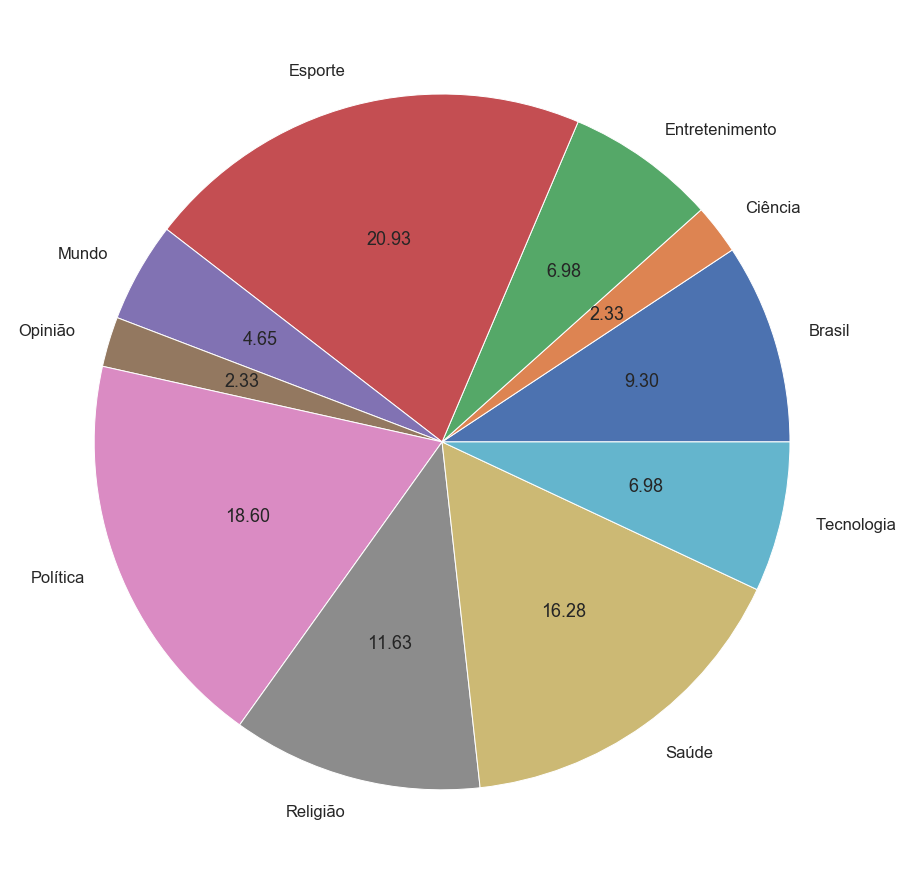

In [51]:
picos_2014.groupby('category').size().plot(kind='pie', autopct='%.2f', figsize=(16,16))
plt.ylabel("")

In [52]:
#print(df_2016[(df_2016['datetime'].dt.year==2016) & (df_2016['category']=='Política')].title.head(60))

In [53]:
picos_2015 = df_antes_2016.loc[(df_antes_2016['datetime'].dt.year==2015) & ((df_antes_2016['datetime'].dt.month==6) | (df_antes_2016['datetime'].dt.month==9) | (df_antes_2016['datetime'].dt.month==10) | (df_antes_2016['datetime'].dt.month==11))]

In [54]:
teste = df_antes_2016.loc[(df_antes_2016['datetime'].dt.year==2015) & (df_antes_2016['datetime'].dt.month==11) & (df_antes_2016.category=='Brasil')]
teste

,title,title_norm,message,message_norm,tokens,features,entities,type,source,url_review,message_norm_treatment,datetime,message_norm_treatment_ssw,message_norm_treatment_ssw2,features2,category
188,"Carrefour vende cervejas por 0,39 em protesto ...","carrefour vende cervejas por 0,39 em protesto ...",* EM PRIMEIRA MÃO *Notícia importanteDia 01/11...,* em primeira mao *noticia importantedia 01/11...,"['carrefour', 'vende', 'cervejas', 'por', '0',...","{'len': 11, 1: {'token': 'carrefour', 'lemma':...",[SQN],fake,boatos.org,https://www.boatos.org/brasil/carrefour-vende-...,* em primeira mao *noticia importantedia 01/11...,2015-11-02 23:31:15-03:00,"[primeira, mao, *noticia, importantedia, 01/11...","[primeira, *noticia, importantedia, 01/11/2015...","{'len': 11, 1: {'token': 'carrefour', 'lemma':...",Brasil
190,"Mãe joga bebê no lixo em Caucaia, cachorro ach...","mae joga bebe no lixo em caucaia, cachorro ach...","No dia de ontem no Estado do Ceará, precisamen...","no dia de ontem no estado do ceara, precisamen...","['mae', 'joga', 'bebe', 'no', 'lixo', 'em', 'c...","{'len': 14, 1: {'token': 'mae', 'lemma': 'mae'...","[Caucaia, PM]",fake,boatos.org,https://www.boatos.org/brasil/hoax-mae-joga-fi...,"no dia de ontem no estado do ceara, precisamen...",2015-11-05 01:23:48-03:00,"[dia, ontem, estado, ceara, precisamente, cida...","[ontem, estado, ceara, precisamente, cidade, c...","{'len': 14, 1: {'token': 'mae', 'lemma': 'mae'...",Brasil
191,Foto mostra criança jogando pedra em policial ...,foto mostra crianca jogando pedra em policial ...,a nossa população é tão insana que elege quem...,a nossa populacao e tao insana que elege quem...,"['foto', 'mostra', 'crianca', 'jogando', 'pedr...","{'len': 9, 1: {'token': 'foto', 'lemma': 'foto...",[Bope],fake,boatos.org,https://www.boatos.org/brasil/foto-de-crianca-...,a nossa populacao e tao insana que elege quem...,2015-11-08 23:05:07-03:00,"[populacao, tao, insana, elege, rouba, idolatr...","[populacao, insana, elege, rouba, idolatra, de...","{'len': 9, 1: {'token': 'foto', 'lemma': 'foto...",Brasil
193,"Alerta: dicas ""furadas"" de segurança podem dei...","alerta: dicas ""furadas"" de seguranca podem dei...","Certo dia, Cândido pegou o seu carro e foi ao ...","certo dia, candido pegou o seu carro e foi ao ...","['alerta', 'dicas', 'furadas', 'de', 'seguranc...","{'len': 12, 1: {'token': 'alerta', 'lemma': 'a...",[],fake,boatos.org,https://www.boatos.org/brasil/alerta-dicas-fur...,"certo dia, candido pegou o seu carro e foi ao ...",2015-11-10 14:37:55-03:00,"[certo, dia, candido, pegou, carro, posto, gas...","[certo, candido, pegou, carro, posto, gasolina...","{'len': 12, 1: {'token': 'alerta', 'lemma': 'a...",Brasil
196,"Gasolina no Brasil é a mais cara do mundo, diz...","gasolina no brasil e a mais cara do mundo, diz...","BRASIL: Gasolina deve chegar a R$ 4,60 até dez...","brasil: gasolina deve chegar a r$ 4,60 ate dez...","['gasolina', 'no', 'brasil', 'e', 'a', 'mais',...","{'len': 13, 1: {'token': 'gasolina', 'lemma': ...",[Brasil],fake,boatos.org,https://www.boatos.org/brasil/gasolina-no-bras...,"brasil: gasolina deve chegar a r$ 4,60 ate dez...",2015-11-13 17:18:17-03:00,"[brasil, gasolina, deve, chegar, r, 4,60, ate,...","[brasil, gasolina, chegar, 4,60, dezembro, car...","{'len': 13, 1: {'token': 'gasolina', 'lemma': ...",Brasil
198,"Estado Islâmico ameaça o Brasil, apontam notíc...","estado islamico ameaca o brasil, apontam notic...",1 – Estado islamico ameaça o Brasil e diz que ...,1 estado islamico ameaca o brasil e diz que o...,"['estado', 'islamico', 'ameaca', 'o', 'brasil'...","{'len': 9, 1: {'token': 'estado', 'lemma': 'es...","[Estado Islâmico, Brasil]",fake,boatos.org,https://www.boatos.org/brasil/estado-islamico-...,1 estado islamico ameaca o brasil e diz que o...,2015-11-16 18:35:22-03:00,"[1, estado, islamico, ameaca, brasil, diz, pai...","[estado, islamico, ameaca, brasil, pais, alvo,...","{'len': 9, 1: {'token': 'estado', 'lemma': 'es...",Brasil
200,Foto de criança com

In [55]:
picos_2015[picos_2015['category']=='Política']

,title,title_norm,message,message_norm,tokens,features,entities,type,source,url_review,message_norm_treatment,datetime,message_norm_treatment_ssw,message_norm_treatment_ssw2,features2,category
142,Greve geral está marcada para dia 26/06 no Brasil,greve geral esta marcada para dia 26/06 no brasil,"GREVE GERAL marcada para o dia 26/06/2015, de ...","greve geral marcada para o dia 26/06/2015, de ...","['greve', 'geral', 'esta', 'marcada', 'para', ...","{'len': 9, 1: {'token': 'greve', 'lemma': 'gre...",[Brasil],fake,boatos.org,https://www.boatos.org/politica/greve-geral-es...,"greve geral marcada para o dia 26/06/2015, de ...",2015-06-15 21:34:18-03:00,"[greve, geral, marcada, dia, 26/06/2015, 00:00...","[greve, geral, marcada, 26/06/2015, 00:00, 00:...","{'len': 9, 1: {'token': 'greve', 'lemma': 'gre...",Política
143,Jean Wyllys propõe emenda à Bíblia para retira...,jean wyllys propoe emenda a biblia para retira...,PS: esse artigo foi uma sugestão dos leitores ...,ps:esse artigo foi uma sugestao dos leitores s...,"['jean', 'wyllys', 'propoe', 'emenda', 'a', 'b...","{'len': 10, 1: {'token': 'jean', 'lemma': 'jea...","[Jean Wyllys, Bíblia]",fake,boatos.org,https://www.boatos.org/politica/jean-wyllys-pr...,NaN,2015-06-16 16:51:30-03:00,[],[],"{'len': 10, 1: {'token': 'jean', 'lemma': 'jea...",Política
158,Portugal pede para PF apreender passaporte de ...,portugal pede para pf apreender passaporte de ...,Portugal envia pedido URGENTE a PF para apreen...,portugal envia pedido urgente a pf para apreen...,"['portugal', 'pede', 'para', 'pf', 'apreender'...","{'len': 11, 1: {'token': 'portugal', 'lemma': ...","[Portugal, PF, Lula]",fake,boatos.org,https://www.boatos.org/politica/portugal-pede-...,portugal envia pedido urgente a pf para apreen...,2015-09-01 04:16:35-03:00,"[portugal, envia, pedido, urgente, pf, apreend...","[portugal, envia, pedido, urgente, apreender, ...","{'len': 11, 1: {'token': 'portugal', 'lemma': ...",Política
165,Bin Laden e Condoleezza Rice aparecem em foto ...,bin laden e condoleezza rice aparecem em foto ...,…. Ex-Secretária de estado durante a presidênc...,. ex-secretaria de estado durante a presidenci...,"['bin', 'laden', 'e', 'condoleezza', 'rice', '...","{'len': 11, 1: {'token': 'bin', 'lemma': 'bin'...","[Bin Laden, Condoleezza Rice]",fake,boatos.org,https://www.boatos.org/politica/bin-laden-e-co...,. ex-secretaria de estado durante a presidenci...,2015-09-15 21:10:53-03:00,"[ex-secretaria, estado, durante, presidencia, ...","[ex-secretaria, estado, durante, presidencia, ...","{'len': 11, 1: {'token': 'bin', 'lemma': 'bin'...",Política
171,"Filho de Lula, comprou Ilha em Angra dos Reis ...","filho de lula, comprou ilha em angra dos reis ...","Aí galera, tudo bem? Tá ruim procês? Acho que ...","ai galera, tudo bem? ta ruim proces? acho que ...","['filho', 'de', 'lula', 'comprou', 'ilha', 'em...","{'len': 13, 1: {'token': 'filho', 'lemma': 'fi...","[Lula, Ilha, Angra dos Reis, Luciano Huck]",fake,boatos.org,https://www.boatos.org/politica/filho-de-lula-...,"ai galera, tudo bem? ta ruim proces? acho que ...",2015-09-28 02:16:00-03:00,"[ai, galera, tudo, bem, ta, ruim, proces, acho...","[galera, ruim, proces, acho, pouquinho, pior, ...","{'len': 13, 1: {'token': 'filho', 'lemma': 'fi...",Política
172,Michel Temer é satanista? É pai de Daniel Mast...,michel temer e satanista? e pai de daniel mast...,NaN,NaN,"['michel', 'temer', 'e', 'satanista', 'e', 'pa...","{'len': 14, 1: {'token': 'michel', 'lemma': 'm...","[Michel Temer, Daniel Mastral]",fake,boatos.org,https://www.boatos.org/politica/michel-temer-e...,NaN,2015-10-01 00:25:05-03:00,[],[],"{'len': 14, 1: {'token': 'michel', 'lemma': 'm...",Política
181,"Lula usou helicóptero da FAB em 2015, diz info...","lula usou helicoptero da fab em 2015, diz info...",LULA NUM HELICÓPTERO DA FAB!!!!!Luiz Inacio Lu...,lula num helicoptero da fab!!!!!luiz inacio lu...,"['lula', 'usou', 'helicoptero', 'da', 'fab', '...","{'len': 11, 1: {'token': 'lula', 'lemma': 'lul...","[L

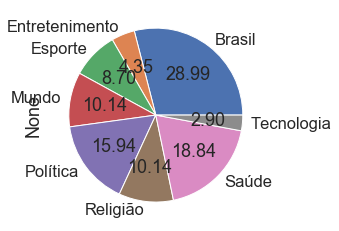

In [56]:
picos_2015.groupby('category').size().plot(kind='pie', autopct='%.2f')

# SUBSTITUI GRÁFICO ACIMA

Text(0, 0.5, '')

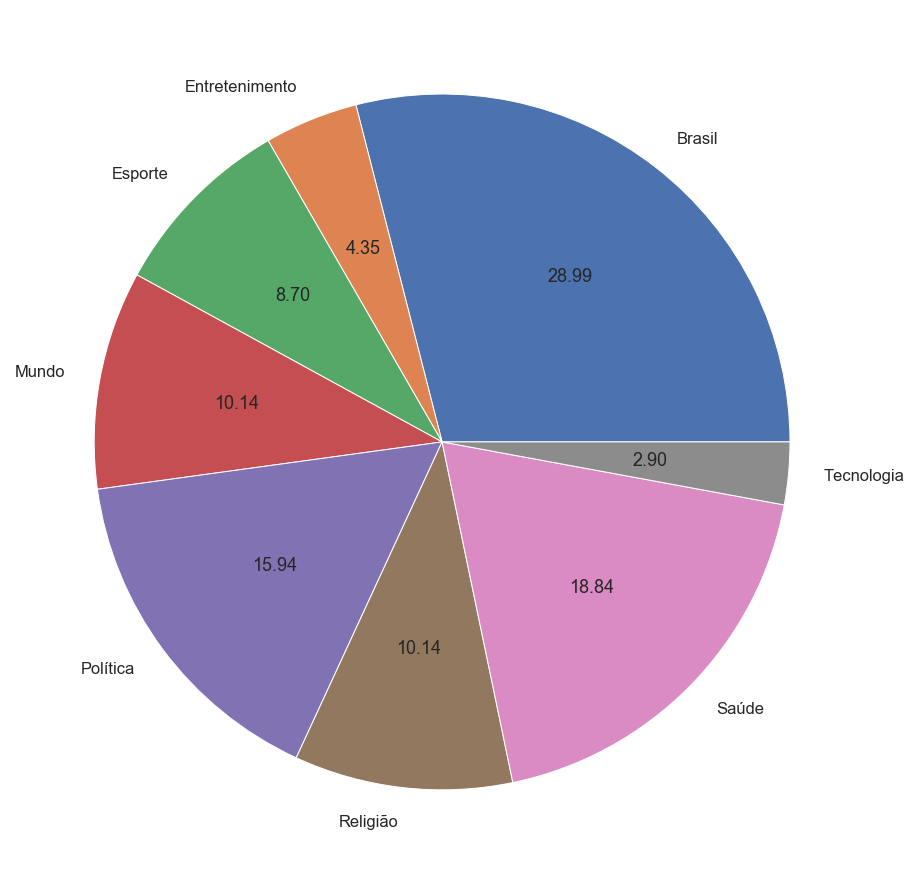

In [57]:
picos_2015.groupby('category').size().plot(kind='pie', autopct='%.2f', figsize=(16,16))
plt.ylabel("")

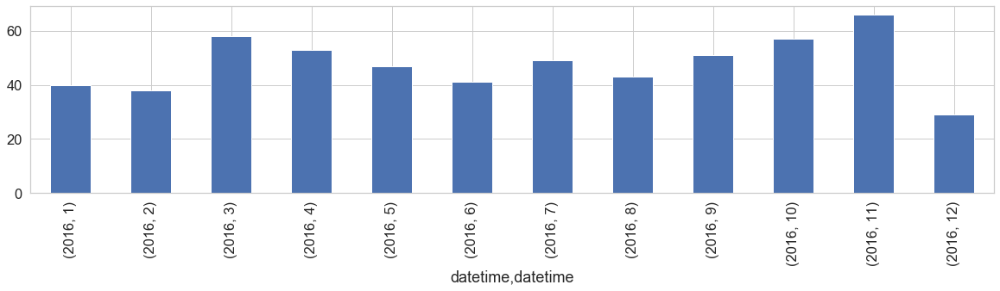

In [58]:
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df_2016 = df[df["datetime"].dt.year == 2016]
df_2016['datetime'].groupby([df_2016.datetime.dt.year, df_2016.datetime.dt.month]).agg('count').plot(kind="bar", figsize=(20,4))

# SUBSTITUI GRÁFICO ACIMA

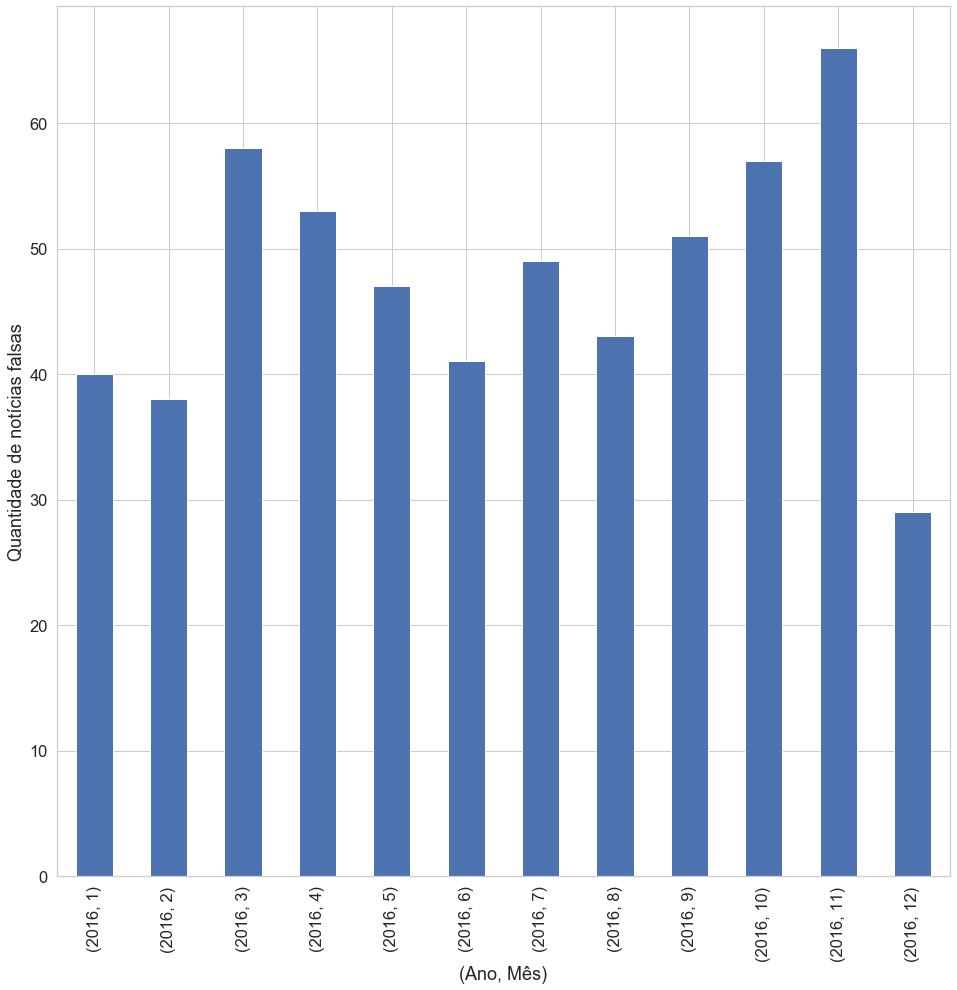

In [59]:
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df_2016 = df[df["datetime"].dt.year == 2016]
df_2016['datetime'].groupby([df_2016.datetime.dt.year, df_2016.datetime.dt.month]).agg('count').plot(kind="bar", figsize=(16,16))
plt.xlabel("(Ano, Mês)")
plt.ylabel("Quantidade de notícias falsas");

#### -Total de notícias de 2016

In [60]:
df_2016['datetime'].agg("count")

572

#### -Média de 2016

In [61]:
df_2016['datetime'].groupby([df_2016.datetime.dt.year, df_2016.datetime.dt.month]).agg('count').agg('mean')

47.666666666666664

#### -Menor número de notícias

In [62]:
df_2016['datetime'].groupby([df_2016.datetime.dt.year, df_2016.datetime.dt.month]).agg('count').agg('min')

29

#### -Maior número de notícias

In [63]:
df_2016['datetime'].groupby([df_2016.datetime.dt.year, df_2016.datetime.dt.month]).agg('count').agg('max')

66

#### -Quantidade para cada mês

In [64]:
df_2016['datetime'].groupby([df_2016.datetime.dt.year, df_2016.datetime.dt.month]).agg('count')

datetime  datetime
2016      1           40
          2           38
          3           58
          4           53
          5           47
          6           41
          7           49
          8           43
          9           51
          10          57
          11          66
          12          29
Name: datetime, dtype: int64

In [65]:
picos_2016 = df_2016.loc[(df_2016['datetime'].dt.year==2016) & ((df_2016['datetime'].dt.month==3) | (df_2016['datetime'].dt.month==4) | (df_2016['datetime'].dt.month==7) | (df_2016['datetime'].dt.month==9) | (df_2016['datetime'].dt.month==10)| (df_2016['datetime'].dt.month==11))]

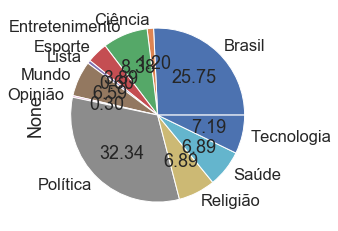

In [66]:
picos_2016.groupby('category').size().plot(kind='pie', autopct='%.2f')

# SUBSTITUI GRÁFICO ACIMA

Text(0, 0.5, '')

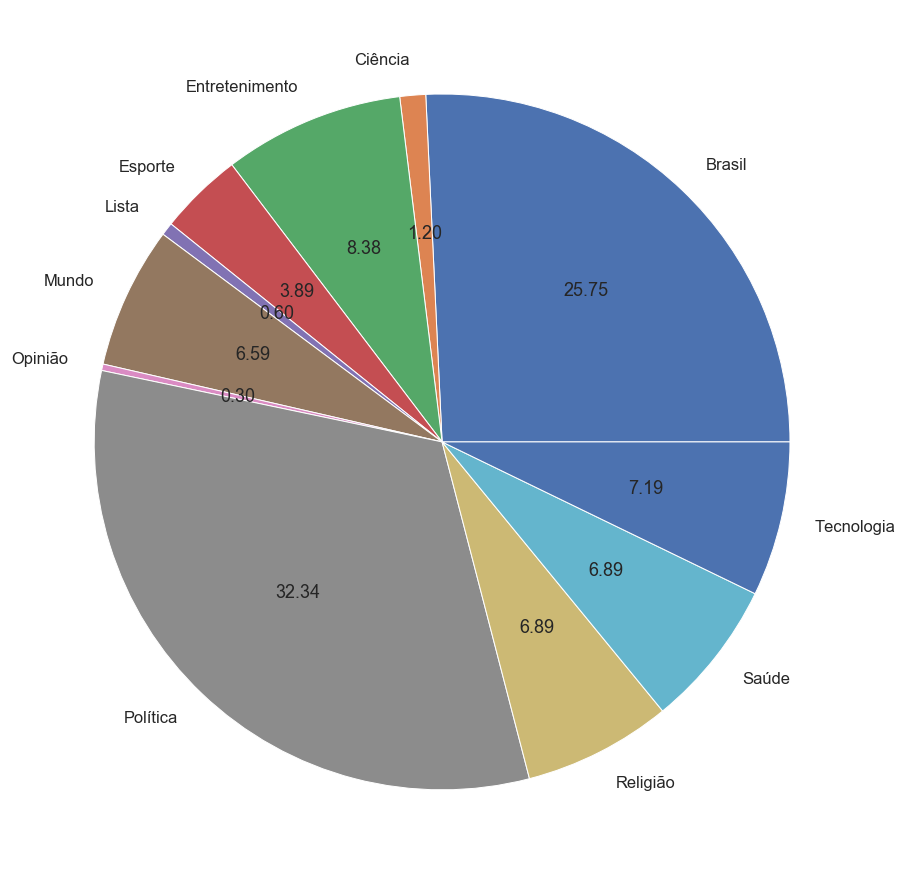

In [67]:
picos_2016.groupby('category').size().plot(kind='pie', autopct='%.2f', figsize=(16,16))
plt.ylabel("")

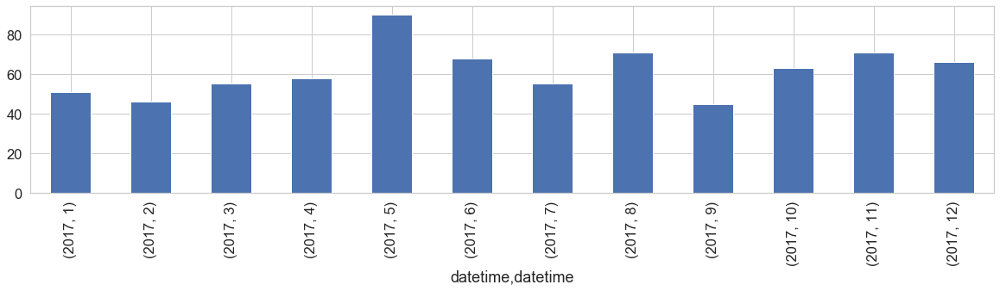

In [68]:
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df_2017 = df[df["datetime"].dt.year == 2017]
df_2017['datetime'].groupby([df_2017.datetime.dt.year, df_2017.datetime.dt.month]).agg('count').plot(kind="bar", figsize=(20,4))

# SUBSTITUI GRÁFICO ACIMA

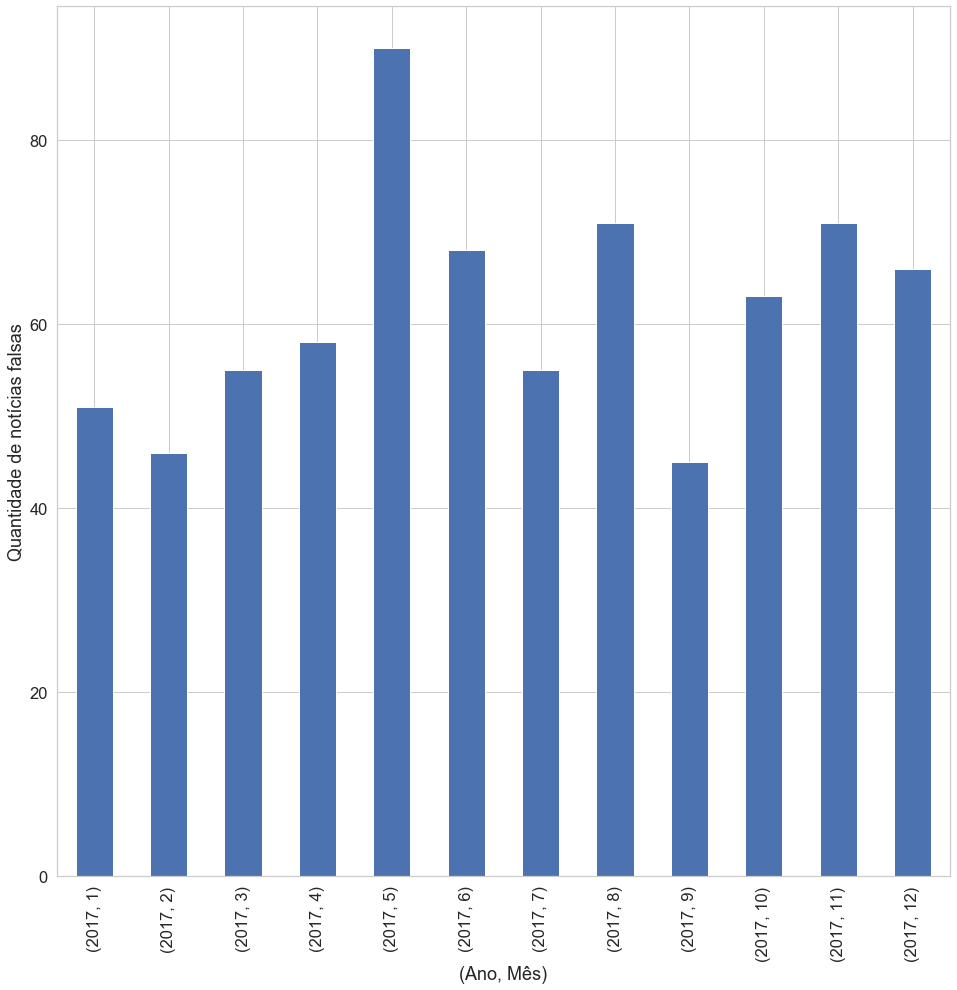

In [69]:
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df_2017 = df[df["datetime"].dt.year == 2017]
df_2017['datetime'].groupby([df_2017.datetime.dt.year, df_2017.datetime.dt.month]).agg('count').plot(kind="bar", figsize=(16,16))
plt.xlabel("(Ano, Mês)")
plt.ylabel("Quantidade de notícias falsas");

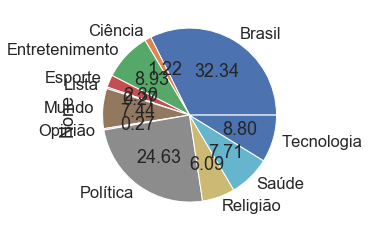

In [70]:
df_2017.groupby('category').size().plot(kind='pie', autopct='%.2f')

# SUBSTITUI GRÁFICO ACIMA

Text(0, 0.5, '')

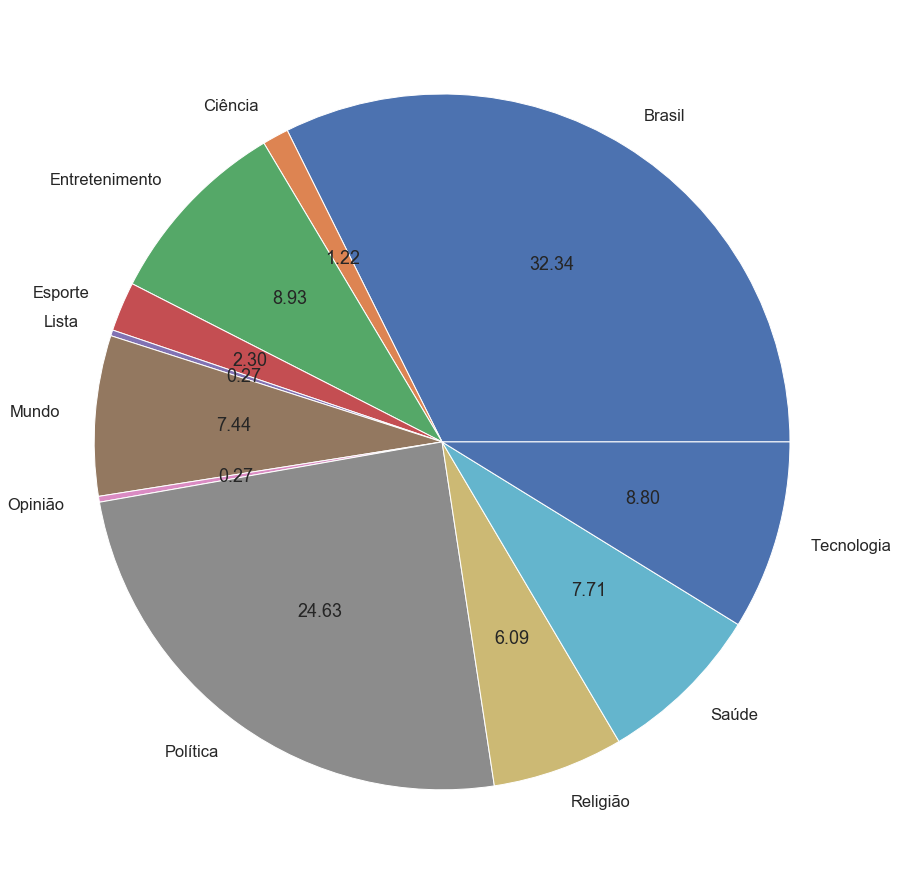

In [71]:
df_2017.groupby('category').size().plot(kind='pie', autopct='%.2f', figsize=(16,16))
plt.ylabel("")

#### Total de notícias 2017

In [72]:
df_2017['datetime'].agg("count")

739

#### -Média de 2017

In [73]:
df_2017['datetime'].groupby([df_2017.datetime.dt.year, df_2017.datetime.dt.month]).agg('count').agg('mean')

61.583333333333336

#### -Menor número de notícias

In [74]:
df_2017['datetime'].groupby([df_2017.datetime.dt.year, df_2017.datetime.dt.month]).agg('count').agg('min')

45

#### -Maior número de notícias

In [75]:
df_2017['datetime'].groupby([df_2017.datetime.dt.year, df_2017.datetime.dt.month]).agg('count').agg('max')

90

#### -Quantidade para cada mês

In [76]:
df_2017['datetime'].groupby([df_2017.datetime.dt.year, df_2017.datetime.dt.month]).agg('count')

datetime  datetime
2017      1           51
          2           46
          3           55
          4           58
          5           90
          6           68
          7           55
          8           71
          9           45
          10          63
          11          71
          12          66
Name: datetime, dtype: int64

In [77]:
picos_2017 = df_2017.loc[(df_2017['datetime'].dt.year==2017) & ((df_2017['datetime'].dt.month==5) | (df_2017['datetime'].dt.month==6) | (df_2017['datetime'].dt.month==8) | (df_2017['datetime'].dt.month==10) | (df_2017['datetime'].dt.month==11)| (df_2017['datetime'].dt.month==12))]

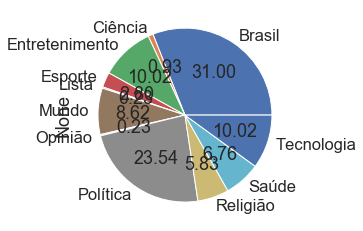

In [78]:
picos_2017.groupby('category').size().plot(kind='pie', autopct='%.2f')

# SUBSTITUI GRÁFICO ACIMA

Text(0, 0.5, '')

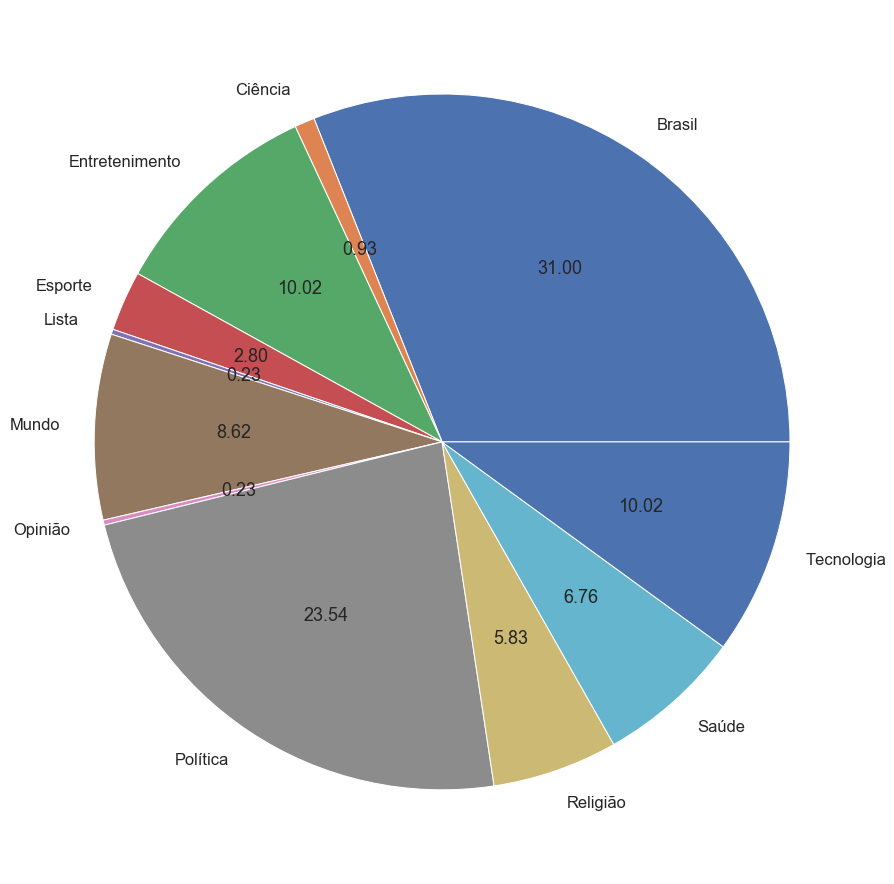

In [79]:
picos_2017.groupby('category').size().plot(kind='pie', autopct='%.2f', figsize=(16,16))
plt.ylabel("")

In [80]:
picos_2017.entities

1002                                        [APAE]
1003                                            []
1004                                    [Lula, SP]
1005    [Ponte Preta, Paulistão, CBF, Corinthians]
1006                                      [Rússia]
                           ...                    
1526                                 [Shakespeare]
1527                            [Cartão, WhatsApp]
1528                            [Carlos, Facebook]
1529        [Polícia Federal, Mega Sena da Virada]
1530                               [Thomas Beatie]
Name: entities, Length: 429, dtype: object

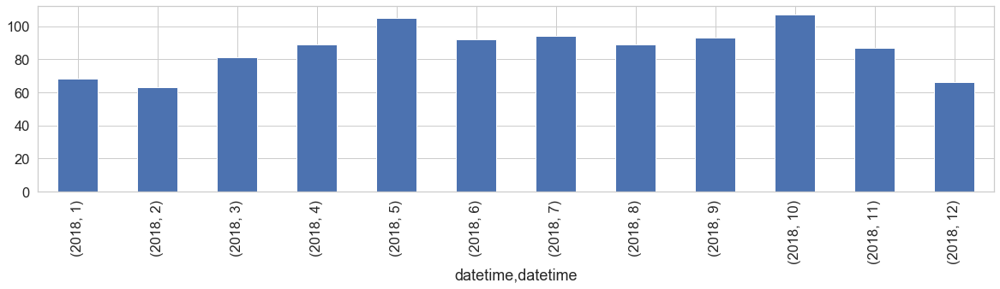

In [81]:
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df_2018 = df[df["datetime"].dt.year == 2018]
df_2018['datetime'].groupby([df_2018.datetime.dt.year, df_2018.datetime.dt.month]).agg('count').plot(kind="bar", figsize=(20,4))

# SUBSTITUI GRÁFICO ACIMA

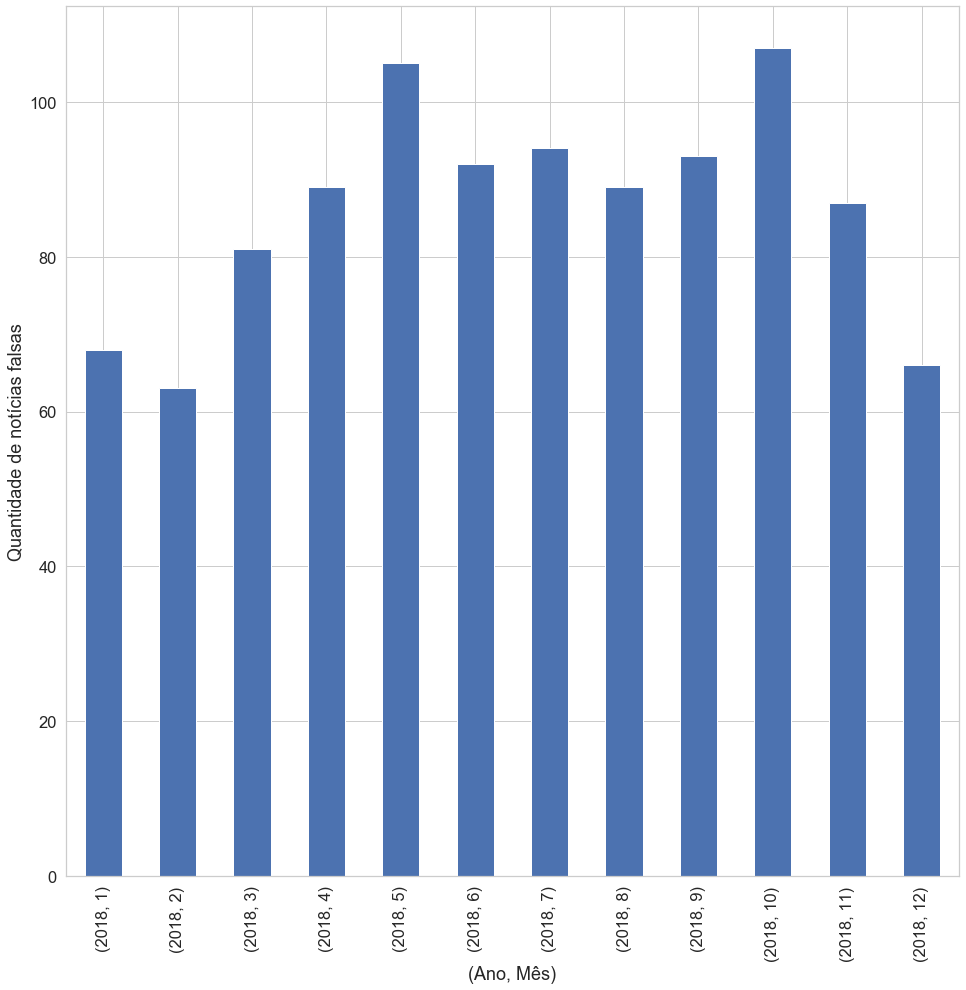

In [82]:
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df_2018 = df[df["datetime"].dt.year == 2018]
df_2018['datetime'].groupby([df_2018.datetime.dt.year, df_2018.datetime.dt.month]).agg('count').plot(kind="bar", figsize=(16,16))
plt.xlabel("(Ano, Mês)")
plt.ylabel("Quantidade de notícias falsas");

#### Total de notícias 2018

In [83]:
df_2018['datetime'].agg("count")

1034

#### -Média de 2018

In [84]:
df_2018['datetime'].groupby([df_2018.datetime.dt.year, df_2018.datetime.dt.month]).agg('count').agg('mean')

86.16666666666667

#### -Menor número de notícias

In [85]:
df_2018['datetime'].groupby([df_2018.datetime.dt.year, df_2018.datetime.dt.month]).agg('count').agg('min')

63

#### -Maior número de notícias

In [86]:
df_2018['datetime'].groupby([df_2018.datetime.dt.year, df_2018.datetime.dt.month]).agg('count').agg('max')

107

#### -Quantidade para cada mês

In [87]:
df_2018['datetime'].groupby([df_2018.datetime.dt.year, df_2018.datetime.dt.month]).agg('count')

datetime  datetime
2018      1            68
          2            63
          3            81
          4            89
          5           105
          6            92
          7            94
          8            89
          9            93
          10          107
          11           87
          12           66
Name: datetime, dtype: int64

In [88]:
picos_2018 = df_2018.loc[(df_2018['datetime'].dt.year==2018) & ((df_2018['datetime'].dt.month==4) | (df_2018['datetime'].dt.month==5) | (df_2018['datetime'].dt.month==6) | (df_2018['datetime'].dt.month==7) | (df_2018['datetime'].dt.month==8)| (df_2018['datetime'].dt.month==9)| (df_2018['datetime'].dt.month==10)| (df_2018['datetime'].dt.month==11))]

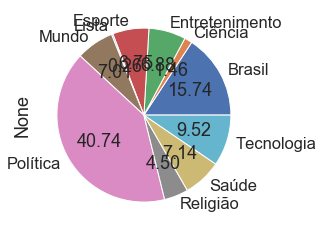

In [89]:
picos_2018.groupby('category').size().plot(kind='pie', autopct='%.2f')

# SUBSTITUI GRÁFICO ACIMA

Text(0, 0.5, '')

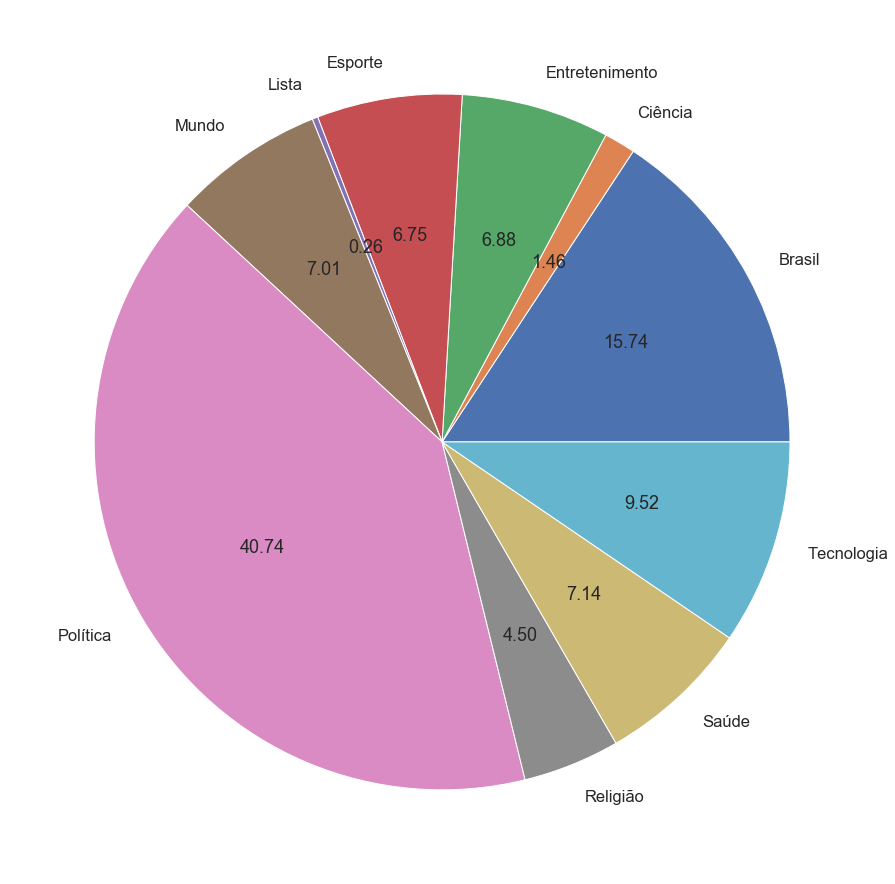

In [90]:
picos_2018.groupby('category').size().plot(kind='pie', autopct='%.2f', figsize=(16,16))
plt.ylabel("")

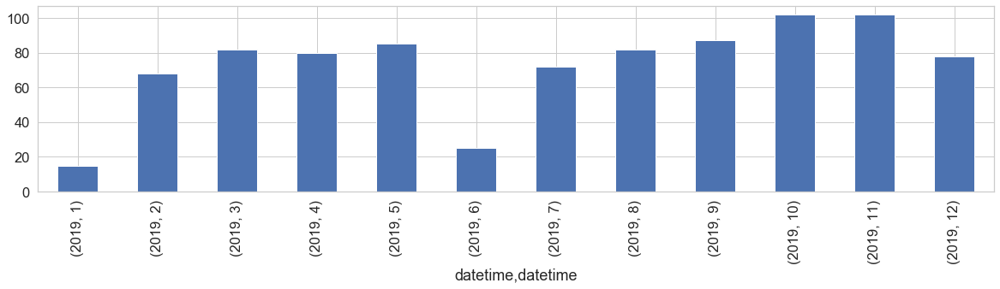

In [91]:
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df_2019 = df[df["datetime"].dt.year == 2019]
df_2019['datetime'].groupby([df_2019.datetime.dt.year, df_2019.datetime.dt.month]).agg('count').plot(kind="bar", figsize=(20,4))

# SUBSTITUI GRÁFICO ACIMA

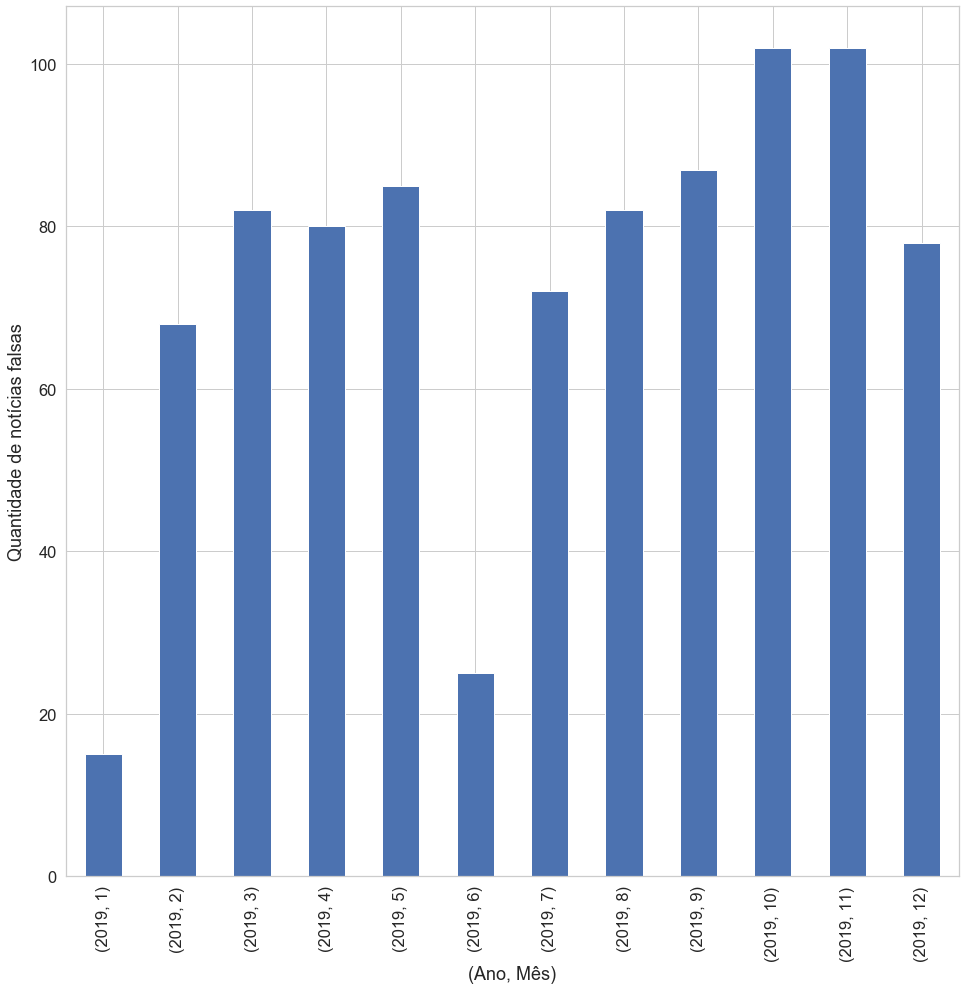

In [92]:
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df_2019 = df[df["datetime"].dt.year == 2019]
df_2019['datetime'].groupby([df_2019.datetime.dt.year, df_2019.datetime.dt.month]).agg('count').plot(kind="bar", figsize=(16,16))
plt.xlabel("(Ano, Mês)")
plt.ylabel("Quantidade de notícias falsas");

#### Total de notícias 2019

In [93]:
df_2019['datetime'].agg("count")

878

#### -Média de 2019

In [94]:
df_2019['datetime'].groupby([df_2019.datetime.dt.year, df_2019.datetime.dt.month]).agg('count').agg('mean')

73.16666666666667

#### -Menor número de notícias

In [95]:
df_2019['datetime'].groupby([df_2019.datetime.dt.year, df_2019.datetime.dt.month]).agg('count').agg('min')

15

#### -Maior número de notícias

In [96]:
df_2019['datetime'].groupby([df_2019.datetime.dt.year, df_2019.datetime.dt.month]).agg('count').agg('max')

102

#### -Quantidade para cada mês

In [97]:
df_2019['datetime'].groupby([df_2019.datetime.dt.year, df_2019.datetime.dt.month]).agg('count')

datetime  datetime
2019      1            15
          2            68
          3            82
          4            80
          5            85
          6            25
          7            72
          8            82
          9            87
          10          102
          11          102
          12           78
Name: datetime, dtype: int64

In [98]:
picos_2019 = df_2019.loc[(df_2019['datetime'].dt.year==2019) & ((df_2019['datetime'].dt.month==3) | (df_2019['datetime'].dt.month==4) | (df_2019['datetime'].dt.month==5) | (df_2019['datetime'].dt.month==8) | (df_2019['datetime'].dt.month==9)| (df_2019['datetime'].dt.month==10)| (df_2019['datetime'].dt.month==11)| (df_2019['datetime'].dt.month==12))]

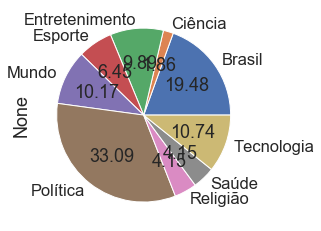

In [99]:
picos_2019.groupby('category').size().plot(kind='pie', autopct='%.2f')

# SUBSTITUI GRÁFICO ACIMA

Text(0, 0.5, '')

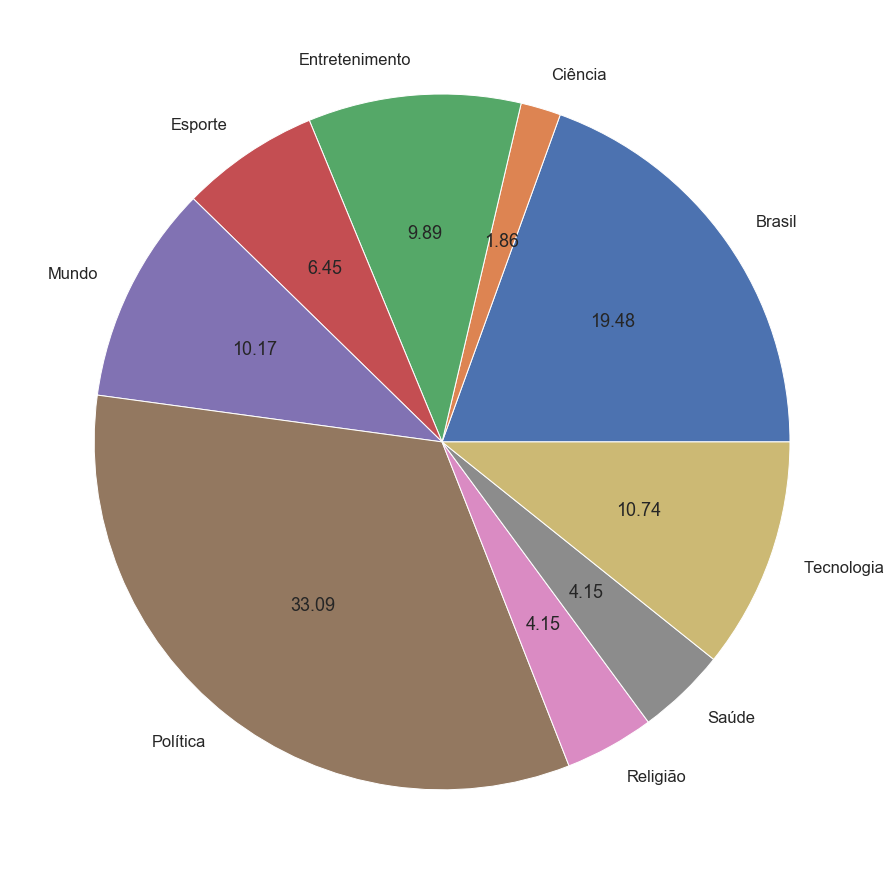

In [100]:
picos_2019.groupby('category').size().plot(kind='pie', autopct='%.2f', figsize=(16,16))
plt.ylabel("")

In [101]:
picos_2019[picos_2019['category']=='Política']

,title,title_norm,message,message_norm,tokens,features,entities,type,source,url_review,message_norm_treatment,datetime,message_norm_treatment_ssw,message_norm_treatment_ssw2,features2,category
2651,Piloto se recusa a cumprimentar Lula durante e...,piloto se recusa a cumprimentar lula durante e...,Piloto do Governo do Estado do Paraná se recus...,piloto do governo do estado do parana se recus...,"['piloto', 'se', 'recusa', 'a', 'cumprimentar'...","{'len': 10, 1: {'token': 'piloto', 'lemma': 'p...","[Piloto, Lula]",fake,boatos.org,https://www.boatos.org/politica/piloto-se-recu...,piloto do governo do estado do parana se recus...,2019-03-02 21:21:00-03:00,"[piloto, governo, estado, parana, recusa, cump...","[piloto, governo, estado, parana, recusa, cump...","{'len': 10, 1: {'token': 'piloto', 'lemma': 'p...",Política
2652,Lula proibiu aplicação de vacina contra mening...,lula proibiu aplicacao de vacina contra mening...,"Lula enquanto presidente, vetou o projeto de ...","lula enquanto presidente, vetou o projeto de ...","['lula', 'proibiu', 'aplicacao', 'de', 'vacina...","{'len': 11, 1: {'token': 'lula', 'lemma': 'lul...","[Lula, SUS]",fake,boatos.org,https://www.boatos.org/politica/lula-proibiu-a...,"lula enquanto presidente, vetou o projeto de ...",2019-03-03 10:29:47-03:00,"[lula, enquanto, presidente, vetou, projeto, l...","[lula, presidente, vetou, projeto, incluia, ci...","{'len': 11, 1: {'token': 'lula', 'lemma': 'lul...",Política
2653,Homem que fez a segurança de Lula já atacou Ma...,homem que fez a seguranca de lula ja atacou ma...,"O homem que agrediu Manu, era segurança de Bo...","o homem que agrediu manu, era seguranca de bo...","['homem', 'que', 'fez', 'a', 'seguranca', 'de'...","{'len': 13, 1: {'token': 'homem', 'lemma': 'ho...","[Lula, Manuela D’Ávila]",fake,boatos.org,https://www.boatos.org/politica/homem-seguranc...,"o homem que agrediu manu, era seguranca de bo...",2019-03-03 14:48:41-03:00,"[homem, agrediu, manu, seguranca, bolsonaro, d...","[homem, agrediu, manu, seguranca, bolsonaro, f...","{'len': 13, 1: {'token': 'homem', 'lemma': 'ho...",Política
2654,"Arthur, que morreu de meningite, não era neto ...","arthur, que morreu de meningite, nao era neto ...",EU ACHO QUE O ARTHURNÃO ERA NETO DELE .E SIM ...,eu acho queoarthurnao eranetodele.e sim so da...,"['arthur', 'que', 'morreu', 'de', 'meningite',...","{'len': 12, 1: {'token': 'arthur', 'lemma': 'a...","[Arthur, Lula]",fake,boatos.org,https://www.boatos.org/politica/arthur-nao-era...,eu acho queoarthurnao eranetodele.e sim so da...,2019-03-03 18:56:41-03:00,"[acho, queoarthurnao, eranetodele.e, sim, so, ...","[acho, queoarthurnao, eranetodele.e, damariza....","{'len': 12, 1: {'token': 'arthur', 'lemma': 'a...",Política
2655,Sérgio Moro pediu para sair do governo de Bols...,sergio moro pediu para sair do governo de bols...,"Sérgio Moro vai sair do governo, não esta con...","sergio moro vai sair do governo, nao esta con...","['sergio', 'moro', 'pediu', 'para', 'sair', 'd...","{'len': 9, 1: {'token': 'sergio', 'lemma': 'se...","[Sérgio Moro, Bolsonaro]",fake,boatos.org,https://www.boatos.org/politica/sergio-moro-pe...,"sergio moro vai sair do governo, nao esta con...",2019-03-04 12:28:19-03:00,"[sergio, moro, vai, sair, governo, nao, concor...","[sergio, moro, sair, governo, concordando, bol...","{'len': 9, 1: {'token': 'sergio', 'lemma': 'se...",Política
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3428,Comício de Lula nos Arcos da Lapa (Rio) não ti...,comicio de lula nos arcos da lapa (rio) nao ti...,Ninguem no comício do Lula na Lapa. Comparecer...,ninguem no comicio do lula na lapa. comparecer...,"['comicio', 'de', 'lula', 'nos', 'arcos', 'da'...","{'len': 16, 1: {'token': 'comicio', 'lemma': '...","[Comício de Lula, Arcos da Lapa, Rio]",fake,boatos.org,https://www.boatos.org/politica/comicio-de-lul...,ninguem no comicio do lula na lapa. comparecer...,2019-12-24 18:12:39-03:00,"[ninguem, comicio, lula, lapa, compareceram, s...","[com

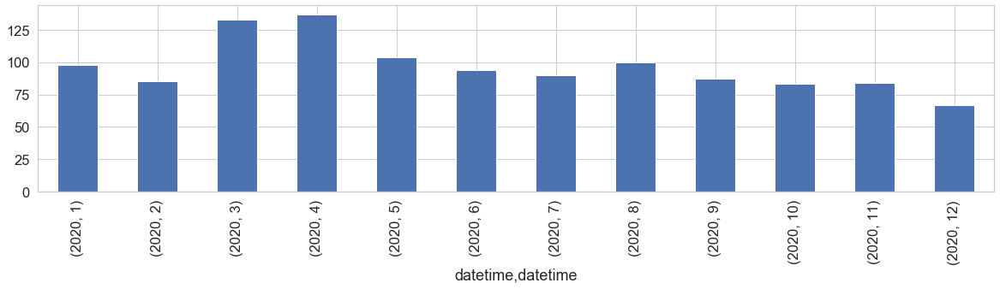

In [102]:
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df_2020 = df[df["datetime"].dt.year == 2020]
df_2020['datetime'].groupby([df_2020.datetime.dt.year, df_2020.datetime.dt.month]).agg('count').plot(kind="bar", figsize=(20,4))

# SUBSTITUI GRÁFICO ACIMA

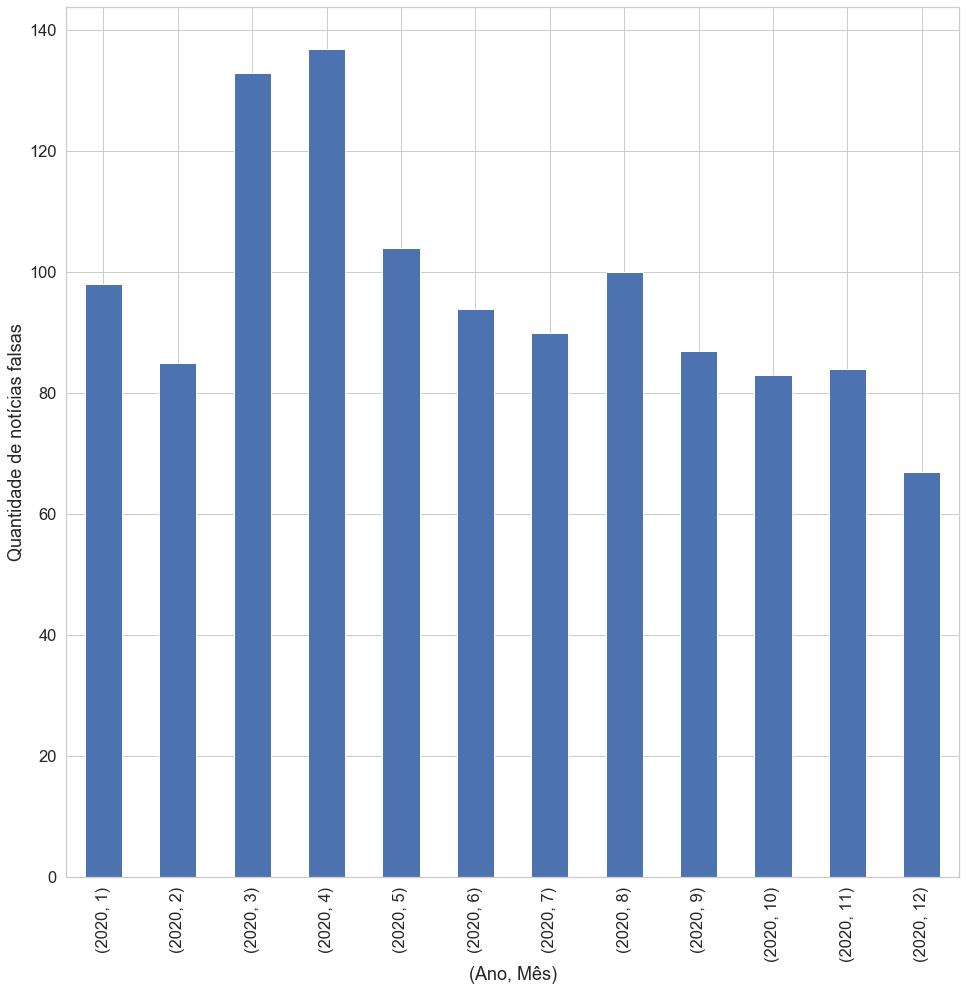

In [103]:
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df_2020 = df[df["datetime"].dt.year == 2020]
df_2020['datetime'].groupby([df_2020.datetime.dt.year, df_2020.datetime.dt.month]).agg('count').plot(kind="bar", figsize=(16,16))
plt.xlabel("(Ano, Mês)")
plt.ylabel("Quantidade de notícias falsas");

#### Total de notícias 2020

In [104]:
df_2020['datetime'].agg("count")

1162

#### -Média de 2020

In [105]:
df_2020['datetime'].groupby([df_2020.datetime.dt.year, df_2020.datetime.dt.month]).agg('count').agg('mean')

96.83333333333333

#### -Menor número de notícias

In [106]:
df_2020['datetime'].groupby([df_2020.datetime.dt.year, df_2020.datetime.dt.month]).agg('count').agg('min')

67

#### -Maior número de notícias

In [107]:
df_2020['datetime'].groupby([df_2020.datetime.dt.year, df_2020.datetime.dt.month]).agg('count').agg('max')

137

#### -Quantidade para cada mês

In [108]:
df_2020['datetime'].groupby([df_2020.datetime.dt.year, df_2020.datetime.dt.month]).agg('count')

datetime  datetime
2020      1            98
          2            85
          3           133
          4           137
          5           104
          6            94
          7            90
          8           100
          9            87
          10           83
          11           84
          12           67
Name: datetime, dtype: int64

In [109]:
picos_2020 = df_2020.loc[(df_2020['datetime'].dt.year==2020) & ((df_2020['datetime'].dt.month==1) | (df_2020['datetime'].dt.month==3) | (df_2020['datetime'].dt.month==4) | (df_2020['datetime'].dt.month==5) | (df_2020['datetime'].dt.month==8))]

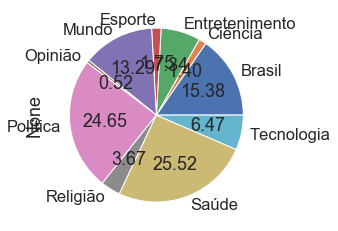

In [110]:
picos_2020.groupby('category').size().plot(kind='pie', autopct='%.2f')

# SUBSTITUI GRÁFICO ACIMA

Text(0, 0.5, '')

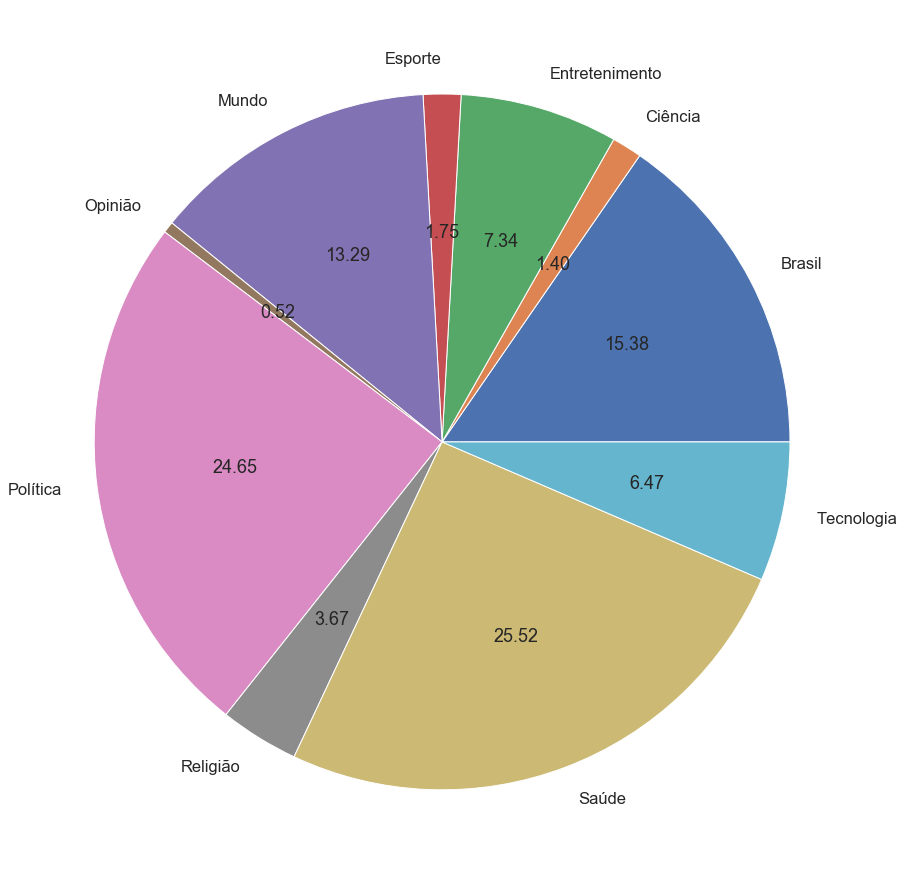

In [111]:
picos_2020.groupby('category').size().plot(kind='pie', autopct='%.2f', figsize=(16,16))
plt.ylabel("")

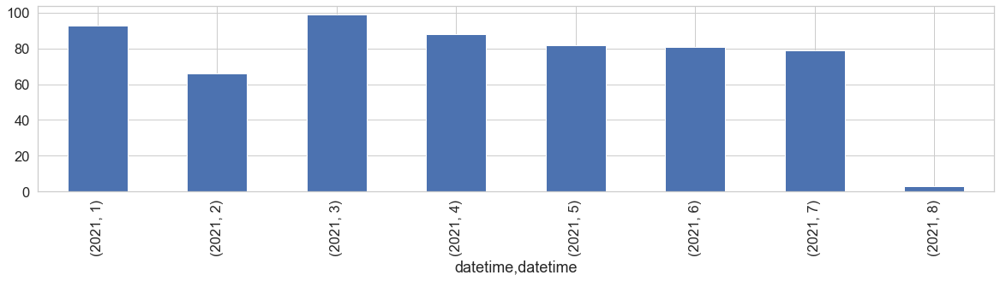

In [112]:
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df_2021 = df[df["datetime"].dt.year == 2021]
df_2021['datetime'].groupby([df_2021.datetime.dt.year, df_2021.datetime.dt.month]).agg('count').plot(kind="bar", figsize=(20,4))

# SUBSTITUI GRÁFICO ACIMA

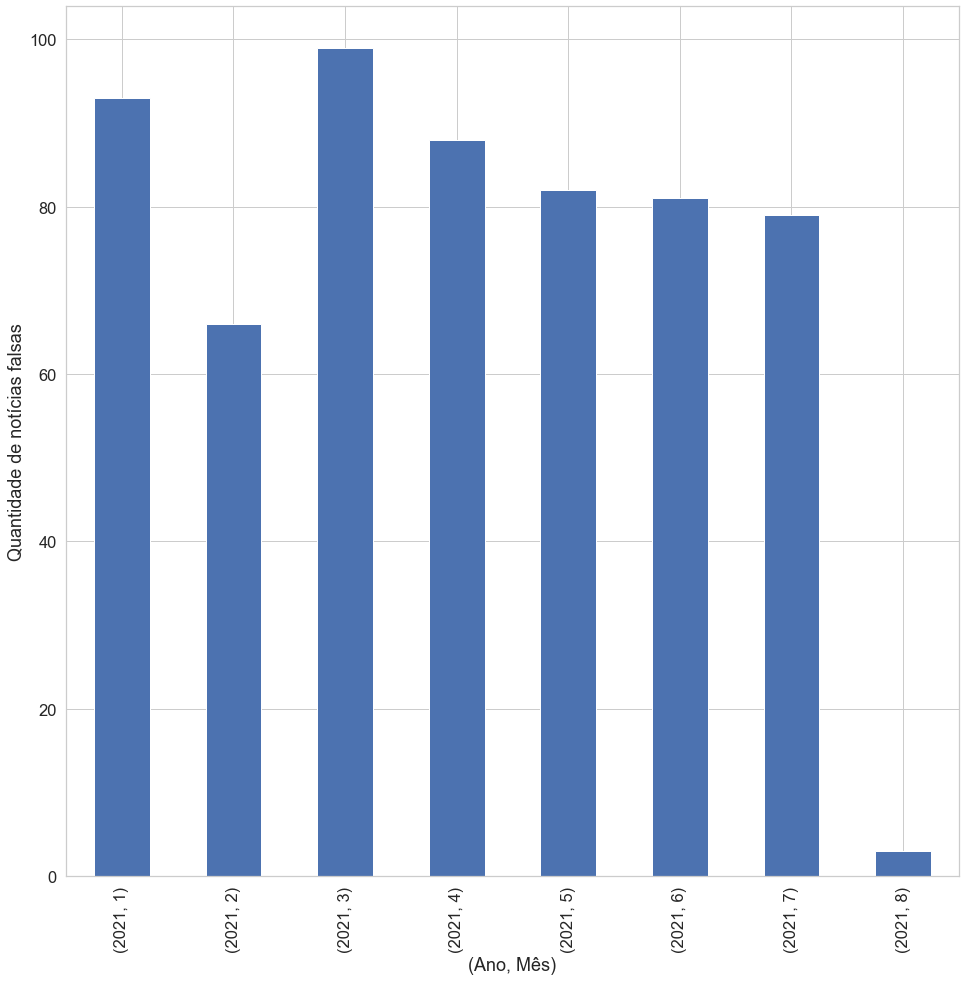

In [113]:
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df_2021 = df[df["datetime"].dt.year == 2021]
df_2021['datetime'].groupby([df_2021.datetime.dt.year, df_2021.datetime.dt.month]).agg('count').plot(kind="bar", figsize=(16,16))
plt.xlabel("(Ano, Mês)")
plt.ylabel("Quantidade de notícias falsas");

#### Total de notícias 2021

In [114]:
df_2021['datetime'].agg("count")

591

#### -Média de 2021

In [115]:
df_2021['datetime'].groupby([df_2021.datetime.dt.year, df_2021.datetime.dt.month]).agg('count').agg('mean')

73.875

#### -Menor número de notícias

In [116]:
df_2021['datetime'].groupby([df_2021.datetime.dt.year, df_2021.datetime.dt.month]).agg('count').agg('min')

3

#### -Maior número de notícias

In [117]:
df_2021['datetime'].groupby([df_2021.datetime.dt.year, df_2021.datetime.dt.month]).agg('count').agg('max')

99

#### -Quantidade para cada mês

In [118]:
df_2021['datetime'].groupby([df_2021.datetime.dt.year, df_2021.datetime.dt.month]).agg('count')

datetime  datetime
2021      1           93
          2           66
          3           99
          4           88
          5           82
          6           81
          7           79
          8            3
Name: datetime, dtype: int64

In [119]:
picos_2021 = df_2021.loc[(df_2021['datetime'].dt.year==2021) & ((df_2021['datetime'].dt.month==1) | (df_2021['datetime'].dt.month==3) | (df_2021['datetime'].dt.month==4) | (df_2021['datetime'].dt.month==5) | (df_2021['datetime'].dt.month==6)| (df_2021['datetime'].dt.month==7))]

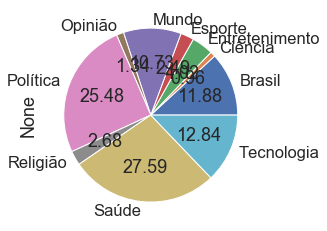

In [120]:
picos_2021.groupby('category').size().plot(kind='pie', autopct='%.2f')

# SUBSTITUI GRÁFICO ACIMA

Text(0, 0.5, '')

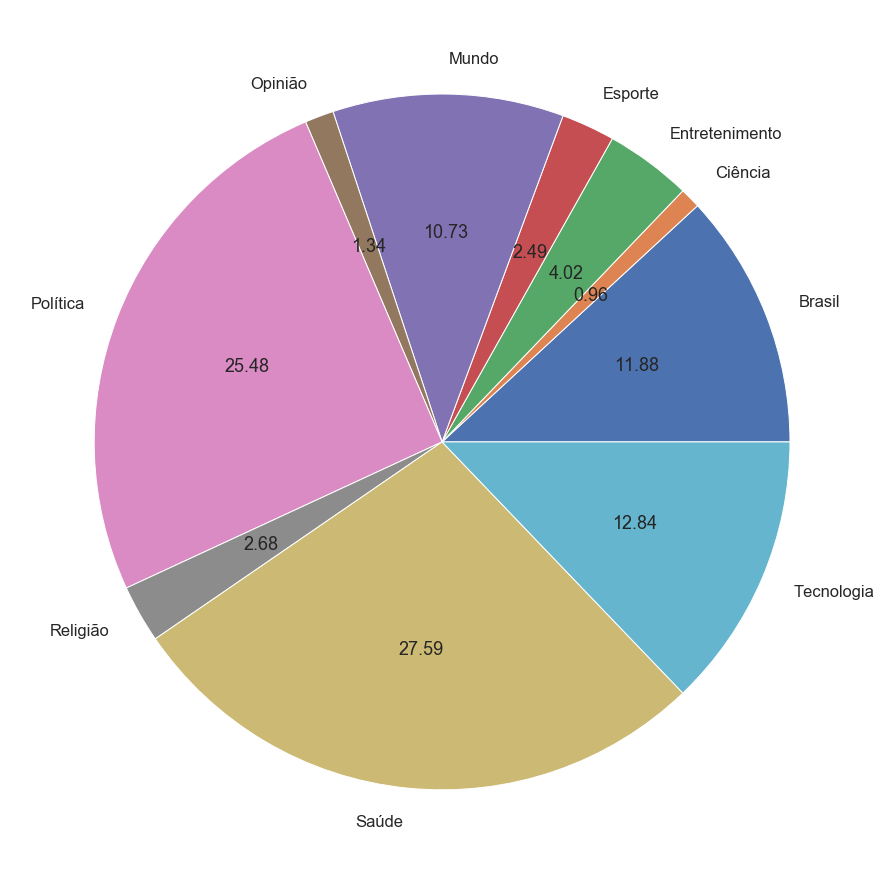

In [121]:
picos_2021.groupby('category').size().plot(kind='pie', autopct='%.2f', figsize=(16,16))
plt.ylabel("")

### Distribuição geral de notícias por categoria

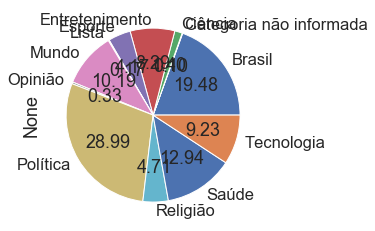

In [122]:
df.groupby('category').size().plot(kind='pie', autopct='%.2f')

# SUBSTITUI GRÁFICO ACIMA

Text(0, 0.5, '')

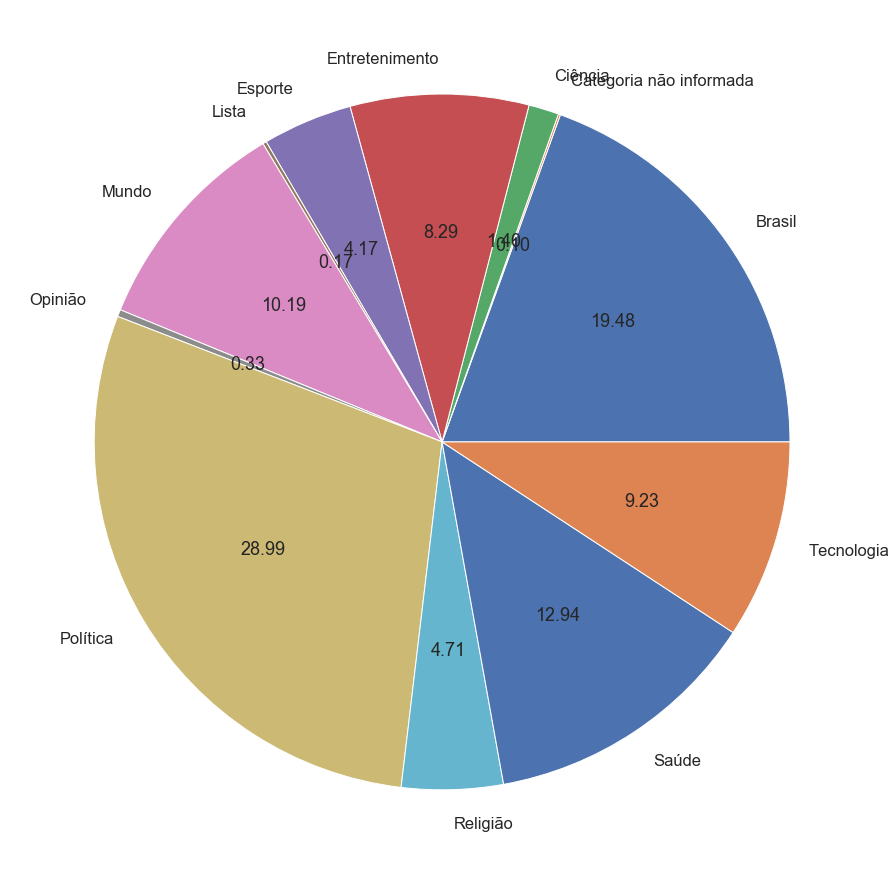

In [123]:
df.groupby('category').size().plot(kind='pie', autopct='%.2f', figsize=(16,16))
plt.ylabel("")

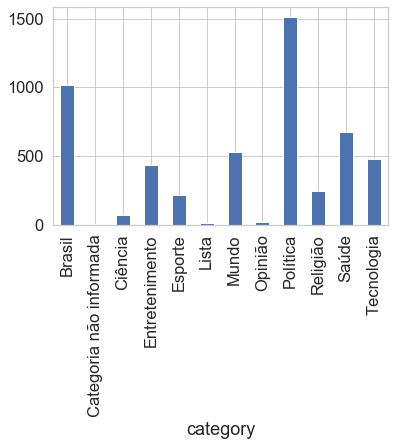

In [124]:
df['category'].groupby(df['category']).count().plot(kind='bar')

# SUBSTITUI GRÁFICO ACIMA

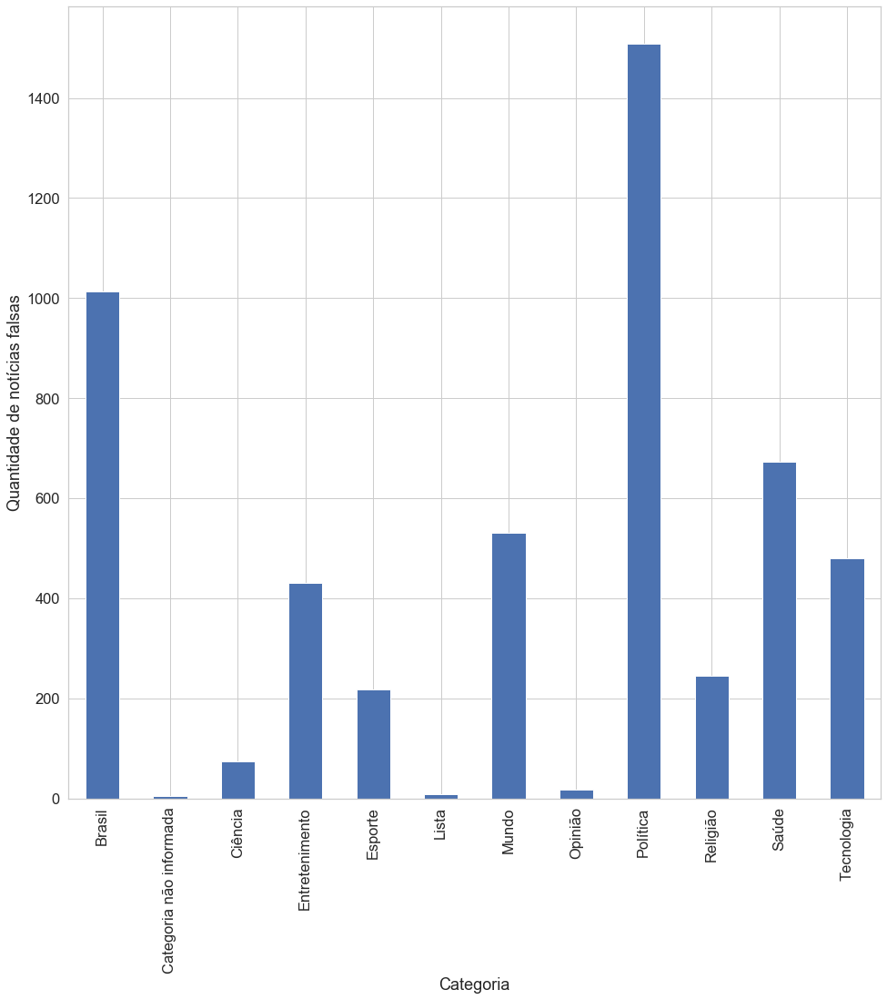

In [125]:
df['category'].groupby(df['category']).count().plot(kind='bar', figsize=(16,16))
plt.xlabel("Categoria")
plt.ylabel("Quantidade de notícias falsas");

###### Podemos reparar que entre as notícias falsas o assunto mais recorrente é sobre o campo da política.

### Análise de categoria de notícias por períodos de tempo

#### Distribuição de categoria de notícias por ano

In [126]:
#import seaborn as sns

In [127]:
df_categories = pd.crosstab(df['datetime'].dt.to_period('y'), df['category'])

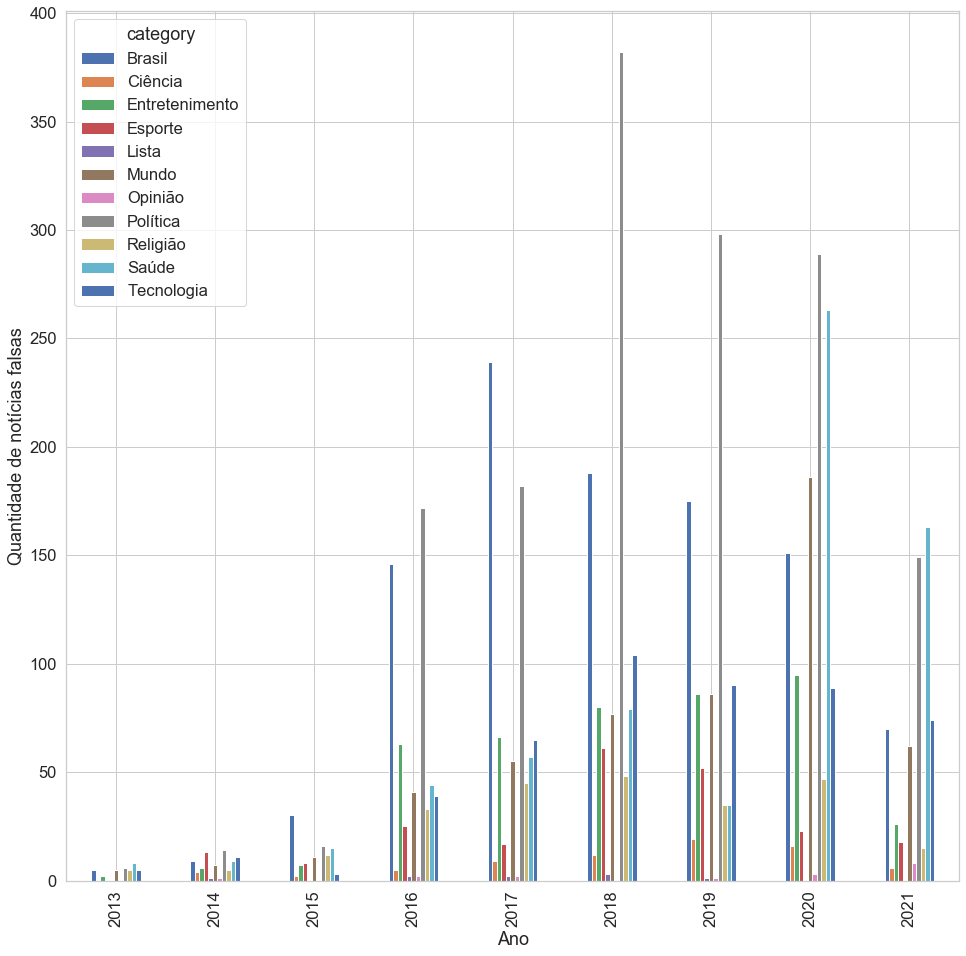

In [128]:
df_categories.plot.bar(figsize=(16,16), xlabel='Ano', ylabel='Quantidade de notícias falsas')

# SUBSTITUI GRÁFICO ACIMA

In [129]:
df_categories

category,Brasil,Ciência,Entretenimento,Esporte,Lista,Mundo,Opinião,Política,Religião,Saúde,Tecnologia
datetime,,,,,,,,,,,
2013,5,0,2,0,0,5,0,6,5,8,5
2014,9,4,6,13,1,7,1,14,5,9,11
2015,30,2,7,8,0,11,0,16,12,15,3
2016,146,5,63,25,2,41,2,172,33,44,39
2017,239,9,66,17,2,55,2,182,45,57,65
2018,188,12,80,61,3,77,0,382,48,79,104
2019,175,19,86,52,1,86,1,298,35,35,90
2020,151,16,95,23,0,186,3,289,47,263,89
2021,70,6,26,18,0,62,8,149,15,163,74


In [130]:
df_categories.idxmax(axis=1)

datetime
2013       Saúde
2014    Política
2015      Brasil
2016    Política
2017      Brasil
2018    Política
2019    Política
2020    Política
2021       Saúde
Freq: A-DEC, dtype: object

In [131]:
df_categories.idxmin(axis=1)

datetime
2013    Ciência
2014      Lista
2015      Lista
2016      Lista
2017      Lista
2018    Opinião
2019      Lista
2020      Lista
2021      Lista
Freq: A-DEC, dtype: object

###### Com este plot podemos perceber que invariavelmente até 2019 os assuntos com maior incidência de fake news são notícias relacionadas ao Brasil e notícias relacionadas a política. Após isto, em 2020 é possível perceber um salto muito grande na categoria de notícias atreladas à saúde, e em 2021 o tópicos com maior incidência de fake news é sobre saúde. Este fato, muito provavelmente esta atrelado a escalada da pandemia Covid-19, que trouxe consigo um número muito grande de desinformações.

#### Distribuição de notícias por mês

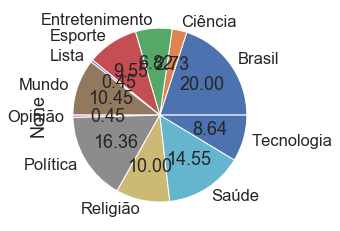

In [132]:
df_antes_2016.groupby('category').size().plot(kind='pie', autopct='%.2f')

# SUBSTITUI GRÁFICO ACIMA

Text(0, 0.5, '')

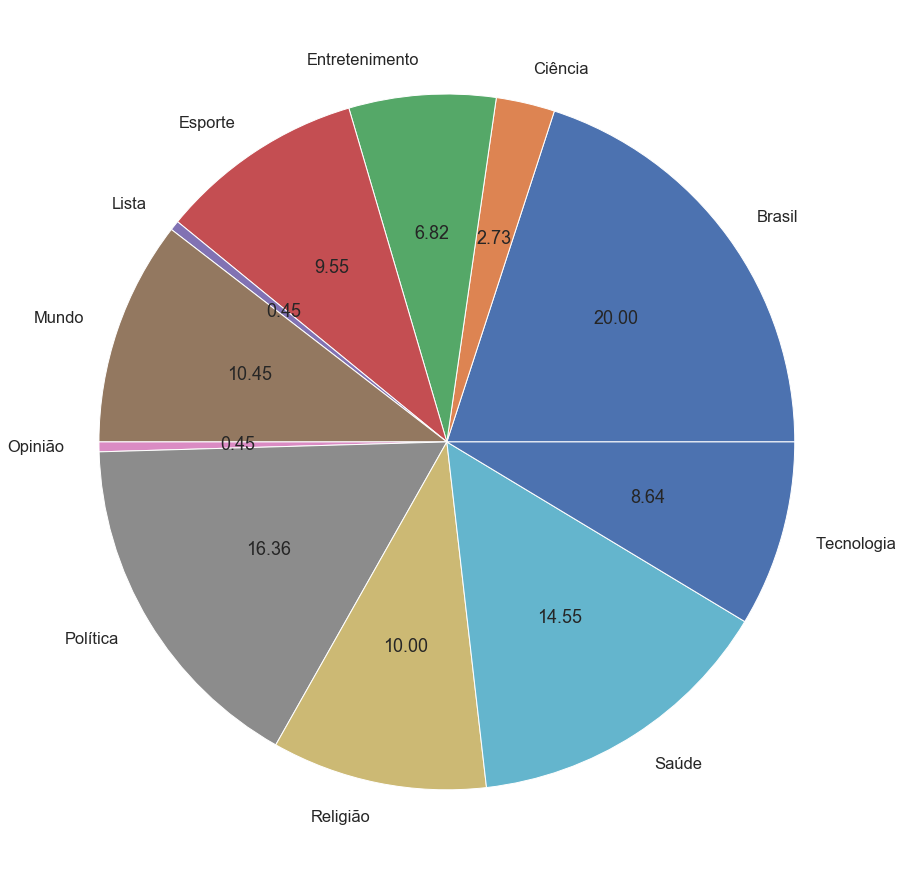

In [133]:
df_antes_2016.groupby('category').size().plot(kind='pie', autopct='%.2f', figsize=(16,16))
plt.ylabel("")

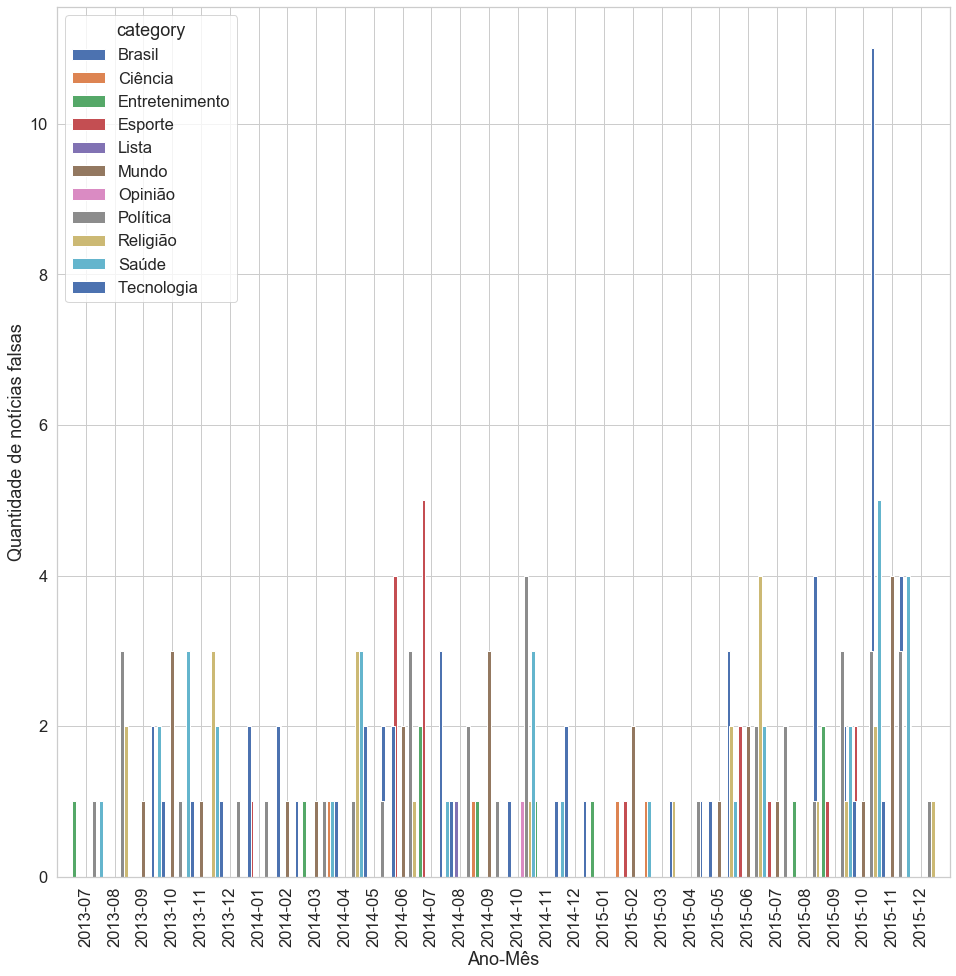

In [134]:
df_antes_2016_categories = pd.crosstab(df_antes_2016['datetime'].dt.to_period('m'), df_antes_2016['category'])
df_antes_2016_categories.plot.bar(figsize=(16,16), xlabel='Ano-Mês', ylabel='Quantidade de notícias falsas', width=1.5)

# SUBSTITUI GRÁFICO ACIMA

In [135]:
df_antes_2016_categories

category,Brasil,Ciência,Entretenimento,Esporte,Lista,Mundo,Opinião,Política,Religião,Saúde,Tecnologia
datetime,,,,,,,,,,,
2013-07,0,0,1,0,0,0,0,1,0,1,0
2013-08,0,0,0,0,0,0,0,3,2,0,0
2013-09,2,0,0,0,0,1,0,0,0,2,1
2013-10,2,0,0,0,0,3,0,1,0,3,1
2013-11,1,0,0,0,0,1,0,0,3,2,1
2013-12,0,0,1,0,0,0,0,1,0,0,2
2014-01,0,0,0,1,0,0,0,1,0,0,2
2014-02,0,0,0,2,0,1,0,0,0,0,0
2014-03,1,0,1,0,0,1,0,1,0,1,1


In [136]:
df_antes_2016_categories.idxmax(axis=1)

datetime
2013-07    Entretenimento
2013-08          Política
2013-09            Brasil
2013-10             Mundo
2013-11          Religião
2013-12        Tecnologia
2014-01        Tecnologia
2014-02           Esporte
2014-03            Brasil
2014-04          Religião
2014-05        Tecnologia
2014-06           Esporte
2014-07           Esporte
2014-08            Brasil
2014-09             Mundo
2014-10          Política
2014-11        Tecnologia
2014-12            Brasil
2015-01            Brasil
2015-02             Mundo
2015-03           Ciência
2015-04            Brasil
2015-05          Religião
2015-06          Religião
2015-07          Política
2015-08            Brasil
2015-09            Brasil
2015-10             Saúde
2015-11            Brasil
2015-12            Brasil
Freq: M, dtype: object

In [137]:
df_antes_2016_categories.idxmin(axis=1)

datetime
2013-07     Brasil
2013-08     Brasil
2013-09    Ciência
2013-10    Ciência
2013-11    Ciência
2013-12     Brasil
2014-01     Brasil
2014-02     Brasil
2014-03    Ciência
2014-04     Brasil
2014-05     Brasil
2014-06    Ciência
2014-07    Ciência
2014-08    Ciência
2014-09     Brasil
2014-10    Ciência
2014-11     Brasil
2014-12    Ciência
2015-01    Ciência
2015-02     Brasil
2015-03     Brasil
2015-04    Ciência
2015-05    Ciência
2015-06    Ciência
2015-07    Ciência
2015-08    Ciência
2015-09    Ciência
2015-10    Ciência
2015-11    Ciência
2015-12    Ciência
Freq: M, dtype: object

###### A partir de 2016 ocorreu uma explosão de notícias, que em sua maioria estavam atreladas a categoria política

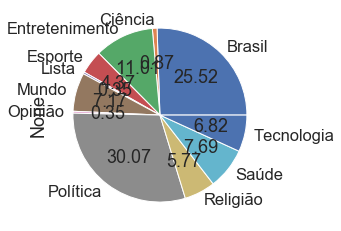

In [138]:
df_2016.groupby('category').size().plot(kind='pie', autopct='%.2f')

# SUBSTITUI GRÁFICO ACIMA

Text(0, 0.5, '')

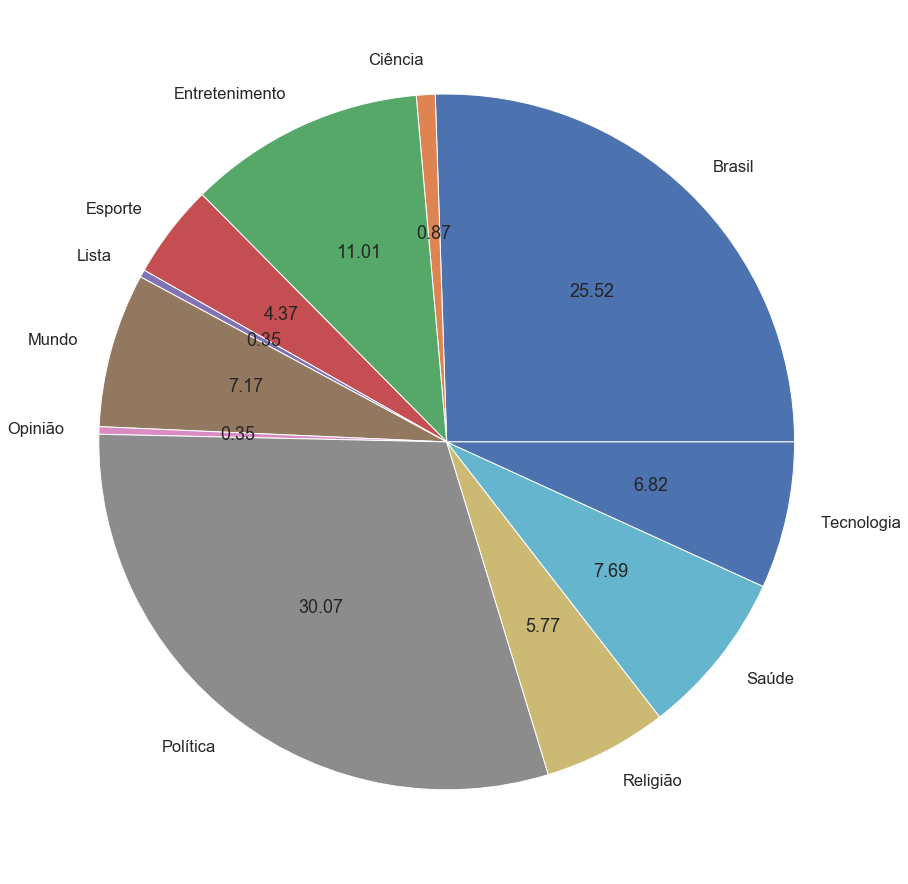

In [139]:
df_2016.groupby('category').size().plot(kind='pie', autopct='%.2f', figsize=(16,16))
plt.ylabel("")

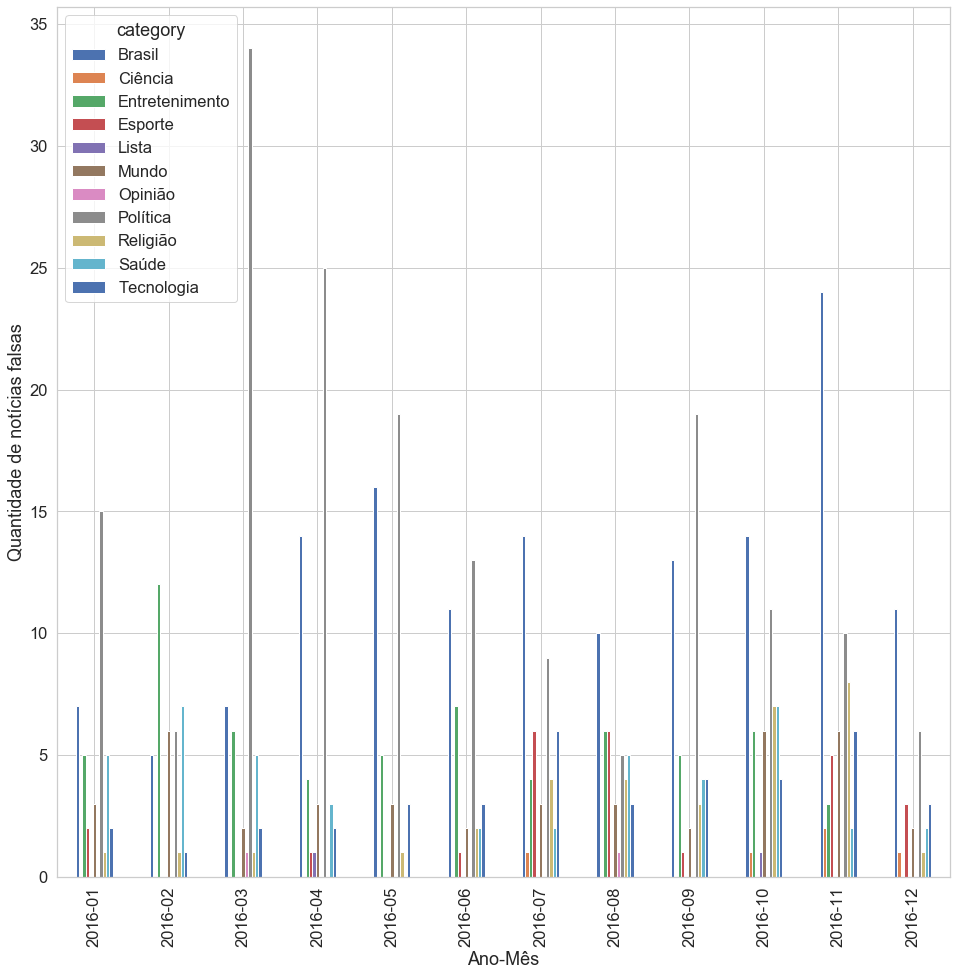

In [140]:
df_2016_categories = pd.crosstab(df_2016['datetime'].dt.to_period('m'), df_2016['category'])
df_2016_categories.plot.bar(figsize=(16,16), xlabel='Ano-Mês', ylabel='Quantidade de notícias falsas')

# SUBSTITUI GRÁFICO ACIMA

In [141]:
df_2016_categories

category,Brasil,Ciência,Entretenimento,Esporte,Lista,Mundo,Opinião,Política,Religião,Saúde,Tecnologia
datetime,,,,,,,,,,,
2016-01,7,0,5,2,0,3,0,15,1,5,2
2016-02,5,0,12,0,0,6,0,6,1,7,1
2016-03,7,0,6,0,0,2,1,34,1,5,2
2016-04,14,0,4,1,1,3,0,25,0,3,2
2016-05,16,0,5,0,0,3,0,19,1,0,3
2016-06,11,0,7,1,0,2,0,13,2,2,3
2016-07,14,1,4,6,0,3,0,9,4,2,6
2016-08,10,0,6,6,0,3,1,5,4,5,3
2016-09,13,0,5,1,0,2,0,19,3,4,4


In [142]:
df_2016_categories.idxmax(axis=1)

datetime
2016-01          Política
2016-02    Entretenimento
2016-03          Política
2016-04          Política
2016-05          Política
2016-06          Política
2016-07            Brasil
2016-08            Brasil
2016-09          Política
2016-10            Brasil
2016-11            Brasil
2016-12            Brasil
Freq: M, dtype: object

In [143]:
df_2016_categories.idxmin(axis=1)

datetime
2016-01           Ciência
2016-02           Ciência
2016-03           Ciência
2016-04           Ciência
2016-05           Ciência
2016-06           Ciência
2016-07             Lista
2016-08           Ciência
2016-09           Ciência
2016-10           Esporte
2016-11             Lista
2016-12    Entretenimento
Freq: M, dtype: object

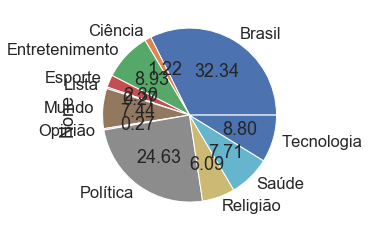

In [144]:
df_2017.groupby('category').size().plot(kind='pie', autopct='%.2f')

# SUBSTITUI GRÁFICO ACIMA

Text(0, 0.5, '')

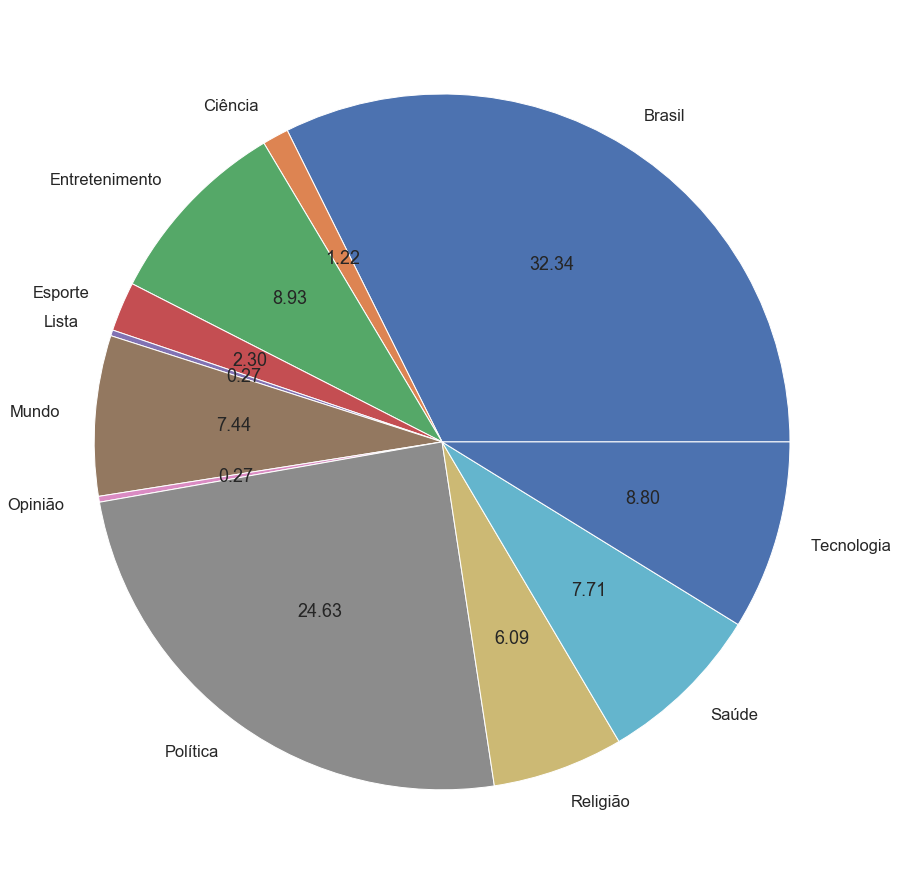

In [145]:
df_2017.groupby('category').size().plot(kind='pie', autopct='%.2f', figsize=(16,16))
plt.ylabel("")

In [146]:
teste = df_2017.loc[(df_2017['datetime'].dt.year==2017) & ((df_2017['datetime'].dt.month==8) | (df_2017['datetime'].dt.month==9))]
teste.head(60)

,title,title_norm,message,message_norm,tokens,features,entities,type,source,url_review,message_norm_treatment,datetime,message_norm_treatment_ssw,message_norm_treatment_ssw2,features2,category
1215,Separação de Barack Obama e Michelle Obama est...,separacao de barack obama e michelle obama est...,Um dos casamentos que aparentavam ser dos mais...,um dos casamentos que aparentavam ser dos mais...,"['separacao', 'de', 'barack', 'obama', 'e', 'm...","{'len': 9, 1: {'token': 'separacao', 'lemma': ...","[Barack Obama, Michelle Obama]",fake,boatos.org,https://www.boatos.org/entretenimento/barack-o...,um dos casamentos que aparentavam ser dos mais...,2017-08-01 00:04:27-03:00,"[casamentos, aparentavam, ser, solidos, planet...","[casamentos, aparentavam, solidos, planeta, re...","{'len': 9, 1: {'token': 'separacao', 'lemma': ...",Entretenimento
1216,Polícia alerta que ladrões perguntam de quem é...,policia alerta que ladroes perguntam de quem e...,"REPASSANDO, IMPORTANTE. Polícia militar avisa ...","repassando, importante.policia militar avisa q...","['policia', 'alerta', 'que', 'ladroes', 'pergu...","{'len': 12, 1: {'token': 'policia', 'lemma': '...",[],fake,boatos.org,https://www.boatos.org/brasil/bandidos-de-quem...,"repassando, importante.policia militar avisa q...",2017-08-01 01:50:34-03:00,"[repassando, importante.policia, militar, avis...","[repassando, importante.policia, militar, avis...","{'len': 12, 1: {'token': 'policia', 'lemma': '...",Brasil
1217,Terra se abriu em danceteria de Israel e burac...,terra se abriu em danceteria de israel e burac...,"A poucos dias atrás,numa danceteria em Israel,...","a poucos dias atras,numa danceteria em israel,...","['terra', 'se', 'abriu', 'em', 'danceteria', '...","{'len': 12, 1: {'token': 'terra', 'lemma': 'te...","[Terra, Israel]",fake,boatos.org,https://www.boatos.org/mundo/terra-abriu-dance...,"a poucos dias atras,numa danceteria em israel,...",2017-08-01 20:56:41-03:00,"[poucos, dias, atras, danceteria, israel, terr...","[dias, atras, danceteria, israel, terra, abriu...","{'len': 12, 1: {'token': 'terra', 'lemma': 'te...",Mundo
1218,Crianças que não tomam vacinas são cinco vezes...,criancas que nao tomam vacinas sao cinco vezes...,Estudo mostra que crianças que não tomam vacin...,estudo mostra que criancas que nao tomam vacin...,"['criancas', 'que', 'nao', 'tomam', 'vacinas',...","{'len': 10, 1: {'token': 'criancas', 'lemma': ...",[],fake,boatos.org,https://www.boatos.org/saude/criancas-vacinas-...,estudo mostra que criancas que nao tomam vacin...,2017-08-02 00:49:22-03:00,"[estudo, mostra, criancas, nao, tomam, vacinas...","[estudo, mostra, criancas, tomam, vacinas, vez...","{'len': 10, 1: {'token': 'criancas', 'lemma': ...",Saúde
1219,Ganhe créditos no seu celular com novo método ...,ganhe creditos no seu celular com novo metodo ...,"GANHE ATÉ R$20,00 EM CRÉDITO NO SEU CELULAR CO...","ganhe ate r$20,00 em credito no seu celular co...","['ganhe', 'creditos', 'no', 'seu', 'celular', ...","{'len': 11, 1: {'token': 'ganhe', 'lemma': 'ga...",[Ganhe],fake,boatos.org,https://www.boatos.org/tecnologia/ganhe-credit...,ganhe ate r$20 em credito no seu celular com e...,2017-08-02 21:17:35-03:00,"[ganhe, ate, r, 20, credito, celular, novo, me...","[ganhe, credito, celular, novo, metodo, sabemo...","{'len': 11, 1: {'token': 'ganhe', 'lemma': 'ga...",Tecnologia
1220,Facebook desligou inteligência artificial que ...,facebook desligou inteligencia artificial que ...,Facebook desliga inteligência artificial que c...,facebook desliga inteligencia artificial que c...,"['facebook', 'desligou', 'inteligencia', 'arti...","{'len': 8, 1: {'token': 'facebook', 'lemma': '...",[Facebook],fake,boatos.org,https://www.boatos.org/tecnologia/facebook-des...,facebook desliga inteligencia artificial que c...,2017-08-02 23:11:29-03:00,"[facebook, desliga, inteligencia, artificial, ...","[facebook, desliga, inteligencia, artificial, ...","{'len': 8, 1: {'token': 'facebook', 'lemma': '...",Tecnologia
1221,Crianças dan

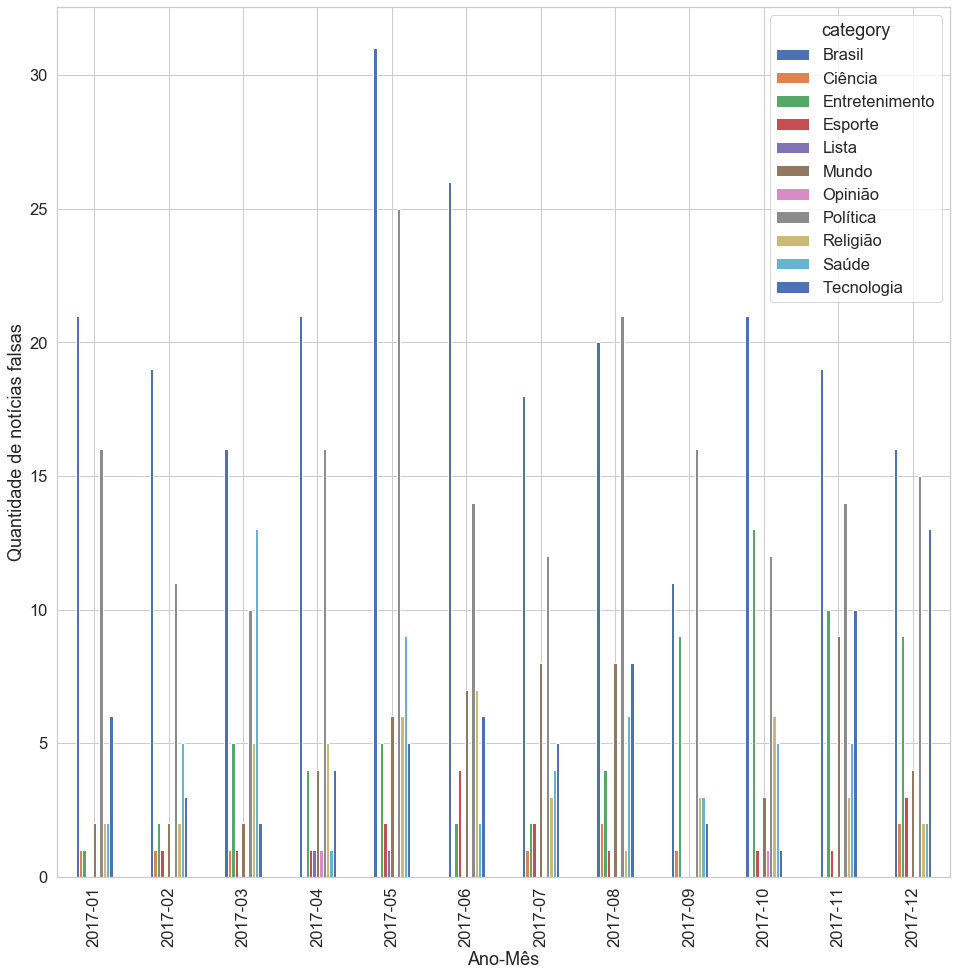

In [147]:
df_2017_categories = pd.crosstab(df_2017['datetime'].dt.to_period('m'), df_2017['category'])
df_2017_categories.plot.bar(figsize=(16,16), xlabel='Ano-Mês', ylabel='Quantidade de notícias falsas')

# SUBSTITUI GRÁFICO ACIMA

In [148]:
df_2017_categories

category,Brasil,Ciência,Entretenimento,Esporte,Lista,Mundo,Opinião,Política,Religião,Saúde,Tecnologia
datetime,,,,,,,,,,,
2017-01,21,1,1,0,0,2,0,16,2,2,6
2017-02,19,1,2,1,0,2,0,11,2,5,3
2017-03,16,1,5,1,0,2,0,10,5,13,2
2017-04,21,0,4,1,1,4,1,16,5,1,4
2017-05,31,0,5,2,1,6,0,25,6,9,5
2017-06,26,0,2,4,0,7,0,14,7,2,6
2017-07,18,1,2,2,0,8,0,12,3,4,5
2017-08,20,2,4,1,0,8,0,21,1,6,8
2017-09,11,1,9,0,0,0,0,16,3,3,2


In [149]:
df_2017_categories.idxmax(axis=1)

datetime
2017-01      Brasil
2017-02      Brasil
2017-03      Brasil
2017-04      Brasil
2017-05      Brasil
2017-06      Brasil
2017-07      Brasil
2017-08    Política
2017-09    Política
2017-10      Brasil
2017-11      Brasil
2017-12      Brasil
Freq: M, dtype: object

In [150]:
df_2017_categories.idxmin(axis=1)

datetime
2017-01    Esporte
2017-02      Lista
2017-03      Lista
2017-04    Ciência
2017-05    Ciência
2017-06    Ciência
2017-07      Lista
2017-08      Lista
2017-09    Esporte
2017-10    Ciência
2017-11    Ciência
2017-12      Lista
Freq: M, dtype: object

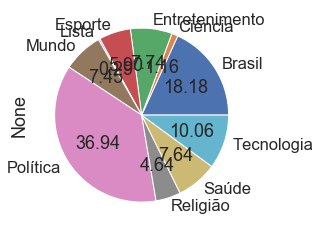

In [151]:
df_2018.groupby('category').size().plot(kind='pie', autopct='%.2f')

# SUBSTITUI GRÁFICO ACIMA

Text(0, 0.5, '')

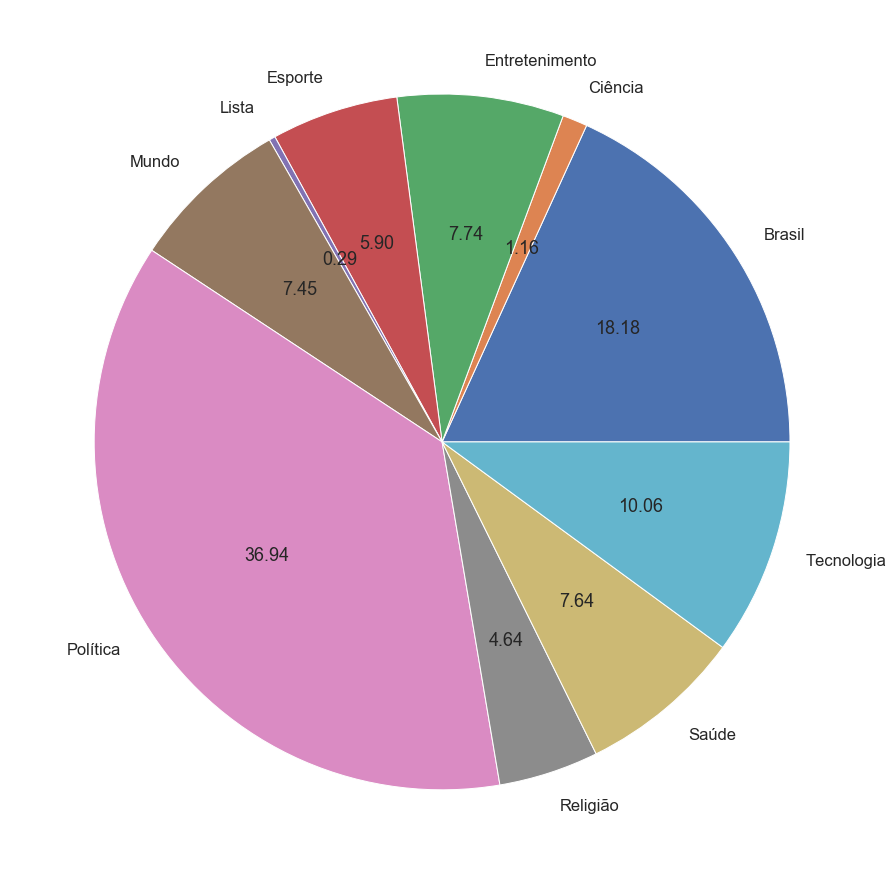

In [152]:
df_2018.groupby('category').size().plot(kind='pie', autopct='%.2f', figsize=(16,16))
plt.ylabel("")

In [153]:
#EXCLUIR BLOCO
#teste = df_2017.loc[(df_2017['datetime'].dt.year==2017) & ((df_2017['datetime'].dt.month==8) | (df_2017['datetime'].dt.month==9))]
#teste.head(60)

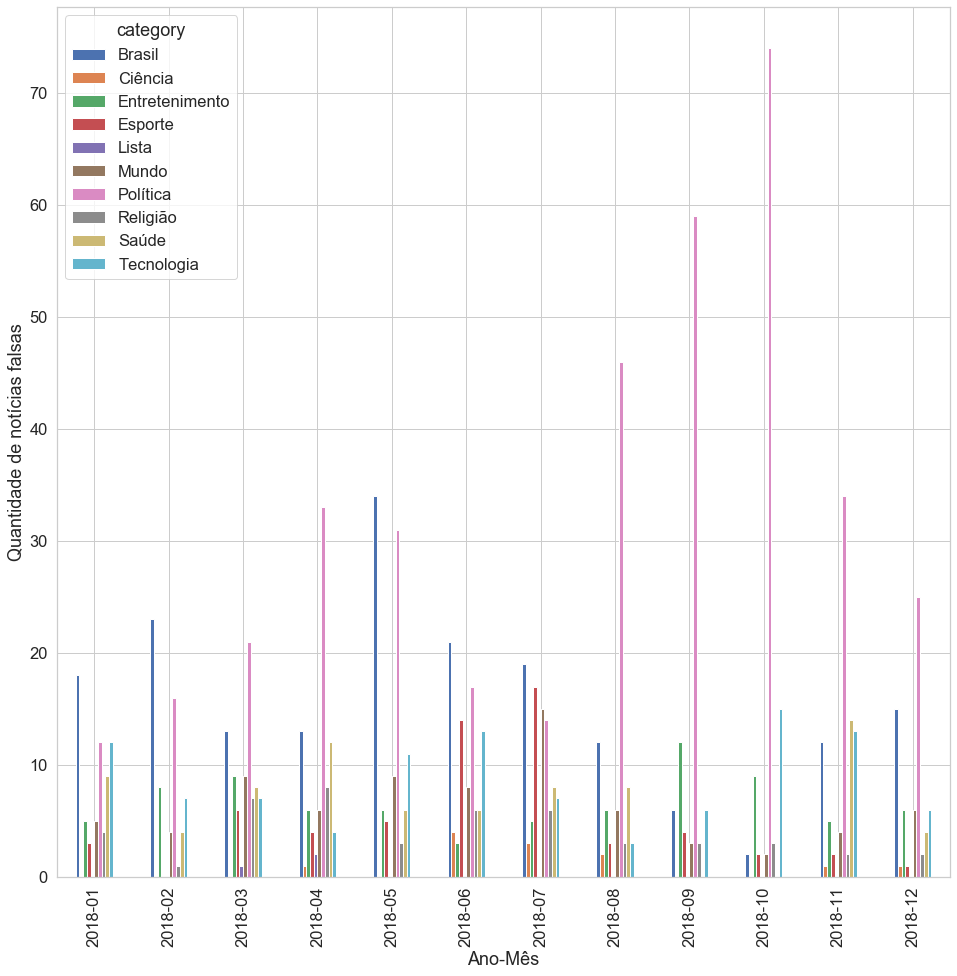

In [154]:
df_2018_categories = pd.crosstab(df_2018['datetime'].dt.to_period('m'), df_2018['category'])
df_2018_categories.plot.bar(figsize=(16,16), xlabel='Ano-Mês', ylabel='Quantidade de notícias falsas')

# SUBSTITUI GRÁFICO ACIMA

In [155]:
df_2018_categories

category,Brasil,Ciência,Entretenimento,Esporte,Lista,Mundo,Política,Religião,Saúde,Tecnologia
datetime,,,,,,,,,,
2018-01,18,0,5,3,0,5,12,4,9,12
2018-02,23,0,8,0,0,4,16,1,4,7
2018-03,13,0,9,6,1,9,21,7,8,7
2018-04,13,1,6,4,2,6,33,8,12,4
2018-05,34,0,6,5,0,9,31,3,6,11
2018-06,21,4,3,14,0,8,17,6,6,13
2018-07,19,3,5,17,0,15,14,6,8,7
2018-08,12,2,6,3,0,6,46,3,8,3
2018-09,6,0,12,4,0,3,59,3,0,6


In [156]:
df_2018_categories.idxmax(axis=1)

datetime
2018-01      Brasil
2018-02      Brasil
2018-03    Política
2018-04    Política
2018-05      Brasil
2018-06      Brasil
2018-07      Brasil
2018-08    Política
2018-09    Política
2018-10    Política
2018-11    Política
2018-12    Política
Freq: M, dtype: object

In [157]:
df_2018_categories.idxmin(axis=1)

datetime
2018-01    Ciência
2018-02    Ciência
2018-03    Ciência
2018-04    Ciência
2018-05    Ciência
2018-06      Lista
2018-07      Lista
2018-08      Lista
2018-09    Ciência
2018-10    Ciência
2018-11      Lista
2018-12      Lista
Freq: M, dtype: object

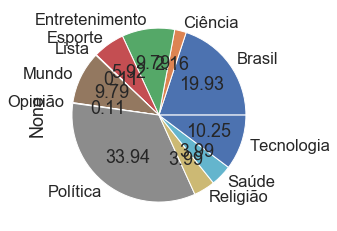

In [158]:
df_2019.groupby('category').size().plot(kind='pie', autopct='%.2f')

# SUBSTITUI GRÁFICO ACIMA

Text(0, 0.5, '')

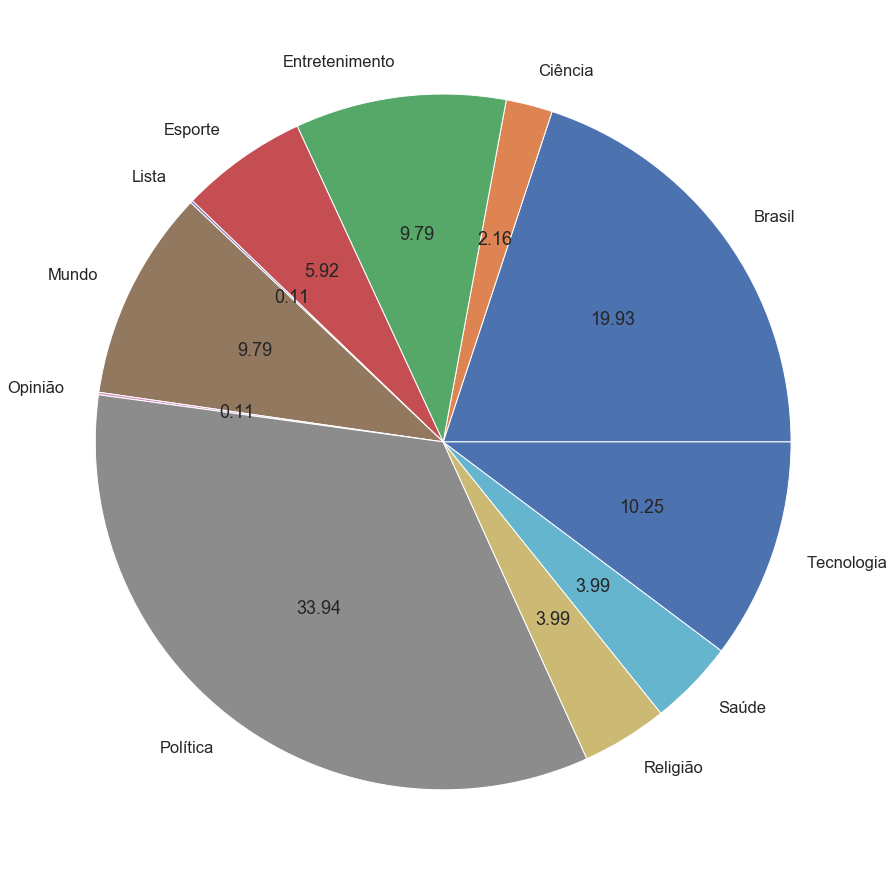

In [159]:
df_2019.groupby('category').size().plot(kind='pie', autopct='%.2f', figsize=(16,16))
plt.ylabel("")

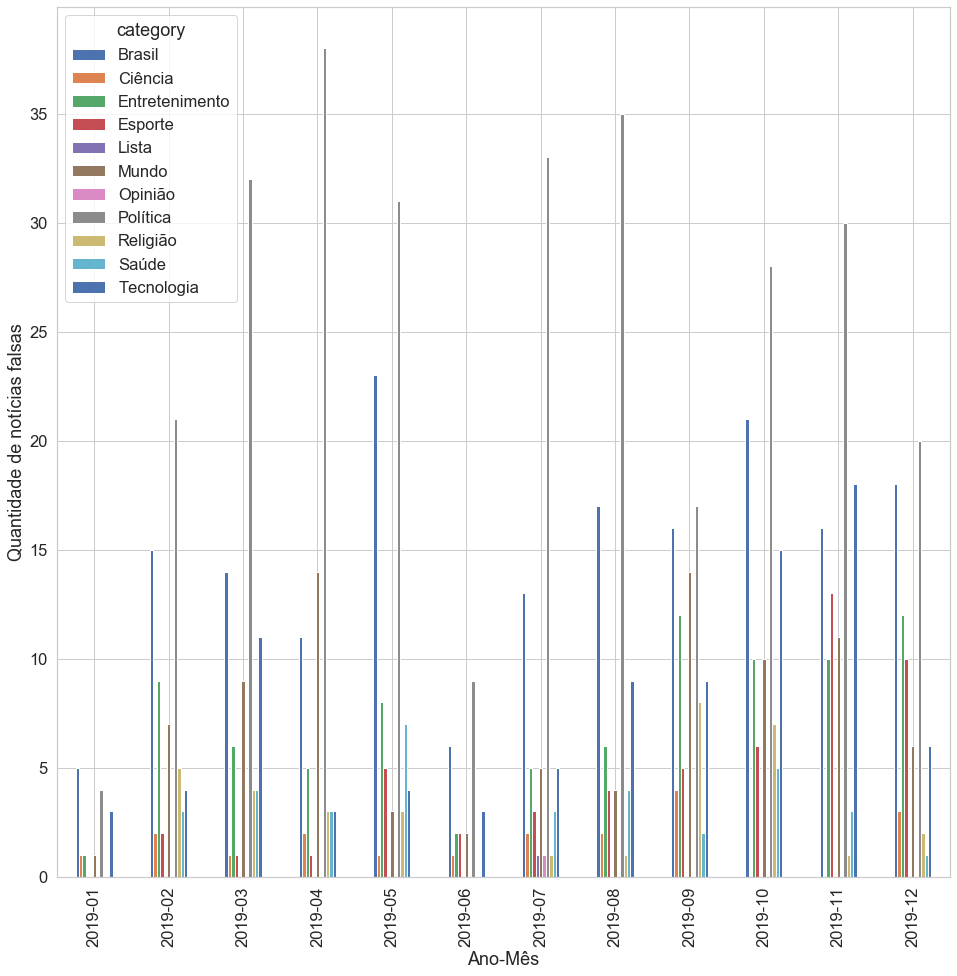

In [160]:
df_2019_categories = pd.crosstab(df_2019['datetime'].dt.to_period('m'), df_2019['category'])
df_2019_categories.plot.bar(figsize=(16,16), xlabel='Ano-Mês', ylabel='Quantidade de notícias falsas')

# SUBSTITUI GRÁFICO ACIMA

In [161]:
df_2019_categories

category,Brasil,Ciência,Entretenimento,Esporte,Lista,Mundo,Opinião,Política,Religião,Saúde,Tecnologia
datetime,,,,,,,,,,,
2019-01,5,1,1,0,0,1,0,4,0,0,3
2019-02,15,2,9,2,0,7,0,21,5,3,4
2019-03,14,1,6,1,0,9,0,32,4,4,11
2019-04,11,2,5,1,0,14,0,38,3,3,3
2019-05,23,1,8,5,0,3,0,31,3,7,4
2019-06,6,1,2,2,0,2,0,9,0,0,3
2019-07,13,2,5,3,1,5,1,33,1,3,5
2019-08,17,2,6,4,0,4,0,35,1,4,9
2019-09,16,4,12,5,0,14,0,17,8,2,9


In [162]:
df_2019_categories.idxmax(axis=1)

datetime
2019-01      Brasil
2019-02    Política
2019-03    Política
2019-04    Política
2019-05    Política
2019-06    Política
2019-07    Política
2019-08    Política
2019-09    Política
2019-10    Política
2019-11    Política
2019-12    Política
Freq: M, dtype: object

In [163]:
df_2019_categories.idxmin(axis=1)

datetime
2019-01    Esporte
2019-02      Lista
2019-03      Lista
2019-04      Lista
2019-05      Lista
2019-06      Lista
2019-07      Lista
2019-08      Lista
2019-09      Lista
2019-10    Ciência
2019-11    Ciência
2019-12      Lista
Freq: M, dtype: object

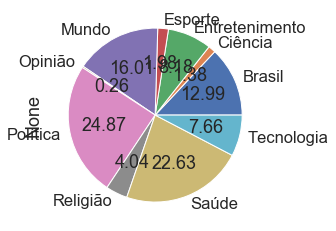

In [164]:
df_2020.groupby('category').size().plot(kind='pie', autopct='%.2f')

# SUBSTITUI GRÁFICO ACIMA

Text(0, 0.5, '')

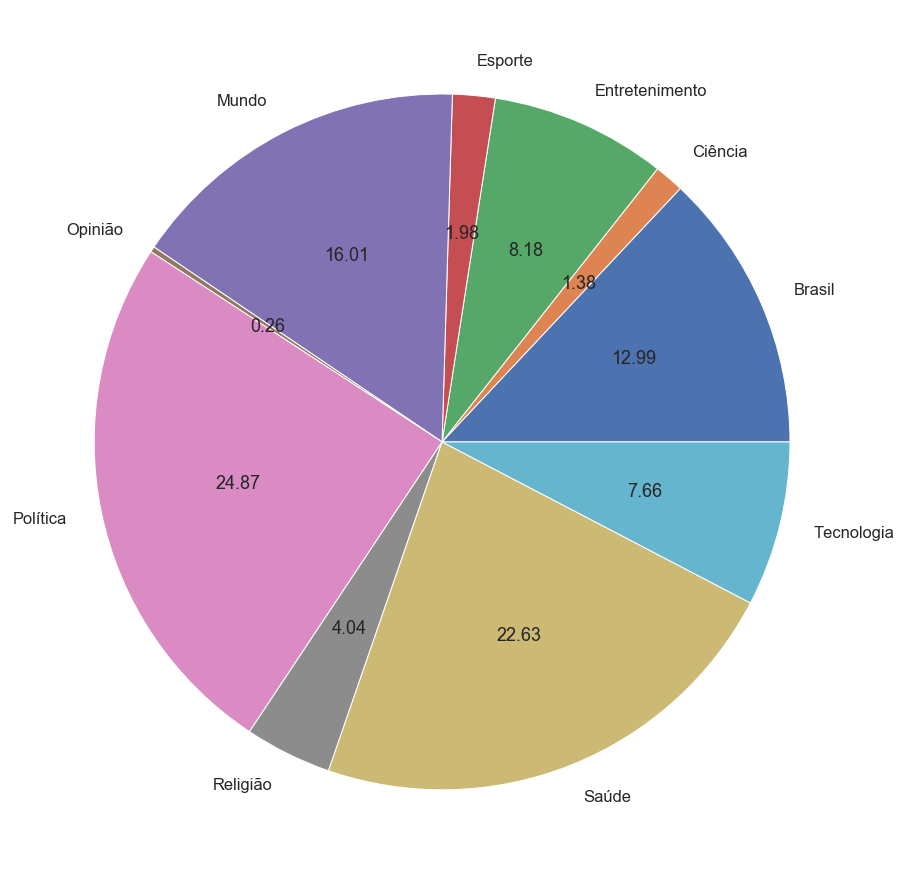

In [165]:
df_2020.groupby('category').size().plot(kind='pie', autopct='%.2f', figsize=(16,16))
plt.ylabel("")

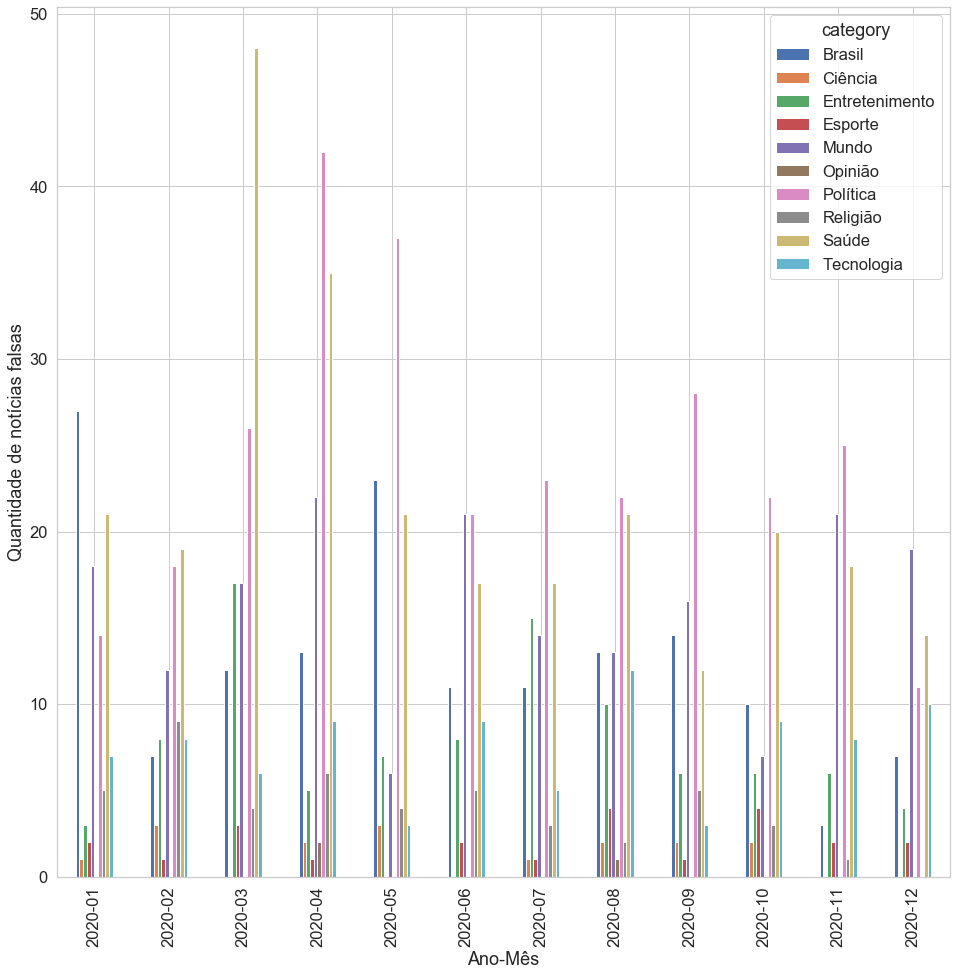

In [166]:
df_2020_categories = pd.crosstab(df_2020['datetime'].dt.to_period('m'), df_2020['category'])
df_2020_categories.plot.bar(figsize=(16,16), xlabel='Ano-Mês', ylabel='Quantidade de notícias falsas')

# SUBSTITUI GRÁFICO ACIMA

In [167]:
df_2020_categories

category,Brasil,Ciência,Entretenimento,Esporte,Mundo,Opinião,Política,Religião,Saúde,Tecnologia
datetime,,,,,,,,,,
2020-01,27,1,3,2,18,0,14,5,21,7
2020-02,7,3,8,1,12,0,18,9,19,8
2020-03,12,0,17,3,17,0,26,4,48,6
2020-04,13,2,5,1,22,2,42,6,35,9
2020-05,23,3,7,0,6,0,37,4,21,3
2020-06,11,0,8,2,21,0,21,5,17,9
2020-07,11,1,15,1,14,0,23,3,17,5
2020-08,13,2,10,4,13,1,22,2,21,12
2020-09,14,2,6,1,16,0,28,5,12,3


In [168]:
df_2020_categories.idxmax(axis=1)

datetime
2020-01      Brasil
2020-02       Saúde
2020-03       Saúde
2020-04    Política
2020-05    Política
2020-06       Mundo
2020-07    Política
2020-08    Política
2020-09    Política
2020-10    Política
2020-11    Política
2020-12       Mundo
Freq: M, dtype: object

In [169]:
df_2020_categories.idxmin(axis=1)

datetime
2020-01    Opinião
2020-02    Opinião
2020-03    Ciência
2020-04    Esporte
2020-05    Esporte
2020-06    Ciência
2020-07    Opinião
2020-08    Opinião
2020-09    Opinião
2020-10    Opinião
2020-11    Ciência
2020-12    Ciência
Freq: M, dtype: object

###### No ano de 2020 é possível perceber que a categoria de notícias atrelada a saúde sempre é alta na quantidade de fake news, mas que além disto é possível perceber que a categoria de notícias atreladas a política também cresce em decorrência das eleições municipais.

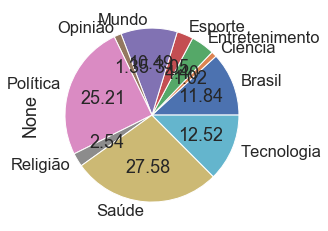

In [170]:
df_2021.groupby('category').size().plot(kind='pie', autopct='%.2f')

# SUBSTITUI GRÁFICO ACIMA

Text(0, 0.5, '')

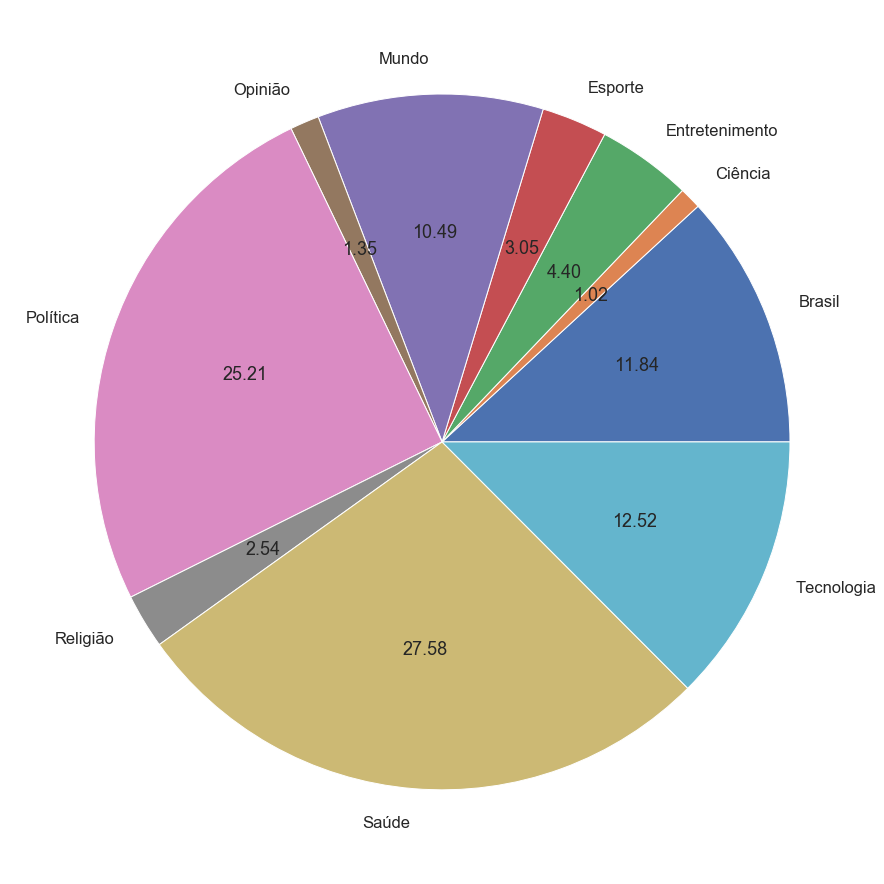

In [171]:
df_2021.groupby('category').size().plot(kind='pie', autopct='%.2f', figsize=(16,16))
plt.ylabel("")

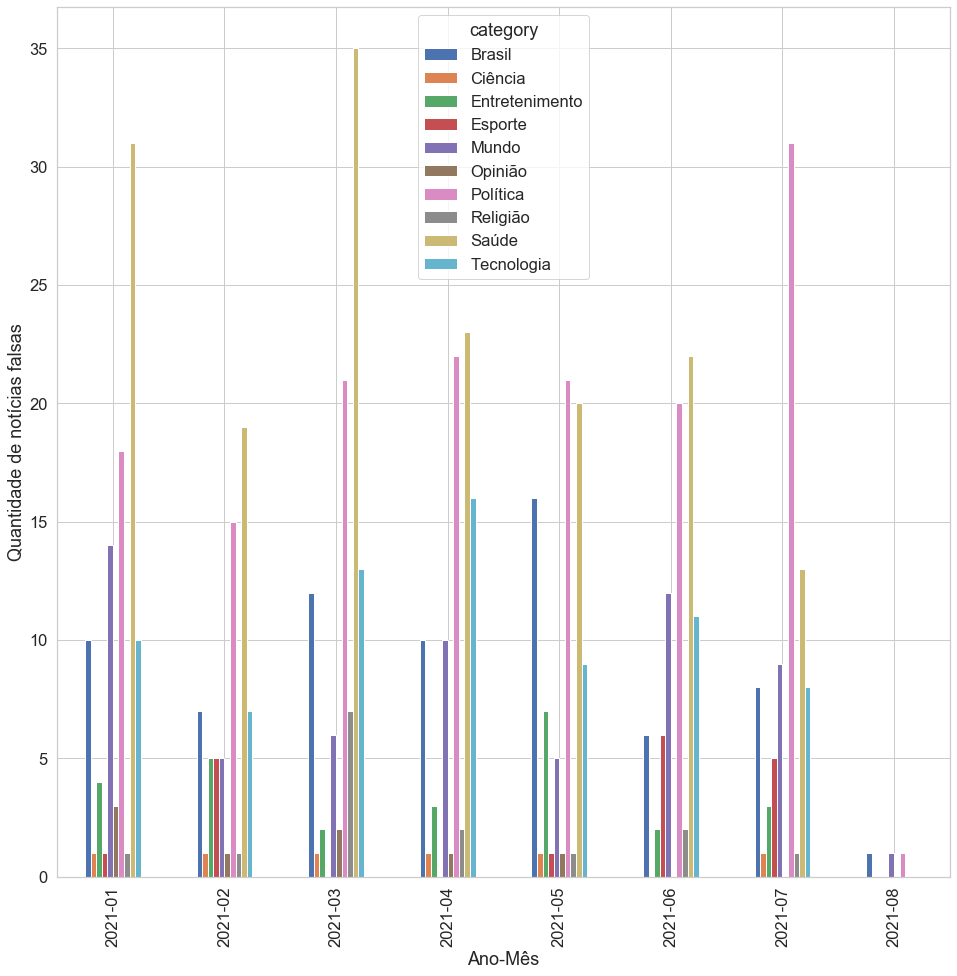

In [172]:
df_2021_categories = pd.crosstab(df_2021['datetime'].dt.to_period('m'), df_2021['category'])
df_2021_categories.plot.bar(figsize=(16,16), xlabel='Ano-Mês', ylabel='Quantidade de notícias falsas')

# SUBSTITUI GRÁFICO ACIMA

In [173]:
df_2021_categories

category,Brasil,Ciência,Entretenimento,Esporte,Mundo,Opinião,Política,Religião,Saúde,Tecnologia
datetime,,,,,,,,,,
2021-01,10,1,4,1,14,3,18,1,31,10
2021-02,7,1,5,5,5,1,15,1,19,7
2021-03,12,1,2,0,6,2,21,7,35,13
2021-04,10,1,3,0,10,1,22,2,23,16
2021-05,16,1,7,1,5,1,21,1,20,9
2021-06,6,0,2,6,12,0,20,2,22,11
2021-07,8,1,3,5,9,0,31,1,13,8
2021-08,1,0,0,0,1,0,1,0,0,0


In [174]:
df_2021_categories.idxmax(axis=1)

datetime
2021-01       Saúde
2021-02       Saúde
2021-03       Saúde
2021-04       Saúde
2021-05    Política
2021-06       Saúde
2021-07    Política
2021-08      Brasil
Freq: M, dtype: object

In [175]:
df_2021_categories.idxmin(axis=1)

datetime
2021-01    Ciência
2021-02    Ciência
2021-03    Esporte
2021-04    Esporte
2021-05    Ciência
2021-06    Ciência
2021-07    Opinião
2021-08    Ciência
Freq: M, dtype: object

###### Em 2021, é possível perceber que a maior parte do ano há maior ocorrência de notícias falsas atreladas a saúde, provavelmente também em decorrência da pandemia de Covid-19. 

### Análise de entidades das notícias por períodos de tempo

#### Distribuição de entidades do corpus completo

In [176]:
df = df.reset_index(drop=True)
for i in range(0, len(df['entities'])):
    df['entities'][i] = df['entities'][i].strip('[]').replace('"', '').replace(' ', '').split(',')

In [177]:
#Contagem de entidades
lista_palavras = []
for row in df['entities']:
  if row != None:
      for i in row:
        if i!='':
            lista_palavras.append(i)
fdist = FreqDist(lista_palavras)
print(fdist.most_common(10000000000000))
print('\n\nQuantidade de entidades distintas: ', len(fdist))
fdist_g = fdist.most_common(15)
fdist_gg = fdist.most_common(10000000000000)

[('Bolsonaro', 388), ('Brasil', 303), ('Covid-19', 257), ('Lula', 234), ('WhatsApp', 204), ('R$', 187), ('China', 99), ('PT', 92), ('STF', 85), ('Globo', 75), ('EUA', 71), ('Facebook', 69), ('Vídeo', 56), ('SãoPaulo', 53), ('Dilma', 48), ('Rio', 47), ('RiodeJaneiro', 46), ('SérgioMoro', 45), ('Venezuela', 43), ('SP', 37), ('Haddad', 34), ('PapaFrancisco', 32), ('Flamengo', 31), ('Amazônia', 29), ('PF', 26), ('Temer', 26), ('França', 24), ('Moro', 24), ('JeanWyllys', 23), ('Justiça', 22), ('Twitter', 22), ('Argentina', 21), ('Exército', 21), ('Boticário', 21), ('Doria', 21), ('Copa', 20), ('MG', 20), ('Natal', 20), ('Rússia', 19), ('Bahia', 19), ('Jesus', 18), ('Fotos', 18), ('Congresso', 18), ('Trump', 18), ('OMS', 18), ('PSOL', 18), ('Brasília', 17), ('Cuba', 17), ('JairBolsonaro', 17), ('RodrigoMaia', 17), ('Israel', 17), ('Curitiba', 17), ('Coronavac', 17), ('Itália', 16), ('Neymar', 15), ('ONU', 15), ('RJ', 15), ('Nordeste', 15), ('PCC', 15), ('Maduro', 14), ('Coca-Cola', 14), ('Ma

In [178]:
entity_ocurrences = 0
for i in range(0, len(fdist_gg)):
    entity_ocurrences+=fdist_gg[i][1]
print(entity_ocurrences)

9472


In [179]:
!pip install spacy

In [180]:
!python -m spacy download pt_core_news_lg

[+] Download and installation successful
You can now load the package via spacy.load('pt_core_news_lg')


In [181]:
classif=[]
import spacy
import pt_core_news_lg
nlp = pt_core_news_lg.load()
for i in range(0, len(fdist_gg)):
    texto = ''
    texto+=fdist_gg[i][0]
    doc = nlp(texto)
    for entidade in doc.ents:
        classif.append(entidade.label_)
        print(entidade.text, entidade.label_,'\n')

Bolsonaro LOC 

Brasil LOC 

Covid-19 LOC 

Lula PER 

China LOC 

PT ORG 

STF LOC 

Globo ORG 

EUA LOC 

Facebook MISC 

Vídeo MISC 

SãoPaulo MISC 

Dilma PER 

Rio LOC 

SérgioMoro PER 

Venezuela LOC 

SP LOC 

Haddad PER 

PapaFrancisco LOC 

Flamengo ORG 

Amazônia LOC 

PF ORG 

Temer PER 

França LOC 

Moro PER 

JeanWyllys LOC 

Justiça LOC 

Twitter PER 

Argentina LOC 

Exército ORG 

Doria PER 

Copa MISC 

MG LOC 

Natal LOC 

Rússia LOC 

Bahia LOC 

Jesus PER 

Congresso LOC 

Trump PER 

OMS ORG 

PSOL PER 

Brasília LOC 

Cuba LOC 

JairBolsonaro ORG 

RodrigoMaia LOC 

Israel LOC 

Curitiba LOC 

Coronavac PER 

Itália LOC 

Neymar PER 

ONU ORG 

RJ LOC 

Nordeste LOC 

PCC ORG 

Maduro PER 

Coca-Cola PER 

MariadoRosário LOC 

Alemanha LOC 

Japão LOC 

PSDB ORG 

SC LOC 

GeorgeSoros MISC 

Pará LOC 

Papa PER 

Corinthians ORG 

FátimaBernardes MISC 

LeiRouanet MISC 

ArnaldoJabor LOC 

Terra LOC 

Recife LOC 

GilmarMendes MISC 

PolíciaFederal MISC 

Austrál

Mongaguá LOC 

Sorocaba LOC 

Caseiro LOC 

Etiópia LOC 

BalneárioCamboriú LOC 

Tibet LOC 

Eduardo PER 

Geddel PER 

DEM ORG 

DiaInternacionaldaMulher PER 

ChicoPinheiro LOC 

MarcinhoVP MISC 

HeleydeAbreu PER 

Panamá LOC 

Tamiflu LOC 

Nostradamus PER 

ZecaDirceu LOC 

PresidênciadaRepública MISC 

GeneralAugustoHeleno MISC 

ArnoldSchwarzenegger MISC 

OceanoAtlântico MISC 

Caracas LOC 

ElPaís LOC 

Cantor PER 

Mongólia LOC 

Rondônia LOC 

Aécio PER 

AssassinodeMarielle LOC 

MiriamLeitão MISC 

Barra LOC 

PontaNegra LOC 

Maricá LOC 

PL PER 

Moscou LOC 

Marcelo MISC 

PhilippeCoutinho LOC 

RogérioFavreto ORG 

KolindaGrabar MISC 

Medjugorje LOC 

CamposdoJordão ORG 

Momo MISC 

Faustão PER 

FestivalLulaLivre LOC 

Serasa ORG 

Hacker ORG 

CarlosHenriqueSchroeder LOC 

CasasBahia LOC 

Amoêdo ORG 

Presos PER 

BancodoBrasil LOC 

TimesSquare LOC 

Satanás PER 

Caetano PER 

CheGuevara LOC 

Ibope PER 

TrackingBTG MISC 

LivrodeHaddad LOC 

URSAL MISC 

Cort

Advogado LOC 

FilmeCorpusChristi LOC 

PolíciaMilitardoRiodeJaneiro LOC 

PastoraPatrícia LOC 

PMDB ORG 

PresidenteFigueiredo PER 

Camarotti PER 

Correios LOC 

Deloitte ORG 

MajordaPM ORG 

RelaçõesExteriores MISC 

Victor PER 

LéonoTheVoice LOC 

RiquezadeLulinha MISC 

Delfinópolis LOC 

Zâmbia LOC 

IML LOC 

HelenAlmeida MISC 

Vulcão LOC 

Maranguape LOC 

Sandy PER 

Alessandra LOC 

JuanPabloMontoya MISC 

PoçosdeCaldas PER 

PortoRico PER 

Paracetamol PER 

JoseMujica MISC 

BrunaMarquezine MISC 

AK47 MISC 

FalandodosHomens MISC 

Kopenhagen LOC 

deCampinas MISC 

HsterndeR$ LOC 

AnneSullivan MISC 

Iemanjá LOC 

General LOC 

NovaJerusalém MISC 

BaleiaAzulnoWhatsApp LOC 

FadadoFogo MISC 

Casal LOC 

TAPPortugal LOC 

ArlindoChinaglia MISC 

MorodeLula LOC 

LeonordeFreitas MISC 

AvenidaBrasil PER 

Temervacilar LOC 

RobertoRequião MISC 

InstitutoBenjaminConstant MISC 

OscarNiemeyer MISC 

JamesNaylorGreen MISC 

JACMotors LOC 

PauloGamaTDR PER 

Jélysson P

OscarTabárez ORG 

ClaudiaAbreu LOC 

Copadomundode2018 LOC 

RioSãoFrancisco ORG 

Custódia LOC 

CharlesChaplin MISC 

Tartaruga LOC 

Jaconé LOC 

GilbertCollard MISC 

OlimpíadaMundialdeFísica LOC 

ArrozDana MISC 

Paquistão LOC 

Toluca LOC 

Anomalia LOC 

ViníciusJúnior MISC 

Barcelona LOC 

República LOC 

BolsaUsuáriodeR$ LOC 

SeleçãodaCroácia LOC 

NossaSenhora LOC 

JardimBelaVista LOC 

LeiFederal MISC 

Pré-candidatoChicoLeite MISC 

RádioCBN MISC 

Católicos LOC 

Nicarágua LOC 

DesafiodaMomo MISC 

Maquiavel PER 

Hiroshima LOC 

GrupoUniversaldoReinodeDeus LOC 

GrupoRD MISC 

MovimentoVeganistaEmergentedoChile PER 

Marte LOC 

InstitutoGoethe MISC 

FamíliaSarney MISC 

Mega-Senaparaganharprêmio LOC 

MarcoAntônioCabral MISC 

BiscoitoNesfit MISC 

NeiSantos LOC 

AlunadeLagoaSeca PER 

PB LOC 

CantorJohnnyHooker LOC 

Jesusdebicha LOC 

AugustoBlat MISC 

Jesusdegay LOC 

BruceLee MISC 

MDB PER 

Juliane PER 

Otávio PER 

MarceloHoope PER 

UniãodasRepúblicasS

DeputadoJoséGuimarães LOC 

FiatIdea MISC 

Tonel PER 

MariaAntonietadeLasNieves PER 

Chiquinha PER 

CarlosDrummonddeAndrade LOC 

RodrigoJanot MISC 

Ferraris PER 

MeuLivrodeHistóriasBíblicas MISC 

MariadaPaz MISC 

Pombagira LOC 

RiHappy MISC 

NordestedoBrasil LOC 

KidBengala MISC 

Bozonaro ORG 

MorrodoVidigal MISC 

RosângelaSilva LOC 

MaraJaqueline MISC 

CervejaAmbev MISC 

AviãodaEurowings LOC 

bullterrier LOC 

huskysiberiano LOC 

MaríliaMendonça LOC 

Mandirituba LOC 

Seita ORG 

CarteldoSoles PER 

Macri PER 

DonodaHavan LOC 

FundoPrevidenciário LOC 

OnyxLorenzoni PER 

LéoMagalhães MISC 

Cantaura LOC 

Atlântico LOC 

Bahrein LOC 

Líbia LOC 

Riachuelo LOC 

STJD ORG 

MorrodeSãoPaulo LOC 

Botucatu LOC 

SerginhoGroisman MISC 

TiadeMarielleFranco LOC 

AviãodaLufthansa LOC 

Aracaju LOC 

AutênticadeBragança MISC 

MWM LOC 

Honda ORG 

L'Oréal ORG 

Botijão LOC 

DocesdaTurquia PER 

AlexandreNardoni ORG 

Maísa PER 

Mercedes-Benz ORG 

Martinelli PER 


SistemaFinanceiroQuântico PER 

QSF LOC 

NataliaPasternak MISC 

Braskem ORG 

NSA ORG 

Gesara LOC 

Nesara LOC 

DiadasBruxas ORG 

JoshuaBeckford MISC 

Roma LOC 

EuTeAmo LOC 

MeuBrasil PER 

TioJoão PER 

CheGuevera LOC 

ICMBio ORG 

CaetanoVeloso MISC 

PresidenteLouco LOC 

IncêndionoAtacadãodeCampoGrande LOC 

Califórnia LOC 

PauloCoelho MISC 

Lolita MISC 

Loreta LOC 

KarlFriston MISC 

SantaCasa PER 

HospitalMilitar LOC 

SecretariadeCultura MISC 

CesarTralli ORG 

Isadorade11 MISC 

CarolSolberg PER 

Bolsa-Atleta PER 

Betmotion ORG 

FerroviadoSol PER 

Praga LOC 

RepúblicaTcheca MISC 

Crédito ORG 

PaieMãe LOC 

TeresaFidalgo MISC 

Naja ORG 

Rihappy LOC 

ProgramadoRatinho MISC 

UniversidadedeYale LOC 

MiG-25 MISC 

Azerbaijão LOC 

Armênia LOC 

TED MISC 

JoséCosta MISC 

Johnson PER 

EduardoLeite LOC 

Falcão PER 

MárioQuintana LOC 

SantaRita MISC 

Broca-do-morango LOC 

GuianaFrancesa MISC 

Maguila PER 

FiesdeR$ ORG 

Noctúria PER 

NetodeNeguinhod

In [182]:
classif

['LOC',
 'LOC',
 'LOC',
 'PER',
 'LOC',
 'ORG',
 'LOC',
 'ORG',
 'LOC',
 'MISC',
 'MISC',
 'MISC',
 'PER',
 'LOC',
 'PER',
 'LOC',
 'LOC',
 'PER',
 'LOC',
 'ORG',
 'LOC',
 'ORG',
 'PER',
 'LOC',
 'PER',
 'LOC',
 'LOC',
 'PER',
 'LOC',
 'ORG',
 'PER',
 'MISC',
 'LOC',
 'LOC',
 'LOC',
 'LOC',
 'PER',
 'LOC',
 'PER',
 'ORG',
 'PER',
 'LOC',
 'LOC',
 'ORG',
 'LOC',
 'LOC',
 'LOC',
 'PER',
 'LOC',
 'PER',
 'ORG',
 'LOC',
 'LOC',
 'ORG',
 'PER',
 'PER',
 'LOC',
 'LOC',
 'LOC',
 'ORG',
 'LOC',
 'MISC',
 'LOC',
 'PER',
 'ORG',
 'MISC',
 'MISC',
 'LOC',
 'LOC',
 'LOC',
 'MISC',
 'MISC',
 'LOC',
 'PER',
 'PER',
 'LOC',
 'LOC',
 'LOC',
 'PER',
 'MISC',
 'MISC',
 'ORG',
 'MISC',
 'LOC',
 'MISC',
 'MISC',
 'MISC',
 'LOC',
 'MISC',
 'ORG',
 'ORG',
 'PER',
 'LOC',
 'LOC',
 'LOC',
 'MISC',
 'ORG',
 'PER',
 'ORG',
 'MISC',
 'LOC',
 'ORG',
 'LOC',
 'ORG',
 'MISC',
 'MISC',
 'LOC',
 'ORG',
 'LOC',
 'LOC',
 'LOC',
 'LOC',
 'LOC',
 'LOC',
 'PER',
 'PER',
 'LOC',
 'MISC',
 'MISC',
 'LOC',
 'MISC',
 'LOC',
 

In [183]:
mylist = list(set(classif))
for ele in mylist:
    res = (len([i for i in classif if i==ele]) / len(classif)) * 100
    print(ele, ": " + str(res))

PER : 20.268310369833213
ORG : 12.6178390137781
MISC : 22.951414068165338
LOC : 44.16243654822335


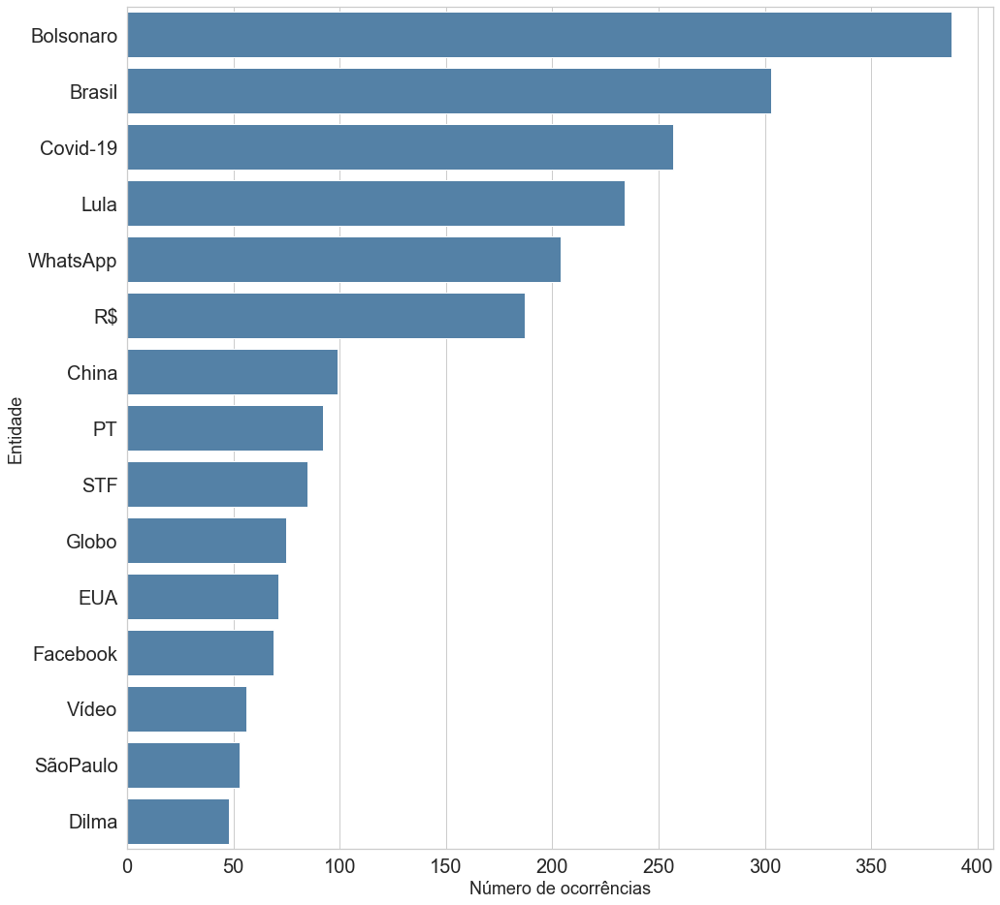

In [184]:
sns.set(style="whitegrid", font_scale=1.5)
## Conversion to Pandas series via Python Dictionary for easier plotting
fdist_g = pd.Series(dict(fdist_g))
## Setting figure, ax into variables
fig, ax = plt.subplots(figsize=(16,16))
ax.set(xlabel='Número de ocorrências', ylabel='Entidade')
ax.yaxis.set_tick_params(labelsize = 20);
ax.xaxis.set_tick_params(labelsize = 20);
## Seaborn plotting using Pandas attributes + xtick rotation for ease of viewing
all_plot = sns.barplot(x=fdist_g.values, y=fdist_g.index, orient='h', ax=ax, color="steelblue")
plt.show();

#### Distribuição de entidades de notícias por ano

##### - 2013,2014 e 2015

In [185]:
df_antes_2016 = df_antes_2016.reset_index(drop=True)
for i in range(0, len(df_antes_2016['entities'])):
    df_antes_2016['entities'][i] = df_antes_2016['entities'][i].strip('[]').replace('"', '').replace(' ', '').split(',')

In [186]:
#Contagem de entidades
lista_palavras = []
for row in df_antes_2016['entities']:
  if row != None:
      for i in row:
        if i!='':
            lista_palavras.append(i)
fdist = FreqDist(lista_palavras)
print(fdist.most_common(30))
fdist_antes2016 = fdist.most_common(15)

[('Brasil', 17), ('Mensagem', 6), ('Facebook', 6), ('Lula', 5), ('Jesus', 4), ('CopadoMundo', 4), ('Copa', 4), ('Neymar', 4), ('EduardoCampos', 4), ('Saiba', 3), ('Globo', 3), ('EstadoIslâmico', 3), ('BlackFriday', 3), ('Anitta', 3), ('Simpsons', 2), ('FantaUva', 2), ('Leia', 2), ('CirqueduSoleil', 2), ('DilmaRousseff', 2), ('Vídeo', 2), ('Rússia', 2), ('Pará', 2), ('PT', 2), ('Espanha', 2), ('JeanWyllys', 2), ('Bíblia', 2), ('Coca-Cola', 2), ('ParadaGay', 2), ('Portugal', 2), ('Carne', 2)]


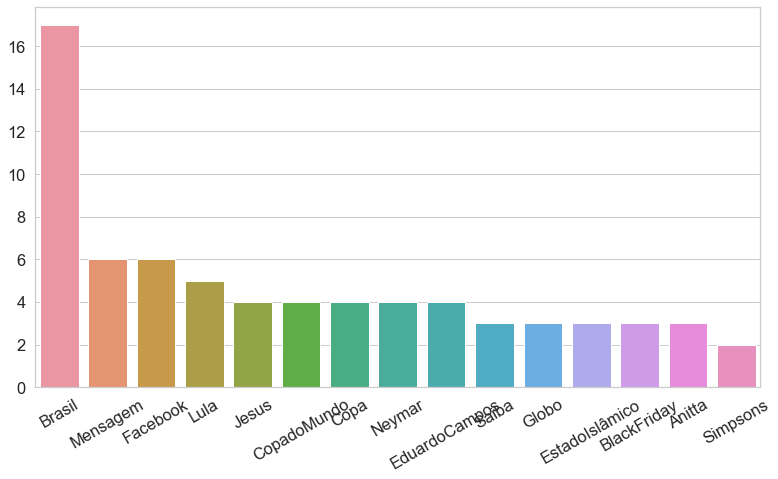

In [187]:
## Convertendo para Pandas series via Dicionário Python para um plot mais fácil
fdist_antes2016 = pd.Series(dict(fdist_antes2016))

## Setando figura, ax nas variáveis
fig, ax = plt.subplots(figsize=(13,7))

## Plotando com Seaborn usando atributos Pandas + xtick rotation para mais fácil visualização
all_plot = sns.barplot(x=fdist_antes2016.index, y=fdist_antes2016.values, ax=ax)
plt.xticks(rotation=30);

# SUBSTITUI GRÁFICO ACIMA

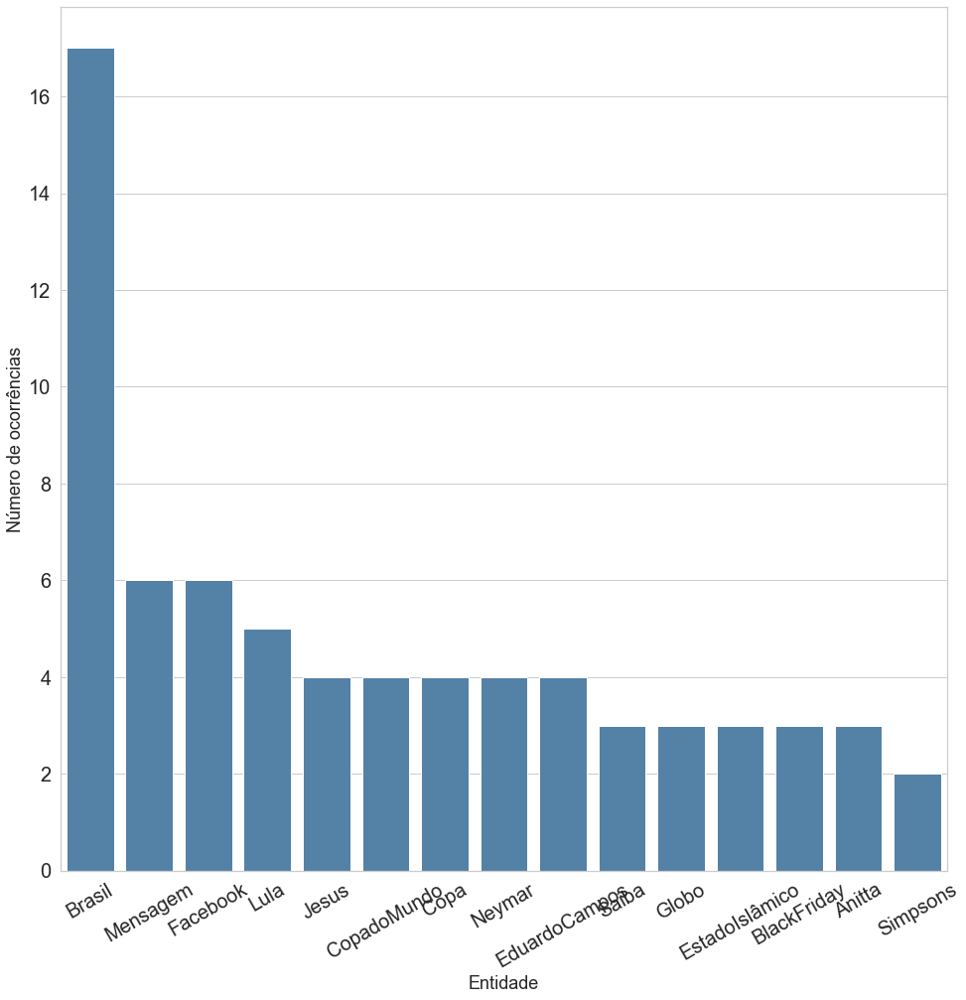

In [188]:
sns.set(style="whitegrid", font_scale=1.5)
## Conversion to Pandas series via Python Dictionary for easier plotting
fdist_antes2016 = pd.Series(dict(fdist_antes2016))
## Setting figure, ax into variables
fig, ax = plt.subplots(figsize=(16,16))
ax.set(xlabel='Entidade', ylabel='Número de ocorrências')
ax.yaxis.set_tick_params(labelsize = 20);
ax.xaxis.set_tick_params(labelsize = 20);
## Seaborn plotting using Pandas attributes + xtick rotation for ease of viewing
all_plot = sns.barplot(x=fdist_antes2016.index, y=fdist_antes2016.values, ax=ax, color="steelblue")
plt.xticks(rotation=30);

# OU

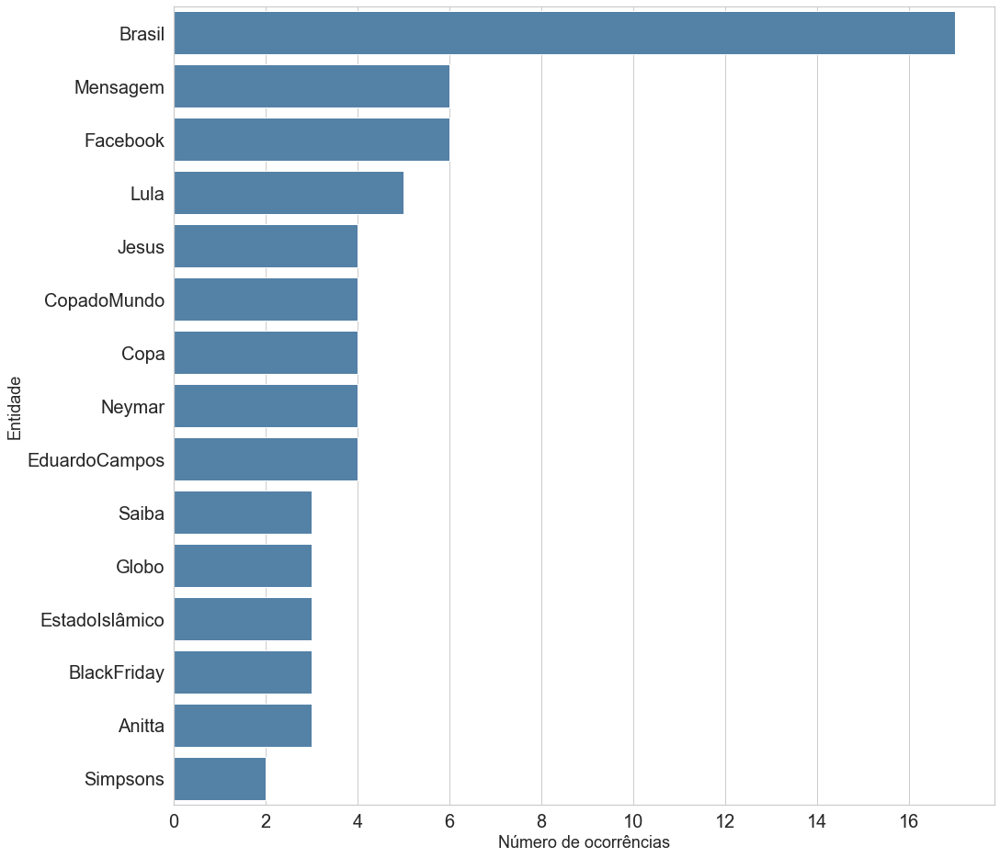

In [189]:
sns.set(style="whitegrid", font_scale=1.5)
## Conversion to Pandas series via Python Dictionary for easier plotting
fdist_antes2016 = pd.Series(dict(fdist_antes2016))
## Setting figure, ax into variables
fig, ax = plt.subplots(figsize=(16,16))
ax.set(xlabel='Número de ocorrências', ylabel='Entidade')
ax.yaxis.set_tick_params(labelsize = 20);
ax.xaxis.set_tick_params(labelsize = 20);
## Seaborn plotting using Pandas attributes + xtick rotation for ease of viewing
all_plot = sns.barplot(x=fdist_antes2016.values, y=fdist_antes2016.index, orient='h', ax=ax, color="steelblue")
plt.show();

In [190]:
'''# Set the figure size
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True

# Plot bar chart with data points
plt.bar(lista_palavras, lista_palavras, edgecolor = 'black')

# Display the plot
plt.show()'''

'# Set the figure size\nplt.rcParams["figure.figsize"] = [7.00, 3.50]\nplt.rcParams["figure.autolayout"] = True\n\n# Plot bar chart with data points\nplt.bar(lista_palavras, lista_palavras, edgecolor = \'black\')\n\n# Display the plot\nplt.show()'

In [191]:
'''plt.rcParams["figure.figsize"] = (20,3)
labels, ys = zip(*fdist)
xs = np.arange(len(labels)) 
width = 1

plt.bar(xs, ys, width, align='center', edgecolor = 'black')

plt.xticks(xs, labels) #Replace default x-ticks with xs, then replace xs with labels
plt.yticks(ys)'''

'plt.rcParams["figure.figsize"] = (20,3)\nlabels, ys = zip(*fdist)\nxs = np.arange(len(labels)) \nwidth = 1\n\nplt.bar(xs, ys, width, align=\'center\', edgecolor = \'black\')\n\nplt.xticks(xs, labels) #Replace default x-ticks with xs, then replace xs with labels\nplt.yticks(ys)'

##### - 2016

In [192]:
df_2016 = df_2016.reset_index(drop=True)
for i in range(0, len(df_2016['entities'])):
    df_2016['entities'][i] = df_2016['entities'][i].strip('[]').replace('"', '').replace(' ', '').split(',')

In [193]:
#Contagem de entidades
lista_palavras = []
for row in df_2016['entities']:
  if row != None:
      for i in row:
        if i!='':
            lista_palavras.append(i)
fdist = FreqDist(lista_palavras)
print(fdist.most_common(30))
fdist_2016 = fdist.most_common(15)

[('Brasil', 27), ('Lula', 26), ('Dilma', 21), ('R$', 19), ('Facebook', 15), ('SérgioMoro', 12), ('Temer', 11), ('PT', 10), ('SãoPaulo', 9), ('Rio', 8), ('RiodeJaneiro', 7), ('Olimpíadas', 7), ('Chapecoense', 7), ('China', 6), ('Fotos', 6), ('Globo', 6), ('LavaJato', 5), ('EUA', 5), ('JeanWyllys', 5), ('Bolsonaro', 5), ('RJ', 4), ('Jesus', 4), ('Brasília', 4), ('PapaFrancisco', 4), ('Nasa', 4), ('RenanCalheiros', 3), ('MG', 3), ('Rússia', 3), ('BBB', 3), ('GVT', 3)]


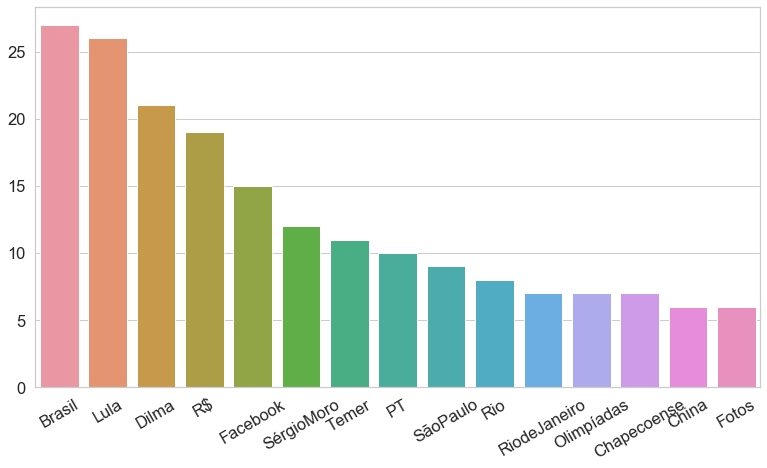

In [194]:
## Convertendo para Pandas series via Dicionário Python para um plot mais fácil
fdist_2016 = pd.Series(dict(fdist_2016))

## Setando figura, ax nas variáveis
fig, ax = plt.subplots(figsize=(13,7))

## Plotando com Seaborn usando atributos Pandas + xtick rotation para mais fácil visualização
all_plot = sns.barplot(x=fdist_2016.index, y=fdist_2016.values, ax=ax)
plt.xticks(rotation=30);

# SUBSTITUI GRÁFICO ACIMA

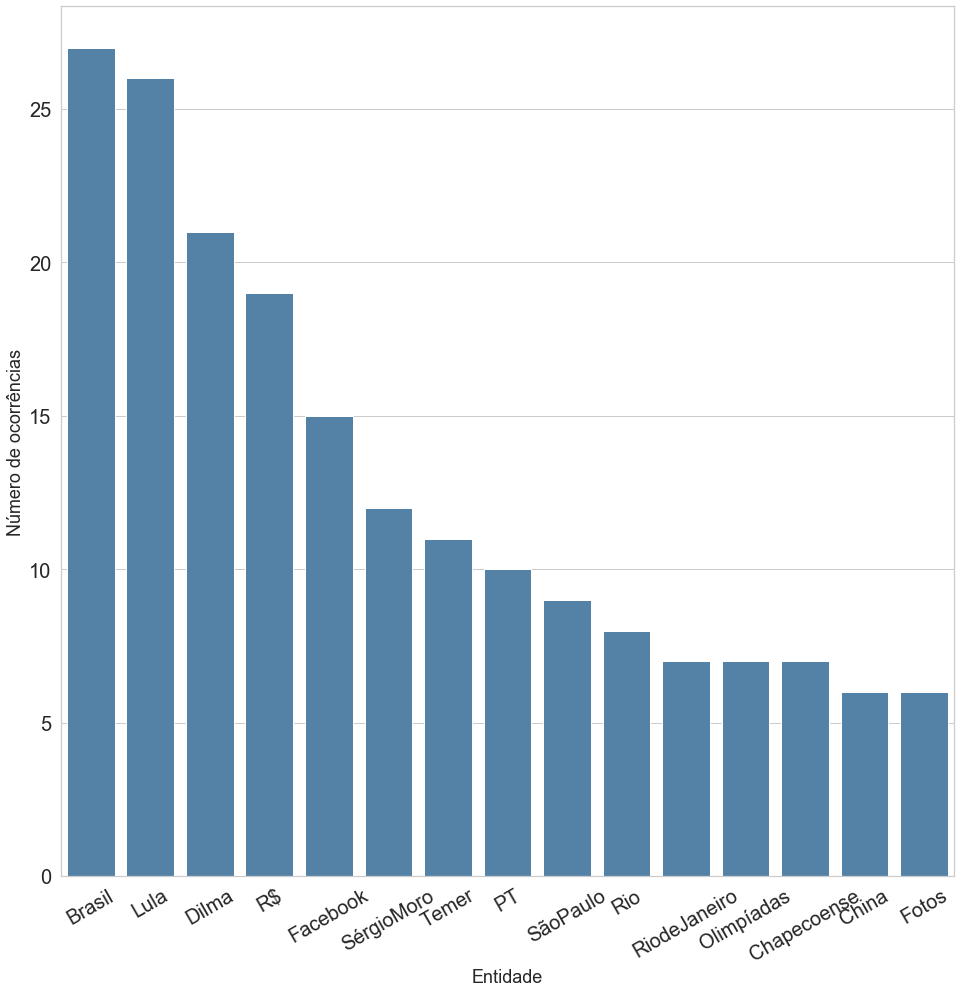

In [195]:
sns.set(style="whitegrid", font_scale=1.5)
## Conversion to Pandas series via Python Dictionary for easier plotting
fdist_2016 = pd.Series(dict(fdist_2016))
## Setting figure, ax into variables
fig, ax = plt.subplots(figsize=(16,16))
ax.set(xlabel='Entidade', ylabel='Número de ocorrências')
ax.yaxis.set_tick_params(labelsize = 20);
ax.xaxis.set_tick_params(labelsize = 20);
## Seaborn plotting using Pandas attributes + xtick rotation for ease of viewing
all_plot = sns.barplot(x=fdist_2016.index, y=fdist_2016.values, ax=ax, color="steelblue")
plt.xticks(rotation=30);

# OU

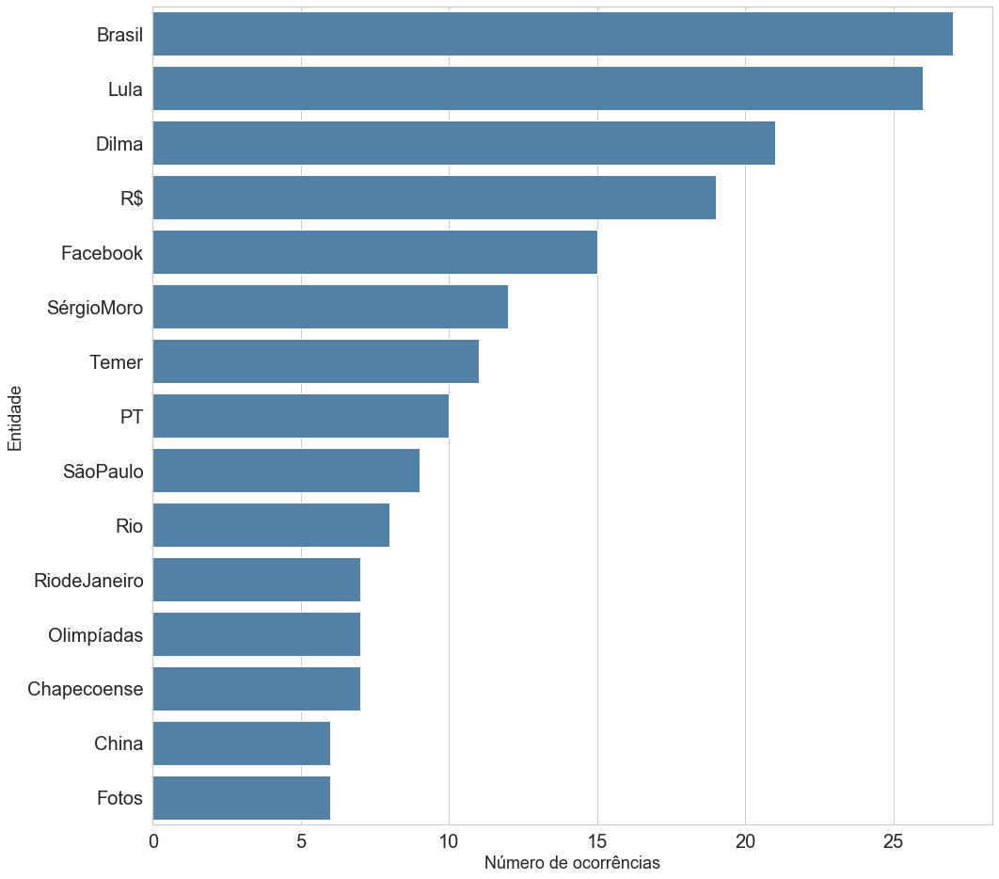

In [196]:
sns.set(style="whitegrid", font_scale=1.5)
## Conversion to Pandas series via Python Dictionary for easier plotting
fdist_2016 = pd.Series(dict(fdist_2016))
## Setting figure, ax into variables
fig, ax = plt.subplots(figsize=(16,16))
ax.set(xlabel='Número de ocorrências', ylabel='Entidade')
ax.yaxis.set_tick_params(labelsize = 20);
ax.xaxis.set_tick_params(labelsize = 20);
## Seaborn plotting using Pandas attributes + xtick rotation for ease of viewing
all_plot = sns.barplot(x=fdist_2016.values, y=fdist_2016.index, orient='h', ax=ax, color="steelblue")
plt.show();

##### - 2017

In [197]:
df_2017 = df_2017.reset_index(drop=True)
for i in range(0, len(df_2017['entities'])):
    df_2017['entities'][i] = df_2017['entities'][i].strip('[]').replace('"', '').replace(' ', '').split(',')

In [198]:
#Contagem de entidades
lista_palavras = []
for row in df_2017['entities']:
  if row != None:
      for i in row:
        if i!='':
            lista_palavras.append(i)
fdist = FreqDist(lista_palavras)
print(fdist.most_common(30))
fdist_2017 = fdist.most_common(15)

[('Brasil', 59), ('R$', 35), ('Lula', 29), ('WhatsApp', 26), ('SérgioMoro', 14), ('Facebook', 13), ('Globo', 13), ('BaleiaAzul', 12), ('Tiririca', 9), ('EUA', 9), ('Bolsonaro', 9), ('Boticário', 7), ('Temer', 7), ('JeanWyllys', 7), ('Rio', 6), ('PT', 6), ('Marisa', 6), ('Congresso', 6), ('Dilma', 6), ('Uber', 5), ('Justiça', 5), ('SãoPaulo', 5), ('SilvioSantos', 5), ('Previdência', 5), ('Curitiba', 5), ('Vídeo', 5), ('Coca-Cola', 5), ('Natal', 5), ('PablloVittar', 5), ('TeoriZavascki', 4)]


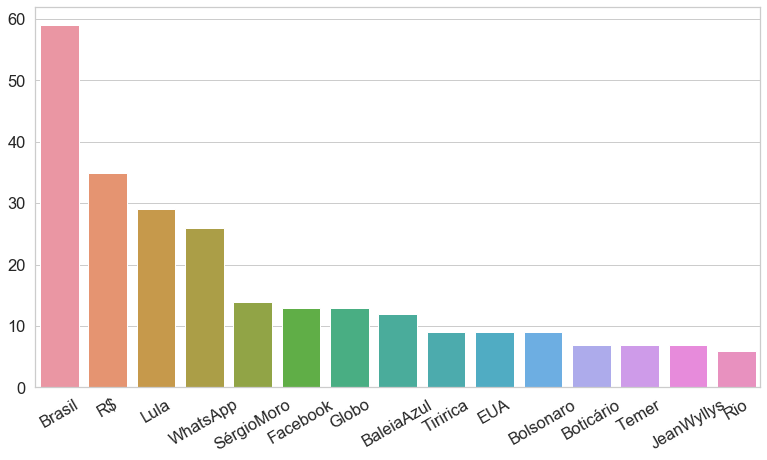

In [199]:
## Convertendo para Pandas series via Dicionário Python para um plot mais fácil
fdist_2017 = pd.Series(dict(fdist_2017))

## Setando figura, ax nas variáveis
fig, ax = plt.subplots(figsize=(13,7))

## Plotando com Seaborn usando atributos Pandas + xtick rotation para mais fácil visualização
all_plot = sns.barplot(x=fdist_2017.index, y=fdist_2017.values, ax=ax)
plt.xticks(rotation=30);

# SUBSTITUI GRÁFICO ACIMA

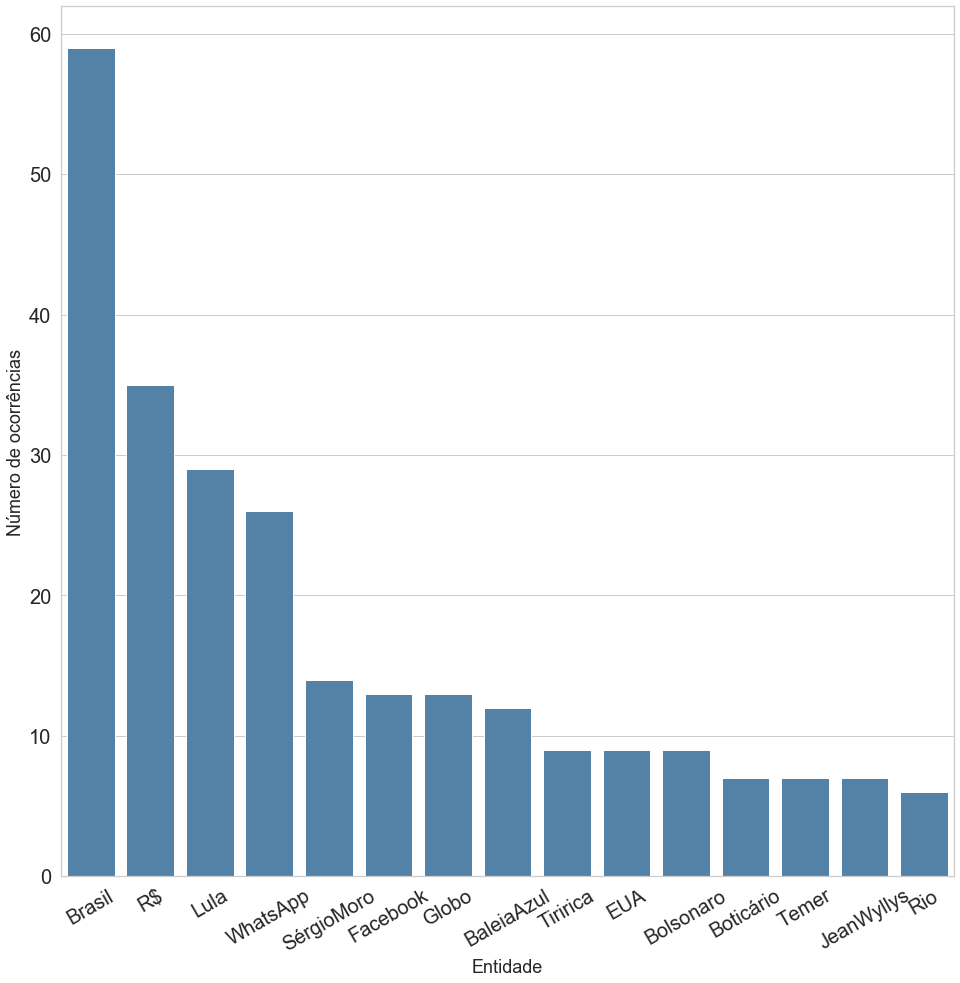

In [200]:
sns.set(style="whitegrid", font_scale=1.5)
## Conversion to Pandas series via Python Dictionary for easier plotting
fdist_2017 = pd.Series(dict(fdist_2017))
## Setting figure, ax into variables
fig, ax = plt.subplots(figsize=(16,16))
ax.set(xlabel='Entidade', ylabel='Número de ocorrências')
ax.yaxis.set_tick_params(labelsize = 20);
ax.xaxis.set_tick_params(labelsize = 20);
## Seaborn plotting using Pandas attributes + xtick rotation for ease of viewing
all_plot = sns.barplot(x=fdist_2017.index, y=fdist_2017.values, ax=ax, color="steelblue")
plt.xticks(rotation=30);

# OU

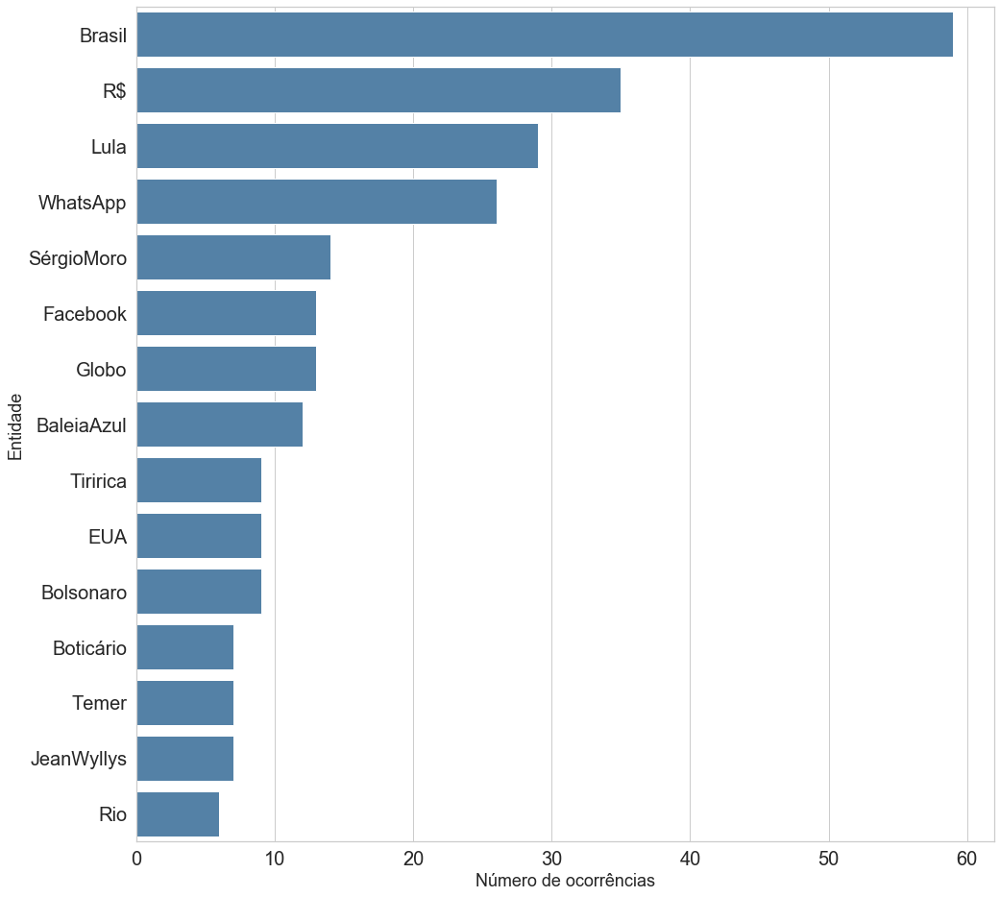

In [201]:
sns.set(style="whitegrid", font_scale=1.5)
## Conversion to Pandas series via Python Dictionary for easier plotting
fdist_2017 = pd.Series(dict(fdist_2017))
## Setting figure, ax into variables
fig, ax = plt.subplots(figsize=(16,16))
ax.set(xlabel='Número de ocorrências', ylabel='Entidade')
ax.yaxis.set_tick_params(labelsize = 20);
ax.xaxis.set_tick_params(labelsize = 20);
## Seaborn plotting using Pandas attributes + xtick rotation for ease of viewing
all_plot = sns.barplot(x=fdist_2017.values, y=fdist_2017.index, orient='h', ax=ax, color="steelblue")
plt.show();

##### - 2018

In [202]:
df_2018 = df_2018.reset_index(drop=True)
for i in range(0, len(df_2018['entities'])):
    df_2018['entities'][i] = df_2018['entities'][i].strip('[]').replace('"', '').replace(' ', '').split(',')

In [203]:
#Contagem de entidades
lista_palavras = []
for row in df_2018['entities']:
  if row != None:
      for i in row:
        if i!='':
            lista_palavras.append(i)
fdist = FreqDist(lista_palavras)
print(fdist.most_common(30))
fdist_2018 = fdist.most_common(15)

[('Bolsonaro', 110), ('Lula', 67), ('Brasil', 61), ('WhatsApp', 48), ('R$', 40), ('Haddad', 30), ('PT', 26), ('Globo', 17), ('Copa', 15), ('Vídeo', 15), ('Rio', 14), ('Venezuela', 11), ('SérgioMoro', 9), ('SP', 9), ('STF', 9), ('SãoPaulo', 8), ('EUA', 8), ('Rússia', 8), ('China', 8), ('Corinthians', 7), ('MG', 7), ('RiodeJaneiro', 7), ('JairBolsonaro', 7), ('Exército', 7), ('PapaFrancisco', 7), ('Bahia', 7), ('Natal', 7), ('PablloVittar', 6), ('Facebook', 6), ('MarielleFranco', 6)]


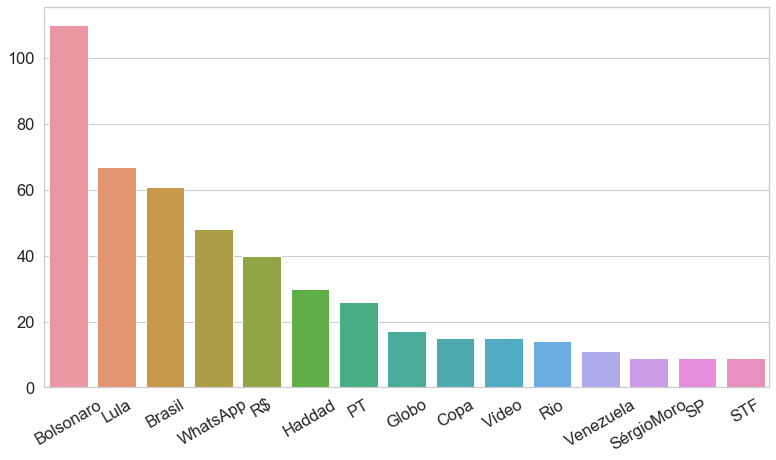

In [204]:
## Convertendo para Pandas series via Dicionário Python para um plot mais fácil
fdist_2018 = pd.Series(dict(fdist_2018))

## Setando figura, ax nas variáveis
fig, ax = plt.subplots(figsize=(13,7))

## Plotando com Seaborn usando atributos Pandas + xtick rotation para mais fácil visualização
all_plot = sns.barplot(x=fdist_2018.index, y=fdist_2018.values, ax=ax)
plt.xticks(rotation=30);

# SUBSTITUI GRÁFICO ACIMA

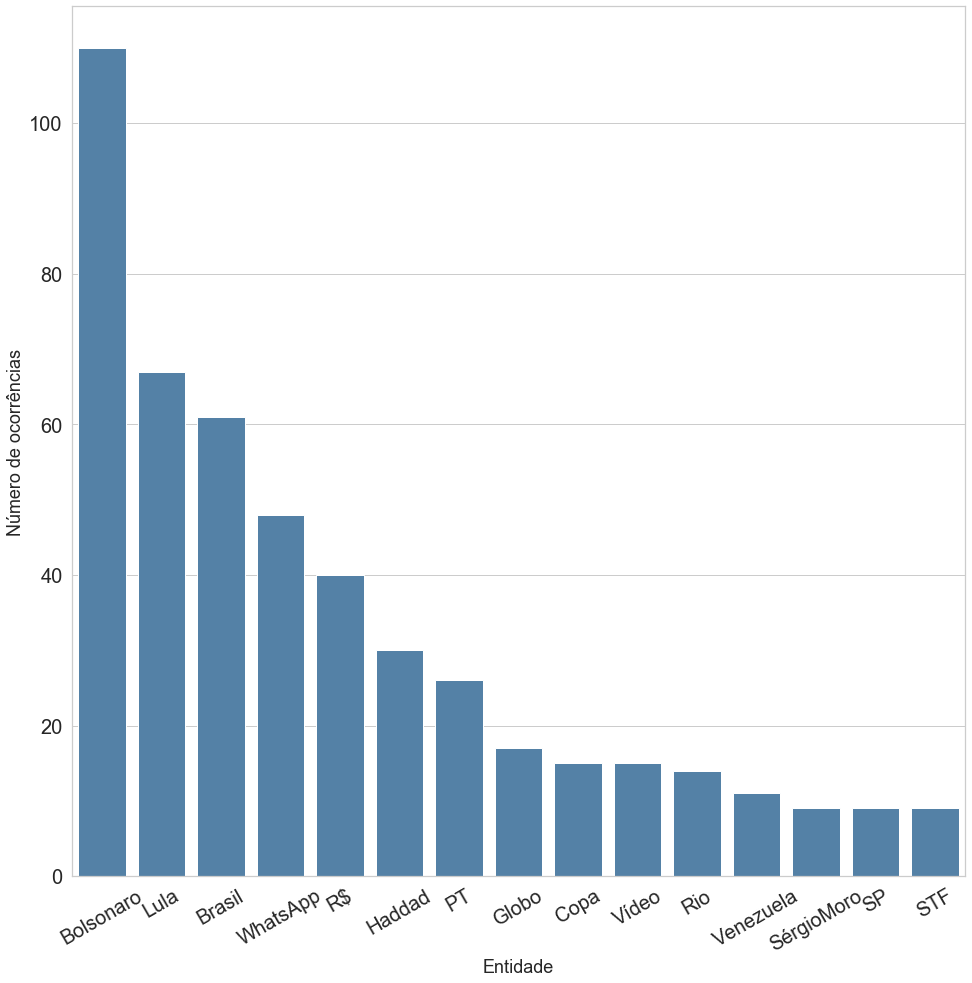

In [205]:
sns.set(style="whitegrid", font_scale=1.5)
## Conversion to Pandas series via Python Dictionary for easier plotting
fdist_2018 = pd.Series(dict(fdist_2018))
## Setting figure, ax into variables
fig, ax = plt.subplots(figsize=(16,16))
ax.set(xlabel='Entidade', ylabel='Número de ocorrências')
ax.yaxis.set_tick_params(labelsize = 20);
ax.xaxis.set_tick_params(labelsize = 20);
## Seaborn plotting using Pandas attributes + xtick rotation for ease of viewing
all_plot = sns.barplot(x=fdist_2018.index, y=fdist_2018.values, ax=ax, color="steelblue")
plt.xticks(rotation=30);

# OU

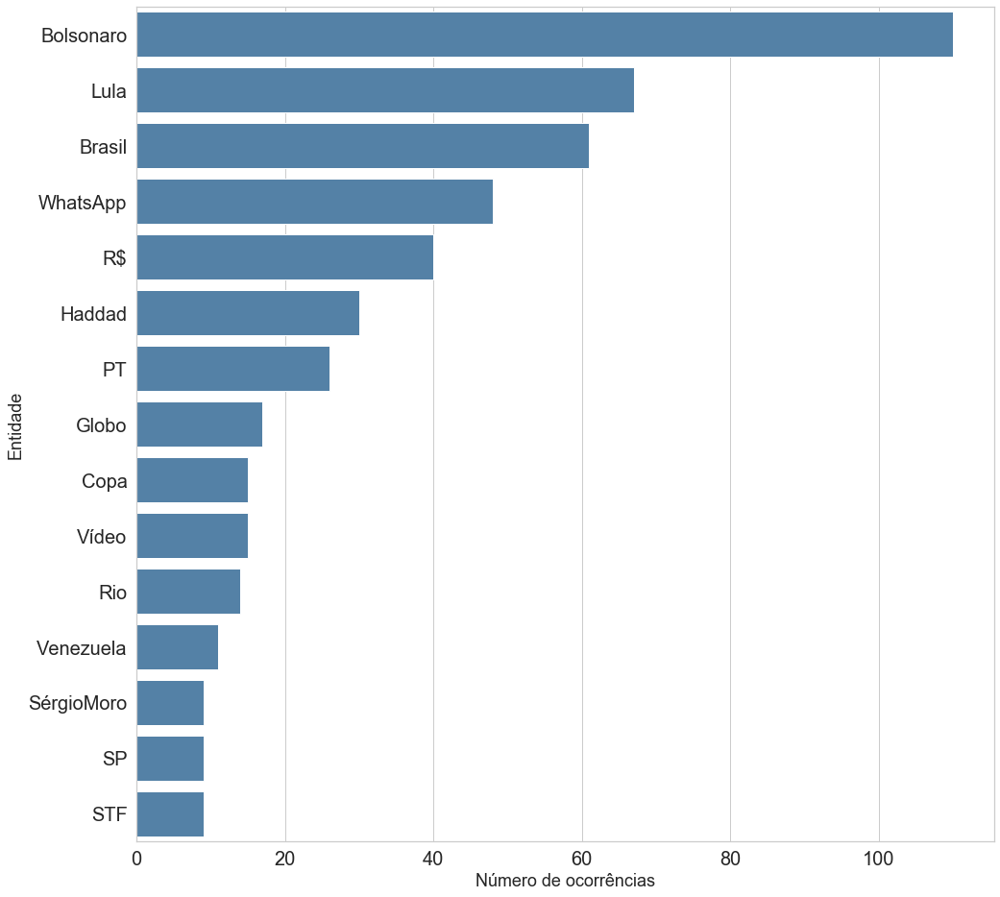

In [206]:
sns.set(style="whitegrid", font_scale=1.5)
## Conversion to Pandas series via Python Dictionary for easier plotting
fdist_2018 = pd.Series(dict(fdist_2018))
## Setting figure, ax into variables
fig, ax = plt.subplots(figsize=(16,16))
ax.set(xlabel='Número de ocorrências', ylabel='Entidade')
ax.yaxis.set_tick_params(labelsize = 20);
ax.xaxis.set_tick_params(labelsize = 20);
## Seaborn plotting using Pandas attributes + xtick rotation for ease of viewing
all_plot = sns.barplot(x=fdist_2018.values, y=fdist_2018.index, orient='h', ax=ax, color="steelblue")
plt.show();

##### - 2019

In [207]:
df_2019 = df_2019.reset_index(drop=True)
for i in range(0, len(df_2019['entities'])):
    df_2019['entities'][i] = df_2019['entities'][i].strip('[]').replace('"', '').replace(' ', '').split(',')

In [208]:
#Contagem de entidades
lista_palavras = []
for row in df_2019['entities']:
  if row != None:
      for i in row:
        if i!='':
            lista_palavras.append(i)
fdist = FreqDist(lista_palavras)
print(fdist.most_common(30))
fdist_2019 = fdist.most_common(15)

[('Bolsonaro', 100), ('Lula', 58), ('WhatsApp', 48), ('Brasil', 46), ('STF', 29), ('R$', 25), ('PT', 25), ('Amazônia', 21), ('Flamengo', 20), ('Globo', 17), ('Venezuela', 16), ('Vídeo', 13), ('Nordeste', 12), ('EUA', 11), ('RiodeJaneiro', 11), ('Brumadinho', 9), ('Rio', 9), ('Dilma', 9), ('Twitter', 9), ('Facebook', 9), ('PSOL', 8), ('Libertadores', 8), ('Boticário', 7), ('Previdência', 7), ('Marielle', 7), ('Curitiba', 7), ('Moro', 7), ('França', 7), ('Fotos', 6), ('SP', 6)]


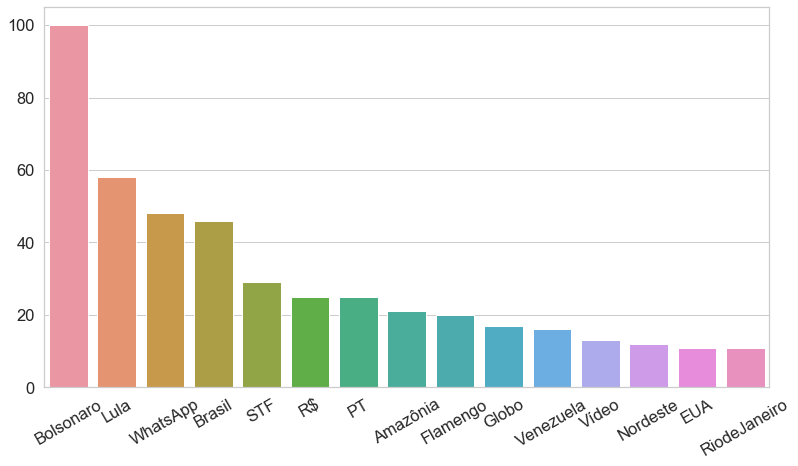

In [209]:
## Convertendo para Pandas series via Dicionário Python para um plot mais fácil
fdist_2019 = pd.Series(dict(fdist_2019))

## Setando figura, ax nas variáveis
fig, ax = plt.subplots(figsize=(13,7))

## Plotando com Seaborn usando atributos Pandas + xtick rotation para mais fácil visualização
all_plot = sns.barplot(x=fdist_2019.index, y=fdist_2019.values, ax=ax)
plt.xticks(rotation=30);

# SUBSTITUI GRÁFICO ACIMA

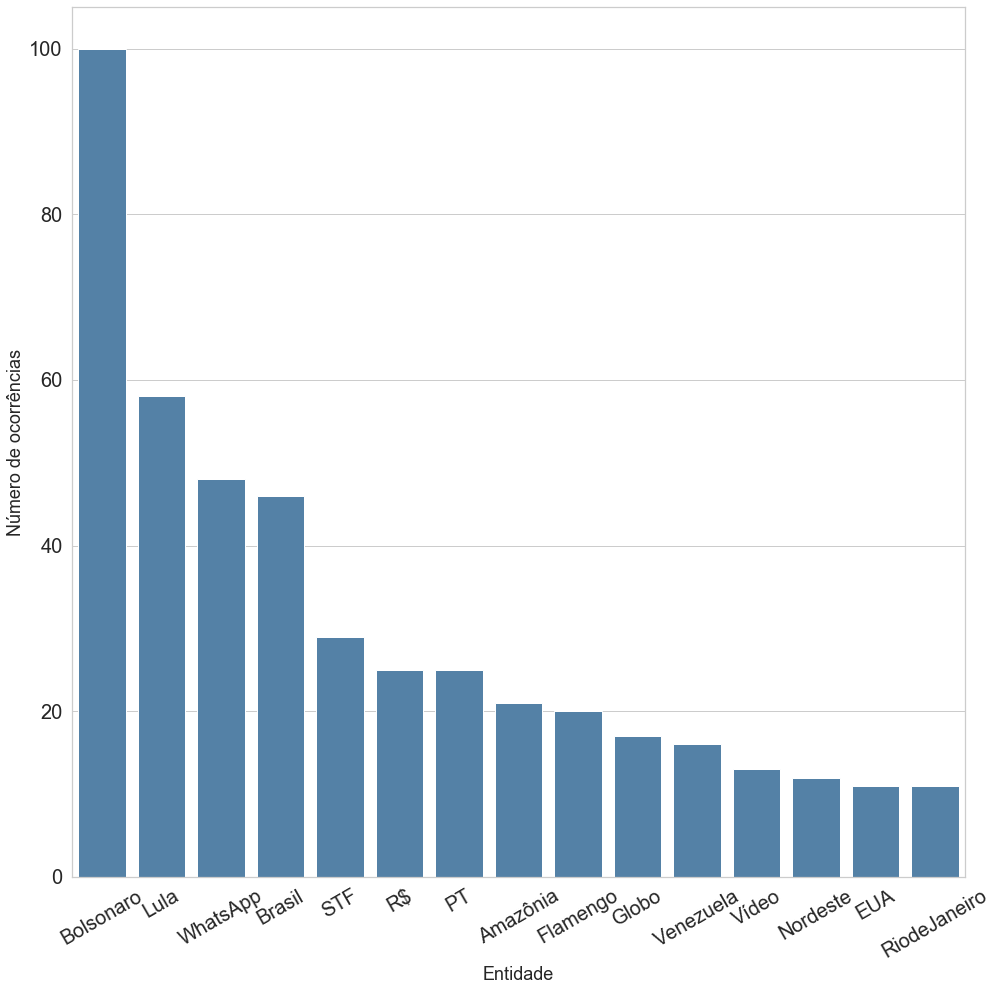

In [210]:
sns.set(style="whitegrid", font_scale=1.5)
## Conversion to Pandas series via Python Dictionary for easier plotting
fdist_2019 = pd.Series(dict(fdist_2019))
## Setting figure, ax into variables
fig, ax = plt.subplots(figsize=(16,16))
ax.set(xlabel='Entidade', ylabel='Número de ocorrências')
ax.yaxis.set_tick_params(labelsize = 20);
ax.xaxis.set_tick_params(labelsize = 20);
## Seaborn plotting using Pandas attributes + xtick rotation for ease of viewing
all_plot = sns.barplot(x=fdist_2019.index, y=fdist_2019.values, ax=ax, color="steelblue")
plt.xticks(rotation=30);

# OU

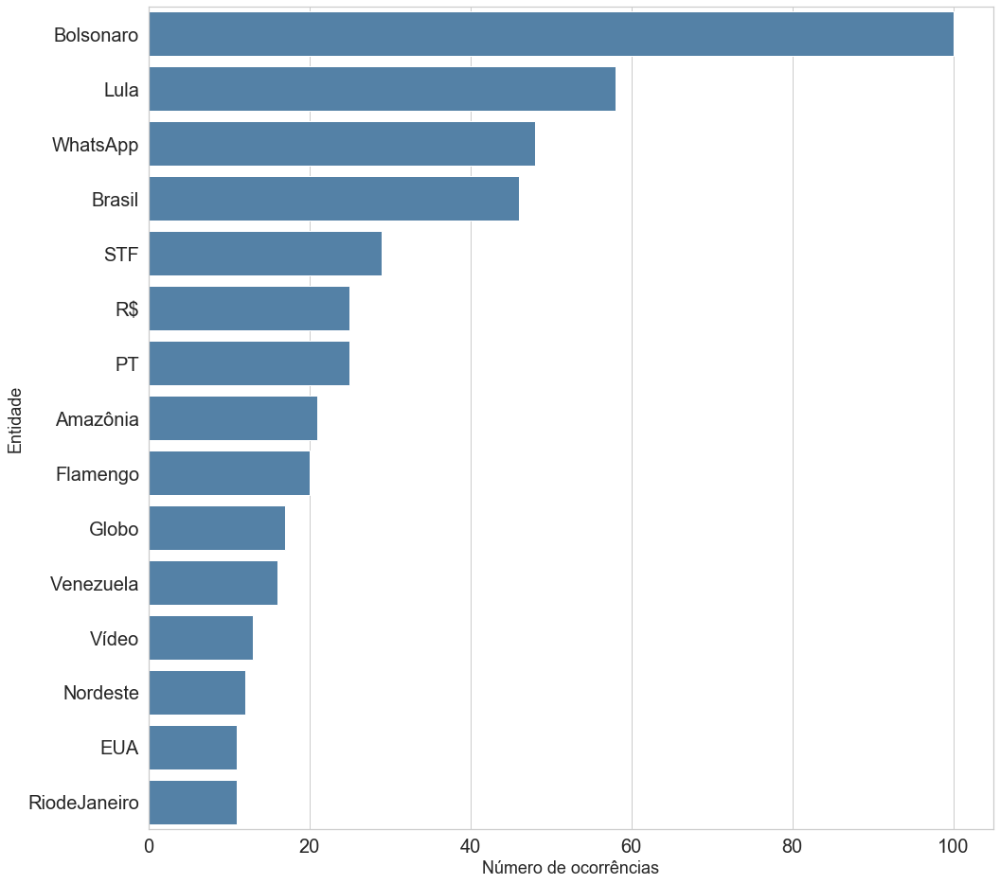

In [211]:
sns.set(style="whitegrid", font_scale=1.5)
## Conversion to Pandas series via Python Dictionary for easier plotting
fdist_2019 = pd.Series(dict(fdist_2019))
## Setting figure, ax into variables
fig, ax = plt.subplots(figsize=(16,16))
ax.set(xlabel='Número de ocorrências', ylabel='Entidade')
ax.yaxis.set_tick_params(labelsize = 20);
ax.xaxis.set_tick_params(labelsize = 20);
## Seaborn plotting using Pandas attributes + xtick rotation for ease of viewing
all_plot = sns.barplot(x=fdist_2019.values, y=fdist_2019.index, orient='h', ax=ax, color="steelblue")
plt.show();

##### - 2020

In [212]:
df_2020 = df_2020.reset_index(drop=True)
for i in range(0, len(df_2020['entities'])):
    df_2020['entities'][i] = df_2020['entities'][i].strip('[]').replace('"', '').replace(' ', '').split(',')

In [213]:
#Contagem de entidades
lista_palavras = []
for row in df_2020['entities']:
  if row != None:
      for i in row:
        if i!='':
            lista_palavras.append(i)
fdist = FreqDist(lista_palavras)
print(fdist.most_common(30))
fdist_2020 = fdist.most_common(15)

[('Covid-19', 143), ('Bolsonaro', 112), ('China', 66), ('Brasil', 64), ('R$', 48), ('WhatsApp', 37), ('STF', 29), ('Lula', 28), ('EUA', 28), ('SãoPaulo', 16), ('PT', 15), ('SP', 14), ('Globo', 14), ('Facebook', 14), ('RiodeJaneiro', 13), ('Doria', 13), ('Trump', 11), ('Argentina', 11), ('OMS', 11), ('Vídeo', 10), ('Itália', 10), ('RodrigoMaia', 10), ('PapaFrancisco', 9), ('Austrália', 8), ('Justiça', 8), ('PF', 8), ('França', 8), ('PSOL', 8), ('Moro', 7), ('Dra', 7)]


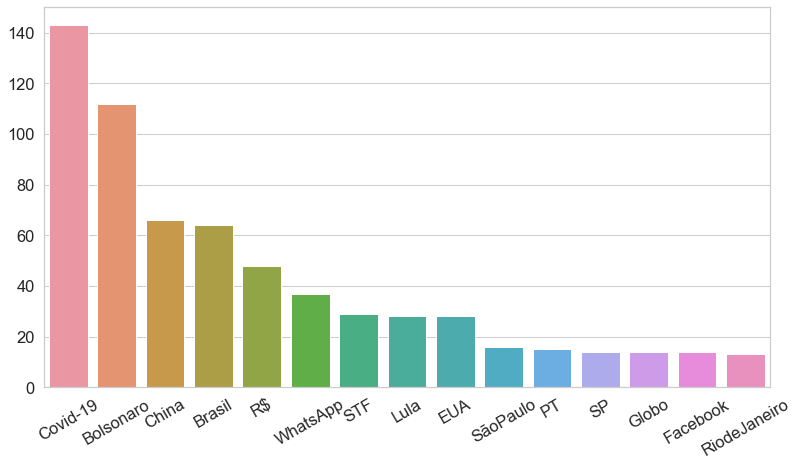

In [214]:
## Convertendo para Pandas series via Dicionário Python para um plot mais fácil
fdist_2020 = pd.Series(dict(fdist_2020))

## Setando figura, ax nas variáveis
fig, ax = plt.subplots(figsize=(13,7))

## Plotando com Seaborn usando atributos Pandas + xtick rotation para mais fácil visualização
all_plot = sns.barplot(x=fdist_2020.index, y=fdist_2020.values, ax=ax)
plt.xticks(rotation=30);

# SUBSTITUI GRÁFICO ACIMA

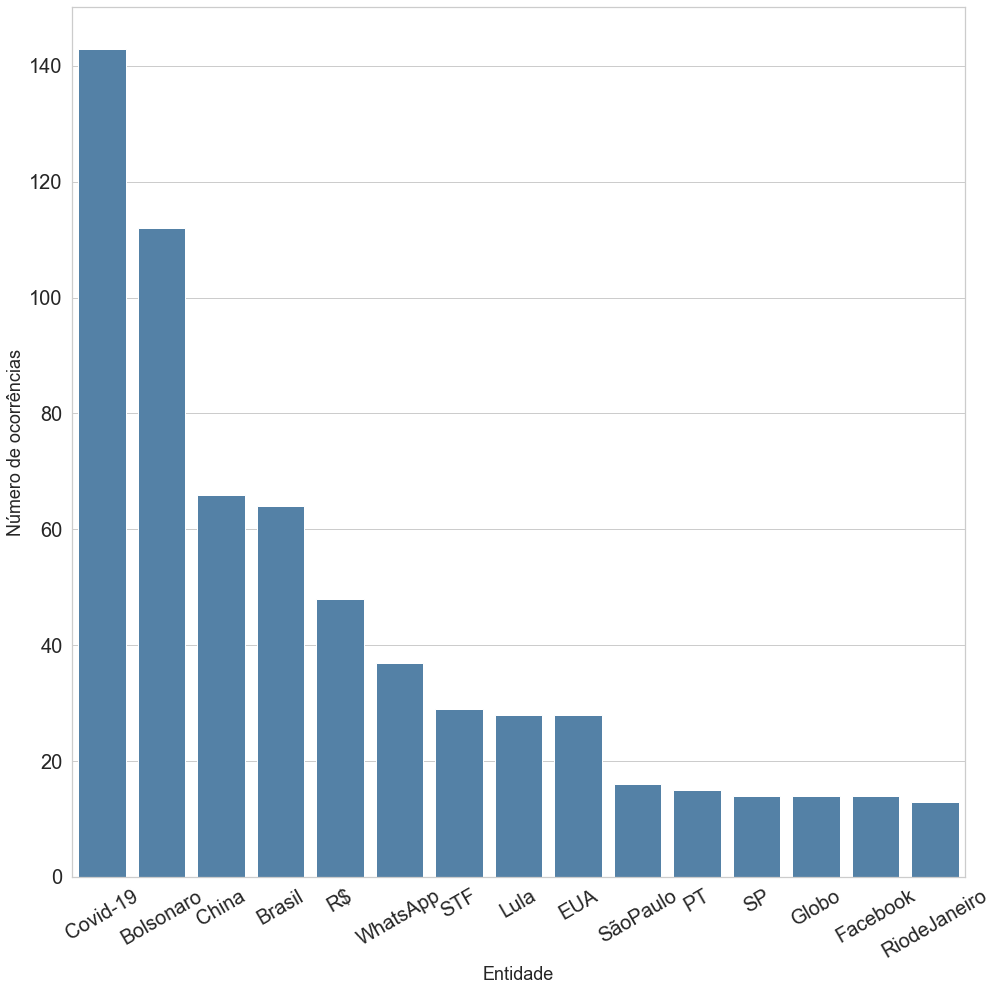

In [215]:
sns.set(style="whitegrid", font_scale=1.5)
## Conversion to Pandas series via Python Dictionary for easier plotting
fdist_2020 = pd.Series(dict(fdist_2020))
## Setting figure, ax into variables
fig, ax = plt.subplots(figsize=(16,16))
ax.set(xlabel='Entidade', ylabel='Número de ocorrências')
ax.yaxis.set_tick_params(labelsize = 20);
ax.xaxis.set_tick_params(labelsize = 20);
## Seaborn plotting using Pandas attributes + xtick rotation for ease of viewing
all_plot = sns.barplot(x=fdist_2020.index, y=fdist_2020.values, ax=ax, color="steelblue")
plt.xticks(rotation=30);

# OU

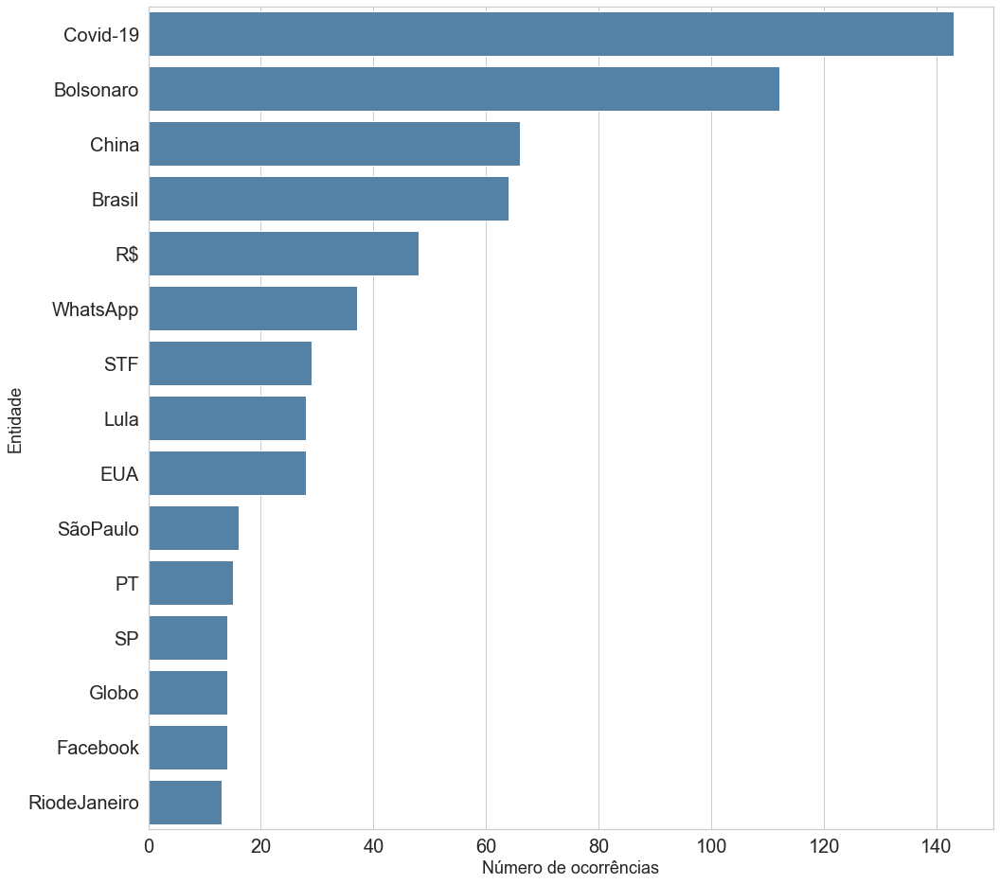

In [216]:
sns.set(style="whitegrid", font_scale=1.5)
## Conversion to Pandas series via Python Dictionary for easier plotting
fdist_2020 = pd.Series(dict(fdist_2020))
## Setting figure, ax into variables
fig, ax = plt.subplots(figsize=(16,16))
ax.set(xlabel='Número de ocorrências', ylabel='Entidade')
ax.yaxis.set_tick_params(labelsize = 20);
ax.xaxis.set_tick_params(labelsize = 20);
## Seaborn plotting using Pandas attributes + xtick rotation for ease of viewing
all_plot = sns.barplot(x=fdist_2020.values, y=fdist_2020.index, orient='h', ax=ax, color="steelblue")
plt.show();

##### - 2021

In [217]:
df_2021 = df_2021.reset_index(drop=True)
for i in range(0, len(df_2021['entities'])):
    df_2021['entities'][i] = df_2021['entities'][i].strip('[]').replace('"', '').replace(' ', '').split(',')

In [218]:
#Contagem de entidades
lista_palavras = []
for row in df_2021['entities']:
  if row != None:
      for i in row:
        if i!='':
            lista_palavras.append(i)
fdist = FreqDist(lista_palavras)
print(fdist.most_common(30))
fdist_2021 = fdist.most_common(15)

[('Covid-19', 114), ('Bolsonaro', 52), ('WhatsApp', 42), ('Brasil', 29), ('Lula', 21), ('R$', 19), ('Coronavac', 15), ('China', 14), ('STF', 13), ('Vídeo', 10), ('Pfizer', 9), ('SãoPaulo', 9), ('Doria', 8), ('PT', 8), ('EUA', 8), ('Cuba', 7), ('Argentina', 6), ('Facebook', 6), ('Manaus', 6), ('OMS', 6), ('JoséDirceu', 5), ('Venezuela', 5), ('iPhone', 5), ('Globo', 5), ('AlexandredeMoraes', 5), ('Anvisa', 4), ('JoãoDoria', 4), ('Amazonas', 4), ('Bahia', 4), ('SP', 4)]


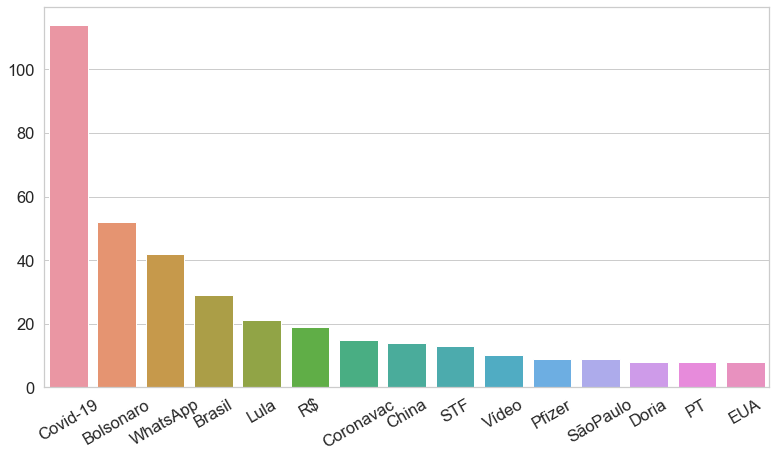

In [219]:
## Convertendo para Pandas series via Dicionário Python para um plot mais fácil
fdist_2021 = pd.Series(dict(fdist_2021))

## Setando figura, ax nas variáveis
fig, ax = plt.subplots(figsize=(13,7))

## Plotando com Seaborn usando atributos Pandas + xtick rotation para mais fácil visualização
all_plot = sns.barplot(x=fdist_2021.index, y=fdist_2021.values, ax=ax)
plt.xticks(rotation=30);

# SUBSTITUI GRÁFICO ACIMA

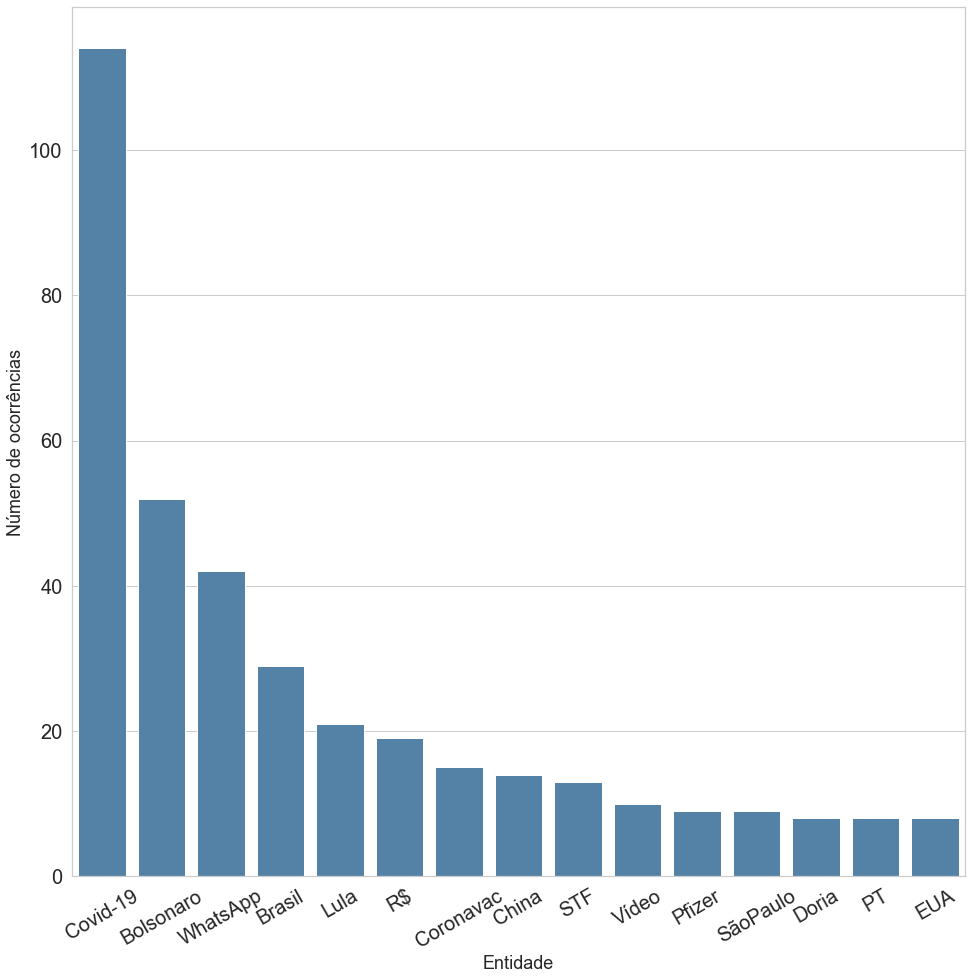

In [220]:
sns.set(style="whitegrid", font_scale=1.5)
## Conversion to Pandas series via Python Dictionary for easier plotting
fdist_2021 = pd.Series(dict(fdist_2021))
## Setting figure, ax into variables
fig, ax = plt.subplots(figsize=(16,16))
ax.set(xlabel='Entidade', ylabel='Número de ocorrências')
ax.yaxis.set_tick_params(labelsize = 20);
ax.xaxis.set_tick_params(labelsize = 20);
## Seaborn plotting using Pandas attributes + xtick rotation for ease of viewing
all_plot = sns.barplot(x=fdist_2021.index, y=fdist_2021.values, ax=ax, color="steelblue")
plt.xticks(rotation=30);

# OU

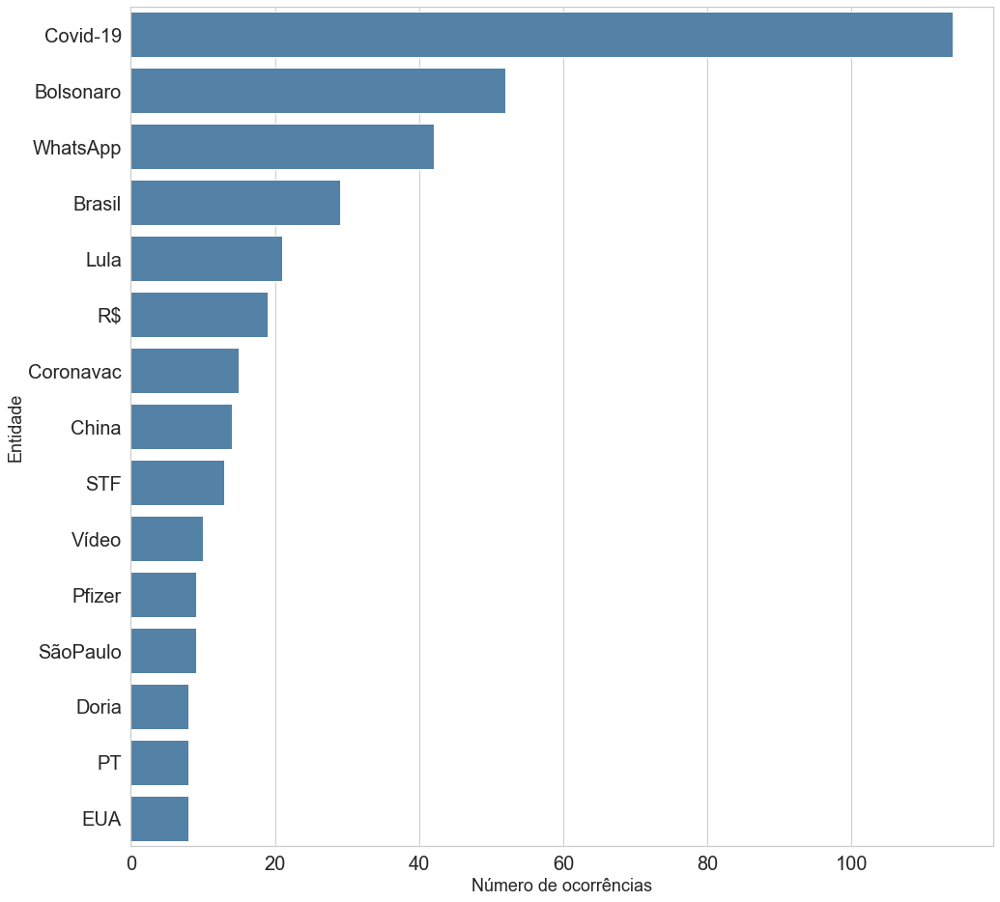

In [221]:
sns.set(style="whitegrid", font_scale=1.5)
## Conversion to Pandas series via Python Dictionary for easier plotting
fdist_2021 = pd.Series(dict(fdist_2021))
## Setting figure, ax into variables
fig, ax = plt.subplots(figsize=(16,16))
ax.set(xlabel='Número de ocorrências', ylabel='Entidade')
ax.yaxis.set_tick_params(labelsize = 20);
ax.xaxis.set_tick_params(labelsize = 20);
## Seaborn plotting using Pandas attributes + xtick rotation for ease of viewing
all_plot = sns.barplot(x=fdist_2021.values, y=fdist_2021.index, orient='h', ax=ax, color="steelblue")
plt.show();

### Análise de entidades das notícias por categoria

#### Distribuição de entidades de notícias por categoria/ano

##### - 2013,2014 e 2015

Brasil 

[('Brasil', 8), ('', 4), ('Globo', 2), ('Mega-Sena', 2), ('NatanaelBúfalo', 1), ('Senha', 1), ('Agudos-SP', 1), ('RoyalCanin', 1), ('InstitutoRoyal', 1), ('AshleyFlores', 1), ('Marcola', 1), ('OGlobo', 1), ('Fotomontagem', 1), ('RioGrandedoNorte', 1), ('Ceará', 1), ('Bloquinhos', 1), ('GAP', 1), ('CriançaEsperança', 1), ('Unesco', 1), ('TAM', 1), ('SãoPaulo', 1), ('Mensagem', 1), ('DefesaCivil', 1), ('Juiz', 1), ('McDonald’s', 1), ('Detran', 1), ('SuzaneVonRichthofen', 1), ('Juíza', 1), ('FernandinhoBeira-Mar', 1), ('Travesti', 1)] 

Política 

[('Lula', 5), ('', 3), ('EduardoCampos', 3), ('CirqueduSoleil', 2), ('PT', 2), ('JeanWyllys', 2), ('Bíblia', 2), ('Lulinha', 1), ('Fazenda', 1), ('Gulfstream', 1), ('Leia', 1), ('Briga', 1), ('LuizCláudio', 1), ('Mensagem', 1), ('LuizClaudioLuladaSilva', 1), ('DilmaRousseff', 1), ('Pará', 1), ('Senado', 1), ('R$', 1), ('FotodeLula', 1), ('StevenSeagal', 1), ('ForaDilma', 1), ('CapadaVeja', 1), ('JoaquimBarbosa', 1), ('CâmaradosDeputados

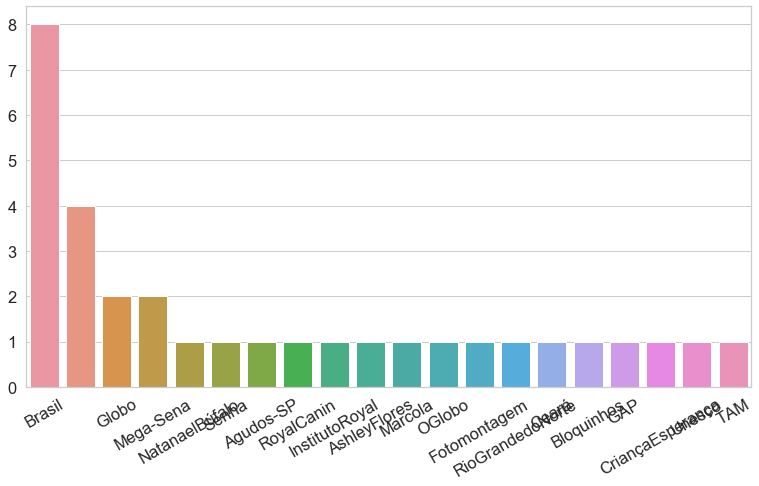

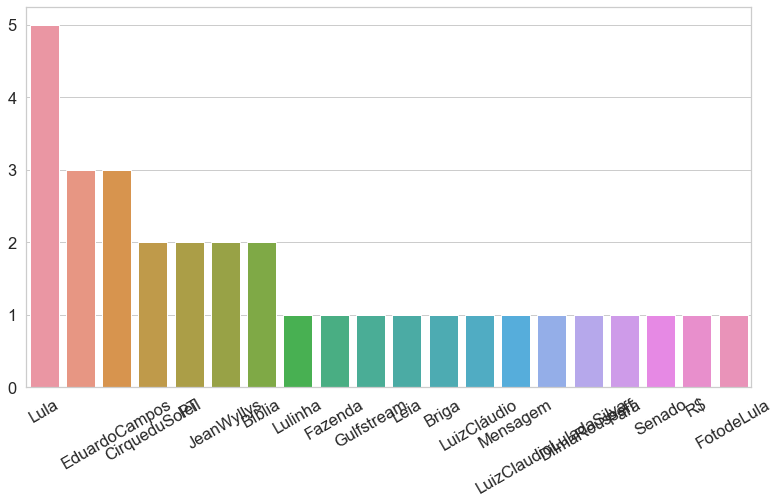

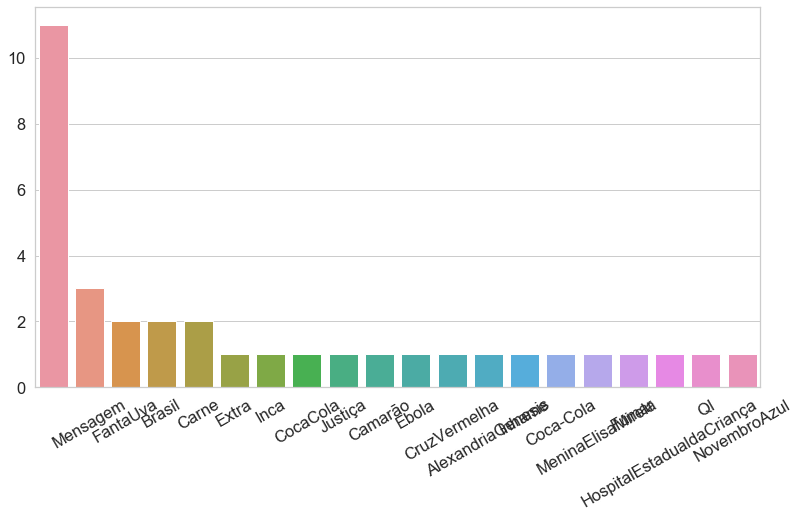

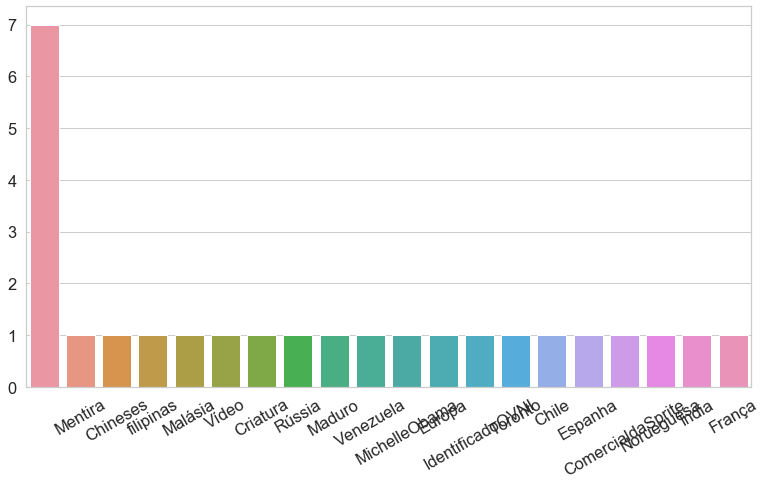

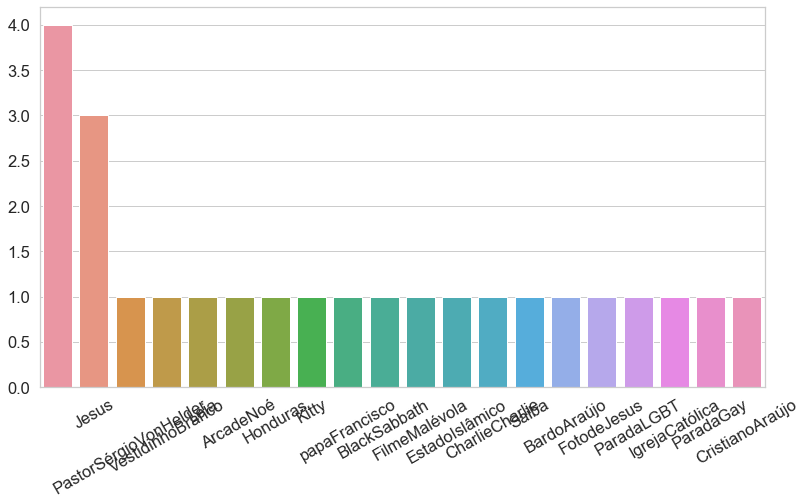

...

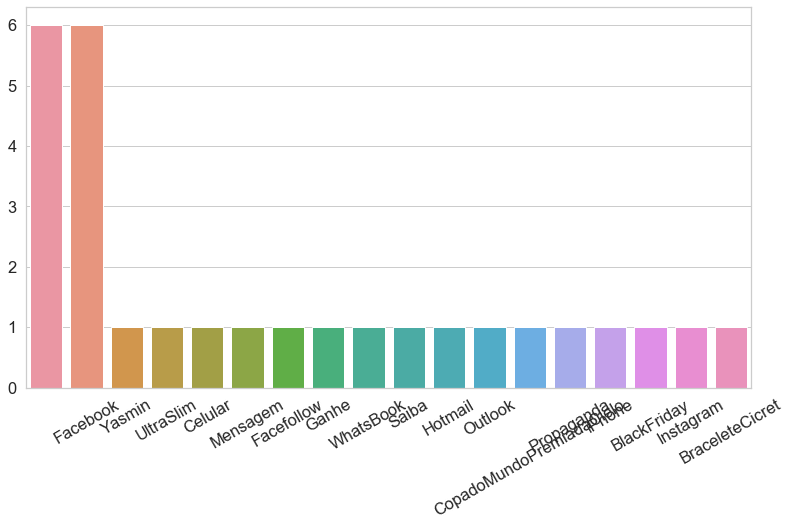

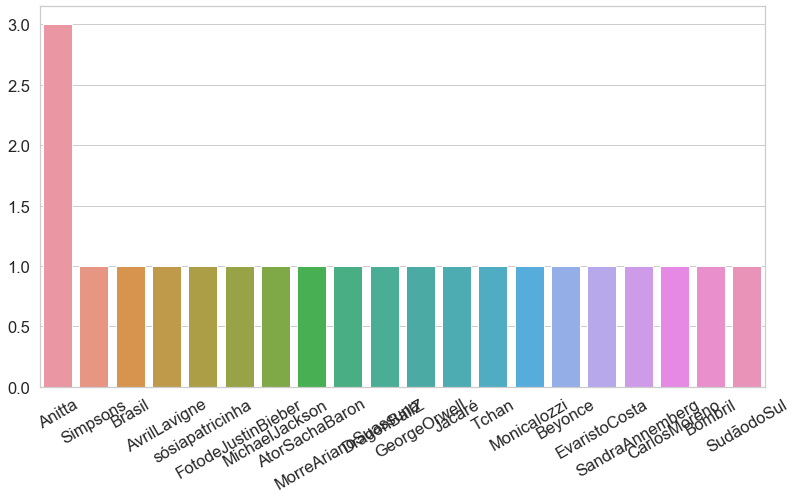

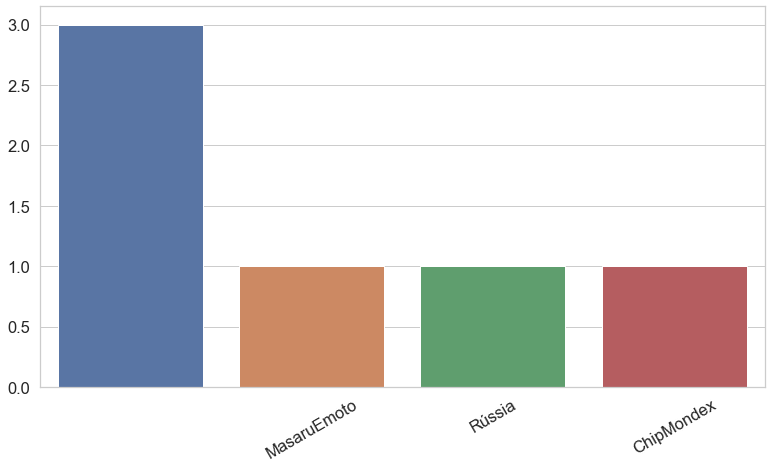

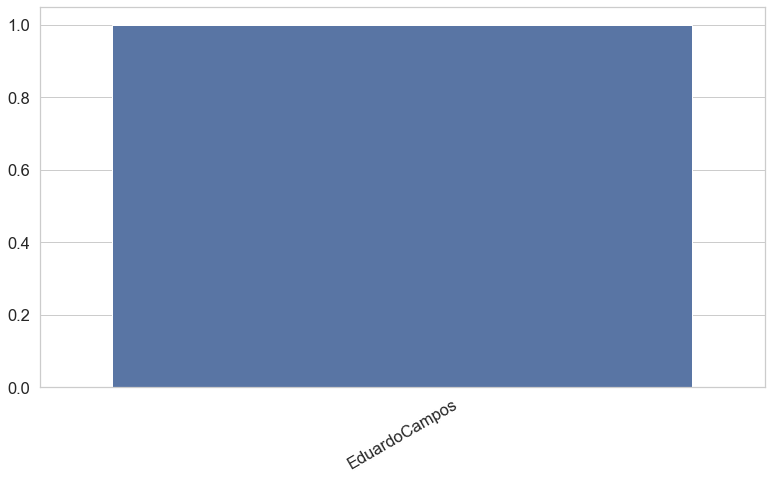

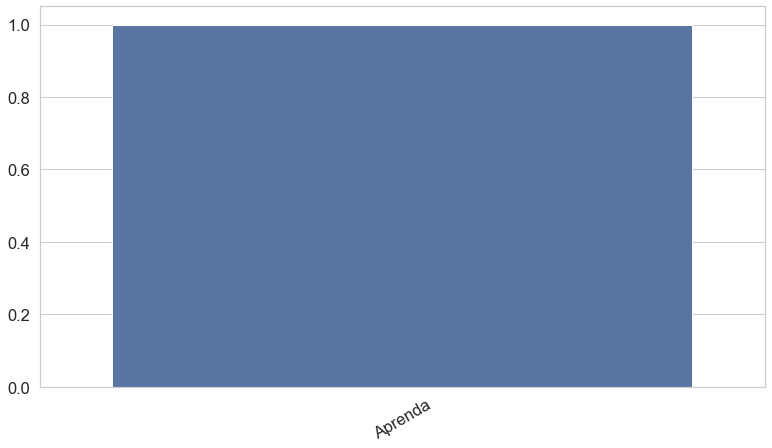

In [222]:
list_categories = list(df_antes_2016['category'].value_counts().index)
lista_palavras = []
lista_auxiliar=[]
for category in list_categories:
    for i in range(0, len(df_antes_2016['entities'])):
      if df_antes_2016['entities'][i] != None and df_antes_2016['category'][i] == category:
          lista_auxiliar.extend(df_antes_2016['entities'][i])
    lista_palavras.append(category)
    lista_palavras.append(lista_auxiliar)
    lista_auxiliar=[]
for i in range(0, len(lista_palavras)):
    if i%2 == 0:
        print(lista_palavras[i],'\n')
        fdist = FreqDist(lista_palavras[i+1])
        print(fdist.most_common(30),'\n')
        ##Pegando fdist para o plot
        fdist_antes2016 = fdist.most_common(20)
        ## Convertendo para Pandas series via Dicionário Python para um plot mais fácil
        fdist_antes2016 = pd.Series(dict(fdist_antes2016))
        ## Setando figura, ax nas variáveis
        fig, ax = plt.subplots(figsize=(13,7))
        ## Plotando com Seaborn usando atributos Pandas + xtick rotation para mais fácil visualização
        all_plot = sns.barplot(x=fdist_antes2016.index, y=fdist_antes2016.values, ax=ax)
        plt.xticks(rotation=30);

##### - 2016

In [223]:
list_categories = list(df_2016['category'].value_counts().index)
lista_palavras = []
lista_auxiliar=[]
for category in list_categories:
    for i in range(0, len(df_2016['entities'])):
      if df_2016['entities'][i] != None and df_2016['category'][i] == category:
          lista_auxiliar.extend(df_2016['entities'][i])
    lista_palavras.append(category)
    lista_palavras.append(lista_auxiliar)
    lista_auxiliar=[]
for i in range(0, len(lista_palavras)):
    if i%2 == 0:
        print(lista_palavras[i],'\n')
        fdist = FreqDist(lista_palavras[i+1])
        print(fdist.most_common(30),'\n')

Política 

[('Lula', 22), ('Dilma', 19), ('SérgioMoro', 11), ('Brasil', 10), ('PT', 10), ('', 9), ('Temer', 9), ('R$', 7), ('LavaJato', 5), ('JeanWyllys', 5), ('Bolsonaro', 4), ('RenanCalheiros', 3), ('Globo', 3), ('PSDB', 3), ('Moro', 3), ('EUA', 3), ('Deputados', 3), ('Cuba', 3), ('PF', 3), ('Rússia', 2), ('MariadoRosário', 2), ('Leitão', 2), ('RobertoCarlos', 2), ('JoaquimBarbosa', 2), ('CharlieHebdo', 2), ('Tiririca', 2), ('STF', 2), ('RJ', 2), ('Obama', 2), ('Abin', 2)] 

Brasil 

[('', 28), ('R$', 6), ('Brasil', 5), ('SãoPaulo', 4), ('RiodeJaneiro', 4), ('MG', 3), ('Facebook', 3), ('GVT', 3), ('Lula', 3), ('Brasília', 2), ('Mulher', 2), ('Temer', 2), ('Rio', 2), ('AnnaLaura', 2), ('Recife', 2), ('PQP', 1), ('BelaVistadeMinas', 1), ('Hilux2016', 1), ('Civic2017', 1), ('Menina', 1), ('LanchonetedoGeo', 1), ('Paraíba', 1), ('BeloMonte', 1), ('DomínioPúblico', 1), ('Carros', 1), ('Lobisomem', 1), ('Taubaté', 1), ('MundoNovo', 1), ('Celular', 1), ('Pernambuco', 1)] 

Entretenimento 



##### - 2017

In [224]:
list_categories = list(df_2017['category'].value_counts().index)
lista_palavras = []
lista_auxiliar=[]
for category in list_categories:
    for i in range(0, len(df_2017['entities'])):
      if df_2017['entities'][i] != None and df_2017['category'][i] == category:
          lista_auxiliar.extend(df_2017['entities'][i])
    lista_palavras.append(category)
    lista_palavras.append(lista_auxiliar)
    lista_auxiliar=[]
for i in range(0, len(lista_palavras)):
    if i%2 == 0:
        print(lista_palavras[i],'\n')
        fdist = FreqDist(lista_palavras[i+1])
        print(fdist.most_common(30),'\n')

Brasil 

[('', 39), ('Brasil', 24), ('R$', 11), ('BaleiaAzul', 7), ('WhatsApp', 6), ('Rio', 5), ('Facebook', 4), ('SérgioMoro', 4), ('Uber', 3), ('EspíritoSanto', 3), ('Mulher', 3), ('Previdência', 3), ('Coca-Cola', 3), ('Janaúba', 3), ('Campinas', 2), ('PCC', 2), ('SãoPaulo', 2), ('CNH', 2), ('FGTS', 2), ('Cobra', 2), ('Goiás', 2), ('Idade', 2), ('Ceará', 2), ('ConselhoTutelar', 2), ('MariaEduarda', 2), ('RiodeJaneiro', 2), ('Curitiba', 2), ('Vídeo', 2), ('Compartilhe', 2), ('Ladrões', 2)] 

Política 

[('Lula', 28), ('Brasil', 12), ('R$', 11), ('Tiririca', 9), ('SérgioMoro', 8), ('', 8), ('Bolsonaro', 7), ('PT', 6), ('Dilma', 6), ('Globo', 6), ('Temer', 6), ('Marisa', 5), ('JeanWyllys', 5), ('MariadoRosário', 4), ('Congresso', 4), ('MichelTemer', 4), ('JBS', 4), ('JairBolsonaro', 4), ('TeoriZavascki', 3), ('Lava-Jato', 3), ('Teori', 3), ('Odebrecht', 3), ('Curitiba', 3), ('Brasília', 3), ('AécioNeves', 3), ('EUA', 3), ('Deus', 3), ('LavaJato', 3), ('CármenLúcia', 2), ('SargentoMarcon

##### - 2018

In [225]:
list_categories = list(df_2018['category'].value_counts().index)
lista_palavras = []
lista_auxiliar=[]
for category in list_categories:
    for i in range(0, len(df_2018['entities'])):
      if df_2018['entities'][i] != None and df_2018['category'][i] == category:
          lista_auxiliar.extend(df_2018['entities'][i])
    lista_palavras.append(category)
    lista_palavras.append(lista_auxiliar)
    lista_auxiliar=[]
for i in range(0, len(lista_palavras)):
    if i%2 == 0:
        print(lista_palavras[i],'\n')
        fdist = FreqDist(lista_palavras[i+1])
        print(fdist.most_common(30),'\n')

Política 

[('Bolsonaro', 82), ('Lula', 55), ('Haddad', 25), ('PT', 22), ('Brasil', 19), ('R$', 15), ('', 13), ('STF', 9), ('SérgioMoro', 8), ('Venezuela', 7), ('Globo', 6), ('JairBolsonaro', 6), ('GleisiHoffmann', 6), ('GilmarMendes', 6), ("ManuelaD'Ávila", 6), ('Rio', 5), ('MarielleFranco', 5), ('PF', 5), ('Moro', 5), ('Lulinha', 5), ('Exército', 4), ('Dilma', 4), ('Congresso', 4), ('Temer', 4), ('GeraldoAlckmin', 4), ('AdélioBispodeOliveira', 4), ('JeanWyllys', 4), ('PauloGuedes', 4), ('CármenLúcia', 3), ('RiodeJaneiro', 3)] 

Brasil 

[('', 29), ('Brasil', 18), ('R$', 6), ('Rio', 5), ('SP', 5), ('Vídeo', 4), ('SC', 4), ('RiodeJaneiro', 4), ('Bahia', 4), ('RJ', 3), ('Criança', 3), ('PE', 3), ('SãoPaulo', 3), ('Exército', 3), ('PM', 3), ('INSS', 2), ('Dono', 2), ('BolsaFamília', 2), ('GloboNews', 2), ('Globo', 2), ('Venezuela', 2), ('Compartilhe', 2), ('Uber', 2), ('Garota', 2), ('ArnaldoJabor', 2), ('PCC', 2), ('CNH', 2), ('IPVA', 2), ('Flamengo', 2), ('PontaNegra', 2)] 

Tecnologia

##### - 2019

In [226]:
list_categories = list(df_2019['category'].value_counts().index)
lista_palavras = []
lista_auxiliar=[]
for category in list_categories:
    for i in range(0, len(df_2019['entities'])):
      if df_2019['entities'][i] != None and df_2019['category'][i] == category:
          lista_auxiliar.extend(df_2019['entities'][i])
    lista_palavras.append(category)
    lista_palavras.append(lista_auxiliar)
    lista_auxiliar=[]
for i in range(0, len(lista_palavras)):
    if i%2 == 0:
        print(lista_palavras[i],'\n')
        fdist = FreqDist(lista_palavras[i+1])
        print(fdist.most_common(30),'\n')

Política 

[('Bolsonaro', 81), ('Lula', 49), ('PT', 24), ('STF', 23), ('Brasil', 18), ('R$', 15), ('Dilma', 9), ('PSOL', 7), ('Marielle', 6), ('Curitiba', 6), ('Moro', 6), ('Amazônia', 6), ('Rio', 5), ('Previdência', 5), ('Globo', 5), ('SérgioMoro', 5), ('Twitter', 5), ('EUA', 4), ('Exército', 4), ('PauloGuedes', 4), ('MariadoRosário', 4), ('CharlieHebdo', 4), ('JoséDirceu', 4), ('PF', 4), ('MichelleBolsonaro', 3), ('MinistraDamaresAlves', 3), ('Time', 3), ('Nordeste', 3), ('AlexandreGarcia', 3), ('ManuelaD’Ávila', 3)] 

Brasil 

[('', 23), ('Amazônia', 11), ('Brasil', 10), ('Brumadinho', 8), ('Bolsonaro', 7), ('Vídeo', 7), ('Nordeste', 7), ('RiodeJaneiro', 5), ('STF', 5), ('Venezuela', 4), ('MT', 4), ('Fotos', 3), ('SP', 3), ('Pará', 3), ('SãoPaulo', 3), ('Lula', 3), ('Bebê', 2), ('PCC', 2), ('Bombeiros', 2), ('Assaí', 2), ('BA', 2), ('Fortaleza', 2), ('Tubarão', 2), ('ES', 2), ('Recife', 2), ('PE', 2), ('RJ', 2), ('SantaCatarina', 2), ('Rio', 2), ('ONGs', 2)] 

Tecnologia 

[('WhatsA

##### -2020

In [227]:
list_categories = list(df_2020['category'].value_counts().index)
lista_palavras = []
lista_auxiliar=[]
for category in list_categories:
    for i in range(0, len(df_2020['entities'])):
      if df_2020['entities'][i] != None and df_2020['category'][i] == category:
          lista_auxiliar.extend(df_2020['entities'][i])
    lista_palavras.append(category)
    lista_palavras.append(lista_auxiliar)
    lista_auxiliar=[]
for i in range(0, len(lista_palavras)):
    if i%2 == 0:
        print(lista_palavras[i],'\n')
        fdist = FreqDist(lista_palavras[i+1])
        print(fdist.most_common(30),'\n')

Política 

[('Bolsonaro', 87), ('Lula', 24), ('R$', 21), ('STF', 20), ('Covid-19', 17), ('Brasil', 13), ('PT', 13), ('Doria', 11), ('', 9), ('RodrigoMaia', 9), ('Moro', 7), ('PSOL', 7), ('JoãoDoria', 7), ('China', 7), ('Dilma', 6), ('SãoPaulo', 5), ('AlexandreGarcia', 5), ('PF', 5), ('PSDB', 5), ('Justiça', 5), ('Congresso', 4), ('RuiCosta', 4), ('GuilhermeBoulos', 4), ('Ceará', 4), ('Boulos', 4), ('RonaldoCaiado', 3), ('Twitter', 3), ('Witzel', 3), ('SP', 3), ('RiodeJaneiro', 3)] 

Saúde 

[('Covid-19', 81), ('', 25), ('Brasil', 19), ('China', 13), ('OMS', 8), ('Dra', 5), ('Bolsonaro', 5), ('SãoPaulo', 5), ('R$', 5), ('SP', 4), ('Coronavírus', 4), ('Itália', 4), ('Álcool', 3), ('vitaminaC', 3), ('Fiocruz', 3), ('Médicos', 3), ('EUA', 3), ('NelsonTeich', 3), ('Máscara', 3), ('Oxford', 3), ('G', 3), ('BH', 2), ('Vírus', 2), ('BeloHorizonte', 2), ('MinasGerais', 2), ('RiodeJaneiro', 2), ('AVC', 2), ('Café', 2), ('HC', 2), ('Empresa', 2)] 

Mundo 

[('China', 29), ('Covid-19', 27), ('EUA'

##### -2021

In [228]:
list_categories = list(df_2021['category'].value_counts().index)
lista_palavras = []
lista_auxiliar=[]
for category in list_categories:
    for i in range(0, len(df_2021['entities'])):
      if df_2021['entities'][i] != None and df_2021['category'][i] == category:
          lista_auxiliar.extend(df_2021['entities'][i])
    lista_palavras.append(category)
    lista_palavras.append(lista_auxiliar)
    lista_auxiliar=[]
for i in range(0, len(lista_palavras)):
    if i%2 == 0:
        print(lista_palavras[i],'\n')
        fdist = FreqDist(lista_palavras[i+1])
        print(fdist.most_common(30),'\n')

Saúde 

[('Covid-19', 79), ('', 12), ('Coronavac', 11), ('Brasil', 9), ('China', 7), ('Pfizer', 6), ('OMS', 5), ('Anvisa', 4), ('Unimed', 3), ('Bolsonaro', 3), ('Máscaras', 3), ('Araraquara', 3), ('LuanaAraújo', 3), ('Vacinas', 2), ('RJ', 2), ('AM', 2), ('Eficácia', 2), ('Amazonas', 2), ('Manaus', 2), ('SP', 2), ('RiodeJaneiro', 2), ('mRNA', 2), ('UTIs', 2), ('Covid', 2), ('SãoPaulo', 2), ('RobertoKlaus', 2), ('TCU', 2), ('InstitutoVitalBrazil', 1), ('Sinovac', 1), ('SecretáriodeSaúdedeMinasGerais', 1)] 

Política 

[('Bolsonaro', 42), ('Lula', 18), ('STF', 11), ('R$', 9), ('Covid-19', 8), ('Doria', 7), ('Brasil', 7), ('SãoPaulo', 5), ('PT', 5), ('JoséDirceu', 5), ('AlexandredeMoraes', 5), ('JoãoDoria', 4), ('Mourão', 4), ('Globo', 4), ('China', 3), ('Fachin', 3), ('Vídeo', 3), ('EUA', 3), ('Lázaro', 3), ('WashingtonPost', 2), ('Amazonas', 2), ('Flordelis', 2), ('Zema', 2), ('ICMS', 2), ('MinasGerais', 2), ('DanielSilveira', 2), ('CNN', 2), ('ArnaldoJabor', 2), ('TSE', 2), ('Pazuello',

In [241]:
teste = df_2019.loc[(df_2019['category']=='Brasil')]
teste.head(60)

,title,title_norm,message,message_norm,tokens,features,entities,type,source,url_review,message_norm_treatment,datetime,message_norm_treatment_ssw,message_norm_treatment_ssw2,features2,category
2,Seguro DPVAT pode ser pago com desconto soment...,seguro dpvat pode ser pago com desconto soment...,"Boa tarde pessoal, informação muito importante...","boa tarde pessoal, informacao muito importante...","['seguro', 'dpvat', 'pode', 'ser', 'pago', 'co...","{'len': 10, 1: {'token': 'seguro', 'lemma': 's...",[SeguroDPVAT],fake,boatos.org,https://www.boatos.org/brasil/seguro-dpvat-des...,"boa tarde pessoal, informacao muito importante...",2019-01-02 14:05:00-03:00,"[boa, tarde, pessoal, informacao, importante, ...","[tarde, pessoal, informacao, importante, dpvat...","{'len': 10, 1: {'token': 'seguro', 'lemma': 's...",Brasil
5,"Faca de aço com nióbio corta barra de aço, mos...","faca de aco com niobio corta barra de aco, mos...",Magia da Metalurgia. Aço A36 (brasileiro). Fo...,magia da metalurgia. aco a36 (brasileiro). fo...,"['faca', 'de', 'aco', 'com', 'niobio', 'corta'...","{'len': 12, 1: {'token': 'faca', 'lemma': 'fac...",[],fake,boatos.org,https://www.boatos.org/brasil/faca-aco-niobio-...,magia da metalurgia. aco a36 (brasileiro). fo...,2019-01-03 18:14:13-03:00,"[magia, metalurgia, aco, a36, brasileiro, temp...","[magia, metalurgia, brasileiro, temperada, nio...","{'len': 12, 1: {'token': 'faca', 'lemma': 'fac...",Brasil
8,Vídeos mostram momento exato do rompimento da ...,videos mostram momento exato do rompimento da ...,NaN,NaN,"['videos', 'mostram', 'momento', 'exato', 'do'...","{'len': 14, 1: {'token': 'videos', 'lemma': 'v...",[Brumadinho],fake,boatos.org,https://www.boatos.org/brasil/videos-ompimento...,NaN,2019-01-29 18:00:21-03:00,[],[],"{'len': 14, 1: {'token': 'videos', 'lemma': 'v...",Brasil
10,Fevereiro será o mês mais quente da história p...,fevereiro sera o mes mais quente da historia p...,“Institutos de meteorologia alertam para uma f...,institutos de meteorologia alertam para uma fo...,"['fevereiro', 'sera', 'o', 'mes', 'mais', 'que...","{'len': 14, 1: {'token': 'fevereiro', 'lemma':...",[],fake,boatos.org,https://www.boatos.org/brasil/fevereiro-mes-ma...,institutos de meteorologia alertam para uma fo...,2019-01-30 12:48:06-03:00,"[institutos, meteorologia, alertam, forte, ond...","[institutos, meteorologia, alertam, forte, ond...","{'len': 14, 1: {'token': 'fevereiro', 'lemma':...",Brasil
12,Bebê é encontrado com vida por soldado israele...,bebe e encontrado com vida por soldado israele...,PARA CALAR A BOCA DE JORNALISTA QUE TENTAN DI...,para calar a boca de jornalista que tentan di...,"['bebe', 'e', 'encontrado', 'com', 'vida', 'po...","{'len': 13, 1: {'token': 'bebe', 'lemma': 'beb...","[Bebê, Brumadinho]",fake,boatos.org,https://www.boatos.org/brasil/bebe-soldado-isr...,para calar a boca de jornalista que tentan di...,2019-01-31 08:42:10-03:00,"[calar, boca, jornalista, tentan, difamar, cap...","[calar, boca, jornalista, tentan, difamar, cap...","{'len': 13, 1: {'token': 'bebe', 'lemma': 'beb...",Brasil
16,Dono da pousada de Brumadinho gravou vídeo “a ...,dono da pousada de brumadinho gravou video a g...,Desapego… Dono da pousada de Brumadinho que m...,desapego dono da pousada de brumadinho que mo...,"['dono', 'da', 'pousada', 'de', 'brumadinho', ...","{'len': 11, 1: {'token': 'dono', 'lemma': 'don...","[Dono, Brumadinho]",fake,boatos.org,https://www.boatos.org/brasil/dono-pousada-bru...,desapego dono da pousada de brumadinho que mo...,2019-02-01 13:04:00-03:00,"[desapego, dono, pousada, brumadinho, morreu, ...","[desapego, dono, pousada, brumadinho, morreu, ...","{'len': 11, 1: {'token': 'dono', 'lemma': 'don...",Brasil
21,Morre bombeiro que resgatou quatro sobrevivent...,morre bombeiro que resgatou quatro sobrevivent...,BRUMADINHO URGENTE! Morre Bombeiro que Resgato...,brumadinho urgente! morre bombeiro que resgato...,"['morre', 'bombeiro', 'que', 'resgatou', 'quat...","{'len': 8, 1: {'token': 'morre', 'lemma': 

# TOPIC MODELING USING NOLASCO FRAMEWORK

## SEPARAÇÃO TEMPORAL

## 2013-2015

In [229]:
trienio = df_antes_2016['message_norm_treatment_ssw2']

In [230]:
trienio = trienio.apply(lambda x: ' '.join(x))

In [231]:
trienio

0                                                       
1      alerta geral atencao fanta propaganda paroupor...
2      novo mega campeao brasil enriquecimento subito...
3                                                       
4                                                       
                             ...                        
215    verdade pobre estudante presa ontem estudante ...
216    noite pessoal fotos tiradas fazenda cedro fica...
217    cristianismo banido brasil ateismo isla triunf...
218                                                     
219                                                     
Name: message_norm_treatment_ssw2, Length: 220, dtype: object

In [232]:
#trienio.to_csv('./modelagemnolasco/portempo/trienio.csv', index=False)

## 2016

In [233]:
tm_2016 = df_2016['message_norm_treatment_ssw2']

In [234]:
tm_2016 = trienio.apply(lambda x: ''.join(x))

In [235]:
tm_2016

0                                                       
1      alerta geral atencao fanta propaganda paroupor...
2      novo mega campeao brasil enriquecimento subito...
3                                                       
4                                                       
                             ...                        
215    verdade pobre estudante presa ontem estudante ...
216    noite pessoal fotos tiradas fazenda cedro fica...
217    cristianismo banido brasil ateismo isla triunf...
218                                                     
219                                                     
Name: message_norm_treatment_ssw2, Length: 220, dtype: object

In [236]:
#tm_2016.to_csv('./modelagemnolasco/portempo/tm_2016.csv', index=False)

## 2017

In [237]:
tm_2017 = df_2017['message_norm_treatment_ssw2']

In [238]:
tm_2017 = tm_2017.apply(lambda x: ' '.join(x))

In [239]:
tm_2017

0      madrugada fallecio cesar millan encantador per...
1      pitbull ataca ladrao tentava invadir residenci...
2      motorista uber nova iguacu atacando mulheres a...
3      2017 magico.01-01-2017 domingo 02-02-2017 domi...
4      familia obama despede servindo funcionarios ca...
                             ...                        
734                                                     
735                                                     
736                                                     
737                                                     
738    thomas beatie recebe utero mulher transplante ...
Name: message_norm_treatment_ssw2, Length: 739, dtype: object

In [240]:
#tm_2017.to_csv('./modelagemnolasco/portempo/tm_2017.csv', index=False)

## 2018

In [241]:
tm_2018 = df_2018['message_norm_treatment_ssw2']

In [242]:
tm_2018 = tm_2018.apply(lambda x: ' '.join(x))

In [243]:
tm_2018

0                                                        
1       irmao lula reverendo detona ex-presidente entr...
2                                                        
3                                                        
4                                                        
                              ...                        
1029    inscricoes projeto brasil sorridente abertas a...
1030       comprei melancia tamanho roda caminhao verdade
1031                                                     
1032    anos fabio junior assumir homossexualidade cho...
1033    governo groelandia dara esposas homem mudar co...
Name: message_norm_treatment_ssw2, Length: 1034, dtype: object

In [244]:
#tm_2018.to_csv('./modelagemnolasco/portempo/tm_2018.csv', index=False)

## 2019

In [245]:
tm_2019 = df_2019['message_norm_treatment_ssw2']

In [246]:
tm_2019 = tm_2019.apply(lambda x: ' '.join(x))

In [247]:
tm_2019

0                                                       
1                                                       
2      tarde pessoal informacao importante dpvat paga...
3      acordar america canada inglaterra gosta reconh...
4         site seguradora lider operadora dpvat seguinte
                             ...                        
873    rede globo contratando pessoas aparecer report...
874    jose abreu pegou dinheiro vaquinha otarios ilh...
875    verdadeiro mane*flamenguista vendeu casa carro...
876    veja real motivo governo frances ongs olho ama...
877    cidadao fabio porchat humorista tbem ilustre d...
Name: message_norm_treatment_ssw2, Length: 878, dtype: object

In [248]:
#tm_2019.to_csv('./modelagemnolasco/portempo/tm_2019.csv', index=False)

## 2020

In [249]:
tm_2020 = df_2020['message_norm_treatment_ssw2']

In [250]:
tm_2020 = tm_2020.apply(lambda x: ' '.join(x))

In [251]:
tm_2020

0       lulinha cpfs cadeia nesse filho puta puta part...
1       governo federal meio agencia nacional transpor...
2       apoiar bolsonaro paula valadao chora revela pe...
3       carro movido agua conhecimento maior revolucao...
4       responda perguntas abaixo numero calcado acima...
                              ...                        
1157    hoje japao formaliza novo sistema educacional ...
1158    maior fraude humanidade contaminados doenca.. ...
1159                                                     
1160    jornalista ficado cela dilma rousseff torturad...
1161    alertar reset mundial acontecer 2021 preparem ...
Name: message_norm_treatment_ssw2, Length: 1162, dtype: object

In [252]:
#tm_2020.to_csv('./modelagemnolasco/portempo/tm_2020.csv', index=False)

## 2021

In [253]:
tm_2021 = df_2021['message_norm_treatment_ssw2']

In [254]:
tm_2021 = tm_2021.apply(lambda x: ' '.join(x))

In [255]:
tm_2021

0      mario sergio cortella vais andando xicara cafe...
1      vacina pfizer aplicada estados unidos america ...
2      denuncia gravissima washington post fala citad...
3      cara paris enche saco fala festa pessoas freta...
4      atencao brasil vejam simulacao parece agulha m...
                             ...                        
586                                                     
587                                                     
588    mariana godoy globo redetv suica entrevistar e...
589    militar prende bill gates terca-feira exercito...
590    gente velho luladrao endoideceu tomou pinga ma...
Name: message_norm_treatment_ssw2, Length: 591, dtype: object

In [256]:
#tm_2021.to_csv('./modelagemnolasco/portempo/tm_2021.csv', index=False)

## SEPARAÇÃO CATEGÓRICA

## Política

In [257]:
aux = df.loc[df.category == 'Política']
tm_politica = aux['message_norm_treatment_ssw2']

In [258]:
tm_politica = tm_politica.apply(lambda x: ' '.join(x))

In [259]:
tm_politica

2       novo mega campeao brasil enriquecimento subito...
3                                                        
5       manda nesse pais sento quiser mando turma bate...
6                                                        
20                                                       
                              ...                        
5176    estadao exclusivo farsa revelada *joice hassel...
5179    urgente exercito determina voto impresso eleic...
5189                                                     
5190    bolsonaro casamento isolada ex-mulher casament...
5195    gente velho luladrao endoideceu tomou pinga ma...
Name: message_norm_treatment_ssw2, Length: 1508, dtype: object

In [260]:
#tm_politica.to_csv('./modelagemnolasco/porcategoria/tm_politica.csv', index=False)

## Brasil

In [261]:
aux = df.loc[df.category == 'Brasil']
tm_brasil = aux['message_norm_treatment_ssw2']

In [262]:
tm_brasil = tm_brasil.apply(lambda x: ' '.join(x))

In [263]:
tm_brasil

8                                                        
13                                                       
19                                                       
21                                                       
27                                                       
                              ...                        
5178                                                     
5183    olha frio chegando parana chuva granizo hoje c...
5185    produtores tomam medidas evitar geada produtor...
5186                                                     
5193    mariana godoy globo redetv suica entrevistar e...
Name: message_norm_treatment_ssw2, Length: 1013, dtype: object

In [264]:
#tm_brasil.to_csv('./modelagemnolasco/porcategoria/tm_brasil.csv', index=False)

## Saúde

In [265]:
aux = df.loc[df.category == 'Saúde']
tm_saude = aux['message_norm_treatment_ssw2']

In [266]:
tm_saude = tm_saude.apply(lambda x: ' '.join(x))

In [267]:
tm_saude

1       alerta geral atencao fanta propaganda paroupor...
10      bomba saiba querer comer gosta assista video s...
12                                                       
14                                   *agua dormir**.cerca
16                                                       
                              ...                        
5151    gente reclassificados olhem legal terceira ida...
5163                                                     
5166    linda homenagem hospital lucas copacabana zero...
5171    informacao infectado covid vezes eficaz melhor...
5182    hospital lucas-puc amanhaceu pacientes covid f...
Name: message_norm_treatment_ssw2, Length: 673, dtype: object

In [268]:
#tm_saude.to_csv('./modelagemnolasco/porcategoria/tm_saude.csv', index=False)

## Mundo

In [269]:
aux = df.loc[df.category == 'Mundo']
tm_mundo = aux['message_norm_treatment_ssw2']

In [270]:
tm_mundo = tm_mundo.apply(lambda x: ' '.join(x))

In [271]:
tm_mundo

9                                                        
15                                                       
18                                                       
22                                                       
28                                                       
                              ...                        
5170    cubanos jogam artistas jornalistas defenderam ...
5174    argentina normal argentina fechado forca minis...
5181    fazendeiros franceses capricharam pontaria hom...
5192                                                     
5194    militar prende bill gates terca-feira exercito...
Name: message_norm_treatment_ssw2, Length: 530, dtype: object

In [272]:
#tm_mundo.to_csv('./modelagemnolasco/porcategoria/tm_mundo.csv', index=False)

## Ciência

In [273]:
aux = df.loc[df.category == 'Ciência']
tm_ciencia = aux['message_norm_treatment_ssw2']

In [274]:
tm_ciencia = tm_ciencia.apply(lambda x: ' '.join(x))

In [275]:
tm_ciencia

51                                                       
63                                                       
98                                                       
114     tempo ouvido falar famoso bio-chip tirado sono...
122                                                      
                              ...                        
4699    *atencao* fenomeno equinocio afetara proximos ...
4770    imagens marte durante noite enviadas rover per...
4945                                   ovnis jaragua sul/
5021    imagine sentar-se neste lugar durante russia c...
5175    sabe ensinar precisa saber situacao mistura es...
Name: message_norm_treatment_ssw2, Length: 73, dtype: object

In [276]:
#tm_ciencia.to_csv('./modelagemnolasco/porcategoria/tm_ciencia.csv', index=False)

## Esporte

In [277]:
aux = df.loc[df.category == 'Esporte']
tm_esporte = aux['message_norm_treatment_ssw2']

In [278]:
tm_esporte = tm_esporte.apply(lambda x: ' '.join(x))

In [279]:
tm_esporte

38                                                       
40                                                       
42                                                       
60                                                       
72                                                       
                              ...                        
5153    declaracao tanta perna gente ruim selecao esca...
5154    futebol atacante bahia assume homossexual gilb...
5187                                                     
5188                            custo vila olimpica japao
5191                                                     
Name: message_norm_treatment_ssw2, Length: 217, dtype: object

In [280]:
#tm_esporte.to_csv('./modelagemnolasco/porcategoria/tm_esporte.csv', index=False)

## Religião

In [281]:
aux = df.loc[df.category == 'Religião']
tm_religiao = aux['message_norm_treatment_ssw2']

In [282]:
tm_religiao = tm_religiao.apply(lambda x: ' '.join(x))

In [283]:
tm_religiao

4                                                        
7                                                        
24                                                       
25      conforme publicacao jornal portugues correio m...
29                                                       
                              ...                        
4887    irmaos passando grupos pedido urgente padres a...
4979    letra musica psicografia chico xavier espirito...
5041    brasil inteiro corpus christi porto ferreira i...
5057    noticia_urgente pastor soares fundador igreja ...
5161                   janeiro estado critico olha mostra
Name: message_norm_treatment_ssw2, Length: 245, dtype: object

In [284]:
#tm_religiao.to_csv('./modelagemnolasco/porcategoria/tm_religiao.csv', index=False)

## Entretenimento

In [285]:
aux = df.loc[df.category == 'Entretenimento']
tm_entretenimento = aux['message_norm_treatment_ssw2']

In [286]:
tm_entretenimento = tm_entretenimento.apply(lambda x: ' '.join(x))

In [287]:
tm_entretenimento

0                                                        
35                                                       
47                                                       
55                                                       
78                                                       
                              ...                        
5039    *filme intitulado* *sorry* dura somente 1:58 s...
5108                                                     
5140    gabriel garcia marquez retirou vida publica so...
5145    inacreditavel coral francisco converter filhos...
5180    parte quadro funcionarios globo ivete virar le...
Name: message_norm_treatment_ssw2, Length: 431, dtype: object

In [288]:
#tm_entretenimento.to_csv('./modelagemnolasco/porcategoria/tm_entretenimento.csv', index=False)

## Tecnologia

In [289]:
aux = df.loc[df.category == 'Tecnologia']
tm_tecnologia = aux['message_norm_treatment_ssw2']

In [290]:
tm_tecnologia = tm_tecnologia.apply(lambda x: ' '.join(x))

In [291]:
tm_tecnologia

11                                                       
17                                                       
31                                                       
32                                                       
34      numero celular clona numero repassandonumero c...
                              ...                        
5136    auxilio cesta basica beneficio assistencial au...
5137    mercado livre parabens promocao sonho mercado ...
5160    vivo informa parabens ganhar super desconto pa...
5172    americanas comemoracao aniversario julho 2021 ...
5184                                                     
Name: message_norm_treatment_ssw2, Length: 480, dtype: object

In [292]:
#tm_tecnologia.to_csv('./modelagemnolasco/porcategoria/tm_tecnologia.csv', index=False)

## SEPARAÇÃO GERAL

In [293]:
tm_geral = df['message_norm_treatment_ssw2']

In [294]:
tm_geral = tm_geral.apply(lambda x: ' '.join(x))

In [295]:
tm_geral

0                                                        
1       alerta geral atencao fanta propaganda paroupor...
2       novo mega campeao brasil enriquecimento subito...
3                                                        
4                                                        
                              ...                        
5196                                                     
5197                                                     
5198                                                     
5199                                                     
5200                                                  [ ]
Name: message_norm_treatment_ssw2, Length: 5201, dtype: object

In [296]:
#tm_geral.to_csv('./modelagemnolasco/geral/tm_geral.csv', index=False)

## Modelagem de tópicos das notícias

### Método LSA - APLICAÇÃO NO DATASET GERAL

#### Matriz de termo de documento
##### Este é o primeiro passo para a modelagem de tópicos. Usaremos o TfidfVectorizer da sklearn para criar uma matriz de termo de documento.

#### Achando max_features

In [297]:
#Criando coluna 'feature2' que possui as features com tipo dict
df['features2'] = df['features']

In [298]:
#Transformando features em dict
for i in range(0, len(df)):
    df['features2'][i] = ast.literal_eval(df['features2'][i])

In [299]:
qtd_features = 0
for i in range(0,len(df)):
    qtd_features += df['features2'][i].get('len')

In [300]:
#Criando nova coluna para aplicar LSA
df['message_norm_treatment_ssw3'] = df['message_norm_treatment_ssw2']

In [301]:
#Transformando lista dos tokens em string e armazenando em nova coluna para aplicar TfidfVectorizer
for i in range(0, len(df['message_norm_treatment_ssw3'])):
    df['message_norm_treatment_ssw3'][i] = " ".join(df['message_norm_treatment_ssw3'][i])

In [302]:
#Aplicando TfidfVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words=stopwords.words('portuguese'), 
max_features= qtd_features,
max_df = 0.5, 
smooth_idf=True)

X = vectorizer.fit_transform(df['message_norm_treatment_ssw3'])

X.shape 

(5201, 28281)

### Modelagem de Tópicos
#### O próximo passo é representar cada termo e documento como um vetor. Usaremos a matriz de termo do documento e a decomporemos em várias matrizes. Usaremos o TruncatedSVD do sklearn para executar a tarefa de decomposição da matriz.

In [303]:
# SVD representa documentos e termos em vetores 
svd_model = TruncatedSVD(n_components=20, algorithm='randomized', n_iter=100, random_state=122)

svd_model.fit(X)

len(svd_model.components_)

20

In [304]:
terms = vectorizer.get_feature_names()

for i, comp in enumerate(svd_model.components_):
    terms_comp = zip(terms, comp)
    sorted_terms = sorted(terms_comp, key= lambda x:x[1], reverse=True)[:7]
    print("Topic "+str(i)+": ")
    for t in sorted_terms:
        print(t[0])
        print(" ")

Topic 0: 
bolsonaro
 
brasil
 
presidente
 
lula
 
pessoas
 
governo
 
hoje
 
Topic 1: 
covid
 
whatsapp
 
mensagem
 
virus
 
pessoas
 
amigos
 
favor
 
Topic 2: 
covid
 
bolsonaro
 
vacina
 
ivermectina
 
presidente
 
vacinas
 
hospital
 
Topic 3: 
bolsonaro
 
whatsapp
 
telefone
 
covid
 
site
 
jair
 
mensagem
 
Topic 4: 
lula
 
covid
 
whatsapp
 
moro
 
site
 
sergio
 
presente
 
Topic 5: 
lula
 
video
 
whatsapp
 
mensagem
 
favor
 
gente
 
telefone
 
Topic 6: 
hoje
 
anos
 
pesquisa
 
mulher
 
premios
 
homem
 
premio
 
Topic 7: 
vacina
 
virus
 
lula
 
china
 
agua
 
tomar
 
pesquisa
 
Topic 8: 
globo
 
hoje
 
brasil
 
video
 
rede
 
whatsapp
 
urgente
 
Topic 9: 
globo
 
governo
 
rede
 
salario
 
video
 
federal
 
vacina
 
Topic 10: 
vacina
 
whatsapp
 
video
 
telefone
 
anos
 
doria
 
mulher
 
Topic 11: 
olha
 
video
 
lula
 
site
 
globo
 
vacina
 
deus
 
Topic 12: 
video
 
virus
 
agua
 
whatsapp
 
telefone
 
coronavirus
 
homem
 
Topic 13: 
lula
 
auxiliar
 
globo
 
opera

### Método LSA - APLICAÇÃO NO DATASET ANTES DE 2016

#### Matriz de termo de documento
##### Este é o primeiro passo para a modelagem de tópicos. Usaremos o TfidfVectorizer da sklearn para criar uma matriz de termo de documento.

#### Achando max_features

In [305]:
#Criando coluna 'feature2' que possui as features com tipo dict
df_antes_2016['features2'] = df_antes_2016['features']

In [306]:
#Transformando features em dict
for i in range(0, len(df_antes_2016)):
    df_antes_2016['features2'][i] = ast.literal_eval(df_antes_2016['features2'][i])

In [307]:
qtd_features = 0
for i in range(0,len(df_antes_2016)):
    qtd_features += df_antes_2016['features2'][i].get('len')

In [308]:
#Criando nova coluna para aplicar LSA
df_antes_2016['message_norm_treatment_ssw3'] = df_antes_2016['message_norm_treatment_ssw2']

In [309]:
#Transformando lista dos tokens em string e armazenando em nova coluna para aplicar TfidfVectorizer
for i in range(0, len(df_antes_2016['message_norm_treatment_ssw3'])):
    df_antes_2016['message_norm_treatment_ssw3'][i] = " ".join(df_antes_2016['message_norm_treatment_ssw3'][i])

In [310]:
#Aplicando TfidfVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words=stopwords.words('portuguese'), 
max_features= qtd_features,
max_df = 0.5, 
smooth_idf=True)

X = vectorizer.fit_transform(df_antes_2016['message_norm_treatment_ssw3'])

X.shape 

(220, 2416)

### Modelagem de Tópicos
#### O próximo passo é representar cada termo e documento como um vetor. Usaremos a matriz de termo do documento e a decomporemos em várias matrizes. Usaremos o TruncatedSVD do sklearn para executar a tarefa de decomposição da matriz.

In [311]:
# SVD representa documentos e termos em vetores 
svd_model = TruncatedSVD(n_components=20, algorithm='randomized', n_iter=100, random_state=122)

svd_model.fit(X)

len(svd_model.components_)

20

In [312]:
terms = vectorizer.get_feature_names()

for i, comp in enumerate(svd_model.components_):
    terms_comp = zip(terms, comp)
    sorted_terms = sorted(terms_comp, key= lambda x:x[1], reverse=True)[:7]
    print("Topic "+str(i)+": ")
    for t in sorted_terms:
        print(t[0])
        print(" ")

Topic 0: 
brasil
 
dilma
 
deus
 
mundo
 
lula
 
presidente
 
pais
 
Topic 1: 
brasil
 
dilma
 
jogador
 
copa
 
presidente
 
lula
 
tecnico
 
Topic 2: 
mundo
 
jogador
 
copa
 
tecnico
 
nike
 
fifa
 
jogadores
 
Topic 3: 
lula
 
milhoes
 
fazenda
 
mega
 
federal
 
publico
 
loterica
 
Topic 4: 
numero
 
dilma
 
cerca
 
rousseff
 
celular
 
agua
 
morreu
 
Topic 5: 
feira
 
tarde
 
quinta
 
segunda
 
madrugada
 
hoje
 
manha
 
Topic 6: 
cerca
 
agua
 
crianca
 
movimentado
 
esperanca
 
casca
 
guerra
 
Topic 7: 
nome
 
brasil
 
mega
 
milhoes
 
galera
 
feira
 
sena
 
Topic 8: 
hoje
 
lula
 
deus
 
manha
 
parte
 
compartilhe
 
representam
 
Topic 9: 
mega
 
milhoes
 
guerra
 
numero
 
sena
 
loterica
 
galera
 
Topic 10: 
seguidores
 
chegar
 
cara
 
brasil
 
parte
 
manha
 
hoje
 
Topic 11: 
seguidores
 
ganhe
 
facebook
 
lojas
 
feira
 
rapida
 
segura
 
Topic 12: 
nome
 
numero
 
seguidores
 
senhora
 
gente
 
perdida
 
marechal
 
Topic 13: 
lula
 
guerra
 
enorme
 
ponte
 
rac

### Método LSA - APLICAÇÃO NO DATASET 2016

#### Matriz de termo de documento
##### Este é o primeiro passo para a modelagem de tópicos. Usaremos o TfidfVectorizer da sklearn para criar uma matriz de termo de documento.

#### Achando max_features

In [313]:
#Criando coluna 'feature2' que possui as features com tipo dict
df_2016['features2'] = df_2016['features']

In [314]:
#Transformando features em dict
for i in range(0, len(df_2016)):
    df_2016['features2'][i] = ast.literal_eval(df_2016['features2'][i])

In [315]:
qtd_features = 0
for i in range(0,len(df_2016)):
    qtd_features += df_2016['features2'][i].get('len')

In [316]:
#Criando nova coluna para aplicar LSA
df_2016['message_norm_treatment_ssw3'] = df_2016['message_norm_treatment_ssw2']

In [317]:
#Transformando lista dos tokens em string e armazenando em nova coluna para aplicar TfidfVectorizer
for i in range(0, len(df_2016['message_norm_treatment_ssw3'])):
    df_2016['message_norm_treatment_ssw3'][i] = " ".join(df_2016['message_norm_treatment_ssw3'][i])

In [318]:
#Aplicando TfidfVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words=stopwords.words('portuguese'), 
max_features= qtd_features,
max_df = 0.5, 
smooth_idf=True)

X = vectorizer.fit_transform(df_2016['message_norm_treatment_ssw3'])

X.shape 

(572, 5466)

### Modelagem de Tópicos
#### O próximo passo é representar cada termo e documento como um vetor. Usaremos a matriz de termo do documento e a decomporemos em várias matrizes. Usaremos o TruncatedSVD do sklearn para executar a tarefa de decomposição da matriz.

In [319]:
# SVD representa documentos e termos em vetores 
svd_model = TruncatedSVD(n_components=20, algorithm='randomized', n_iter=100, random_state=122)

svd_model.fit(X)

len(svd_model.components_)

20

In [320]:
terms = vectorizer.get_feature_names()

for i, comp in enumerate(svd_model.components_):
    terms_comp = zip(terms, comp)
    sorted_terms = sorted(terms_comp, key= lambda x:x[1], reverse=True)[:7]
    print("Topic "+str(i)+": ")
    for t in sorted_terms:
        print(t[0])
        print(" ")

Topic 0: 
brasil
 
lula
 
dilma
 
presidente
 
hoje
 
governo
 
pessoas
 
Topic 1: 
celular
 
virus
 
video
 
favor
 
formata
 
perigoso
 
contatos
 
Topic 2: 
lula
 
moro
 
sergio
 
dilma
 
ex
 
juiz
 
virus
 
Topic 3: 
moro
 
sergio
 
juiz
 
facebook
 
lula
 
psdb
 
amigos
 
Topic 4: 
atriz
 
morre
 
globo
 
anos
 
claudia
 
laura
 
g1
 
Topic 5: 
facebook
 
psdb
 
governo
 
sergio
 
moro
 
atriz
 
mural
 
Topic 6: 
facebook
 
lula
 
brasil
 
mural
 
colar
 
copiar
 
amigos
 
Topic 7: 
dilma
 
gente
 
atriz
 
impeachment
 
rousseff
 
celular
 
desde
 
Topic 8: 
celular
 
numero
 
ligacao
 
whatsapp
 
internet
 
vale
 
presente
 
Topic 9: 
dinheiro
 
chapecoense
 
pessoas
 
milhoes
 
cancer
 
doar
 
arroz
 
Topic 10: 
chapecoense
 
milhoes
 
clube
 
virus
 
euros
 
dilma
 
doar
 
Topic 11: 
vale
 
presente
 
gratis
 
brasil
 
pesquisa
 
chapecoense
 
participar
 
Topic 12: 
vale
 
presente
 
criancas
 
atriz
 
gratis
 
virus
 
favor
 
Topic 13: 
hoje
 
chapecoense
 
professora
 
milho

### Método LSA - APLICAÇÃO NO DATASET 2017

#### Matriz de termo de documento
##### Este é o primeiro passo para a modelagem de tópicos. Usaremos o TfidfVectorizer da sklearn para criar uma matriz de termo de documento.

#### Achando max_features

In [321]:
#Criando coluna 'feature2' que possui as features com tipo dict
df_2017['features2'] = df_2017['features']

In [322]:
#Transformando features em dict
for i in range(0, len(df_2017)):
    df_2017['features2'][i] = ast.literal_eval(df_2017['features2'][i])

In [323]:
qtd_features = 0
for i in range(0,len(df_2017)):
    qtd_features += df_2017['features2'][i].get('len')

In [324]:
#Criando nova coluna para aplicar LSA
df_2017['message_norm_treatment_ssw3'] = df_2017['message_norm_treatment_ssw2']

In [325]:
#Transformando lista dos tokens em string e armazenando em nova coluna para aplicar TfidfVectorizer
for i in range(0, len(df_2017['message_norm_treatment_ssw3'])):
    df_2017['message_norm_treatment_ssw3'][i] = " ".join(df_2017['message_norm_treatment_ssw3'][i])

In [326]:
#Aplicando TfidfVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words=stopwords.words('portuguese'), 
max_features= qtd_features,
max_df = 0.5, 
smooth_idf=True)

X = vectorizer.fit_transform(df_2017['message_norm_treatment_ssw3'])

X.shape 

(739, 7976)

### Modelagem de Tópicos
#### O próximo passo é representar cada termo e documento como um vetor. Usaremos a matriz de termo do documento e a decomporemos em várias matrizes. Usaremos o TruncatedSVD do sklearn para executar a tarefa de decomposição da matriz.

In [327]:
# SVD representa documentos e termos em vetores 
svd_model = TruncatedSVD(n_components=20, algorithm='randomized', n_iter=100, random_state=122)

svd_model.fit(X)

len(svd_model.components_)

20

In [328]:
terms = vectorizer.get_feature_names()

for i, comp in enumerate(svd_model.components_):
    terms_comp = zip(terms, comp)
    sorted_terms = sorted(terms_comp, key= lambda x:x[1], reverse=True)[:7]
    print("Topic "+str(i)+": ")
    for t in sorted_terms:
        print(t[0])
        print(" ")

Topic 0: 
brasil
 
presidente
 
lula
 
noticia
 
print
 
temer
 
anos
 
Topic 1: 
print
 
noticia
 
aponta
 
texto
 
samsung
 
meteoro
 
sinop
 
Topic 2: 
mensagem
 
whatsapp
 
contatos
 
usuarios
 
ativos
 
usuario
 
presente
 
Topic 3: 
presente
 
vale
 
boticario
 
oferta
 
link
 
dando
 
vales
 
Topic 4: 
auxiliar
 
tecnico
 
operador
 
numero
 
homem
 
anos
 
criancas
 
Topic 5: 
auxiliar
 
tecnico
 
operador
 
desempregado
 
moro
 
salario
 
500
 
Topic 6: 
numero
 
temer
 
globo
 
brasil
 
atenda
 
governo
 
povo
 
Topic 7: 
numero
 
atenda
 
bilhetes
 
moro
 
celular
 
sergio
 
repassa
 
Topic 8: 
bilhetes
 
aniversario
 
obtenha
 
oferecendo
 
gratuitamente
 
pessoa
 
obrigado
 
Topic 9: 
presidente
 
lula
 
hospital
 
homem
 
ex
 
video
 
temer
 
Topic 10: 
experiencia
 
carteira
 
2017
 
anos
 
coca
 
cola
 
vagas
 
Topic 11: 
hospital
 
hoje
 
mamografia
 
marcacao
 
mario
 
comecou
 
policia
 
Topic 12: 
globo
 
lula
 
hoje
 
jornalismo
 
moro
 
mamografia
 
marcacao
 
Top

### Método LSA - APLICAÇÃO NO DATASET 2018

#### Matriz de termo de documento
##### Este é o primeiro passo para a modelagem de tópicos. Usaremos o TfidfVectorizer da sklearn para criar uma matriz de termo de documento.

#### Achando max_features

In [329]:
#Criando coluna 'feature2' que possui as features com tipo dict
df_2018['features2'] = df_2018['features']

In [330]:
#Transformando features em dict
for i in range(0, len(df_2018)):
    df_2018['features2'][i] = ast.literal_eval(df_2018['features2'][i])

In [331]:
qtd_features = 0
for i in range(0,len(df_2018)):
    qtd_features += df_2018['features2'][i].get('len')

In [332]:
#Criando nova coluna para aplicar LSA
df_2018['message_norm_treatment_ssw3'] = df_2018['message_norm_treatment_ssw2']

In [333]:
#Transformando lista dos tokens em string e armazenando em nova coluna para aplicar TfidfVectorizer
for i in range(0, len(df_2018['message_norm_treatment_ssw3'])):
    df_2018['message_norm_treatment_ssw3'][i] = " ".join(df_2018['message_norm_treatment_ssw3'][i])

In [334]:
#Aplicando TfidfVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words=stopwords.words('portuguese'), 
max_features= qtd_features,
max_df = 0.5, 
smooth_idf=True)

X = vectorizer.fit_transform(df_2018['message_norm_treatment_ssw3'])

X.shape 

(1034, 9301)

### Modelagem de Tópicos
#### O próximo passo é representar cada termo e documento como um vetor. Usaremos a matriz de termo do documento e a decomporemos em várias matrizes. Usaremos o TruncatedSVD do sklearn para executar a tarefa de decomposição da matriz.

In [335]:
# SVD representa documentos e termos em vetores 
svd_model = TruncatedSVD(n_components=20, algorithm='randomized', n_iter=100, random_state=122)

svd_model.fit(X)

len(svd_model.components_)

20

In [336]:
terms = vectorizer.get_feature_names()

for i, comp in enumerate(svd_model.components_):
    terms_comp = zip(terms, comp)
    sorted_terms = sorted(terms_comp, key= lambda x:x[1], reverse=True)[:7]
    print("Topic "+str(i)+": ")
    for t in sorted_terms:
        print(t[0])
        print(" ")

Topic 0: 
bolsonaro
 
brasil
 
whatsapp
 
telefone
 
lula
 
presidente
 
mensagem
 
Topic 1: 
whatsapp
 
telefone
 
crianca
 
cirurgia
 
pagar
 
mensagem
 
18000
 
Topic 2: 
crianca
 
cirurgia
 
pagar
 
mensagem
 
ajudar
 
frente
 
vida
 
Topic 3: 
bolsonaro
 
cirurgia
 
crianca
 
pagar
 
whatsapp
 
globo
 
telefone
 
Topic 4: 
janeiro
 
imagine
 
traficantes
 
posam
 
foto
 
cartaz
 
cristovao
 
Topic 5: 
lula
 
site
 
ganhar
 
acessar
 
acabei
 
presidente
 
basta
 
Topic 6: 
site
 
ganhar
 
dando
 
acessar
 
acabei
 
gratis
 
basta
 
Topic 7: 
lula
 
site
 
foto
 
olha
 
favor
 
deus
 
mensagem
 
Topic 8: 
olha
 
haddad
 
votos
 
voto
 
urnas
 
urna
 
votar
 
Topic 9: 
copa
 
mundo
 
selecao
 
jogadores
 
lula
 
croacia
 
deus
 
Topic 10: 
deus
 
joao
 
amoedo
 
brasil
 
novo
 
partido
 
idolo
 
Topic 11: 
gripe
 
milhoes
 
vacina
 
anos
 
vida
 
presidente
 
haddad
 
Topic 12: 
urgente
 
mensagem
 
dias
 
joao
 
amoedo
 
partido
 
governo
 
Topic 13: 
gripe
 
brasil
 
favor
 
audio

### Método LSA - APLICAÇÃO NO DATASET 2019

#### Matriz de termo de documento
##### Este é o primeiro passo para a modelagem de tópicos. Usaremos o TfidfVectorizer da sklearn para criar uma matriz de termo de documento.

#### Achando max_features

In [337]:
#Criando coluna 'feature2' que possui as features com tipo dict
df_2019['features2'] = df_2019['features']

In [338]:
#Transformando features em dict
for i in range(0, len(df_2019)):
    df_2019['features2'][i] = ast.literal_eval(df_2019['features2'][i])

In [339]:
qtd_features = 0
for i in range(0,len(df_2019)):
    qtd_features += df_2019['features2'][i].get('len')

In [340]:
#Criando nova coluna para aplicar LSA
df_2019['message_norm_treatment_ssw3'] = df_2019['message_norm_treatment_ssw2']

In [341]:
#Transformando lista dos tokens em string e armazenando em nova coluna para aplicar TfidfVectorizer
for i in range(0, len(df_2019['message_norm_treatment_ssw3'])):
    df_2019['message_norm_treatment_ssw3'][i] = " ".join(df_2019['message_norm_treatment_ssw3'][i])

In [342]:
#Aplicando TfidfVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words=stopwords.words('portuguese'), 
max_features= qtd_features,
max_df = 0.5, 
smooth_idf=True)

X = vectorizer.fit_transform(df_2019['message_norm_treatment_ssw3'])

X.shape 

(878, 9744)

### Modelagem de Tópicos
#### O próximo passo é representar cada termo e documento como um vetor. Usaremos a matriz de termo do documento e a decomporemos em várias matrizes. Usaremos o TruncatedSVD do sklearn para executar a tarefa de decomposição da matriz.

In [343]:
# SVD representa documentos e termos em vetores 
svd_model = TruncatedSVD(n_components=20, algorithm='randomized', n_iter=100, random_state=122)

svd_model.fit(X)

len(svd_model.components_)

20

In [344]:
terms = vectorizer.get_feature_names()

for i, comp in enumerate(svd_model.components_):
    terms_comp = zip(terms, comp)
    sorted_terms = sorted(terms_comp, key= lambda x:x[1], reverse=True)[:7]
    print("Topic "+str(i)+": ")
    for t in sorted_terms:
        print(t[0])
        print(" ")

Topic 0: 
bolsonaro
 
lula
 
brasil
 
presidente
 
globo
 
governo
 
hoje
 
Topic 1: 
abaixo
 
site
 
compartilhar
 
amigos
 
compartilhe
 
whatsapp
 
grupos
 
Topic 2: 
lula
 
liberdade
 
olha
 
povo
 
semiaberto
 
presos
 
novo
 
Topic 3: 
globo
 
bolsonaro
 
presidente
 
rede
 
abaixo
 
compartilhar
 
lula
 
Topic 4: 
urgente
 
globo
 
lula
 
hoje
 
proximo
 
semana
 
medjugorje
 
Topic 5: 
globo
 
hoje
 
rede
 
maria
 
jornal
 
grupo
 
flamengo
 
Topic 6: 
salario
 
anos
 
lula
 
flamengo
 
bolsonaro
 
vagas
 
dinheiro
 
Topic 7: 
olha
 
bienal
 
livros
 
leitura
 
doados
 
sadia
 
baixa
 
Topic 8: 
flamengo
 
salario
 
milhoes
 
brasil
 
globo
 
olha
 
general
 
Topic 9: 
hoje
 
brasil
 
flamengo
 
volta
 
vagas
 
caminhoneiros
 
america
 
Topic 10: 
flamengo
 
time
 
presidente
 
deus
 
neymar
 
casa
 
video
 
Topic 11: 
maria
 
presidente
 
mulher
 
data
 
moro
 
braga
 
flamengo
 
Topic 12: 
milhoes
 
hoje
 
maria
 
dinheiro
 
olha
 
bolsonaro
 
mulher
 
Topic 13: 
bomba
 
mari

### Método LSA - APLICAÇÃO NO DATASET 2020

#### Matriz de termo de documento
##### Este é o primeiro passo para a modelagem de tópicos. Usaremos o TfidfVectorizer da sklearn para criar uma matriz de termo de documento.

#### Achando max_features 

In [345]:
#Criando coluna 'feature2' que possui as features com tipo dict
df_2020['features2'] = df_2020['features']

In [346]:
#Transformando features em dict
for i in range(0, len(df_2020)):
    df_2020['features2'][i] = ast.literal_eval(df_2020['features2'][i])

In [347]:
qtd_features = 0
for i in range(0,len(df_2020)):
    qtd_features += df_2020['features2'][i].get('len')

In [348]:
#Criando nova coluna para aplicar LSA
df_2020['message_norm_treatment_ssw3'] = df_2020['message_norm_treatment_ssw2']

In [349]:
#Transformando lista dos tokens em string e armazenando em nova coluna para aplicar TfidfVectorizer
for i in range(0, len(df_2020['message_norm_treatment_ssw3'])):
    df_2020['message_norm_treatment_ssw3'][i] = " ".join(df_2020['message_norm_treatment_ssw3'][i])

In [350]:
#Aplicando TfidfVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words=stopwords.words('portuguese'), 
max_features= qtd_features,
max_df = 0.5, 
smooth_idf=True)

X = vectorizer.fit_transform(df_2020['message_norm_treatment_ssw3'])

X.shape 

(1162, 11897)

### Modelagem de Tópicos
#### O próximo passo é representar cada termo e documento como um vetor. Usaremos a matriz de termo do documento e a decomporemos em várias matrizes. Usaremos o TruncatedSVD do sklearn para executar a tarefa de decomposição da matriz.

In [351]:
# SVD representa documentos e termos em vetores 
svd_model = TruncatedSVD(n_components=20, algorithm='randomized', n_iter=100, random_state=122)

svd_model.fit(X)

len(svd_model.components_)

20

In [352]:
terms = vectorizer.get_feature_names()

for i, comp in enumerate(svd_model.components_):
    terms_comp = zip(terms, comp)
    sorted_terms = sorted(terms_comp, key= lambda x:x[1], reverse=True)[:7]
    print("Topic "+str(i)+": ")
    for t in sorted_terms:
        print(t[0])
        print(" ")

Topic 0: 
covid
 
bolsonaro
 
brasil
 
virus
 
pessoas
 
coronavirus
 
presidente
 
Topic 1: 
covid
 
obito
 
testou
 
positivo
 
protocolo
 
mortes
 
tratamento
 
Topic 2: 
bolsonaro
 
presidente
 
jair
 
brasil
 
governo
 
moro
 
covid
 
Topic 3: 
site
 
whatsapp
 
cadastro
 
auxilio
 
2020
 
receber
 
beneficio
 
Topic 4: 
vacina
 
covid1
 
doria
 
video
 
chinesa
 
tomar
 
enfermeira
 
Topic 5: 
video
 
covid1
 
mostra
 
curva
 
circular
 
whatsapp
 
comecar
 
Topic 6: 
bolsonaro
 
virus
 
corona
 
vacina
 
2020
 
site
 
jair
 
Topic 7: 
brasil
 
china
 
governo
 
chines
 
coronavirus
 
covid1
 
virus
 
Topic 8: 
papa
 
lula
 
francisco
 
vaticano
 
anos
 
vacina
 
corona
 
Topic 9: 
mascara
 
carro
 
2020
 
corona
 
lula
 
dentro
 
serve
 
Topic 10: 
hoje
 
bolsonaro
 
mensagem
 
2020
 
china
 
vacina
 
mundo
 
Topic 11: 
2020
 
hoje
 
video
 
governo
 
oficial
 
03
 
abril
 
Topic 12: 
agua
 
brasil
 
campanha
 
mensagem
 
comentar
 
solidaria
 
corona
 
Topic 13: 
carro
 
corona

### Método LSA - APLICAÇÃO NO DATASET 2021

#### Matriz de termo de documento
##### Este é o primeiro passo para a modelagem de tópicos. Usaremos o TfidfVectorizer da sklearn para criar uma matriz de termo de documento.

#### Achando max_features 

In [353]:
#Criando coluna 'feature2' que possui as features com tipo dict
df_2021['features2'] = df_2021['features']

In [354]:
#Transformando features em dict
for i in range(0, len(df_2021)):
    df_2021['features2'][i] = ast.literal_eval(df_2021['features2'][i])

In [355]:
qtd_features = 0
for i in range(0,len(df_2021)):
    qtd_features += df_2021['features2'][i].get('len')

In [356]:
#Criando nova coluna para aplicar LSA
df_2021['message_norm_treatment_ssw3'] = df_2021['message_norm_treatment_ssw2']

In [357]:
#Transformando lista dos tokens em string e armazenando em nova coluna para aplicar TfidfVectorizer
for i in range(0, len(df_2021['message_norm_treatment_ssw3'])):
    df_2021['message_norm_treatment_ssw3'][i] = " ".join(df_2021['message_norm_treatment_ssw3'][i])

In [358]:
#Aplicando TfidfVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words=stopwords.words('portuguese'), 
max_features= qtd_features,
max_df = 0.5, 
smooth_idf=True)

X = vectorizer.fit_transform(df_2021['message_norm_treatment_ssw3'])

X.shape 

(591, 7368)

### Modelagem de Tópicos
#### O próximo passo é representar cada termo e documento como um vetor. Usaremos a matriz de termo do documento e a decomporemos em várias matrizes. Usaremos o TruncatedSVD do sklearn para executar a tarefa de decomposição da matriz.

In [359]:
# SVD representa documentos e termos em vetores 
svd_model = TruncatedSVD(n_components=20, algorithm='randomized', n_iter=100, random_state=122)

svd_model.fit(X)

len(svd_model.components_)

20

In [360]:
terms = vectorizer.get_feature_names()

for i, comp in enumerate(svd_model.components_):
    terms_comp = zip(terms, comp)
    sorted_terms = sorted(terms_comp, key= lambda x:x[1], reverse=True)[:7]
    print("Topic "+str(i)+": ")
    for t in sorted_terms:
        print(t[0])
        print(" ")

Topic 0: 
pesquisa
 
premios
 
premio
 
usuarios
 
hoje
 
questao
 
parabens
 
Topic 1: 
covid
 
bolsonaro
 
vacina
 
presidente
 
brasil
 
pessoas
 
doria
 
Topic 2: 
covid
 
ivermectina
 
eficacia
 
vacinas
 
obitos
 
tratamento
 
precoce
 
Topic 3: 
whatsapp
 
presente
 
clique
 
instrucoes
 
compartilhe
 
abaixo
 
parabens
 
Topic 4: 
estado
 
governador
 
cadastro
 
informe
 
cidade
 
qualquer
 
direito
 
Topic 5: 
vacina
 
vacinas
 
coronavac
 
doses
 
tomar
 
pfizer
 
agulha
 
Topic 6: 
mercado
 
anos
 
questionario
 
conhece
 
livre
 
libre
 
questao
 
Topic 7: 
precoce
 
tratamento
 
qualquer
 
prefeito
 
decreto
 
comite
 
impeca
 
Topic 8: 
eficacia
 
ivermectina
 
cadastro
 
doria
 
beneficio
 
informe
 
cidade
 
Topic 9: 
governador
 
doria
 
oxigenio
 
governo
 
tratamento
 
brasil
 
joao
 
Topic 10: 
tratamento
 
precoce
 
ivermectina
 
lazaro
 
hidroxicloroquina
 
porto
 
rancho
 
Topic 11: 
lazaro
 
irmao
 
lula
 
killer
 
serial
 
morte
 
foragido
 
Topic 12: 
vacinas

### ------------------------------------------------------

### Método LDA - APLICAÇÃO NO DATASET ANTES DE 2016

In [361]:
df_antes_2016.count()

title                          220
title_norm                     220
message                        134
message_norm                   134
tokens                         220
features                       220
entities                       220
type                           220
source                         219
url_review                     220
message_norm_treatment         124
datetime                       220
message_norm_treatment_ssw     220
message_norm_treatment_ssw2    220
features2                      220
category                       220
message_norm_treatment_ssw3    220
dtype: int64

In [362]:
#Criando coluna que será usada no LDA
df_antes_2016['message_norm_treatment_ssw4'] = df_antes_2016['message_norm_treatment_ssw2']

In [363]:
#Criando lista que será passada como dicionário
data_words = []
for i in range(0, len(df_antes_2016['message_norm_treatment_ssw4'])):
    data_words.extend(df_antes_2016['message_norm_treatment_ssw4'][i])

In [364]:
data_words1=[]
for el in data_words:
        sub = el.split(', ')
        data_words1.append(sub)

In [365]:
# Criando Dicionário
id2word = corpora.Dictionary(data_words1)
# Criando Corpus
texts = data_words1
# Documento de frequência de termo
corpus = [id2word.doc2bow(text) for text in texts]
# Visualizando exemplo
print(corpus[:1][0][:30])

[(0, 1)]


In [366]:
# Número de tópicos
num_topics = 10
# Construindo o modelo LDA
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics)
# Printando as palavras chave de cada um dos 10 tópicos
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.016*"maraba" + 0.011*"sociedade" + 0.009*"trabalho" + 0.007*"regiao" + '
  '0.007*"dono" + 0.007*"acordo" + 0.007*"islamico" + 0.006*"durante" + '
  '0.006*"fazenda" + 0.006*"noite"'),
 (1,
  '0.016*"maraba" + 0.015*"stedile" + 0.010*"promoveu" + 0.010*"food" + '
  '0.010*"pericia" + 0.010*"cedro" + 0.008*"pessoal" + 0.007*"justica" + '
  '0.006*"governo" + 0.006*"dias"'),
 (2,
  '0.015*"brasil" + 0.011*"youssef" + 0.008*"homem" + 0.008*"dois" + '
  '0.007*"imagens" + 0.006*"fazenda" + 0.006*"resposta" + 0.006*"esquema" + '
  '0.006*"materia" + 0.006*"terca-feira"'),
 (3,
  '0.018*"apenas" + 0.011*"menos" + 0.011*"processo" + 0.011*"animais" + '
  '0.010*"joao" + 0.010*"lider" + 0.008*"estados" + 0.008*"tomar" + '
  '0.007*"estado" + 0.007*"carlos"'),
 (4,
  '0.024*"terra" + 0.015*"carne" + 0.014*"qualquer" + 0.012*"varios" + '
  '0.010*"centenas" + 0.010*"saber" + 0.010*"mcdonald" + 0.008*"mundo" + '
  '0.007*"juiz" + 0.007*"informacao"'),
 (5,
  '0.012*"chegar" + 0.008*"ver

# TESTE

In [367]:
LDA = gensim.models.ldamodel.LdaModel
lda_model = LDA(corpus = corpus, id2word = id2word, num_topics=10, random_state=100, chunksize=1000, passes=50, iterations=100)

In [368]:
lda_model.print_topics()

[(0,
  '0.054*"fazenda" + 0.033*"terra" + 0.032*"milhoes" + 0.030*"apenas" + 0.026*"menos" + 0.014*"atencao" + 0.011*"falar" + 0.009*"amigos" + 0.008*"midia" + 0.008*"fica"'),
 (1,
  '0.013*"facebook" + 0.010*"brasileiro" + 0.009*"futebol" + 0.009*"culpa" + 0.008*"coordenador" + 0.008*"parte" + 0.007*"2014" + 0.006*"casa" + 0.006*"quiser" + 0.006*"frente"'),
 (2,
  '0.069*"brasil" + 0.023*"filho" + 0.018*"qualquer" + 0.016*"historia" + 0.014*"seguranca" + 0.014*"regiao" + 0.013*"falando" + 0.009*"saber" + 0.009*"povo" + 0.008*"tirar"'),
 (3,
  '0.015*"luiz" + 0.015*"numero" + 0.013*"divulgar" + 0.013*"hospital" + 0.009*"propaganda" + 0.008*"comprou" + 0.008*"logo" + 0.008*"partir" + 0.007*"simples" + 0.007*"novo"'),
 (4,
  '0.033*"maraba" + 0.030*"presidente" + 0.019*"dinheiro" + 0.018*"estados" + 0.017*"carlos" + 0.010*"manha" + 0.009*"seguidores" + 0.006*"sinal" + 0.006*"protecao" + 0.006*"episodio"'),
 (5,
  '0.054*"pessoas" + 0.043*"carne" + 0.025*"vida" + 0.021*"jose" + 0.015*"cop

In [369]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_model, corpus, id2word)
vis

E:\Anaconda\lib\site-packages\past\translation\__init__.py:35: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2     -0.081901 -0.116806       1        1  10.502069
0      0.134312 -0.061234       2        1  10.297826
8     -0.009109  0.033558       3        1  10.086185
9     -0.008515  0.030412       4        1  10.033278
3     -0.004484  0.013328       5        1  10.010635
5     -0.009481  0.035576       6        1   9.942493
7     -0.006810  0.022397       7        1   9.919845
6     -0.006723  0.021940       8        1   9.859391
4     -0.004457  0.013124       9        1   9.708131
1     -0.002832  0.007704      10        1   9.640147, topic_info=             Term       Freq      Total Category  logprob  loglift
95         brasil  48.000000  48.000000  Default  30.0000  30.0000
99        fazenda  37.000000  37.000000  Default  29.0000  29.0000
27        pessoas  36.000000  36.000000  Default  28.0000  28.0000
714          deus  30.000000  30.000000  Default  27.0000  27.0000
165         carne  29.000000  29.000000  Default  26.0000  26.0000
..            ...        ...        ...      ...      ...      ...
345       palhaco   1.915575   3.006374  Topic10  -5.8071   1.8885
418       utiliza   1.915575   3.006374  Topic10  -5.8071   1.8885
738       mutacao   1.915575   3.006374  Topic10  -5.8071   1.8885
66   especialista   1.779291   2.870089  Topic10  -5.8809   1.8611
104      registro   1.779291   2.870089  Topic10  -5.8809   1.8611

[330 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
552      10  0.751518       2014
11        1  0.660739     abaixo
123       3  0.825237     acabou
745       3  0.589250    achando
576       8  0.767108  acontecer
...     ...       ...        ...
25        9  0.710742      vinte
588       8  0.746868      virus
389       8  0.684938      visao
336      10  0.632177     voltar
121       4  0.768136  zoologico

[300 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 1, 9, 10, 4, 6, 8, 7, 5, 2])

In [370]:
print('\nPerplexity: ', lda_model.log_perplexity(corpus,total_docs=124))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words1, dictionary=id2word , coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Perplexity:  -36.01712508276245

Coherence Score:  0.78342058480189


In [371]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, num_topics=num_topics, id2word=dictionary)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [372]:
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_words1, start=2, limit=50, step=1)

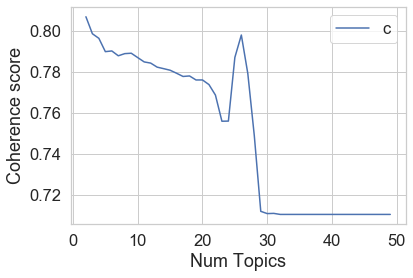

In [373]:
# Show graph
limit=50; start=2; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()# Print the coherence scores

In [374]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

Num Topics = 2  has Coherence Value of 0.807
Num Topics = 3  has Coherence Value of 0.7986
Num Topics = 4  has Coherence Value of 0.7964
Num Topics = 5  has Coherence Value of 0.7899
Num Topics = 6  has Coherence Value of 0.7902
Num Topics = 7  has Coherence Value of 0.7879
Num Topics = 8  has Coherence Value of 0.7889
Num Topics = 9  has Coherence Value of 0.7891
Num Topics = 10  has Coherence Value of 0.787
Num Topics = 11  has Coherence Value of 0.7849
Num Topics = 12  has Coherence Value of 0.7843
Num Topics = 13  has Coherence Value of 0.7823
Num Topics = 14  has Coherence Value of 0.7816
Num Topics = 15  has Coherence Value of 0.7808
Num Topics = 16  has Coherence Value of 0.7793
Num Topics = 17  has Coherence Value of 0.7778
Num Topics = 18  has Coherence Value of 0.778
Num Topics = 19  has Coherence Value of 0.7761
Num Topics = 20  has Coherence Value of 0.7761
Num Topics = 21  has Coherence Value of 0.7738
Num Topics = 22  has Coherence Value of 0.7687
Num Topics = 23  has Coh

In [375]:
# Select the model and print the topics
optimal_model = model_list[0]
model_topics = optimal_model.show_topics(formatted=False)
optimal_model.print_topics(num_words=10)

[(0,
  '0.007*"brasil" + 0.007*"movimento" + 0.007*"terra" + 0.005*"milhoes" + 0.005*"apenas" + 0.005*"pessoas" + 0.004*"possivel" + 0.004*"cedro" + 0.004*"animais" + 0.003*"caso"'),
 (1,
  '0.013*"fazenda" + 0.009*"carne" + 0.005*"maraba" + 0.005*"pais" + 0.004*"cedro" + 0.003*"vacas" + 0.003*"animais" + 0.003*"publico" + 0.003*"menos" + 0.003*"jose"')]

In [376]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(optimal_model, corpus, id2word)
vis

PreparedData(topic_coordinates=              x    y  topics  cluster       Freq
topic                                           
1      0.027273  0.0       1        1  50.102536
0     -0.027273  0.0       2        1  49.897464, topic_info=              Term       Freq      Total Category  logprob  loglift
99         fazenda  46.000000  46.000000  Default  30.0000  30.0000
228      movimento  23.000000  23.000000  Default  29.0000  29.0000
675          terra  22.000000  22.000000  Default  28.0000  28.0000
95          brasil  26.000000  26.000000  Default  27.0000  27.0000
114        milhoes  18.000000  18.000000  Default  26.0000  26.0000
...            ...        ...        ...      ...      ...      ...
173         maraba   8.650372  24.883631   Topic2  -5.9435  -0.3614
2196  restaurantes   6.344669  11.286552   Topic2  -6.2535   0.1192
1503        varios   6.148139  10.609932   Topic2  -6.2850   0.1496
2518      diversas   6.028449  11.288109   Topic2  -6.3046   0.0679
2238        chegar   5.898130  10.278369   Topic2  -6.3265   0.1398

[121 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
742       1  0.148505    acordo
742       2  0.891033    acordo
3509      1  0.487396  acusacao
3509      2  0.487396  acusacao
1161      1  0.652694     alves
...     ...       ...       ...
3623      1  0.518260     vacas
3623      2  0.518260     vacas
1503      1  0.377005    varios
1503      2  0.565508    varios
779       2  0.871641   verdade

[153 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 1])

# -----------------------

### Método LDA - APLICAÇÃO NO DATASET DE 2016

In [377]:
#Criando coluna que será usada no LDA
df_2016['message_norm_treatment_ssw4'] = df_2016['message_norm_treatment_ssw2']

In [378]:
#Criando lista que será passada como dicionário
data_words = []
for i in range(0, len(df_2016['message_norm_treatment_ssw4'])):
    data_words.extend(df_2016['message_norm_treatment_ssw4'][i])

In [379]:
data_words1=[]
for el in data_words:
        sub = el.split(', ')
        data_words1.append(sub)

In [380]:
# Criando Dicionário
id2word = corpora.Dictionary(data_words1)
# Criando Corpus
texts = data_words1
# Documento de frequência de termo
corpus = [id2word.doc2bow(text) for text in texts]
# Visualizando exemplo
print(corpus[:1][0][:30])

[(0, 1)]


In [381]:
# Número de tópicos
num_topics = 10
# Construindo o modelo LDA
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics)
# Printando as palavras chave de cada um dos 10 tópicos
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.023*"dilma" + 0.021*"casa" + 0.019*"pais" + 0.019*"hoje" + 0.012*"filha" '
  '+ 0.011*"virus" + 0.009*"pessoal" + 0.008*"repassem" + 0.008*"noticia" + '
  '0.008*"acordo"'),
 (1,
  '0.026*"anos" + 0.013*"cidade" + 0.012*"estado" + 0.012*"povo" + '
  '0.011*"federal" + 0.009*"nova" + 0.008*"tempo" + 0.008*"redes" + '
  '0.007*"cancer" + 0.007*"saude"'),
 (2,
  '0.021*"presidente" + 0.013*"video" + 0.012*"apenas" + 0.011*"pessoa" + '
  '0.008*"parte" + 0.008*"sociais" + 0.008*"causa" + 0.008*"dentro" + '
  '0.008*"veja" + 0.007*"jovem"'),
 (3,
  '0.013*"caso" + 0.013*"celular" + 0.011*"moro" + 0.010*"milhoes" + '
  '0.009*"ontem" + 0.008*"quer" + 0.008*"grupo" + 0.008*"maior" + '
  '0.008*"programa" + 0.008*"estados"'),
 (4,
  '0.017*"criancas" + 0.012*"informacoes" + 0.010*"agua" + 0.009*"temer" + '
  '0.009*"crianca" + 0.009*"vida" + 0.008*"internet" + 0.008*"receber" + '
  '0.008*"imagem" + 0.007*"sabe"'),
 (5,
  '0.020*"governo" + 0.018*"dias" + 0.010*"senhor" + 0.009*"naci

# TESTE

In [382]:
LDA = gensim.models.ldamodel.LdaModel
lda_model = LDA(corpus = corpus, id2word = id2word, num_topics=10, random_state=100, chunksize=1000, passes=50, iterations=100)

In [383]:
lda_model.print_topics()

[(0,
  '0.065*"brasil" + 0.046*"anos" + 0.044*"casa" + 0.037*"deus" + 0.028*"vida" + 0.028*"caso" + 0.019*"ficar" + 0.016*"maior" + 0.016*"site" + 0.016*"dentro"'),
 (1,
  '0.046*"dias" + 0.041*"lula" + 0.025*"crianca" + 0.016*"mulher" + 0.015*"filhos" + 0.014*"rede" + 0.014*"menos" + 0.012*"trabalho" + 0.012*"varios" + 0.012*"cinco"'),
 (2,
  '0.038*"presidente" + 0.037*"celular" + 0.024*"ficou" + 0.023*"acordo" + 0.023*"nova" + 0.021*"alerta" + 0.019*"tomar" + 0.019*"fica" + 0.019*"redes" + 0.016*"abaixo"'),
 (3,
  '0.048*"governo" + 0.033*"nome" + 0.032*"filha" + 0.028*"pessoa" + 0.018*"saude" + 0.017*"causa" + 0.016*"hora" + 0.016*"programa" + 0.014*"contato" + 0.013*"perigoso"'),
 (4,
  '0.060*"gente" + 0.031*"cidade" + 0.028*"volta" + 0.027*"informacoes" + 0.021*"nada" + 0.020*"imagem" + 0.017*"filho" + 0.014*"alem" + 0.014*"lugar" + 0.012*"possivel"'),
 (5,
  '0.053*"hoje" + 0.046*"pais" + 0.033*"numero" + 0.021*"janeiro" + 0.019*"parte" + 0.018*"receber" + 0.017*"mulheres" + 0.

In [384]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_model, corpus, id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.183961 -0.004431       1        1  10.402148
1     -0.034693  0.110089       2        1  10.131707
4     -0.037761 -0.138547       3        1  10.089964
5     -0.023248  0.009543       4        1  10.056592
3     -0.020475  0.006915       5        1  10.006500
7     -0.014498  0.003555       6        1   9.913032
8     -0.016304  0.004373       7        1   9.909688
2     -0.015520  0.004000       8        1   9.861267
6     -0.009763  0.001963       9        1   9.849628
9     -0.011700  0.002540      10        1   9.779473, topic_info=            Term        Freq       Total Category  logprob  loglift
82       pessoas  243.000000  243.000000  Default  30.0000  30.0000
191       brasil  205.000000  205.000000  Default  29.0000  29.0000
35         gente  181.000000  181.000000  Default  28.0000  28.0000
725         hoje  160.000000  160.000000  Default  27.0000  27.0000
526      governo  145.000000  145.000000  Default  26.0000  26.0000
..           ...         ...         ...      ...      ...      ...
330     federais    7.958730    9.599606  Topic10  -5.9080   2.1374
648    conhecida    7.518867    9.159742  Topic10  -5.9649   2.1275
366  autorizacao    7.026924    8.667799  Topic10  -6.0325   2.1150
335      pratica    5.670687    7.311562  Topic10  -6.2470   2.0707
657    marcantes    4.533989    6.174864  Topic10  -6.4707   2.0160

[330 rows x 6 columns], token_table=      Topic      Freq           Term
term                                
150       9  0.908726           2014
435       8  0.967605         abaixo
502       7  0.677320  abastecimento
702       4  0.853476         aberto
517       3  0.877488         acabei
...     ...       ...            ...
151       3  0.982919          volta
386       7  0.706073        votacao
224       5  0.792916          votos
564       9  0.918570        youtube
682       1  0.964596           zona

[300 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 5, 6, 4, 8, 9, 3, 7, 10])

In [385]:
print('\nPerplexity: ', lda_model.log_perplexity(corpus,total_docs=124))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words1, dictionary=id2word , coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Perplexity:  -63.211967077338

Coherence Score:  0.7777470073352268


In [386]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, num_topics=num_topics, id2word=dictionary)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [387]:
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_words1, start=2, limit=50, step=1)

KeyboardInterrupt: 

In [ ]:
# Show graph
limit=50; start=2; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()# Print the coherence scores

In [ ]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

In [ ]:
# Select the model and print the topics
optimal_model = model_list[0]
model_topics = optimal_model.show_topics(formatted=False)
optimal_model.print_topics(num_words=10)

In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(optimal_model, corpus, id2word)
vis

# -----------------------

### Método LDA - APLICAÇÃO NO DATASET DE 2017

In [ ]:
#Criando coluna que será usada no LDA
df_2017['message_norm_treatment_ssw4'] = df_2017['message_norm_treatment_ssw2']

In [ ]:
#Criando lista que será passada como dicionário
data_words = []
for i in range(0, len(df_2017['message_norm_treatment_ssw4'])):
    data_words.extend(df_2017['message_norm_treatment_ssw4'][i])

In [ ]:
data_words1=[]
for el in data_words:
        sub = el.split(', ')
        data_words1.append(sub)

In [ ]:
# Criando Dicionário
id2word = corpora.Dictionary(data_words1)
# Criando Corpus
texts = data_words1
# Documento de frequência de termo
corpus = [id2word.doc2bow(text) for text in texts]
# Visualizando exemplo
print(corpus[:1][0][:30])

In [ ]:
# Número de tópicos
num_topics = 10
# Construindo o modelo LDA
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics)
# Printando as palavras chave de cada um dos 10 tópicos
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

# TESTE

In [ ]:
LDA = gensim.models.ldamodel.LdaModel
lda_model = LDA(corpus = corpus, id2word = id2word, num_topics=10, random_state=100, chunksize=1000, passes=50, iterations=100)

In [ ]:
lda_model.print_topics()

In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_model, corpus, id2word)
vis

In [ ]:
print('\nPerplexity: ', lda_model.log_perplexity(corpus,total_docs=124))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words1, dictionary=id2word , coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

In [ ]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, num_topics=num_topics, id2word=dictionary)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [ ]:
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_words1, start=2, limit=50, step=1)

In [ ]:
# Show graph
limit=50; start=2; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()# Print the coherence scores

In [ ]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

In [ ]:
# Select the model and print the topics
optimal_model = model_list[0]
model_topics = optimal_model.show_topics(formatted=False)
optimal_model.print_topics(num_words=10)

In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(optimal_model, corpus, id2word)
vis

# -----------------------

### Método LDA - APLICAÇÃO NO DATASET DE 2018

In [ ]:
#Criando coluna que será usada no LDA
df_2018['message_norm_treatment_ssw4'] = df_2018['message_norm_treatment_ssw2']

In [ ]:
#Criando lista que será passada como dicionário
data_words = []
for i in range(0, len(df_2018['message_norm_treatment_ssw4'])):
    data_words.extend(df_2018['message_norm_treatment_ssw4'][i])

In [ ]:
data_words1=[]
for el in data_words:
        sub = el.split(', ')
        data_words1.append(sub)

In [ ]:
# Criando Dicionário
id2word = corpora.Dictionary(data_words1)
# Criando Corpus
texts = data_words1
# Documento de frequência de termo
corpus = [id2word.doc2bow(text) for text in texts]
# Visualizando exemplo
print(corpus[:1][0][:30])

In [ ]:
# Número de tópicos
num_topics = 10
# Construindo o modelo LDA
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics)
# Printando as palavras chave de cada um dos 10 tópicos
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

# TESTE

In [ ]:
LDA = gensim.models.ldamodel.LdaModel
lda_model = LDA(corpus = corpus, id2word = id2word, num_topics=10, random_state=100, chunksize=1000, passes=50, iterations=100)

In [ ]:
lda_model.print_topics()

In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_model, corpus, id2word)
vis

In [ ]:
print('\nPerplexity: ', lda_model.log_perplexity(corpus,total_docs=124))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words1, dictionary=id2word , coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

In [ ]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, num_topics=num_topics, id2word=dictionary)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [ ]:
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_words1, start=2, limit=50, step=1)

In [ ]:
# Show graph
limit=50; start=2; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()# Print the coherence scores

In [ ]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

In [ ]:
# Select the model and print the topics
optimal_model = model_list[0]
model_topics = optimal_model.show_topics(formatted=False)
optimal_model.print_topics(num_words=10)

In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(optimal_model, corpus, id2word)
vis

# -----------------------

### Método LDA - APLICAÇÃO NO DATASET DE 2019

In [ ]:
#Criando coluna que será usada no LDA
df_2019['message_norm_treatment_ssw4'] = df_2019['message_norm_treatment_ssw2']

In [ ]:
#Criando lista que será passada como dicionário
data_words = []
for i in range(0, len(df_2019['message_norm_treatment_ssw4'])):
    data_words.extend(df_2019['message_norm_treatment_ssw4'][i])

In [ ]:
data_words1=[]
for el in data_words:
        sub = el.split(', ')
        data_words1.append(sub)

In [ ]:
# Criando Dicionário
id2word = corpora.Dictionary(data_words1)
# Criando Corpus
texts = data_words1
# Documento de frequência de termo
corpus = [id2word.doc2bow(text) for text in texts]
# Visualizando exemplo
print(corpus[:1][0][:30])

In [ ]:
# Número de tópicos
num_topics = 10
# Construindo o modelo LDA
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics)
# Printando as palavras chave de cada um dos 10 tópicos
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

# TESTE

In [ ]:
LDA = gensim.models.ldamodel.LdaModel
lda_model = LDA(corpus = corpus, id2word = id2word, num_topics=10, random_state=100, chunksize=1000, passes=50, iterations=100)

In [ ]:
lda_model.print_topics()

In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_model, corpus, id2word)
vis

In [ ]:
print('\nPerplexity: ', lda_model.log_perplexity(corpus,total_docs=124))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words1, dictionary=id2word , coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

In [ ]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, num_topics=num_topics, id2word=dictionary)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [ ]:
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_words1, start=2, limit=50, step=1)

In [ ]:
# Show graph
limit=50; start=2; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()# Print the coherence scores

In [ ]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

In [ ]:
# Select the model and print the topics
optimal_model = model_list[0]
model_topics = optimal_model.show_topics(formatted=False)
optimal_model.print_topics(num_words=10)

In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(optimal_model, corpus, id2word)
vis

# -----------------------

### Método LDA - APLICAÇÃO NO DATASET DE 2020

In [ ]:
#Criando coluna que será usada no LDA
df_2020['message_norm_treatment_ssw4'] = df_2020['message_norm_treatment_ssw2']

In [ ]:
#Criando lista que será passada como dicionário
data_words = []
for i in range(0, len(df_2020['message_norm_treatment_ssw4'])):
    data_words.extend(df_2020['message_norm_treatment_ssw4'][i])

In [ ]:
data_words1=[]
for el in data_words:
        sub = el.split(', ')
        data_words1.append(sub)

In [ ]:
# Criando Dicionário
id2word = corpora.Dictionary(data_words1)
# Criando Corpus
texts = data_words1
# Documento de frequência de termo
corpus = [id2word.doc2bow(text) for text in texts]
# Visualizando exemplo
print(corpus[:1][0][:30])

In [ ]:
# Número de tópicos
num_topics = 10
# Construindo o modelo LDA
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics)
# Printando as palavras chave de cada um dos 10 tópicos
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

# TESTE

In [ ]:
LDA = gensim.models.ldamodel.LdaModel
lda_model = LDA(corpus = corpus, id2word = id2word, num_topics=10, random_state=100, chunksize=1000, passes=50, iterations=100)

In [ ]:
lda_model.print_topics()

In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_model, corpus, id2word)
vis

In [ ]:
print('\nPerplexity: ', lda_model.log_perplexity(corpus,total_docs=124))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words1, dictionary=id2word , coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

In [ ]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, num_topics=num_topics, id2word=dictionary)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [ ]:
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_words1, start=2, limit=50, step=1)

In [ ]:
# Show graph
limit=50; start=2; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()# Print the coherence scores

In [ ]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

In [ ]:
# Select the model and print the topics
optimal_model = model_list[0]
model_topics = optimal_model.show_topics(formatted=False)
optimal_model.print_topics(num_words=10)

In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(optimal_model, corpus, id2word)
vis

# -----------------------

### Método LDA - APLICAÇÃO NO DATASET DE 2021

In [ ]:
#Criando coluna que será usada no LDA
df_2021['message_norm_treatment_ssw4'] = df_2021['message_norm_treatment_ssw2']

In [ ]:
#Criando lista que será passada como dicionário
data_words = []
for i in range(0, len(df_2021['message_norm_treatment_ssw4'])):
    data_words.extend(df_2021['message_norm_treatment_ssw4'][i])

In [ ]:
data_words1=[]
for el in data_words:
        sub = el.split(', ')
        data_words1.append(sub)

In [ ]:
# Criando Dicionário
id2word = corpora.Dictionary(data_words1)
# Criando Corpus
texts = data_words1
# Documento de frequência de termo
corpus = [id2word.doc2bow(text) for text in texts]
# Visualizando exemplo
print(corpus[:1][0][:30])

In [ ]:
# Número de tópicos
num_topics = 10
# Construindo o modelo LDA
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics)
# Printando as palavras chave de cada um dos 10 tópicos
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

# TESTE

In [ ]:
LDA = gensim.models.ldamodel.LdaModel
lda_model = LDA(corpus = corpus, id2word = id2word, num_topics=10, random_state=100, chunksize=1000, passes=50, iterations=100)

In [ ]:
lda_model.print_topics()

In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_model, corpus, id2word)
vis

In [ ]:
print('\nPerplexity: ', lda_model.log_perplexity(corpus,total_docs=124))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words1, dictionary=id2word , coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

In [ ]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, num_topics=num_topics, id2word=dictionary)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [ ]:
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_words1, start=2, limit=50, step=1)

In [ ]:
# Show graph
limit=50; start=2; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()# Print the coherence scores

In [ ]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

In [ ]:
# Select the model and print the topics
optimal_model = model_list[0]
model_topics = optimal_model.show_topics(formatted=False)
optimal_model.print_topics(num_words=10)

In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(optimal_model, corpus, id2word)
vis

# -----------------------

### Método LDA - APLICAÇÃO NO DATASET GERAL

In [ ]:
#Criando coluna que será usada no LDA
df['message_norm_treatment_ssw4'] = df['message_norm_treatment_ssw2']

In [ ]:
#Criando lista que será passada como dicionário
data_words = []
for i in range(0, len(df['message_norm_treatment_ssw4'])):
    data_words.extend(df['message_norm_treatment_ssw4'][i])

In [ ]:
data_words1=[]
for el in data_words:
        sub = el.split(', ')
        data_words1.append(sub)

In [ ]:
# Criando Dicionário
id2word = corpora.Dictionary(data_words1)
# Criando Corpus
texts = data_words1
# Documento de frequência de termo
corpus = [id2word.doc2bow(text) for text in texts]
# Visualizando exemplo
print(corpus[:1][0][:30])

In [ ]:
# Número de tópicos
num_topics = 10
# Construindo o modelo LDA
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics)
# Printando as palavras chave de cada um dos 10 tópicos
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

In [ ]:
pip install pyLDAvis

In [ ]:
'''import pyLDAvis.gensim
import pickle 
import pyLDAvis
# Visualizando os tópicos
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+str(num_topics))
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
# Carregando os dados de pre-prepared pyLDAvis no disco rígido
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared'''

# TESTE

In [ ]:
LDA = gensim.models.ldamodel.LdaModel
lda_model = LDA(corpus = corpus, id2word = id2word, num_topics=10, random_state=100, chunksize=1000, passes=50, iterations=100)

In [ ]:
lda_model.print_topics()

In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_model, corpus, id2word)
vis

In [ ]:
print('\nPerplexity: ', lda_model.log_perplexity(corpus,total_docs=124))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words1, dictionary=id2word , coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

In [ ]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, num_topics=num_topics, id2word=dictionary)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [ ]:
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_words1, start=2, limit=50, step=1)

In [ ]:
# Show graph
limit=50; start=2; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()# Print the coherence scores

In [ ]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

In [ ]:
# Select the model and print the topics
optimal_model = model_list[0]
model_topics = optimal_model.show_topics(formatted=False)
optimal_model.print_topics(num_words=10)

In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(optimal_model, corpus, id2word)
vis

# -----------------------

### Método LDA - APLICAÇÃO CATEGORIA POLÍTICA

In [ ]:
#Criando coluna que será usada no LDA
df_politica = df.query("category == 'Política'")
df_politica['message_norm_treatment_ssw4'] = df_politica['message_norm_treatment_ssw2']

In [ ]:
#Criando lista que será passada como dicionário
data_words = []
df_politica = df_politica.reset_index(drop=True)
for i in range(0, len(df_politica['message_norm_treatment_ssw4'])):
    data_words.extend(df_politica['message_norm_treatment_ssw4'][i])

In [ ]:
data_words1=[]
for el in data_words:
        sub = el.split(', ')
        data_words1.append(sub)

In [ ]:
# Criando Dicionário
id2word = corpora.Dictionary(data_words1)
# Criando Corpus
texts = data_words1
# Documento de frequência de termo
corpus = [id2word.doc2bow(text) for text in texts]
# Visualizando exemplo
print(corpus[:1][0][:30])

In [ ]:
# Número de tópicos
num_topics = 10
# Construindo o modelo LDA
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics)
# Printando as palavras chave de cada um dos 10 tópicos
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

In [ ]:
pip install pyLDAvis

In [ ]:
'''import pyLDAvis.gensim
import pickle 
import pyLDAvis
# Visualizando os tópicos
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+str(num_topics))
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
# Carregando os dados de pre-prepared pyLDAvis no disco rígido
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared'''

# TESTE

In [ ]:
LDA = gensim.models.ldamodel.LdaModel
lda_model = LDA(corpus = corpus, id2word = id2word, num_topics=10, random_state=100, chunksize=1000, passes=50, iterations=100)

In [ ]:
lda_model.print_topics()

In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_model, corpus, id2word)
vis

In [ ]:
print('\nPerplexity: ', lda_model.log_perplexity(corpus,total_docs=124))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words1, dictionary=id2word , coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

In [ ]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, num_topics=num_topics, id2word=dictionary)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [ ]:
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_words1, start=2, limit=50, step=1)

In [ ]:
# Show graph
limit=50; start=2; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()# Print the coherence scores

In [ ]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

In [ ]:
# Select the model and print the topics
optimal_model = model_list[0]
model_topics = optimal_model.show_topics(formatted=False)
optimal_model.print_topics(num_words=10)

In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(optimal_model, corpus, id2word)
vis

# -----------------------

### Term Frequency-Inverse Document Frequency (TDIDF)

In [ ]:
# TFIDF geral
df['tfidf_message_norm_treatment'] = hero.do_tfidf(df['message_norm_treatment'].fillna(' '))

In [ ]:
# TFIDF antes de 2016
df_antes_2016['tfidf_message_norm_treatment'] = hero.do_tfidf(df_antes_2016['message_norm_treatment'].fillna(' '))

In [ ]:
# TFIDF 2016
df_2016['tfidf_message_norm_treatment'] = hero.do_tfidf(df_2016['message_norm_treatment'].fillna(' '))

In [ ]:
# TFIDF 2017
df_2017['tfidf_message_norm_treatment'] = hero.do_tfidf(df_2017['message_norm_treatment'].fillna(' '))

In [ ]:
# TFIDF 2018
df_2018['tfidf_message_norm_treatment'] = hero.do_tfidf(df_2018['message_norm_treatment'].fillna(' '))

In [ ]:
# TFIDF 2019
df_2019['tfidf_message_norm_treatment'] = hero.do_tfidf(df_2019['message_norm_treatment'].fillna(' '))

In [ ]:
# TFIDF 2020
df_2020['tfidf_message_norm_treatment'] = hero.do_tfidf(df_2020['message_norm_treatment'].fillna(' '))

In [ ]:
# TFIDF 2021
df_2021['tfidf_message_norm_treatment'] = hero.do_tfidf(df_2021['message_norm_treatment'].fillna(' '))

### PCA (Principal Component Analysis)

In [ ]:
# abordagem PCA
df['pca_tfidf_message_norm_treatment'] = hero.do_pca(df['tfidf_message_norm_treatment'])
hero.scatterplot(df, col='pca_tfidf_message_norm_treatment', color='category', title="PCA Fakepedia")

In [ ]:
df_antes_2016['pca_tfidf_message_norm_treatment'] = hero.do_pca(df_antes_2016['tfidf_message_norm_treatment'])
hero.scatterplot(df_antes_2016, col='pca_tfidf_message_norm_treatment', color='category', title="PCA Fakepedia 2013, 2014, 2015")

In [ ]:
df_2016['pca_tfidf_message_norm_treatment'] = hero.do_pca(df_2016['tfidf_message_norm_treatment'])
hero.scatterplot(df_2016, col='pca_tfidf_message_norm_treatment', color='category', title="PCA Fakepedia 2016")

In [ ]:
df_2017['pca_tfidf_message_norm_treatment'] = hero.do_pca(df_2017['tfidf_message_norm_treatment'])
hero.scatterplot(df_2017, col='pca_tfidf_message_norm_treatment', color='category', title="PCA Fakepedia 2017")

In [ ]:
df_2018['pca_tfidf_message_norm_treatment'] = hero.do_pca(df_2018['tfidf_message_norm_treatment'])
hero.scatterplot(df_2018, col='pca_tfidf_message_norm_treatment', color='category', title="PCA Fakepedia 2018")

In [ ]:
df_2019['pca_tfidf_message_norm_treatment'] = hero.do_pca(df_2019['tfidf_message_norm_treatment'])
hero.scatterplot(df_2019, col='pca_tfidf_message_norm_treatment', color='category', title="PCA Fakepedia 2019")

In [ ]:
df_2020['pca_tfidf_message_norm_treatment'] = hero.do_pca(df_2020['tfidf_message_norm_treatment'])
hero.scatterplot(df_2020, col='pca_tfidf_message_norm_treatment', color='category', title="PCA Fakepedia 2020")

In [ ]:
df_2021['pca_tfidf_message_norm_treatment'] = hero.do_pca(df_2021['tfidf_message_norm_treatment'])
hero.scatterplot(df_2021, col='pca_tfidf_message_norm_treatment', color='category', title="PCA Fakepedia 2021")

In [ ]:
dir(hero)

In [ ]:
help(hero.preprocessing)

In [ ]:
for i in range(0,len(df)):
    if type(df['message_norm_treatment_ssw2'][i])!=float:
        if '!' in df['message_norm_treatment_ssw2'][i] or '?' in df['message_norm_treatment_ssw2'][i]:
            print(df['message_norm_treatment_ssw2'][i])